In [1]:
from bs4 import BeautifulSoup as BS
import urllib.request
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
% matplotlib inline
import seaborn as sns

In [2]:
request = urllib.request.Request("https://www.nih.gov/about-nih/what-we-do/nih-almanac/appropriations-section-1")
result = urllib.request.urlopen(request)
resulttext = result.read()
soup = BS(resulttext, 'html.parser')

In [3]:
table = soup.find_all('table', class_="table-data-tight")

In [4]:
table_2 = table[0]

In [5]:
table_headers = table_2.find_all("th")

In [6]:
labels = [th.text for th in table_headers]
columns = labels[1:15]
index = labels[15:]
index_label = labels[0]

In [7]:
rows = []
for tr in table_2.find_all("tr")[1:]:
    row_data = [td.text for td in tr.find_all("td")]
    rows.append(row_data)

In [8]:
nih_aprop_1 = pd.DataFrame(rows, columns = columns, index = index)
nih_aprop_1 = nih_aprop_1.replace("\xa0", np.nan)
nih_aprop_1.index.name = index_label

In [9]:
nih_aprop_1.head()

,NCI11,NHLBI,NIDCR,NIDDK1,NINDS2,NIAID12,NIGMS,NICHD3,NEI,NIEHS4,NIA,NIAMS,NIDCD,NIMH5
FY,,,,,,,,,,,,,,
1938,400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1939,400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1940,570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1941,570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1942,565,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
request = urllib.request.Request("https://www.nih.gov/about-nih/what-we-do/nih-almanac/appropriations-section-2")
result = urllib.request.urlopen(request)
resulttext = result.read()
soup = BS(resulttext, 'html.parser')
table = soup.find_all('table', class_="table-data-tight")
table_2 = table[0]
table_headers = table_2.find_all("th")
labels = [th.text for th in table_headers]
columns = labels[1:16]
index = labels[16:]
index_label = labels[0]
rows = []
for tr in table_2.find_all("tr")[1:]:
    row_data = [td.text for td in tr.find_all("td")]
    rows.append(row_data)

In [11]:
nih_aprop_2 = pd.DataFrame(rows, columns = columns, index = index)
nih_aprop_2 = nih_aprop_2.replace("\xa0", np.nan)
nih_aprop_2.index.name = index_label

In [12]:
nih_aprop_2.head()

,NIDA,NIAAA,NINR,NHGRI,NIBIB,NIMHD,"NCRR6,7",NCCAM14,NCATS,FIC,NLM,OD8,B&F9,OAR10,Total
FY,,,,,,,,,,,,,,,
1938,NaN,NaN,NaN,NaN,NaN,NaN,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,464
1939,NaN,NaN,NaN,NaN,NaN,NaN,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,464
1940,NaN,NaN,NaN,NaN,NaN,NaN,137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,707
1941,NaN,NaN,NaN,NaN,NaN,NaN,141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,711
1942,NaN,NaN,NaN,NaN,NaN,NaN,135,NaN,NaN,NaN,NaN,NaN,NaN,NaN,700


In [13]:
nih_budget = nih_aprop_1.join(nih_aprop_2, how = "inner")

In [14]:
nih_budget.head()

,NCI11,NHLBI,NIDCR,NIDDK1,NINDS2,NIAID12,NIGMS,NICHD3,NEI,NIEHS4,...,NIMHD,"NCRR6,7",NCCAM14,NCATS,FIC,NLM,OD8,B&F9,OAR10,Total
FY,,,,,,,,,,,,,,,,,,,,,
1938,400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,464
1939,400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,464
1940,570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,707
1941,570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,711
1942,565,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,135,NaN,NaN,NaN,NaN,NaN,NaN,NaN,700


In [15]:
nih_budget.info()

<class 'pandas.core.frame.DataFrame'>
Index: 79 entries, 1938 to 2016 16
Data columns (total 29 columns):
NCI11      79 non-null object
NHLBI      67 non-null object
NIDCR      67 non-null object
NIDDK1     63 non-null object
NINDS2     63 non-null object
NIAID12    63 non-null object
NIGMS      51 non-null object
NICHD3     55 non-null object
NEI        47 non-null object
NIEHS4     50 non-null object
NIA        41 non-null object
NIAMS      29 non-null object
NIDCD      27 non-null object
NIMH5      40 non-null object
NIDA       23 non-null object
NIAAA      23 non-null object
NINR       29 non-null object
NHGRI      26 non-null object
NIBIB      14 non-null object
NIMHD      15 non-null object
NCRR6,7    75 non-null object
NCCAM14    16 non-null object
NCATS      4 non-null object
FIC        49 non-null object
NLM        48 non-null object
OD8        47 non-null object
B&F9       46 non-null object
OAR10      1 non-null object
Total      79 non-null object
dtypes: object(29)
memory 

In [16]:
for s in nih_budget:
    nih_budget[s] = nih_budget[s].str.replace(",", '')
    nih_budget[s] = pd.to_numeric(nih_budget[s], errors = "coerce")

In [17]:
nih_budget.info()

<class 'pandas.core.frame.DataFrame'>
Index: 79 entries, 1938 to 2016 16
Data columns (total 29 columns):
NCI11      79 non-null int64
NHLBI      67 non-null float64
NIDCR      67 non-null float64
NIDDK1     63 non-null float64
NINDS2     63 non-null float64
NIAID12    63 non-null float64
NIGMS      51 non-null float64
NICHD3     54 non-null float64
NEI        47 non-null float64
NIEHS4     50 non-null float64
NIA        41 non-null float64
NIAMS      29 non-null float64
NIDCD      27 non-null float64
NIMH5      40 non-null float64
NIDA       23 non-null float64
NIAAA      23 non-null float64
NINR       29 non-null float64
NHGRI      26 non-null float64
NIBIB      14 non-null float64
NIMHD      15 non-null float64
NCRR6,7    75 non-null float64
NCCAM14    16 non-null float64
NCATS      4 non-null float64
FIC        49 non-null float64
NLM        48 non-null float64
OD8        47 non-null float64
B&F9       46 non-null float64
OAR10      1 non-null float64
Total      79 non-null int64
d

In [4]:
nih_budget = pd.read_csv("data/nih_budget.csv")

In [9]:
nih_budget.head()

,FY,NCI,NHLBI,NIDCR,NIDDK,NINDS,NIAID,NIGMS,NICHD,NEI,...,NIMHD,NCRR,NCCAM,NCATS,FIC,NLM,OD,B&F,OAR,Total
0,1938,400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,64.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,464
1,1939,400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,64.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,464
2,1940,570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,137.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,707
3,1941,570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,141.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,711
4,1942,565,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,135.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,700


In [3]:
# excel file downloaded from here: https://officeofbudget.od.nih.gov/gbipriceindexes.html

brdpi = pd.read_excel("data/BRDPI Table FY 1950 to 2023_Jan 2018_Rev.xlsx", skiprows = [0, 1, 2], skip_footer = 10)

/Users/maheshrao/anaconda3/envs/capstone/lib/python3.6/site-packages/pandas/util/_decorators.py:178: FutureWarning: the 'skip_footer' keyword is deprecated, use 'skipfooter' instead
  return func(*args, **kwargs)


In [4]:
brdpi.head()

,Year,Annual Change,1950,1951,1952,1953,1954,1955,1956,1957,...,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,1950,NaN,100.000000,93.946261,91.200503,89.512647,88.502592,87.251954,84.903452,81.884876,...,7.555478,7.340579,7.123940,6.925793,6.838196,6.712471,6.571255,6.440260,6.303228,6.143408
1,1951,0.064438,106.443832,100.000000,97.077310,95.280691,94.205550,92.874324,90.374488,87.161400,...,8.042341,7.813594,7.582995,7.582995,7.278838,7.145012,6.994696,6.855260,6.709398,6.539279
2,1952,0.030107,109.648518,103.010683,100.000000,98.149291,97.041781,95.670475,93.095377,89.785553,...,8.284470,8.048836,7.811295,7.811295,7.497981,7.360126,7.205284,7.061650,6.911396,6.736156
3,1953,0.018856,111.716058,104.953059,101.885607,100.000000,98.871607,97.474444,94.850790,91.478555,...,8.440682,8.200606,7.958585,7.958585,7.639363,7.498909,7.341147,7.194805,7.041718,6.863173
4,1954,0.011413,112.991041,106.150858,103.048397,101.141271,100.000000,98.586891,95.933294,92.522573,...,8.537014,8.294197,8.049414,8.049414,7.726549,7.584491,7.424930,7.276917,7.122083,6.941501


In [11]:
nih_budget_actual_percentages = [100]
counter = 1
annual_budgets = nih_budget.loc[nih_budget.FY >= 1950].Total.tolist()
l = len(annual_budgets)-1
while counter <= l:
    pct_inc = annual_budgets[counter]/annual_budgets[counter-1]
    overall_pct_inc = pct_inc + nih_budget_actual_percentages[-1]
    nih_budget_actual_percentages.append(overall_pct_inc)
    counter += 1

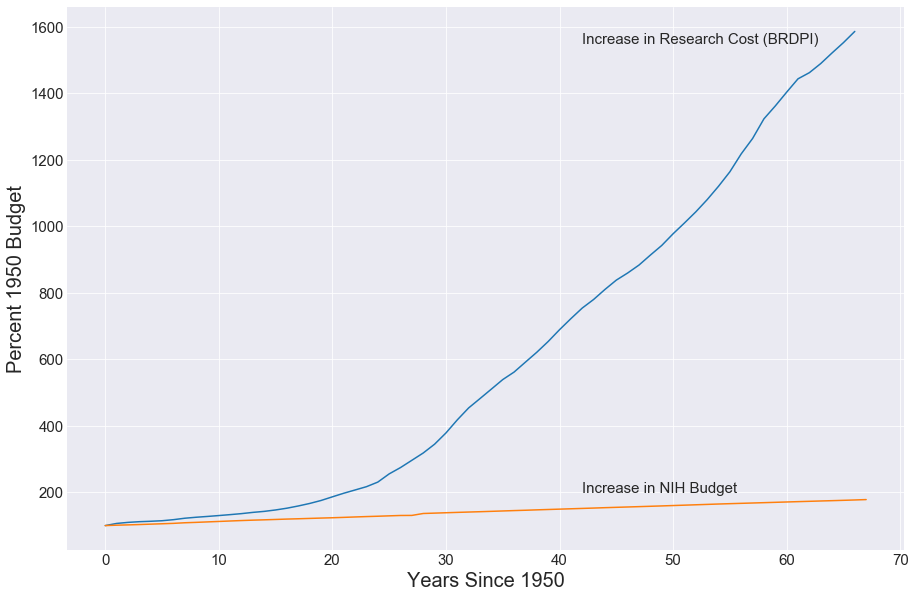

In [15]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set_style("darkgrid")
plt.plot(brdpi[1950][:-7])
plt.plot(nih_budget_actual_percentages)
plt.xlabel("Years Since 1950", size = 20)
plt.ylabel("Percent 1950 Budget", size = 20)
plt.text(s = "Increase in Research Cost (BRDPI)", x = 42, y = 1550, size = 15)
plt.text(s = "Increase in NIH Budget", x = 42, y = 200, size = 15)
ax.tick_params(axis='both', labelsize = 15)
plt.show();

In [22]:
# NIH csvs can be downloaded from https://exporter.nih.gov/ExPORTER_Catalog.aspx
# put all csvs in folder called 'nih_csvs' in the same directory as the notebook and run the following cells
# to import, combine files, and full data set

#nih_full = pd.DataFrame()
#for root, dirs, files in os.walk("nih_csvs", topdown=True):
#    for file in files:
#        df = pd.read_csv(os.path.join(root, file), encoding = "ISO-8859-1", low_memory = False)
#        nih_full = nih_full.append(df)

In [23]:
#nih_full.FY.unique()

In [24]:
#nih_full.to_csv("nih_full.csv")

In [2]:
# This is a big dataset, takes a while to load

nih_full = pd.read_csv("data/nih_full.csv")

/Users/maheshrao/anaconda3/envs/capstone/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (5,6,9,15,16,17,21,24,26,31,32,35,40,44,45,48) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [22]:
nih_full.head()

,Unnamed: 0,ACTIVITY,ADMINISTERING_IC,APPLICATION_ID,APPLICATION_TYPE,ARRA_FUNDED,AWARD_NOTICE_DATE,BUDGET_END,BUDGET_START,CFDA_CODE,...,PROJECT_TITLE,SERIAL_NUMBER,STUDY_SECTION,STUDY_SECTION_NAME,SUBPROJECT_ID,SUFFIX,SUPPORT_YEAR,TOTAL_COST,TOTAL_COST_SUB_PROJECT,Unnamed: 0.1
0,0,R21,DC,9304566.0,1.0,N,1/8/2018,12/31/2018,1/8/2018,173,...,The Influence of Visual Perceptual Salience on...,16102.0,CDRC,Communication Disorders Review Committee,NaN,NaN,1,155000.0,NaN,NaN
1,1,R01,HL,9391027.0,5.0,N,1/9/2018,12/31/2018,1/1/2018,838,...,Allergic Pulmonary Inflammation Through the De...,120952.0,HAI,"Hypersensitivity, Autoimmune, and Immune-media...",NaN,NaN,5,399178.0,NaN,NaN
2,2,F31,AR,9396722.0,1.0,N,9/1/2017,8/31/2018,9/1/2017,846,...,Epigenetic Regulation of Keratinocyte-Mediated...,72461.0,ZRG1,Special Emphasis Panel,NaN,NaN,1,44044.0,NaN,NaN
3,3,R01,CA,9398105.0,5.0,N,1/12/2018,12/31/2018,1/1/2018,396,...,Genetic Dissection of Acute Myeloid Leukemia.,169784.0,CG,Cancer Genetics Study Section,NaN,NaN,5,320393.0,NaN,NaN
4,4,R25,TW,9398158.0,5.0,N,1/13/2018,12/31/2018,1/1/2018,989,...,International Health Research Ethics Training ...,9730.0,ZRG1,Special Emphasis Panel,NaN,NaN,5,240268.0,NaN,NaN


In [23]:
nih_grants_per_year = nih_full.groupby("FY").count()

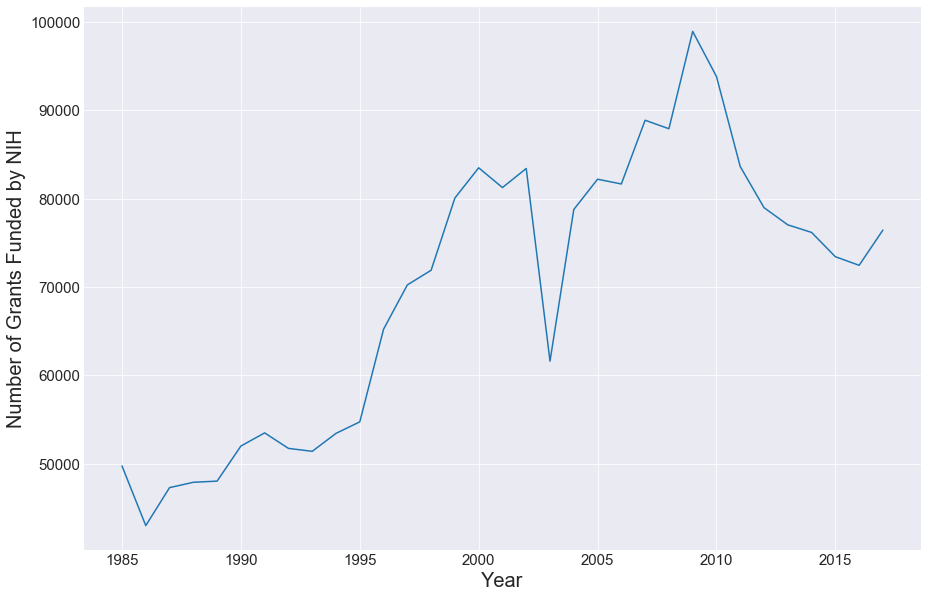

In [24]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set_style("darkgrid")
plt.plot(nih_grants_per_year.loc[nih_grants_per_year.index != 2018.0]["APPLICATION_ID"])
plt.xlabel("Year", size = 20)
plt.ylabel("Number of Grants Funded by NIH", size = 20)
ax.tick_params(axis='both', labelsize = 15)
plt.show();

In [5]:
# Looks like some nan values, they are nan all the way across so deleting

nih_full[nih_full.APPLICATION_ID.isnull()]

,Unnamed: 0,ACTIVITY,ADMINISTERING_IC,APPLICATION_ID,APPLICATION_TYPE,ARRA_FUNDED,AWARD_NOTICE_DATE,BUDGET_END,BUDGET_START,CFDA_CODE,...,PROJECT_TITLE,SERIAL_NUMBER,STUDY_SECTION,STUDY_SECTION_NAME,SUBPROJECT_ID,SUFFIX,SUPPORT_YEAR,TOTAL_COST,TOTAL_COST_SUB_PROJECT,Unnamed: 0.1
699726,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Tè!
699727,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Tè!


In [3]:
# dont forget to specify inplace = True!

nih_full.drop(nih_full[nih_full.APPLICATION_ID.isnull()].index, inplace = True)

In [7]:
# no more nans, try converting APPLICATION_ID to int again

nih_full[nih_full.APPLICATION_ID.isnull()]

,Unnamed: 0,ACTIVITY,ADMINISTERING_IC,APPLICATION_ID,APPLICATION_TYPE,ARRA_FUNDED,AWARD_NOTICE_DATE,BUDGET_END,BUDGET_START,CFDA_CODE,...,PROJECT_TITLE,SERIAL_NUMBER,STUDY_SECTION,STUDY_SECTION_NAME,SUBPROJECT_ID,SUFFIX,SUPPORT_YEAR,TOTAL_COST,TOTAL_COST_SUB_PROJECT,Unnamed: 0.1


In [5]:
# nailed it

nih_full.APPLICATION_ID = nih_full.APPLICATION_ID.astype(int)

# now try merging

# Looks like the csv I had for abstracts doesn't line up with the info I have for the projects, downloading new ones from exporter website

In [4]:
# NIH csvs can be downloaded from https://exporter.nih.gov/ExPORTER_Catalog.aspx
# put all csvs in folder called 'abstract_csvs' in the same directory as the notebook and run the following cells
# to import, combine files, and full data set

nih_abstracts = pd.DataFrame()
for root, dirs, files in os.walk("abstract_csvs", topdown=True):
    for file in files:
        df = pd.read_csv(os.path.join(root, file), encoding = "ISO-8859-1", low_memory = False)
        nih_abstracts = nih_abstracts.append(df)

/Users/maheshrao/anaconda3/envs/capstone/lib/python3.6/site-packages/pandas/core/frame.py:6211: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


In [10]:
nih_abstracts.head()

,ABSTRACT_TEXT,APPLICATION_ID,Unnamed: 0
0,The purpose of this application is to improve ...,2283288.0,NaN
1,This is the first renewal of a Program Project...,3091691.0,NaN
2,The projects will investigate five different a...,3091714.0,NaN
3,This program project on immunoregulation in hu...,3091729.0,NaN
4,The Center for Interdisciplinary Research in I...,3105082.0,NaN


In [11]:
nih_abstracts.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1355983 entries, 0 to 66535
Data columns (total 3 columns):
ABSTRACT_TEXT     1267320 non-null object
APPLICATION_ID    1355983 non-null float64
Unnamed: 0        0 non-null object
dtypes: float64(1), object(2)
memory usage: 41.4+ MB


In [6]:
nih_abstracts.APPLICATION_ID = nih_abstracts.APPLICATION_ID.astype(int)

In [7]:
nih_full_abstracts = nih_full.merge(nih_abstracts, how = "left", on = "APPLICATION_ID")

# Merge has rows with empty values in the abstract text column. Check if there are any trends in where they are missing

In [14]:
nih_full_abstracts[nih_full_abstracts.ABSTRACT_TEXT.isnull()].SERIAL_NUMBER

38         72014.0
356           2070
364           2063
366            926
374          24252
385           8460
409           2424
418            421
421            827
440            918
458          20600
464           2468
480           3835
481          10026
487           5360
488            195
495           5059
501          20400
533              1
537          25927
541          25060
543           4098
544           4030
557          61440
576          61685
579            859
589            867
597         103368
600            977
626           1930
            ...   
2328089       2557
2328090       6901
2328108      26556
2328132       2558
2328152       2880
2328162       7550
2328163        447
2328182      15083
2328190      69522
2328195       7548
2328196       7544
2328201      10162
2328203      15083
2328227       7544
2328231       2492
2328238        512
2328240      19360
2328260      69522
2328270       7548
2328283       2753
2328285      11230
2328299     

In [15]:
nih_full_abstracts[nih_full_abstracts.ABSTRACT_TEXT.isnull()].STUDY_SECTION_NAME.value_counts()

Special Emphasis Panel                                                          229912
National Center for Research Resources Initial Review Group                      34719
Special Emphasis Panel                                                           26431
Subcommittee E - Prevention &Control                                             10430
Hematology Subcommittee 2                                                         5965
General Medicine A Subcommittee 2                                                 5802
Diabetes and Digestive and Kidney Diseases Special Grants Review Committee        5679
Bacteriology and Mycology Subcommittee  1                                         5401
Microbial Physiology and Genetics Subcommittee 2                                  5157
Epidemiology and Disease Control Subcommittee 3                                   5062
Visual Sciences A Study Section                                                   5047
Neuropharmacology Research Subcommittee    

In [16]:
nih_full_abstracts[nih_full_abstracts.ABSTRACT_TEXT.isnull()].ARRA_FUNDED.value_counts()

N    125946
Y       557
Name: ARRA_FUNDED, dtype: int64

In [17]:
nih_full.shape[0]

2321267

In [18]:
nih_full_abstracts[nih_full_abstracts.ABSTRACT_TEXT.isnull()].shape[0]

1066588

In [20]:
# what is the difference in number of rows
2321267-1066588

1254679

In [21]:
nih_full_abstracts[nih_full_abstracts.ABSTRACT_TEXT.isnull()].ACTIVITY.value_counts()

R01    302171
M01     93474
P01     69700
P41     43317
F32     34899
T32     34680
P30     34276
N01     33174
P50     30080
Z01     25140
S07     17781
R29     17410
U01     17056
H79     12811
R21     12172
R37     11931
P51     11788
K08     11570
F31     11536
R03     11486
P20     11076
U10      8574
R43      8514
S06      7397
U54      6566
R44      6486
U58      5774
P60      5711
U2G      5387
R13      4658
        ...  
UD8         7
H57         6
N03         6
ZIK         6
RL5         6
A24         6
UD7         5
H50         5
F36         5
K09         4
U1Q         4
UD5         4
HS6         4
U2C         3
D71         3
K10         3
U26         3
ZII         3
U96         2
KL1         2
K00         1
RM1         1
UM2         1
RC4         1
UA5         1
RL2         1
IK1         1
UC4         1
TU2         1
P09         1
Name: ACTIVITY, Length: 331, dtype: int64

In [22]:
nih_full.columns

Index(['Unnamed: 0', 'ACTIVITY', 'ADMINISTERING_IC', 'APPLICATION_ID',
       'APPLICATION_TYPE', 'ARRA_FUNDED', 'AWARD_NOTICE_DATE', 'BUDGET_END',
       'BUDGET_START', 'CFDA_CODE', 'CORE_PROJECT_NUM', 'DIRECT_COST_AMT',
       'ED_INST_TYPE', 'FOA_NUMBER', 'FULL_PROJECT_NUM', 'FUNDING_ICs',
       'FUNDING_Ics', 'FUNDING_MECHANISM', 'FY', 'IC_NAME',
       'INDIRECT_COST_AMT', 'NIH_SPENDING_CATS', 'ORG_CITY', 'ORG_COUNTRY',
       'ORG_DEPT', 'ORG_DISTRICT', 'ORG_DUNS', 'ORG_FIPS', 'ORG_IPF_CODE',
       'ORG_NAME', 'ORG_STATE', 'ORG_ZIPCODE', 'PHR', 'PI_IDS', 'PI_NAMEs',
       'PROGRAM_OFFICER_NAME', 'PROJECT_END', 'PROJECT_START', 'PROJECT_TERMS',
       'PROJECT_TITLE', 'SERIAL_NUMBER', 'STUDY_SECTION', 'STUDY_SECTION_NAME',
       'SUBPROJECT_ID', 'SUFFIX', 'SUPPORT_YEAR', 'TOTAL_COST',
       'TOTAL_COST_SUB_PROJECT', 'Unnamed: 0.1'],
      dtype='object')

In [23]:
nih_full[nih_full["FULL_PROJECT_NUM"] == "1R44AR072014-01"]

,Unnamed: 0,ACTIVITY,ADMINISTERING_IC,APPLICATION_ID,APPLICATION_TYPE,ARRA_FUNDED,AWARD_NOTICE_DATE,BUDGET_END,BUDGET_START,CFDA_CODE,...,PROJECT_TITLE,SERIAL_NUMBER,STUDY_SECTION,STUDY_SECTION_NAME,SUBPROJECT_ID,SUFFIX,SUPPORT_YEAR,TOTAL_COST,TOTAL_COST_SUB_PROJECT,Unnamed: 0.1
433129,51955,R44,AR,9346920,1.0,N,5/23/2017,11/30/2017,6/1/2017,846,...,Wound healing progress tracking through mobile...,72014,ZRG1,Special Emphasis Panel,NaN,NaN,1,224955.0,NaN,NaN


In [24]:
nih_full[nih_full["SERIAL_NUMBER"] == 72014]

,Unnamed: 0,ACTIVITY,ADMINISTERING_IC,APPLICATION_ID,APPLICATION_TYPE,ARRA_FUNDED,AWARD_NOTICE_DATE,BUDGET_END,BUDGET_START,CFDA_CODE,...,PROJECT_TITLE,SERIAL_NUMBER,STUDY_SECTION,STUDY_SECTION_NAME,SUBPROJECT_ID,SUFFIX,SUPPORT_YEAR,TOTAL_COST,TOTAL_COST_SUB_PROJECT,Unnamed: 0.1
433129,51955,R44,AR,9346920,1.0,N,5/23/2017,11/30/2017,6/1/2017,846,...,Wound healing progress tracking through mobile...,72014,ZRG1,Special Emphasis Panel,NaN,NaN,1,224955.0,NaN,NaN
666862,48806,R01,GM,7089795,5.0,NaN,2006-06-29T00:00:00,06/30/2007,07/01/2006,859,...,Coarse-Grained Models of Proteins,72014,ZGM1,Special Emphasis Panel,NaN,NaN,3,256944.0,NaN,NaN
759489,59761,R01,GM,8209105,5.0,N,1/9/2012,12/31/2013,1/1/2012,859,...,Coarse-Grained Models of Proteins,72014,MSFD,Macromolecular Structure and Function D Study ...,NaN,NaN,8,307990.0,NaN,NaN
909996,54243,R01,GM,7254261,5.0,NaN,2007-06-26T00:00:00,12/31/2008,07/01/2007,859,...,Coarse-Grained Models of Proteins,72014,ZGM1,Special Emphasis Panel,NaN,NaN,4,248600.0,NaN,NaN
1006059,60412,R01,GM,7997224,5.0,N,12/28/2010,12/31/2011,01/01/2011,859,...,Coarse-Grained Models of Proteins,72014,MSFD,Macromolecular Structure and Function D Study ...,NaN,NaN,7,308307.0,NaN,NaN
1078773,49483,R01,GM,6914431,5.0,NaN,2005-06-30T00:00:00,06/30/2006,07/01/2005,859,...,Coarse-Grained Models of Proteins,72014,ZGM1,Special Emphasis Panel,NaN,NaN,2,263184.0,NaN,NaN
1159047,47548,R01,GM,6829176,1.0,NaN,2004-06-28T00:00:00,06/30/2005,07/01/2004,0,...,Coarse-Grained Models of Proteins,72014,ZGM1,Special Emphasis Panel,NaN,NaN,1,263238.0,NaN,NaN
1258292,68015,R01,GM,7752576,5.0,N,12/7/2009,12/31/2010,1/1/2010,859,...,Coarse-Grained Models of Proteins,72014,MSFD,Macromolecular Structure and Function D Study ...,NaN,NaN,6,311726.0,NaN,NaN
2002586,50212,R13,CA,2115496,1.0,NaN,1996-08-07T00:00:00,08/31/1997,09/01/1996,396,...,1996 ANNUAL SYMPOSIUM ON FUNDAMENTAL CANCER RE...,72014,SRC,NaN,NaN,NaN,1,NaN,NaN,NaN
2155334,26370,R01,GM,7582984,2.0,N,12/23/2008,12/31/2009,01/01/2009,859,...,Coarse-Grained Models of Proteins,72014,MSFD,Macromolecular Structure and Function D Study ...,NaN,A1,5,315171.0,NaN,NaN


In [25]:
nih_full_abstracts[nih_full_abstracts["SERIAL_NUMBER"] == 72014][["APPLICATION_ID", "FULL_PROJECT_NUM", "ABSTRACT_TEXT"]]

,APPLICATION_ID,FULL_PROJECT_NUM,ABSTRACT_TEXT
437249,9346920,1R44AR072014-01,Project Summary: We propose in this SBIR effo...
673486,7089795,5R01GM072014-03,DESCRIPTION (provided by applicant): The g...
766111,8209105,5R01GM072014-08,Many aspects of protein motion can be comprehe...
916618,7254261,5R01GM072014-04,DESCRIPTION (provided by applicant): The g...
1012934,7997224,5R01GM072014-07,NaN
1085648,6914431,5R01GM072014-02,DESCRIPTION (provided by applicant): The g...
1165922,6829176,1R01GM072014-01,DESCRIPTION (provided by applicant): The g...
1265167,7752576,5R01GM072014-06,DESCRIPTION (provided by applicant): Many a...
2009540,2115496,1R13CA072014-01,NaN
2162294,7582984,2R01GM072014-05A1,DESCRIPTION (provided by applicant): Many a...


In [26]:
nih_full_abstracts[nih_full_abstracts["SERIAL_NUMBER"] == 447]#.groupby(by = "ABSTRACT_TEXT").count()

,Unnamed: 0_x,ACTIVITY,ADMINISTERING_IC,APPLICATION_ID,APPLICATION_TYPE,ARRA_FUNDED,AWARD_NOTICE_DATE,BUDGET_END,BUDGET_START,CFDA_CODE,...,STUDY_SECTION,STUDY_SECTION_NAME,SUBPROJECT_ID,SUFFIX,SUPPORT_YEAR,TOTAL_COST,TOTAL_COST_SUB_PROJECT,Unnamed: 0.1,ABSTRACT_TEXT,Unnamed: 0_y
348217,27028,R01,EB,6621332,5.0,NaN,NaN,01/31/2004,02/01/2003,287,...,DMG,Diagnostic Imaging Study Section,NaN,NaN,2,411000.0,NaN,NaN,NaN,NaN
397280,13803,U54,CK,9482498,3.0,N,5/18/2017,9/29/2018,9/30/2015,823,...,ZCK1,Special Emphasis Panel,NaN,S1,1,246050.0,NaN,NaN,? DESCRIPTION (provided by applicant): The ...,NaN
579500,48327,R01,EB,6433908,1.0,NaN,2002-04-12T00:00:00,01/31/2003,04/15/2002,286,...,DMG,Diagnostic Imaging Study Section,NaN,A1,1,411000.0,NaN,NaN,NaN,NaN
668341,43661,R01,EB,7348046,7.0,NaN,2007-02-08T00:00:00,01/31/2009,11/01/2006,286,...,DMG,Diagnostic Imaging Study Section,NaN,NaN,6,136869.0,NaN,NaN,DESCRIPTION (Provided by Applicant): Imaging...,NaN
668342,43662,R01,EB,7009278,5.0,NaN,2006-01-17T00:00:00,10/31/2006,02/01/2006,286,...,DMG,Diagnostic Imaging Study Section,NaN,NaN,5,274193.0,NaN,NaN,DESCRIPTION (Provided by Applicant): Imaging...,NaN
693483,68803,R49,CE,7117431,5.0,NaN,2006-06-01T00:00:00,08/31/2007,09/01/2006,NaN,...,SCE,National Center for Injury Prevention and Cont...,NaN,NaN,3,NaN,NaN,NaN,As clearly expressed in the call for these pro...,NaN
700578,75898,U2G,PS,7236815,1.0,NaN,2006-09-09T00:00:00,09/29/2007,09/30/2006,NaN,...,ZPS1,Special Emphasis Panel,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN
702402,77722,U58,DP,7170165,1.0,NaN,2006-05-11T00:00:00,05/14/2007,05/15/2006,NaN,...,ZDP1,Special Emphasis Panel,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN
707183,833,U01,GH,8329412,5.0,N,8/31/2012,9/29/2013,9/30/2012,NaN,...,ZGH1,Special Emphasis Panel,NaN,NaN,2,3492973.0,NaN,NaN,PROJECT SUMMARY/ABSTRACT This proposal is to ...,NaN
708631,2281,TL1,TR,8467325,2.0,N,6/27/2012,5/31/2013,6/27/2012,350,...,ZRR1,Special Emphasis Panel,NaN,NaN,6,315148.0,NaN,NaN,The Vanderbilt Institute for Clinical and Tran...,NaN


# It looks like each grant event has a unique id but not an associated abstract. There is some redundancy (abstract appears multiple times so not uniform that it only appears once during initial submission

In [27]:
nih_full_abstracts["FULL_PROJECT_NUM"] = nih_full_abstracts["FULL_PROJECT_NUM"].fillna("MISSING!")

nih_full_abstracts[nih_full_abstracts["FULL_PROJECT_NUM"].str.contains("R01GM072014")][["APPLICATION_ID", "FULL_PROJECT_NUM", "ABSTRACT_TEXT", "BUDGET_START", "PI_IDS"]]

,APPLICATION_ID,FULL_PROJECT_NUM,ABSTRACT_TEXT,BUDGET_START,PI_IDS
673486,7089795,5R01GM072014-03,DESCRIPTION (provided by applicant): The g...,07/01/2006,2430427;
766111,8209105,5R01GM072014-08,Many aspects of protein motion can be comprehe...,1/1/2012,2430427;
916618,7254261,5R01GM072014-04,DESCRIPTION (provided by applicant): The g...,07/01/2007,2430427;
1012934,7997224,5R01GM072014-07,NaN,01/01/2011,2430427;
1085648,6914431,5R01GM072014-02,DESCRIPTION (provided by applicant): The g...,07/01/2005,2430427;
1165922,6829176,1R01GM072014-01,DESCRIPTION (provided by applicant): The g...,07/01/2004,2430427;
1265167,7752576,5R01GM072014-06,DESCRIPTION (provided by applicant): Many a...,1/1/2010,2430427;
2162294,7582984,2R01GM072014-05A1,DESCRIPTION (provided by applicant): Many a...,01/01/2009,2430427;


In [28]:
nih_full_abstracts.iloc[766111].ABSTRACT_TEXT

'Many aspects of protein motion can be comprehended with coarse-grained models. Our hypothesis is that atomic detail is not required to explain many aspects of protein behavior, and this simplification can facilitate a deeper understanding. The overall goal is to develop an understanding of how protein motions and function are contolled by structure, why protein sequences fold to a limited set of structures, and to establish the roles of tight packing and the shapes of proteins on their motions. In this project we will investigate the relationships among motions, shapes, structures, interactions and levels of cooperativity. Aim I: Modeling protein dynamics with Elastic Networks. We will use elastic network models to study how proteins restrict their motions to the motions most essential for function. Normal mode analyses will be performed to discern these important functional motions with high computational efficiency to develop molecular mechanisms. We will investigate the atomic moti

In [29]:
nih_full_abstracts.iloc[673486].ABSTRACT_TEXT

"   DESCRIPTION (provided by applicant):  The goal of the proposed project is to develop several new coarse-grained computational models to describe protein structures and protein dynamics. These innovations will let us approach much larger structures, as well as to comprehend important functional behaviors more readily. The realization of the proposed project might be extremely important for the development of computational cell biology and for practical applications in drug design. The project focuses on three specific aims: Specific Aim I: Study protein dynamics using the Gaussian Network Model and Anisotropic Network Model. We will develop a mixed coarse-grained method where the 'interesting' or functional parts of proteins are modeled at a higher resolution than the remainder of the structure. By using this approach, normal mode analysis can be performed to discern the important functional motions with high computational efficiency for large biologically important molecules. Speci

# FULL_PROJECT_NUM is the grant number that follows the project over its life cycle. Abstracts associated with grant can change, however. If binning by year need to fill NaNs with text from adjacent year. How to do that?

^^^^^ This is why you look at the data dictionary first...dumb dumb

In [30]:
test_sub_df = nih_full_abstracts[nih_full_abstracts["FULL_PROJECT_NUM"].str.contains("R01GM072014")]

In [31]:
test_sub_df.BUDGET_START = pd.to_datetime(test_sub_df.BUDGET_START)

/Users/maheshrao/anaconda3/envs/capstone/lib/python3.6/site-packages/pandas/core/generic.py:4401: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[name] = value


In [39]:
test_sub_df.sort_values("BUDGET_START")[["BUDGET_START","ABSTRACT_TEXT", "PROJECT_START", "PROJECT_END"]]#[test_sub_df["ABSTRACT_TEXT"].isnull()]

,BUDGET_START,ABSTRACT_TEXT,PROJECT_START,PROJECT_END
1165922,2004-07-01,DESCRIPTION (provided by applicant): The g...,07/01/2004,06/30/2008
1085648,2005-07-01,DESCRIPTION (provided by applicant): The g...,07/01/2004,06/30/2008
673486,2006-07-01,DESCRIPTION (provided by applicant): The g...,07/01/2004,06/30/2008
916618,2007-07-01,DESCRIPTION (provided by applicant): The g...,07/01/2004,12/31/2008
2162294,2009-01-01,DESCRIPTION (provided by applicant): Many a...,07/01/2004,12/31/2012
1265167,2010-01-01,DESCRIPTION (provided by applicant): Many a...,7/1/2004,12/31/2012
1012934,2011-01-01,NaN,07/01/2004,12/31/2012
766111,2012-01-01,Many aspects of protein motion can be comprehe...,7/1/2004,12/31/2013


# For this grant number the abstracts are different but not subtantively, proably just different funding cycles. One row is nan so need to fill with something if going to bin by year. Which one to fill with and why/how?

group by FULL_PROJECT_NUM<br>
check to see if any NaNs in ABSTRACT_TEXT<br>
if NaN check to see if ABSTRACT_TEXT for year before and year after are the same<br>
if yes, then fill ABSTRACT_TEXT with value from year before<br>
if year after doesn't exist, fill ABSTRACT_TEXT with value from year before<br>
if no then count number of times value from year before occurs and year after occurs; fill with lower of 2<br>
<br>
<br>
After fill abstract text use regex to remove extra stuff (ex "DESCRIPTION(provided by applicant): "

In [ ]:
counter = 0
for grant in nih_full_abstracts."FULL_PROJECT_NUM".unique():
    

In [97]:
nih_full_abstracts.ACTIVITY.mode()#[0]

0    R01
dtype: object

In [46]:
test = nih_full_abstracts.groupby(["FULL_PROJECT_NUM", "PROJECT_END"])["ABSTRACT_TEXT"].transform(lambda x: x.fillna(x.mode()[0]))

IndexError: index out of bounds

In [47]:
test_sub_df["ABSTRACT_TEXT"] = test_sub_df["ABSTRACT_TEXT"].transform(lambda x: x.fillna(x.mode()[0]))

/Users/maheshrao/anaconda3/envs/capstone/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [52]:
test_sub_df.groupby("PROJECT_END")["ABSTRACT_TEXT"].transform(lambda x: x.fillna(x.mode()[0]))

673486        DESCRIPTION (provided by applicant):  The g...
766111     Many aspects of protein motion can be comprehe...
916618        DESCRIPTION (provided by applicant):  The g...
1012934       DESCRIPTION (provided by applicant):  The g...
1085648       DESCRIPTION (provided by applicant):  The g...
1165922       DESCRIPTION (provided by applicant):  The g...
1265167       DESCRIPTION (provided by applicant): Many a...
2162294       DESCRIPTION (provided by applicant): Many a...
Name: ABSTRACT_TEXT, dtype: object

In [65]:
nih_full_abstracts[nih_full_abstracts.ABSTRACT_TEXT.isnull()].FULL_PROJECT_NUM.head()

38       4R44AR072014-02
356    3U2GPS002070-05S1
364      2U58DP002063-06
366      1H23IP000926-01
374      5UR1TI024252-03
Name: FULL_PROJECT_NUM, dtype: object

In [66]:
test_sub_df_2 = nih_full_abstracts[nih_full_abstracts.FULL_PROJECT_NUM.str.contains("|".join(["R44AR072014", "U2GPS002070", "U58DP002063", "H23IP000926", "UR1TI024252"]))]

In [72]:
test_sub_df_2[["APPLICATION_ID","ABSTRACT_TEXT", "PROJECT_START", "PROJECT_END", "FULL_PROJECT_NUM"]].sort_values("FULL_PROJECT_NUM")

,APPLICATION_ID,ABSTRACT_TEXT,PROJECT_START,PROJECT_END,FULL_PROJECT_NUM
366,8907166,NaN,9/30/2014,9/29/2016,1H23IP000926-01
437249,9346920,Project Summary: We propose in this SBIR effo...,6/1/2017,11/30/2017,1R44AR072014-01
2152948,7880431,NaN,09/30/2009,09/29/2014,1U2GPS002070-01
2153371,7807285,NaN,06/30/2009,06/29/2014,1U58DP002063-01
783302,8541253,NaN,9/30/2012,9/29/2017,1UR1TI024252-01
364,8824415,NaN,6/30/2009,6/29/2015,2U58DP002063-06
1229648,8089880,NaN,9/30/2009,9/29/2014,3U2GPS002070-01S1
978378,8265348,NaN,09/30/2009,09/29/2014,3U2GPS002070-02S1
978379,8291549,NaN,09/30/2009,09/29/2014,3U2GPS002070-02S2
707287,8370644,NaN,9/30/2009,9/29/2014,3U2GPS002070-03S1


In [68]:
test = test_sub_df_2.groupby(["FULL_PROJECT_NUM", "PROJECT_END"])["ABSTRACT_TEXT"].transform(lambda x: x.fillna(x.mode()[0]))

IndexError: index out of bounds

In [62]:
len(test)

17

In [75]:
test_sub_df_2["grant_num"] = test_sub_df_2.FULL_PROJECT_NUM.str[1:12]

/Users/maheshrao/anaconda3/envs/capstone/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [76]:
test_sub_df_2

,Unnamed: 0_x,ACTIVITY,ADMINISTERING_IC,APPLICATION_ID,APPLICATION_TYPE,ARRA_FUNDED,AWARD_NOTICE_DATE,BUDGET_END,BUDGET_START,CFDA_CODE,...,STUDY_SECTION_NAME,SUBPROJECT_ID,SUFFIX,SUPPORT_YEAR,TOTAL_COST,TOTAL_COST_SUB_PROJECT,Unnamed: 0.1,ABSTRACT_TEXT,Unnamed: 0_y,grant_num
38,38,R44,AR,9605561,4.0,N,1/5/2018,12/31/2018,1/8/2018,846,...,Special Emphasis Panel,NaN,NaN,2,749531.0,NaN,NaN,NaN,NaN,R44AR072014
356,0,U2G,PS,8759648,3.0,N,11/5/2013,9/29/2015,9/30/2013,67,...,Special Emphasis Panel,NaN,S1,5,6232229.0,NaN,NaN,NaN,NaN,U2GPS002070
364,8,U58,DP,8824415,2.0,N,6/28/2014,6/29/2015,6/30/2014,283,...,Special Emphasis Panel,NaN,NaN,6,551163.0,NaN,NaN,NaN,NaN,U58DP002063
366,10,H23,IP,8907166,1.0,N,9/16/2014,9/29/2016,9/30/2014,733,...,Special Emphasis Panel,NaN,NaN,1,693022.0,NaN,NaN,NaN,NaN,H23IP000926
374,18,UR1,TI,8699539,5.0,N,8/27/2014,9/29/2015,9/30/2014,243,...,Special Emphasis Panel,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,UR1TI024252
437249,51955,R44,AR,9346920,1.0,N,5/23/2017,11/30/2017,6/1/2017,846,...,Special Emphasis Panel,NaN,NaN,1,224955.0,NaN,NaN,Project Summary: We propose in this SBIR effo...,NaN,R44AR072014
707035,685,U2G,PS,8317979,5.0,N,8/29/2012,9/29/2013,9/30/2012,NaN,...,Special Emphasis Panel,NaN,NaN,4,230001.0,NaN,NaN,NaN,NaN,U2GPS002070
707167,817,U2G,PS,8438352,3.0,N,3/6/2012,9/29/2012,9/30/2011,NaN,...,Special Emphasis Panel,NaN,S2,3,330000.0,NaN,NaN,NaN,NaN,U2GPS002070
707287,937,U2G,PS,8370644,3.0,N,1/31/2012,9/29/2012,9/30/2011,NaN,...,Special Emphasis Panel,NaN,S1,3,435000.0,NaN,NaN,NaN,NaN,U2GPS002070
710458,4108,U58,DP,8303005,5.0,N,6/13/2012,6/29/2013,6/30/2012,NaN,...,Special Emphasis Panel,NaN,NaN,4,857678.0,NaN,NaN,NaN,NaN,U58DP002063


In [120]:
nih_full_abstracts["grant_num"] = nih_full_abstracts.FULL_PROJECT_NUM.str[1:12]

In [121]:
nih_full_abstracts.grant_num

0          R21DC016102
1          R01HL120952
2          F31AR072461
3          R01CA169784
4          R25TW009730
5          R01HL130724
6          F30EY025510
7          R01HL132198
8          R35HL135754
9          R21AR069285
10         I01CX001513
11         R01HD087452
12         R35HL135736
13         R01HL130861
14         R01HL135093
15         R01DK104920
16         K23HL118529
17         R01MH112544
18         F31HL136183
19         U24CA224260
20         R01CA216840
21         R01CA216424
22         F31DK113756
23         R44AI100424
24         F31CA224982
25         R21AI137464
26         R03AI133228
27         R01AI134768
28         R21AI138500
29         R01AI136529
              ...     
2328308    U45ES019360
2328309    U54MD011240
2328310    U42OD010990
2328311    R01HL118176
2328312    R25GM129180
2328313    R01AR032961
2328314    R01CA216103
2328315    K01DK113041
2328316    F32HL140729
2328317    F31HD091939
2328318    F31GM125109
2328319    I21HX002413
2328320    

In [85]:
nih_full_abstracts.groupby("grant_num").ABSTRACT_TEXT.apply(lambda x: x.isnull().sum)[0]

<bound method Series.sum of 1598504    True
1598505    True
1652624    True
1652625    True
1704220    True
1846665    True
Name: 01AA000001-, dtype: bool>

In [90]:
bad_grant_nums = list()
bad_grant_end = list()

#new_df = pd.DataFrame()
for grant in nih_full_abstracts.grant_num.unique():
    df = nih_full_abstracts[nih_full_abstracts.grant_num == grant]
    if df.ABSTRACT_TEXT.count() == 0:
        bad_grant_nums.append(grant)
    elif :
        fill_abstract_nans = df.groupby(["PROJECT_END"])["ABSTRACT_TEXT"].transform(lambda x: x.fillna(x.mode()[0]))
    
    print(fill_abstract_nans)

0    PROJECT SUMMARY/ABSTRACT In addition to their ...
Name: ABSTRACT_TEXT, dtype: object
1         DESCRIPTION (provided by applicant): This appl...
31530     This application to support a new early stage ...
280009    DESCRIPTION (provided by applicant): This appl...
450241    DESCRIPTION (provided by applicant): This appl...
523724    DESCRIPTION (provided by applicant): This appl...
Name: ABSTRACT_TEXT, dtype: object
2    Project Summary: This is a predoctoral fellows...
Name: ABSTRACT_TEXT, dtype: object
3         DESCRIPTION (provided by applicant): AML is a ...
64881     DESCRIPTION (provided by applicant): AML is a ...
265523    DESCRIPTION (provided by applicant): AML is a ...
408032    DESCRIPTION (provided by applicant): AML is a ...
462869    DESCRIPTION (provided by applicant): AML is a ...
Name: ABSTRACT_TEXT, dtype: object
4         DESCRIPTION (provided by applicant): Sub Sahar...
69577     DESCRIPTION (provided by applicant): Sub Sahar...
279600    DESCRIPTION (provide

IndexError: index out of bounds

In [98]:
test_nan = pd.Series([np.nan, np.nan, np.nan])

In [99]:
test_nan

0   NaN
1   NaN
2   NaN
dtype: float64

In [103]:
test_nan.mode()

Series([], dtype: float64)

In [104]:
test_nan.mode()[0]

IndexError: index out of bounds

In [105]:
test_nan.count()

0

In [108]:
nih_full_abstracts.grant_num.unique()[33]

'U01AI034994'

In [112]:
nih_full_abstracts[nih_full_abstracts.grant_num == 'U01AI034994'].groupby(["grant_num", "PROJECT_END"])["ABSTRACT_TEXT"].count()#transform(lambda x: x.fillna(x.mode()[0]))

grant_num    PROJECT_END
U01AI034994  01/14/2008     1
             02/28/2003     0
             07/31/1997     3
             08/31/2012     1
             11/30/1997     0
             11/30/2002     0
             11/30/2007     1
             12/31/2012     5
             12/31/2015     1
             12/31/2017     3
             12/31/2018     2
             8/31/2012      1
Name: ABSTRACT_TEXT, dtype: int64

In [128]:
group_test = nih_full_abstracts.groupby(["grant_num", "PROJECT_END"]).count()

In [129]:
group_test

Unnamed: 0_x  ACTIVITY  ADMINISTERING_IC  \
grant_num   PROJECT_END                                             
01AA000001- 02/20/1994              6         6                 6   
01AA000002- 02/20/1994              6         6                 6   
            09/30/1998              1         1                 1   
            09/30/1999              2         2                 2   
            12/20/1996              2         2                 2   
01AA000003- 05/31/1995              1         1                 1   
            07/01/1994              7         7                 7   
01AA000013- 01/31/1994              1         1                 1   
            09/27/1993              4         4                 4   
            12/31/1994              1         1                 1   
01AA000015- 02/20/1994              5         5                 5   
            09/30/1998              1         1                 1   
            09/30/1999              2         2                 2   
            12/20/1996              2         2                 2   
01AA001013- 09/29/2003              1         1                 1   
01AA001015- 09/29/2003              1         1                 1   
01AA001016- 09/29/2002              1         1                 1   
01AA002018- 09/30/2003              1         1                 1   
01AA002024- 09/29/2003              1         1                 1   
01AA003019- 09/29/2003              1         1                 1   
01AA003020- 09/29/2003              1         1                 1   
01AA010001- 12/31/1993              7         7                 7   
01AA010003- 04/30/1994              2         2                 2   
01AA010005- 07/01/1994              2         2                 2   
            07/01/1996              1         1                 1   
            09/30/1998              2         2                 2   
            09/30/1999              1         1                 1   
            11/20/1996              1         1                 1   
01AA010006- 05/01/1995              1         1                 1   
            06/30/2001              1         1                 1   
...                               ...       ...               ...   
X98SM008097 9/30/2015               2         2                 2   
X98SM008197 9/30/2013               1         1                 1   
            9/30/2014               3         3                 3   
            9/30/2015               2         2                 2   
X99TI010101 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010102 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010103 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010104 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010105 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010106 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010107 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010108 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010109 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010110 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010111 09/29/2010              1         1                 1   
X99TI010114 09/29/2010 

In [124]:
group_test.count()

Unnamed: 0_x  ACTIVITY  ADMINISTERING_IC  \
grant_num   PROJECT_END                                             
01AA000001- 02/20/1994              6         6                 6   
01AA000002- 02/20/1994              6         6                 6   
            09/30/1998              1         1                 1   
            09/30/1999              2         2                 2   
            12/20/1996              2         2                 2   
01AA000003- 05/31/1995              1         1                 1   
            07/01/1994              7         7                 7   
01AA000013- 01/31/1994              1         1                 1   
            09/27/1993              4         4                 4   
            12/31/1994              1         1                 1   
01AA000015- 02/20/1994              5         5                 5   
            09/30/1998              1         1                 1   
            09/30/1999              2         2                 2   
            12/20/1996              2         2                 2   
01AA001013- 09/29/2003              1         1                 1   
01AA001015- 09/29/2003              1         1                 1   
01AA001016- 09/29/2002              1         1                 1   
01AA002018- 09/30/2003              1         1                 1   
01AA002024- 09/29/2003              1         1                 1   
01AA003019- 09/29/2003              1         1                 1   
01AA003020- 09/29/2003              1         1                 1   
01AA010001- 12/31/1993              7         7                 7   
01AA010003- 04/30/1994              2         2                 2   
01AA010005- 07/01/1994              2         2                 2   
            07/01/1996              1         1                 1   
            09/30/1998              2         2                 2   
            09/30/1999              1         1                 1   
            11/20/1996              1         1                 1   
01AA010006- 05/01/1995              1         1                 1   
            06/30/2001              1         1                 1   
...                               ...       ...               ...   
X98SM008097 9/30/2015               2         2                 2   
X98SM008197 9/30/2013               1         1                 1   
            9/30/2014               3         3                 3   
            9/30/2015               2         2                 2   
X99TI010101 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010102 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010103 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010104 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010105 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010106 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010107 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010108 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010109 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010110 09/29/2010              1         1                 1   
            9/29/2011               1         1                 1   
X99TI010111 09/29/2010              1         1                 1   
X99TI010114 09/29/2010 

In [133]:
print(*nih_full_abstracts.grant_num.unique(), sep = "\n")

R21DC016102
R01HL120952
F31AR072461
R01CA169784
R25TW009730
R01HL130724
F30EY025510
R01HL132198
R35HL135754
R21AR069285
I01CX001513
R01HD087452
R35HL135736
R01HL130861
R01HL135093
R01DK104920
K23HL118529
R01MH112544
F31HL136183
U24CA224260
R01CA216840
R01CA216424
F31DK113756
R44AI100424
F31CA224982
R21AI137464
R03AI133228
R01AI134768
R21AI138500
R01AI136529
R21AI128720
R01MH107558
R21AI126082
U01AI034994
K01MH112876
R35GM119702
P50NS047085
R34HL136979
R44AR072014
R01AI125216
P50NS062684
R01DC001797
R01DK101046
I01HX002314
I01HX002450
F31MH114504
I21HX002420
I01RX001455
R01DK066483
R01CA172743
R01DK111733
R25TW009731
R01HL135582
R01NS091546
F31CA213668
F31DC016239
F30AI129229
R01MH093727
R21CA223757
R21AI135652
K01DK113043
K23DK113252
R43AI136118
F31HL140873
R21AI137652
R33AI122390
R00HG008179
R01FD005407
R03CA205496
R01CA183444
P41EB015908
K24HL093294
R01HL125391
R01HL108643
R01HL131730
R01HL049426
R01CA208403
R01HL097111
R01DK107784
R35CA197695
R01DC015988
K24AI134990
K99DK115879
R21C

H79TI025929
R01GM103926
R21CA179452
ZIABC010738
R01CA073808
K12DK100022
R21NS082709
K08HD061484
K07CA148894
R34AA021502
R01AA017627
K01DK094842
P60AA009803
R01CA173083
R01HL113178
P30DA012393
P50MH096891
R01DA030317
R01NS078092
R21AI110335
UC7AI094660
P50CA140146
U19AI113182
72201000009
R01AR061372
P50CA148596
R01CA181360
U01AI099959
T32NR014833
R01AI095097
UM1AI106701
I01RX000361
D43TW008650
H79TI025460
R21AA021824
U01MH103018
P30NS048154
R01AG038550
R01CA109234
R18DK091810
R21MH100717
R01MH061492
F31NS089335
R01DK087893
R03NS082823
R01AI104914
R01MH101493
H79SP020636
P60MD006900
U10NS086532
R21MH100268
R01HD073292
U19AI106761
P20GM103648
F31NS086409
P30EY000331
R21CA185508
T32CA009523
U01GM094623
U58DP004810
U10NS044454
U19AI090871
U54GM104944
UH2TR000914
K25AI087968
F32HL123242
F32AR065356
K01CA163972
R01HL113323
K01DK097144
R43GM110868
R01GM100478
R13AI112021
U2GPS002866
U01EB019416
R44NS064661
P50DA036107
UR1TI024242
R56NS086122
P50NS023724
R01MH073816
U87PS004169
I01RX000546
R01G

B08TI010030
R01GM059763
R01MH083990
R01AG043533
X98SM001697
U19AI091693
R01AA020629
H79SP014804
ZIABC011461
U54EB020405
R01AR056360
R01HL110791
ZIAHL006107
R01AI052845
R21NS084206
P50CA092629
SC1GM092778
F31NS087789
P50CA138293
R01AI099060
ZIACL000191
P50HD076210
P30HD004147
K23ES022242
R21EB015722
P30ES002109
R44AI096570
R01CA138671
R01HD066121
R01DK093151
R01CA178456
H79TI025925
H79SP020105
R01HL090152
R01CA176843
R01AA010035
T35AI078878
R01AG038375
R01AG048731
T32GM008403
R03CA184127
R25GM062252
R21DA033533
R01DC008343
R01HL049413
T32DA028855
R01DK089202
R01AI082299
R01MD006185
U53EH001113
U58DP005349
R01EY021193
R56AI108654
ZIABC011334
R01GM105800
K08MH091501
R01HL114795
P30CA069533
U19AG032438
U01MH081902
R01MH091102
75201000016
T32AI055449
R44AR058020
R13EY024160
UM1CA186689
R21NS088370
P50HD055764
R01HL083297
ZIAEY000069
R01CA112403
F30DK091994
DP1NS087724
U79SM061770
H79TI025068
P30GM106397
P20GM103640
U10NS080368
R01HD071957
R21EB018521
K01AA019694
ZICAI005113
R24MD001594
P30D

F31AR066463
I01BX002115
R03DA033495
R01EB013558
U18FD004711
R01HL107200
R01NS088448
R01CA178454
R01DC007124
R01DK058057
ZIAHL006055
H79SP014730
ZIAHL006136
H79TI025464
R03DC012810
U50DD000730
R01CA177651
T32DK061921
ZIADK052030
R01HL112747
R01HL107904
H79SM060281
ZIAAG000771
P01HD062498
P01AI104722
R01AI034937
R01NS078410
R01DK085231
K12HD043488
R01AG038746
U2GGH000221
R34MH097790
UR3DD000813
R21CA169980
R03HD079289
R21AI101802
R25DK078384
F31DA035535
R01NS052568
R13DC002038
R01HL094635
K23AR059763
U54HD061222
R01EY014850
U01AG047837
R01NS085336
R01AI044938
T32HL098040
R00AI106942
R01MH105398
R01AI101798
R01MH071635
R34AG049652
R01NS079626
U19TW009872
U01HL119578
72201400033
R01HL116917
R01CA151898
R01NS077388
T32EY007143
R03HD077051
R01EB018921
R01AR053684
K01HL103179
U54EB020404
R21NS084710
R01AI049170
R21HL112293
R25NS076416
P01CA090890
R01CA152005
R21DA038458
P30DA029926
U54GM094625
P30GM103341
R01HL062052
R03ES022463
ZIANS003013
K24HL078989
R21CA185226
P30ES005605
R03AI105700
P01C

R01CA161749
R01CA138818
R21CA181838
R01DK092460
R01CA164834
R01DE016320
F32DK093194
R01AI111936
R01AR056439
U01DE024427
H79TI025001
R01AA022087
U79SM061539
R01NS089515
R01CA175209
U52PS400492
R01DK091427
F31DA035567
R01HD055191
R01NS086796
R01HD072891
R01AI103003
R00DK084122
P30DK092924
R01HL111694
K23AG038357
U58DP004885
R01HL096706
K99AG044469
R21NS083884
R01GM031575
K23DA025736
R37HD030284
R01GM085146
ZIADK029047
ZIGMH002924
U79SP019414
R01HL115140
R00HD064795
R01CA185660
R01NS090911
R21EY024826
K24DK092290
R21DK104985
R25GM072643
R01DK081695
H79TI025431
68201000031
R21OH010490
R01MH058144
F32GM100681
R21AI112417
I01BX001363
R01CA138688
ZIAHD008920
ZIABC005740
ZIAAG000796
R01NS048276
U2GGH000258
T32DA007287
R01NS047293
F30DK091151
R33CA173264
U01MH090301
U10HD047905
I01CX000224
F32EY023465
U54CA153460
P30MH086045
S10OD016246
R01GM047475
H79SP019673
R01GM088801
F32DK103493
I01RX000121
R01GM097114
R01MH096951
ZIANS003130
K99EY022910
R13FD004415
P30MH062246
K08HS019814
R01GM095555
R24O

R01DE021109
X06SM016058
U44NS071657
R01AI089921
T32DA007262
F30HL116183
U62PS004006
P30DK090868
F32MH102994
R01DA015188
U62PS003990
UR3DD000797
H79SP019983
R01CA129193
R01GM050399
R25CA163198
H79SM060914
R21HD078031
R01MH097476
75201400003
K07AT006063
R37DK038842
R01GM080739
R01AI063356
K01DK100460
R44DC011707
P01GM068036
K01AG039554
R01MH091391
K23AI085029
R21AI105351
P01HL070831
R21ES022694
B09SM010039
R01GM080765
R01GM103842
R21NS079905
R25GM108593
R01CA159856
R13DK103532
U2GPS002004
R01AI099601
R01DA009411
U54CA153605
R01CA163015
R01GM105724
R01HL103933
R01GM100265
R44DA033712
R01GM108823
R01DK091250
H79TI025895
K99GM105874
ZIAEY000444
K24DA034621
H79SM061408
R01HD077002
R21AI108627
R01AI093282
U01AI083238
P30AG021684
U19AI111825
R01HL115334
R01CA186780
R01DK071014
F31CA180633
F32MH105053
R21DC014134
R01DA026437
R01NS038253
R01CA094118
P30HD004612
K23DK091363
D43TW009084
R01AI105431
R43HL118833
U58DP005512
R01GM058460
R21AI111728
P01CA118816
B09SM010053
R01CA136717
R01CA178499
U01A

ZIABC011417
U62PS001594
R21MH105745
U01CA154282
R01HL087023
I01BX001489
T90DA022761
R01CA157450
R01HL111802
T32GM084907
U51GH000970
R01EB016582
R01DC011330
R01EY007360
R01EY022691
T32HL007517
U01HL123018
F32AG044054
D43TW009583
R01DC011771
R01DA036164
KL2TR001118
U18IP000847
ZIAHD008933
R01DK099320
R01AA020610
R01DE015953
U52PS004101
R03DA034956
R44AG043191
R00DC012065
R34MH100253
K01DK097291
R03CA176702
R01MH078160
R21MH100968
R37HL091102
R01AI064200
R01HL091478
H79SM060895
R01GM099873
ZIAAT000027
R01HS022298
R01MH102729
I01BX002468
I01BX002370
P01HL078825
R01NS076348
R01MH084794
R01DK097075
P50AR063020
R01CA174808
H79SM061883
R00HL112905
R01DE016572
K23HD074946
R21AI103650
R01DA027764
R01EY011749
R24MD007930
R01GM034496
T32GM096982
R01MH101819
R01DE019245
R01CA152158
K08EY022676
R01NS044370
ZIALM010002
75201300023
R01NS025704
U38EH000621
ZIABC011223
U01CA167234
ZIASC006330
R01DA029254
P30EY008126
ZIABC011433
R01DK088127
R01CA188652
R01CA159467
ZIAAA000262
R01HD037507
R25DK096968
K23H

R01EY022854
P01NS049134
R01AI036973
U44NS071642
R01DA030427
P30ES023515
R01AI040310
U79SM060477
U50CK000369
ZIABC011302
R01EB016041
K01HD074651
SC1AG046907
D43TW008693
R01EY006769
H79SP020074
R01GM049500
R01HD070723
T32GM108563
P01GM081619
R01DC013303
F30AG043304
R01MH086356
R01AI037691
R25GM069743
R01CA187040
R01DE019631
U01NS090438
R01AR056645
R01CA178856
R01EY011254
R33CA177449
R01GM071514
R01MH094230
R21EY022134
P01AI095208
R01DC011818
R56AI107249
R01CA155241
R01AI093533
R01HL087115
ZIAES050161
T32AR052282
K23HL122446
U65PS004430
R01DK056008
T32GM008570
R01AI047891
R01GM072675
R01AI097312
R01AA023122
R01MH066912
K08HL105537
R01NR013468
R01NS069551
R01CA172115
R01GM065313
H23IP000730
T32AG000037
R01AA020829
ZIABC010872
U19AI068021
P01HL095499
R01GM055040
R01EY024243
UE1EH001282
H79TI024971
R01DK090317
R01MH101010
R01DK103564
U2GPS003027
R01GM079431
ZIAAI005034
R03CA167715
R01DK090406
R01DK096994
R01CA133404
R01GM099719
R01CA124515
R01AG023178
R01HS022903
ZIALM000061
R01AR060850
R21N

U18HS020513
K99EY022924
R01DA033390
R01GM103910
K08AR061412
72201000040
R01DC002524
KL2TR000119
H79SP020269
R01CA169123
R01AA014441
R21AI105160
T32GM007499
R21AI105050
R25DA033211
K02NS065975
R01MH104386
ZIABC010451
K01AR063167
K99CA187565
R21AI107393
R01AR046249
R01AG041785
R37GM052468
R00GM100008
R21EB015110
R25GM060507
U19AI110483
U17CE002594
R37DK015070
U79SP020264
R21EB017985
R01AI097191
R21NS079855
R21MH099361
T32GM007598
U19AI104209
R21EB018055
R01HL074860
R01GM067237
R01MH086522
R01GM079238
R01HL013629
R03DE023608
R01MH105094
R01AI072683
R01EY006842
S10OD016226
T32DK007647
D43TW008261
R01EY022005
ZIAAR041126
H79SM061832
T32AI055397
T32HL007909
R01MH097274
U2GGH000294
R18HS023464
T32GM007250
R56DC013272
R21AI104445
R01DK102438
R01AI089591
F32EY024184
R01NS071116
K12GM088010
ZIADK069075
T32CA009582
R21DA035591
ZIABC010620
K01CA163999
P2CHD047873
R01CA157489
R01NS069909
R01AR063712
73201400020
U2GGH000372
R01GM055560
R25GM062981
R01HL116307
R24HD065702
H79SP016613
P30DA027828
R13H

U01HL125212
F31MH098566
U58DP005517
K08HL109734
U2RGH000575
R01HL117074
R01ES020357
U88EH001153
F30CA177170
R21NS070202
K23HL114868
ZIAAG000905
R56HL120970
U2GPS001832
R01HL113252
UM1CA186686
ZIAAI000987
F32GM106550
U01GH000762
K01DK094986
R01MH096876
R01EB015853
R01DC006282
R01NS049173
U01DA035511
R21HD072363
R13GM110992
ZIAAA000411
U58DP003931
R36HS023724
R21CA179738
U58DP004834
R44DA037921
U17CE002038
R01EB013584
UR3DD000819
R01NS082645
R21EB016135
R01GM051986
H23IP000854
R01NR015079
R01NR013332
U54HG006938
R21CA174577
K24DK091417
R01GM108477
R01CA176579
R01AI101732
U79SM061785
I01BX001072
U58DP005756
R01DK094907
R21ES024012
ZIABC011008
R01MH093666
R01DA030053
R21EY023097
R37CA046120
R13AG047767
F30CA186477
U2GPS002828
ZIABC011207
R01AI099525
R01GM105847
R01HL119529
R43AI106112
R01CA155328
61201200034
R01DE019284
R21HD072845
R01AR057781
U2GPS002853
R41CA189637
R01DK087704
ZIAES101744
F32AI108192
R56ES022957
R01AR050520
K01AA021266
U01AG009740
R01HD067225
R56AR063985
R01CA169244
U52P

R01GM088237
F31HD070735
U18FD003997
UR3DD000675
U24NS063930
R01GM101983
R01AI091790
UM1CA183727
ZIAHL006144
R43ES023741
R01GM089919
DE12008001-
R01GM067100
R21EB015155
R21ES021570
R21AI113916
K01AG040468
R01DA003801
R01DK097107
T32HL076122
U58DP001999
ZIADE000558
R01DK087913
R21AA021762
R03DK100672
U87PS004231
R01DK052194
R21MH103748
ZIAAI005012
F32AR065845
R01GM108954
R01NS076896
R01AA020172
R33CA174562
R56AI108884
R21AI103676
U01DP003139
R21CA169739
T15LM007093
R01GM102487
R21HD080828
F32DK103486
R25GM056647
R41CA189480
P01GM063210
R01CA174713
R21AI112389
K01OD011177
K12HD043245
U79SM059473
U19ES019528
R01GM068717
K23HL122143
R01AG047986
H79SP016668
R01CA177165
R01DK100289
ZIADK075066
R37DK050277
ZIADK075094
R01MH094400
R01AI074389
F31CA174194
K23GM104022
R01ES007062
R01AI084156
R01EY009357
T32NS064928
ZIABC011017
R01HL056687
R01GM105947
T35HL007485
R21CA185370
R01DE021410
R41HL123871
K23MH095661
K08DK097295
R01AI097423
R21NS085689
R01DE016289
R44DA038903
R01GM040506
F32NS084616
U10E

R01HL095676
R01AI093858
R03NS087459
F32AI110023
R01DA032530
R15GM104868
R24HS022057
R21DK095790
R21NS079943
R33AI102239
R01CA116468
R01CA153050
R15AR065077
R03DC013884
F32HL114425
R01EB002052
P01AG016765
T15HL097777
F30CA177240
R01GM103860
K99HL121160
U01HL086755
R01DA036503
R01HD065438
ZIAMH002581
ZIAES103146
R00EB013904
R01GM087221
R01GM104323
R01CA134659
R01AG013241
R01CA169363
ZIAAG007390
R44NS071879
R01CA109322
R01AI055624
R01GM109199
R01NS079153
R01DE023815
K08NS079493
U01GM098256
R01DA030913
R34MH100296
H79SP018541
U58DP001956
F32AI104318
T32CA183926
R21AG042660
K01DK097206
T32AA007459
R21CA171974
F31MH103902
R44DP003101
R41AG050021
H25PS004247
75201100072
R01EY022383
R01NS081243
R01NS083498
R43EY023495
R03DC014008
R01ES023500
R01HL118045
K24MH092242
R01DC008578
K08HD074668
R21CA151961
K08HD060850
R21DK103118
R21CA177315
R34MH097987
R00DE021417
R01LM011415
R01GM071966
H79SM062000
R01CA138797
R24HS022041
R01MH094293
K23DK093584
R37NS038631
U01DD001037
U54HG007010
R15NS072735
R01H

R01NS079388
R01AI107250
R43EY024163
K08CA140720
R01AI056234
R01CA168815
R01CA140471
R01MH101479
R21CA181920
X06SM016022
R01GM108492
R01AG046838
R01DK100414
R01CA140367
R01NS067283
R01MH081221
R37AA015913
R01AI111948
R01ES022936
R01HD064734
R01EY012345
R13CA189370
U51PS004049
R01DK049780
R03CA173273
R01CA159826
R01AI043199
R01AI105836
ZIAEB000071
R01NS037019
ZIABC005270
R01GM065383
K08HL103631
R01AI083456
F32GM100608
I01BX001114
R01DK093690
U18FD004442
ZIAHL005409
R01EY022147
I01CX000264
K07CA172294
ZIAAG000971
ZIABC010886
R01HD060072
R01EB019406
HR1SM061376
P40OD010431
R01HL093028
ZICEB000075
U01DK094830
H79SM060786
R01GM102815
R01AG026307
H79SM060919
R01CA184473
R01CA161001
U18FD004619
ZIABC011552
R01GM098818
K99LM011595
R01HL055666
R01NS054044
ZIABC010345
R01GM084211
R15EY013113
R01CA177652
R25GM050106
R01AI091977
DP1HD075624
R01HL107246
R01HL059949
R01HD075903
F30HL120496
R01AI096882
R01HL114948
R24MD001764
R01EY019312
R01NS072385
R21AI103715
R01GM026259
HR1SM060757
R21AI105502
F31D

R01GM100143
P41EB002034
R13EB019203
R01CA087477
DC14001001-
R21CA179668
R01GM097741
R01HL083464
I01BX001216
R33AI101497
R01HD058013
F31DE022703
R01HD072825
R01DK099465
F30MH095491
F32NS078913
R01HL117341
R01DC011291
ZIAHG000123
R01EY009593
R01CA151433
R25AT003582
T32HL076139
R01AI076899
K01ES019156
R44GM100535
ZIAAI001185
F30CA174099
R01AI093566
P30GM103507
U18FD005145
R01HL115988
R01AG040162
R01AG034087
R01CA176838
R01HL083422
ZIACP010224
R44EY019586
R01NS072427
61201100008
R01AG041287
R13AI093008
R01NR012307
R01DA005018
R01AG039836
R01HL093140
R01AI100874
K24HL086703
R01NS071022
R01HL120957
IK2BX001634
R13CA186649
R21CA169387
R01AG043485
U79SM061790
K01HL118714
F30HL120626
K23DK096001
H79TI024155
R01GM088204
R01CA165911
R01AG025891
R01AI110201
72201400008
72201100020
61201400009
ZIABC011353
R01CA125562
R01DK034238
R01AR056637
R33CA186795
R01GM041347
R01DK100810
U79SP016435
K01AT008225
R01CA113477
ZIAAI005080
R01AT006816
K99MH099405
R01HL072966
U01CA152637
R01GM042614
U2GGH000114
H79T

F31GM106958
R37AI107494
X98SM004697
K23MH100640
R01EY012162
UE2EH000724
U65PS002495
R01HD065029
R01AG020245
R01NS076117
R01DK077917
K01DK087821
R21HD075078
R24MD002763
R01DK101379
R21HL121630
R21CA188059
R13CA189388
UM1HL088939
U2GGH001114
R01NS056114
U50CK000374
ZIASC006892
R03MH103857
R01AR046786
R01CA190997
F31NR014601
R01AI051629
R43HL124809
T32AR060715
R03DK099251
U79SM060457
R01EB012558
R15AI105737
U61TS000167
R01HL048522
IK2CX000844
R01EY024060
U1BPS003264
R01CA172582
R00DE022796
R03HD073312
R01OH010425
ZIAHD000067
R01NR013707
H79SM060828
R37CA039681
R21AG043949
K01HL118711
R01GM088806
F32DK103441
R01GM102604
K23HL102254
K08HS022932
R01DK084188
R00HD071011
I01BX000616
H79TI025773
R42NS083227
ZIADK031124
R21AI101864
R01MH096690
R21NS082640
R01DA030304
R01AA023181
R01CA172310
U01OH010626
R21MH099351
R01GM101108
R01MH074697
K08AR066569
U65PS002448
F32EY022569
U01GM097119
R21CA181914
U58DP001990
R01DA007031
U79SP016436
K25DK095232
R01HL118761
R01CA121138
R01GM058565
R01MH091363
R01D

U1ADP002873
ZIADK047023
R01HL103827
ZIAHL006063
R01NS078501
R01TW009295
ZIABC011498
R25GM102793
R41GM112750
R01GM087628
R01AR056264
ZIACL000189
K01AR055676
F32GM101747
R01NS046308
R01AR046207
K08GM100190
U79SM060504
ZIAHD008939
R01GM102311
U50CK000380
R01HL121791
R01HL102758
R01GM056888
R01HL117737
R00ES018891
R37GM042699
UR1TI024235
U2GGH000787
P50FD003787
H79SP020429
ZIAEY000470
R01AT005065
K01HL103172
R01HD077220
R01DK099269
R03CA178680
R01GM098736
R01GM070473
ZIAHL006151
R01MH085496
R21CA187528
T32MH015174
R21CA183608
R21ES023676
R01DK094828
R01AI085166
R13HL124912
R24MH106049
R01DK083303
R01AI076121
R01HL088498
U01AG042168
R13CA040577
ZIAHG200387
ZIAAI001008
K01HL103140
R01HG007078
ZIAHL001285
U01FD001418
R03DC014059
R24OD018259
UR3DD000818
R01HD065766
T32NR009356
R01MH101130
R01AA020073
R21HS023080
R01HL064726
R01FD004117
RF1AG025516
R01AG028745
UH3EB017103
ZIASC006581
R01HD079113
R01ES023688
R01CA138536
R01CA155365
R01CA160522
U01HL096770
I01CX000274
U19CA148065
R21HD075021
R01C

R01DC007177
R01GM083064
R01EY020929
R43HD082657
R01GM097355
R01GM048746
H79SP019121
R01AI071110
R01GM108487
R01AI092573
R01GM094363
R03DK098303
K23HL105785
H23IP000908
H23IP000943
K01AG043581
R01HL086741
K99GM110121
R37AA007789
R43EY024463
R13NS087696
R24HS022059
R01AG042317
R01AG044486
F32EY023160
R01AA021491
T32CA009337
R21NS084176
ZIAAI000672
R01GM098643
ZIAHD008837
R13AA023725
F31NS079096
R01NS084026
R01CA064140
R01HL117829
P30EY001792
IK2HX000759
R01CA138798
R01GM045751
R00LM011389
R01AA022082
R21OD019716
R01GM066569
ZIABC010595
0YR0080-01
R01MH102274
R01GM062277
U18FD004256
I01BX002301
T32GM065086
R01EB018107
U18FD004732
K08AG048321
F32HL118972
R01HD036520
R01CA151367
R25EB016671
R25HL007786
U58DP002032
R01CA097098
T32CA009151
P30EY002687
R01GM075092
U18FD004668
I01CX000712
R01CA158271
R01NS073848
DP1NS082101
R01CA166974
R01AI081842
U10CA045560
T32DC010775
B01OT009025
R01NS074443
K01DK096031
R01AI113330
R01DA034185
R01GM096472
R03DK101795
R01AG039396
R13HG003953
K99CA187460
K01CA

F32EB017614
DP1GM106413
R01DK093595
R01CA158540
R43HG007621
R01GM079139
T32HD060556
R01HL081734
R01AG039736
R01DC010494
K07CA151613
K01AA021147
R01DA037755
R01HD060769
U18FD003991
H79SP014367
R01HL119218
R01CA179902
R01MH096816
R01AI095916
H25PS004319
R01AI100561
R21EB016138
R01NR013492
R01CA175003
R21HD078942
R25ES023595
R03DK096157
R42AI073064
R21NS079852
U59DD000954
R01GM080616
F31AG041627
U79SM061727
K23AG048323
R01AG018001
ZIABC011391
T32GM066691
K23AI110238
R01HL121718
F31AA023459
R01EB013695
U01OH010712
R01DK098263
R37HD030701
R18DK083934
ZIAAG000190
K24MH093763
U50OE000020
R01GM102525
H79TI025004
R01ES016746
R01AI069313
R01CA151254
K08HS019816
R01HL121570
R21AR065404
71201000001
R01MH101162
R21AI103872
R01DC005788
R01CA176012
R01AG021028
K01MH100644
R56AI112951
R01AI095338
R01AI106895
R01EY022091
R01NS081299
K01MH098188
K01DA031755
F31AT007117
R01MH085635
U58DP005345
KL2TR000455
R01DK094327
R41AG048723
R01EY019077
R01GM094268
F31GM111006
R01GM062357
VF1CE002211
R01MH096979
R01M

DP1CA174419
R21AI107678
R01HD041012
R01AG048907
I01CX000241
U01CK000360
T32EB001631
DP2EY025439
H79SP020285
U17CE002023
R01DC013069
U58DP005057
P20GM103546
K99CA190861
F31AG042299
R01NS057690
R01HL094728
R01HL119290
R01HD062226
H79SP019858
F32CA171572
R01HL113887
F31NS081954
H79SP018519
R21AT007255
R24TW008863
B01OT009043
R01NS082266
U2GGH000226
R03CA180935
R01CA159013
R01CA168628
ZIADK056014
R01AG038693
R01AI082685
R37AI055357
R13HD081716
H79TI023968
F32AI100498
F32AI112094
R01AI074847
R01EY022394
R01MH102318
F32DK095537
R01AR055647
R01DK080688
R21TW009537
R01HL120980
R01AI107731
R43MH102946
R13GM111037
R01MH084980
R01GM098285
U01HD079068
F32DK097954
ZIAHL006082
R01ES023441
R00CA157945
U79SM058776
UH3CA140233
R24TW008910
R56NS083384
R01AR062908
UF2CE002404
K99CA183914
K23MH092397
T32DK091227
R01DK089174
R01GM103593
R01DC010809
R01DA037721
R21HS023390
R01DC013573
R42MH094019
R00HL109247
R34MH101371
R01CA173592
R01HL120666
R01GM065604
R01HL082716
R01CA182418
F30DC014174
R01HD060680
X06S

R21AR064923
F31AG045039
R21AR063781
T32DA016176
R03EB017806
63201200001
R01AT005820
R01AR060913
R01AI043573
ZIBBC010906
H79SP014256
R21AI105613
K02NS085048
ZIAHD008945
R01DK095728
F31AG044089
F31CA165813
R01HD044133
R01NS083564
R01AG040081
R03AI103579
F30DK100280
R01MH101244
F32AI098492
R01AG040110
R01GM104212
R01DK100584
F32EY022840
R01NS083947
R01DA034244
ZIAAI000669
R01DK096907
R21MH104018
K01DK096996
61201400163
R43AI106054
R01HL058506
U2GGH000079
R44DC012861
R01EY016774
R01DK100357
ZIAAA000213
R56DE020097
R13AR065904
F32DK098051
T06SM061724
I01BX000154
R25NS090623
U50OE000038
F32CA165856
H23IP000916
R01EB009352
R03DA037779
R01GM051105
R18HS021995
R01AA020822
K08GM109106
R01GM113238
R01CA115316
H79SP019201
I01BX001474
F32GM105227
R01AI091974
R21CA177925
U24AA021085
R01DC010844
R01EY022315
ZIADK075040
K07CA166342
U58DP005955
R43CA183141
DP1DA034787
ZIADK036165
K08HL123744
R03DK097433
R01HD074584
F31AG045016
R01AG029493
U13AA022818
T32NS073548
H79TI025598
U01AA022614
R01MH103034
U10C

H79SP020622
R01NS067213
R03ES021036
U58DP003979
R01CA148817
K01DK101681
R01GM035370
R01HL108897
72201400040
68201400003
ZICHL005906
K08HS021522
H79SM062101
I01BX001534
U01DK056961
R21DC013689
R21AI106779
K01MH087720
K08AI097322
UR3DD000811
T32HD068223
R01GM069696
R01HL122062
R21AI109061
R01DK092062
R01DC008149
R01GM082837
KL2TR000134
DP2GM114848
61201200100
DC13001001-
R01DK101997
F31NS080519
S10OD016240
R01AI087747
R21OD018309
K01DK091403
IK1RX000720
T32OD012201
R21DA035376
R01HL085727
R01GM072804
R21CA173124
R01AI076322
U01GM104604
R13AR067125
R01AI089846
ZIABC010523
R25GM060424
R01DA029596
ZIABC006192
F31MH106321
F32DK094548
68201300021
R01DC006308
R01NS080820
K02AG039412
R01GM110161
R01HL089668
T32DK071492
ZIADK060105
ZIACL008094
K01AG048765
R01AI089323
ZIAHD008909
R01AI076105
R01CA169117
R01MH066347
R01HL107383
F31CA176910
U18FD005016
R01GM067842
R21EY021619
R25ES023635
R21EB017526
R01DK096177
K23DA034008
H79TI024161
R01NS067132
R44CA162664
K24HD080539
72200800069
ZIACP010211
R21C

U88CE002050
P41GM103481
K99MH101367
R21EY023096
F32GM101792
R01AG046266
R21AI092076
R21HD076418
71200900786
F31NS080486
U60OH008483
T32HL007899
U18FD003139
R25HD045810
T32HD007475
R01DE017889
R01DK081431
R01MH104560
DP5OD019820
F31CA186513
R44HD072668
F32DK096782
R01CA134563
R21HD080594
I01BX001801
T32GM008763
R01AI103146
R01GM109030
K01DK095774
U1BPS003261
R43AG046944
VF1CE002220
R43AG047694
R01DE023227
U01AA014835
ZIAAI001142
R01CA142794
R01DA033064
U01HG007376
ZIABC010292
U62PS003659
R01NS069220
R01MH099078
R01CA149566
ZIAES050110
F32CA174221
R01GM086524
U01MH104999
IK2CX000914
R01NS058668
R01HS020270
I01CX000167
F31AG043318
F32DA035018
R00HG006922
K08DK093785
ZIABC011480
R01AI098911
R03AR065801
ZIAAI000993
R01DK093924
ZIAHL006066
R01NS079061
R01AG042611
R01DA034856
R03AG046941
R34MH102466
AI12007001-
R21AI113200
R13NS089244
H79SM061887
R21NS087908
R01HL116632
R01GM099507
K01NS073700
R13HD074468
K01MH104592
RL5MD009593
T15LM007359
R01NS084288
R01NS079701
ZIABC010348
R43CA176966
U90T

R25CA160013
R01DA029815
R21HS023092
F30DK085936
K08DK101753
R41AI109926
R00AG040191
RF1AG047666
R01CA182424
R01CA170507
T32DK007665
R01HL109506
K99AG042458
X06SM016027
R34MH097563
R01HL033881
R01CA149668
ZIADK015508
R01AG043788
B01OT009002
R44HD078154
R01AG039094
R01GM100997
R01CA185509
ZIABC010899
R01GM040922
U01AG027810
R01DA036514
R44DK088580
US4CE002274
R37GM020478
UH2AR067676
R01CA099908
H79SP017030
R01CA163825
R01DK094162
I01HX001103
I01RX000670
R01NS084486
R01AT007257
R44CA171419
R01HD071809
R01AR059687
UF1AG047133
R01HL117991
R01DC003915
T06SM060559
R01DK098336
F31MH099764
R01DC010403
ZIABC011299
R21DA036667
U01DK103117
R21AG047944
U01MH104974
R01AI084457
R01DE022552
I01BX001724
U65PS002422
R56HL094740
R21HG008041
F30CA167912
R01HL111664
R01NS079268
R21CA182259
R01AA022146
R44DP003339
R56AG045135
R21CA182241
I01BX001655
F32DC014387
R44AI098179
R03HD078578
R25OD010450
F32GM105295
R01CA155769
R01AI105781
R01NS043246
R01DC008174
R25NS080685
U62PS001595
R21HL117640
R01GM108341
K08C

R00HL111151
R01AI097376
R01ES010807
U51IP000520
ZIAAI000370
R01GM104485
R01CA169345
ZIAAI000847
T06TI025770
R01DA018151
R01CA157663
R25HL088724
R21CA175793
R21AI101425
ZIAMH002717
F31CA189411
H79TI023677
T32CA009503
R03CA183019
F30AI114187
F31GM101936
R01GM093265
T34GM007910
R03HD075997
R21CA185365
ZIGEY000460
R01GM069909
R01AG021958
I01HX001091
R01GM101277
R03AA022776
R01EY020483
DP1AG044848
R01DA034721
R01MH101477
R01DK100664
R01AI067979
SC3GM103748
R01AI099527
R01HL093416
F32MH103955
R03AG047957
71201100389
R01AI044615
R03CA188592
R01ES019935
R01GM098642
K01AG048287
T32HL098099
R37AI054292
K23AG034258
ZIAAG000926
R01CA098472
R01MH097892
R01GM084459
F31NS086226
R01HL108618
ZIABC010881
R01AI076331
R21MH104460
R01NS028202
H79TI025498
U79SM061097
CN12011001-
U01FD005240
R00ES022269
R21AI111330
R37AA014983
R21DE023967
U01HL108638
F32ES023435
R01AI072117
F31DA037808
R01AI104423
X06SM016007
R01DK099820
U01ES017156
R01HL059725
R01GM095867
R01AG043930
R56AI109050
R01NS080177
T32AI007140
K08E

R01GM097528
R01DK100385
R43NR014382
R01DK082971
F30ES022535
U19GH001249
H79SP019327
R01CA165958
R13NS087711
R01AA020509
R03HD069576
R01AI098686
ZIADK036171
K01MH099966
R01CA153348
ZIKHG200358
R01NS082226
R01NS035915
R21MH100949
ZIAAI001057
R21CA169998
U01OH010415
R01GM071896
R01AI083409
R00GM098371
R01CA076674
R44HL112512
R01AI036959
R21AG045573
R21NS085503
H79SP019814
68201200012
R01CA136533
ZIAHL005062
R01DK071771
R01GM104986
R01EY008120
HR1SM059961
R01EB019805
R24MD008818
R01AG040217
R01CA164365
R21EB016792
R01NS078136
R01DE021431
R01DK083390
R01HL118557
U87PS004189
R01EY012284
R01GM063188
T32AR007175
F30CA186456
K01AR063169
K01DA038529
U01CA187945
R01AT006842
T34GM007821
R21CA188799
R01DK059888
R01DK090019
R01NS081179
R03HS022944
R01HL104286
H79SM061982
R01DK095416
ZIAMH002592
R01DC004274
K99EY024653
R21EB015612
F31CA165617
R01DK087877
R01DK098662
R01AG026158
R01OH010539
R21AG042795
T32MH096682
I01CX001140
R01EY019498
H79SP016609
I01BX001838
K01AG041211
R56DE023950
R01CA112282
F32N

F32AI010007
F32AI010012
F32AI010015
F32AI010038
F32AI010044
F32AI010046
F32AI010050
F32AI010053
F32AI010094
F32AI010096
F32AI010098
F32AI010099
F32AI010134
F32AI010139
F32AI010140
F32AI010145
F32AI010151
F32AI010165
F32AI010169
F32AI010172
F32AI010174
F32AI010181
F32AI010191
F32AI010194
F32AI010207
F32AI010223
F32AI010238
F32AI010249
F32AI010256
F32AI010262
F32AI010278
F32AI010283
F32AI010293
F32AI010301
F32AI010302
F32AI010306
F32AI010312
F32AI010324
F32AI010327
F32AI010332
F32AI010352
F32AI010362
F32AI010369
F32AI010373
F32AI010374
F32AI010377
F32AI010378
F32AI010380
F32AI010381
F32AI010388
F32AI010389
F32AI010394
F32AI010395
F32AI010414
F32AI010415
F32AI010418
F32AI010419
F32AI010424
F32AI010426
F32AI010427
F32AI010428
F32AI010431
F32AI010439
F32AI010445
F32AI010447
F32AI010448
F32AI010453
F32AI010454
F32AI010459
F32AI010460
F32AI010463
F32AI010464
F32AI010466
F32AI010468
F32AI010478
F32AI010480
F32AI010481
F32AI010482
F32AI010485
F32AI010497
F32AI010500
F32AI010502
F32AI010505
F32A

K02ES000318
K02GM000661
K02HD001146
K02HD001155
K02HD001158
K02HD001161
K02HD001167
K02HD001170
K02HD001178
K02HD001179
K02HD001188
K02HD001206
K02HD001210
K02HD001367
K02HD001371
K02HL003502
K02HL003510
K02HL003544
K02HL003606
K02HL003609
K02HL003620
K02HL003693
K02HL003739
K02HL003775
K02HL003786
K02HL003794
K02HL003812
K02HL003814
K02HL003882
K02HL003961
K02HL003971
K02HL003981
K02HL003985
K02HL004193
K02HL004199
K02HL004209
K02HL004215
K02HL004226
K02HL004297
K02HL004332
K02HL004383
K02HL004447
K02HS000003
K02HS000006
K02HS000007
K02HS011285
K02HS011288
K02HS011294
K02HS011305
K02MH000537
K02MH000540
K02MH000680
K02MH000706
K02MH000841
K02MH000842
K02MH000876
K02MH000942
K02MH000944
K02MH000946
K02MH000951
K02MH000956
K02MH000967
K02MH000988
K02MH001046
K02MH001055
K02MH001062
K02MH001077
K02MH001086
K02MH001099
K02MH001107
K02MH001110
K02MH001114
K02MH001121
K02MH001142
K02MH001152
K02MH001158
K02MH001165
K02MH001167
K02MH001178
K02MH001179
K02MH001188
K02MH001207
K02MH001210
K02M

01AI065313-
01AI065314-
01AI065315-
01AI065316-
01AI075319-
01AI075320-
01AI075321-
01AI075322-
01AI075323-
01AI075325-
01AI075326-
01AI075327-
01AI075328-
01AI075329-
01AI085330-
01AI085332-
01AI085334-
01AI085336-
01AI085337-
01AI085338-
01AI085339-
01AI085341-
01AI085342-
01AI085343-
01AI085346-
01AI085347-
01AI085348-
01AI085349-
01AI085350-
01AI085351-
01AI085352-
01AI085354-
01AI085355-
01AI095357-
01AI095358-
01AI095359-
01AI095360-
01AI095361-
01AI095362-
01AI095364-
01AI095365-
01AI095367-
01AI095369-
01AI095370-
01AI095371-
01AI095372-
01AI095373-
01AI095374-
01AI095375-
01AI095376-
01AI095378-
01AI095379-
01AI095380-
01AI095381-
01AI095382-
01AI095383-
01AI095384-
01AI095385-
01AI095386-
01AI095387-
01AI095388-
01AI095390-
01AI095391-
01AO002730-
01AO002733-
01AO002734-
01AO002735-
01AO002737-
01AO002738-
01AO002739-
01AO002740-
01AO002741-
01AO052702-
01AO052703-
01AO052704-
01AO052706-
01AO052709-
01AO052711-
01AO062712-
01AO062713-
01AO062714-
01AO062715-
01AO072717-
01AO

P50GM062410
P50GM062411
P50GM062412
P50GM062413
P50GM062414
P50GM062529
P50HD012639
P50HD025802
P50HD033803
P50HD033812
P50HD038986
P50HG000750
P50HG001791
P50HL023584
P50HL030542
P50HL050152
P50HL050153
P50HL052307
P50HL052318
P50HL052319
P50HL052320
P50HL052338
P50HL053773
P50HL054313
P50HL054459
P50HL054469
P50HL054476
P50HL054500
P50HL054502
P50HL054516
P50HL054785
P50HL054850
P50HL054881
P50HL054998
P50HL055000
P50HL055001
P50HL055005
P50HL055006
P50HL055007
P50HL055993
P50HL056383
P50HL056384
P50HL056385
P50HL056386
P50HL056387
P50HL056389
P50HL056395
P50HL056396
P50HL056398
P50HL056399
P50HL056401
P50HL056402
P50HL056419
P50HL056556
P50HL056984
P50HL056985
P50HL056987
P50HL056989
P50HL056993
P50HL057144
P50HL059312
P50HL059314
P50HL059316
P50HL059412
P50HL060280
P50HL060287
P50HL060288
P50HL060289
P50HL060290
P50HL060292
P50HL060293
P50HL060296
P50HL060316
P50HL061006
P50HL061033
P50HL061036
P50HL061234
P50HL062177
P50HL062178
P50HL063494
P50HL063609
P50HL065111
P50HL065112
P50H

R01AI041608
R01AI041611
R01AI041624
R01AI041629
R01AI041636
R01AI041637
R01AI041644
R01AI041647
R01AI041651
R01AI041657
R01AI041668
R01AI041670
R01AI041671
R01AI041680
R01AI041681
R01AI041692
R01AI041693
R01AI041703
R01AI041706
R01AI041707
R01AI041710
R01AI041715
R01AI041721
R01AI041726
R01AI041729
R01AI041747
R01AI041751
R01AI041752
R01AI041754
R01AI041757
R01AI041760
R01AI041761
R01AI041764
R01AI041766
R01AI041769
R01AI041786
R01AI041851
R01AI041857
R01AI041860
R01AI041870
R01AI041875
R01AI041877
R01AI041879
R01AI041880
R01AI041889
R01AI041899
R01AI041903
R01AI041907
R01AI041908
R01AI041911
R01AI041914
R01AI041922
R01AI041924
R01AI041925
R01AI041927
R01AI041928
R01AI041930
R01AI041935
R01AI041944
R01AI041945
R01AI041947
R01AI041951
R01AI041954
R01AI041956
R01AI041957
R01AI041966
R01AI042006
R01AI042007
R01AI042022
R01AI042023
R01AI042024
R01AI042032
R01AI042033
R01AI042056
R01AI042058
R01AI042059
R01AI042072
R01AI042075
R01AI042081
R01AI042100
R01AI042108
R01AI042110
R01AI042114
R01A

R01CA059971
R01CA059979
R01CA059985
R01CA059998
R01CA060039
R01CA060068
R01CA060074
R01CA060087
R01CA060088
R01CA060104
R01CA060117
R01CA060126
R01CA060129
R01CA060187
R01CA060419
R01CA060488
R01CA060500
R01CA060514
R01CA060548
R01CA060612
R01CA060636
R01CA060651
R01CA060664
R01CA060673
R01CA060686
R01CA060691
R01CA060711
R01CA060730
R01CA060731
R01CA060750
R01CA060764
R01CA060765
R01CA060803
R01CA060836
R01CA060862
R01CA060867
R01CA060871
R01CA060896
R01CA060934
R01CA060945
R01CA060958
R01CA060988
R01CA060999
R01CA061010
R01CA061015
R01CA061017
R01CA061033
R01CA061038
R01CA061246
R01CA061262
R01CA061286
R01CA061303
R01CA061384
R01CA061398
R01CA061449
R01CA061524
R01CA061586
R01CA061742
R01CA061750
R01CA061763
R01CA061873
R01CA061889
R01CA061896
R01CA061937
R01CA062000
R01CA062006
R01CA062094
R01CA062099
R01CA062107
R01CA062142
R01CA062164
R01CA062212
R01CA062228
R01CA062234
R01CA062275
R01CA062345
R01CA062352
R01CA062362
R01CA062392
R01CA062444
R01CA062477
R01CA062483
R01CA062550
R01C

R01DA010317
R01DA010325
R01DA010327
R01DA010331
R01DA010344
R01DA010352
R01DA010358
R01DA010366
R01DA010370
R01DA010418
R01DA010425
R01DA010433
R01DA010440
R01DA010458
R01DA010462
R01DA010464
R01DA010468
R01DA010469
R01DA010481
R01DA010487
R01DA010492
R01DA010510
R01DA010530
R01DA010539
R01DA010546
R01DA010551
R01DA010552
R01DA010563
R01DA010566
R01DA010569
R01DA010574
R01DA010578
R01DA010584
R01DA010592
R01DA010611
R01DA010623
R01DA010624
R01DA010627
R01DA010628
R01DA010632
R01DA010636
R01DA010641
R01DA010642
R01DA010646
R01DA010651
R01DA010652
R01DA010655
R01DA010662
R01DA010681
R01DA010682
R01DA010683
R01DA010703
R01DA010705
R01DA010713
R01DA010714
R01DA010715
R01DA010726
R01DA010728
R01DA010732
R01DA010736
R01DA010746
R01DA010753
R01DA010755
R01DA010756
R01DA010765
R01DA010767
R01DA010768
R01DA010772
R01DA010779
R01DA010781
R01DA010792
R01DA010825
R01DA010829
R01DA010830
R01DA010835
R01DA010836
R01DA010851
R01DA010880
R01DA010886
R01DA010887
R01DA010906
R01DA010909
R01DA010913
R01D

R01DK052855
R01DK052860
R01DK052865
R01DK052866
R01DK052870
R01DK052876
R01DK052886
R01DK052888
R01DK052897
R01DK052898
R01DK052905
R01DK052907
R01DK052911
R01DK052914
R01DK052916
R01DK052919
R01DK052920
R01DK052925
R01DK052926
R01DK052933
R01DK052935
R01DK052946
R01DK052960
R01DK052963
R01DK052965
R01DK052968
R01DK052978
R01DK052980
R01DK052981
R01DK052985
R01DK052989
R01DK052990
R01DK052997
R01DK052999
R01DK053000
R01DK053012
R01DK053018
R01DK053031
R01DK053036
R01DK053037
R01DK053041
R01DK053045
R01DK053048
R01DK053051
R01DK053053
R01DK053055
R01DK053057
R01DK053058
R01DK053060
R01DK053061
R01DK053064
R01DK053069
R01DK053072
R01DK053080
R01DK053088
R01DK053089
R01DK053092
R01DK053100
R01DK053101
R01DK053103
R01DK053104
R01DK053109
R01DK053113
R01DK053158
R01DK053159
R01DK053161
R01DK053163
R01DK053170
R01DK053176
R01DK053194
R01DK053195
R01DK053196
R01DK053198
R01DK053199
R01DK053203
R01DK053220
R01DK053221
R01DK053223
R01DK053224
R01DK053228
R01DK053232
R01DK053234
R01DK053244
R01D

R01GM033576
R01GM033589
R01GM033605
R01GM033688
R01GM033689
R01GM033702
R01GM033712
R01GM033782
R01GM033894
R01GM033915
R01GM033928
R01GM033956
R01GM033977
R01GM033992
R01GM033998
R01GM034001
R01GM034028
R01GM034171
R01GM034182
R01GM034190
R01GM034220
R01GM034225
R01GM034231
R01GM034275
R01GM034310
R01GM034352
R01GM034360
R01GM034365
R01GM034396
R01GM034433
R01GM034437
R01GM034442
R01GM034454
R01GM034497
R01GM034500
R01GM034504
R01GM034509
R01GM034534
R01GM034548
R01GM034559
R01GM034622
R01GM034685
R01GM034690
R01GM034715
R01GM034719
R01GM034766
R01GM034767
R01GM034770
R01GM034804
R01GM034847
R01GM034869
R01GM034883
R01GM034893
R01GM034902
R01GM034917
R01GM034927
R01GM034930
R01GM034962
R01GM034968
R01GM034993
R01GM035063
R01GM035078
R01GM035087
R01GM035103
R01GM035108
R01GM035123
R01GM035126
R01GM035132
R01GM035135
R01GM035183
R01GM035208
R01GM035249
R01GM035252
R01GM035305
R01GM035325
R01GM035342
R01GM035393
R01GM035394
R01GM035401
R01GM035433
R01GM035438
R01GM035490
R01GM035510
R01G

R01HD010665
R01HD010668
R01HD010793
R01HD010993
R01HD011119
R01HD011210
R01HD011355
R01HD011489
R01HD011878
R01HD011932
R01HD011962
R01HD012137
R01HD012356
R01HD013249
R01HD013254
R01HD013294
R01HD013703
R01HD013970
R01HD014094
R01HD014595
R01HD014846
R01HD014939
R01HD014958
R01HD014959
R01HD015021
R01HD015045
R01HD015201
R01HD015433
R01HD015527
R01HD015563
R01HD015788
R01HD015795
R01HD015799
R01HD016000
R01HD016260
R01HD016272
R01HD016358
R01HD016393
R01HD016550
R01HD016580
R01HD016659
R01HD016842
R01HD016843
R01HD016915
R01HD017013
R01HD017063
R01HD017463
R01HD017484
R01HD017557
R01HD017608
R01HD017644
R01HD017779
R01HD017860
R01HD017864
R01HD017899
R01HD018055
R01HD018179
R01HD018184
R01HD018201
R01HD018381
R01HD018394
R01HD018407
R01HD018448
R01HD018478
R01HD018590
R01HD018591
R01HD018633
R01HD018686
R01HD018702
R01HD018708
R01HD018942
R01HD019011
R01HD019089
R01HD019182
R01HD019247
R01HD019342
R01HD019375
R01HD019505
R01HD019546
R01HD019644
R01HD019789
R01HD019950
R01HD019966
R01H

R01HL058795
R01HL058805
R01HL058807
R01HL058808
R01HL058809
R01HL058812
R01HL058819
R01HL058820
R01HL058832
R01HL058833
R01HL058840
R01HL058842
R01HL058844
R01HL058849
R01HL058851
R01HL058856
R01HL058859
R01HL058860
R01HL058861
R01HL058862
R01HL058867
R01HL058869
R01HL058871
R01HL058873
R01HL058878
R01HL058879
R01HL058880
R01HL058881
R01HL058883
R01HL058884
R01HL058888
R01HL058893
R01HL058895
R01HL058897
R01HL058899
R01HL058904
R01HL058910
R01HL058913
R01HL058915
R01HL058916
R01HL058925
R01HL058927
R01HL058931
R01HL058939
R01HL058954
R01HL058955
R01HL058959
R01HL058969
R01HL058972
R01HL058974
R01HL058975
R01HL058976
R01HL058981
R01HL058982
R01HL058985
R01HL058991
R01HL059130
R01HL059141
R01HL059143
R01HL059145
R01HL059150
R01HL059151
R01HL059154
R01HL059156
R01HL059161
R01HL059164
R01HL059165
R01HL059166
R01HL059167
R01HL059178
R01HL059189
R01HL059198
R01HL059199
R01HL059202
R01HL059205
R01HL059214
R01HL059215
R01HL059219
R01HL059225
R01HL059227
R01HL059234
R01HL059238
R01HL059239
R01H

R01MH059136
R01MH059138
R01MH059139
R01MH059144
R01MH059145
R01MH059150
R01MH059160
R01MH059162
R01MH059166
R01MH059171
R01MH059175
R01MH059187
R01MH059189
R01MH059194
R01MH059196
R01MH059200
R01MH059207
R01MH059216
R01MH059222
R01MH059229
R01MH059254
R01MH059256
R01MH059259
R01MH059268
R01MH059284
R01MH059299
R01MH059300
R01MH059301
R01MH059303
R01MH059304
R01MH059309
R01MH059329
R01MH059338
R01MH059339
R01MH059344
R01MH059349
R01MH059355
R01MH059357
R01MH059360
R01MH059366
R01MH059380
R01MH059381
R01MH059383
R01MH059391
R01MH059395
R01MH059419
R01MH059432
R01MH059461
R01MH059462
R01MH059463
R01MH059468
R01MH059473
R01MH059490
R01MH059492
R01MH059496
R01MH059513
R01MH059520
R01MH059528
R01MH059532
R01MH059533
R01MH059534
R01MH059535
R01MH059541
R01MH059542
R01MH059545
R01MH059548
R01MH059552
R01MH059553
R01MH059555
R01MH059556
R01MH059559
R01MH059565
R01MH059566
R01MH059567
R01MH059571
R01MH059573
R01MH059574
R01MH059575
R01MH059578
R01MH059579
R01MH059586
R01MH059587
R01MH059588
R01M

R01NS040667
R01NS040669
R01NS040673
R01NS040726
R01NS040790
R01NS040796
R01NS040850
R01NS040860
R01NS040862
R01NS040867
R01NS040874
R01NS040893
R01NS040894
R01NS040901
R01NS040902
R01NS040905
R01NS040919
R01NS040956
R01NS040977
R01NS041000
R01NS041044
R01NS041055
R01NS041070
R01NS041077
R01NS041078
R01NS041079
R01NS041091
R01NS041094
R01NS041096
R01NS041116
R01NS041119
R01NS041163
R01NS041170
R01NS041173
R01NS041183
R01NS041194
R01NS041233
R01NS041263
R01NS041264
R01NS041265
R01NS041363
R01NS041435
R01NS041460
R01NS041461
R01NS041462
R01NS041466
R01NS041564
R01NS041590
R01NS041670
R01NS041863
R01NS041864
R01NS041865
R01NS041871
R01NS041877
R01NS041883
R01OH002317
R01OH002984
R01OH003300
R01OH003328
R01OH003414
R01OH003438
R01OH003445
R01OH003457
R01OH003480
R01OH003519
R01OH003523
R01OH003528
R01OH003530
R01OH003561
R01OH003570
R01OH003575
R01OH003604
R01OH003607
R01OH003612
R01OH003613
R01OH003628
R01OH003648
R01OH003654
R01OH003669
R01OH003687
R01OH003691
R01OH003692
R01OH003693
R01O

R21CA086036
R21CA086132
R21CA086135
R21CA086136
R21CA086207
R21CA086215
R21CA086248
R21CA086262
R21CA086288
R21CA086305
R21CA086340
R21CA086365
R21CA086370
R21CA086784
R21CA086794
R21CA086893
R21CA087056
R21CA087085
R21CA087093
R21CA087125
R21CA087138
R21CA087158
R21CA087174
R21CA087182
R21CA087222
R21CA087230
R21CA087244
R21CA087259
R21CA087261
R21CA087276
R21CA087290
R21CA087303
R21CA087325
R21CA087327
R21CA087356
R21CA087383
R21CA087391
R21CA087408
R21CA087414
R21CA087420
R21CA087421
R21CA087434
R21CA087441
R21CA087471
R21CA087498
R21CA087499
R21CA087509
R21CA087522
R21CA087527
R21CA087531
R21CA087532
R21CA087615
R21CA087643
R21CA087649
R21CA087659
R21CA087682
R21CA087685
R21CA087690
R21CA087691
R21CA087694
R21CA087734
R21CA087805
R21CA087855
R21CA087914
R21CA088049
R21CA088062
R21CA088064
R21CA088146
R21CA088150
R21CA088179
R21CA088189
R21CA088195
R21CA088197
R21CA088198
R21CA088231
R21CA088245
R21CA088258
R21CA088272
R21CA088288
R21CA088293
R21CA088297
R21CA088307
R21CA088323
R21C

R29NS037537
R29NS037614
R29NS037656
R29NS037746
R29NS037777
R29NS037895
R29NS037910
R29NS037914
R29NS037927
R29NS037945
R29NS038842
R29NS039167
R29RR010755
R29RR013219
R33CA081654
R33CA081656
R33CA081658
R33CA081662
R33CA081665
R33CA081667
R33CA081671
R33CA081672
R33CA081674
R33CA083208
R33CA083213
R33CA083214
R33CA083219
R33CA083238
R33CA084698
R33CA084699
R33CA084701
R33CA086364
R33CA088144
R33CA088214
R33CA088303
R33CA088347
R35CA040029
R35CA042107
R35CA042508
R35CA042509
R35CA044338
R35CA044339
R35CA044343
R35CA044344
R35CA044349
R35CA044353
R35CA044355
R35CA044360
R35CA044377
R35CA044385
R35CA047006
R35CA047439
R35CA047448
R35CA047451
R35CA047479
R35CA047554
R35CA049721
R35CA049751
R35CA049758
R35CA049761
R37AA000200
R37AA001455
R37AA002887
R37AA003624
R37AA005122
R37AA005965
R37AA006069
R37AA006603
R37AA006845
R37AA007033
R37AA007070
R37AA007112
R37AA007117
R37AA007231
R37AA007680
R37AA007702
R37AA007728
R37AA007818
R37AA007861
R37AA008333
R37AA008459
R37AA008608
R37AA008924
R37A

R44NS031479
R44NS033033
R44NS034211
R44NS034218
R44NS034959
R44NS035385
R44NS035387
R44NS035410
R44NS035757
R44NS035763
R44NS036133
R44NS036473
R44NS036484
R44NS036490
R44NS036504
R44NS036505
R44NS036507
R44NS036882
R44NS036913
R44NS037273
R44NS037290
R44NS037523
R44NS037944
R44NS037968
R44NS037982
R44NS037986
R44NS038015
R44NS038036
R44NS038392
R44NS038404
R44NS038435
R44NS038825
R44NS038829
R44NS039211
R44NS040202
R44NS040600
R44NS040658
R44OH003497
R44OH003505
R44OH003595
R44RR009811
R44RR011034
R44RR011683
R44RR011767
R44RR012066
R44RR012265
R44RR012271
R44RR012417
R44RR012435
R44RR012449
R44RR013242
R44RR013252
R44RR013482
R44RR013503
R44RR014133
R44RR014140
R44RR014188
R44RR015181
R44RR015374
R55AG019615
R55AR046943
R55CA080920
R55CA082453
R55CA083527
R55CA084282
R55CA086858
R55DC004263
R55DC004318
R55DC004443
R55DC004521
R55DC004585
R55DK055744
R55DK058080
R55NR004888
R55NR004946
R55NR005277
R55NR005356
R55NS040822
RC1AI048859
RC1AI048860
RC1AI048861
RC1AI048862
RC1AI048864
RC1A

U10CA053128
U10CA055362
U10CA056112
U10CA058348
U10CA058416
U10CA058658
U10CA058686
U10CA058861
U10CA058882
U10CA059307
U10CA059518
U10CA059594
U10CA060138
U10CA060276
U10CA063850
U10CA066636
U10CA067575
U10CA068183
U10CA069177
U10CA069428
U10CA069651
U10CA069974
U10CA071323
U10CA072989
U10CA073590
U10CA074647
U10CA074811
U10CA076001
U10CA076429
U10CA076447
U10CA077202
U10CA077225
U10CA077298
U10CA077406
U10CA077440
U10CA077594
U10CA077597
U10CA077625
U10CA077651
U10CA077658
U10CA079726
U10CA079753
U10CA080775
U10CA081851
U10CA083895
U10CA085443
U10CA085850
U10CA086004
U10CA086737
U10CA086802
U10DA013036
U10DA013038
U10DA013046
U10DA013710
U10DA013716
U10EY005874
U10EY006253
U10EY006257
U10EY006258
U10EY006259
U10EY006260
U10EY006264
U10EY006265
U10EY006266
U10EY006268
U10EY006269
U10EY006270
U10EY006274
U10EY006275
U10EY006276
U10EY006279
U10EY006280
U10EY006282
U10EY006287
U10EY006288
U10EY006289
U10EY006594
U10EY006824
U10EY006825
U10EY006826
U10EY006827
U10EY006830
U10EY006831
U10E

Z01HD000184
Z01HD000187
Z01HD000193
Z01HD000194
Z01HD000195
Z01HD000196
Z01HD000241
Z01HD000242
Z01HD000256
Z01HD000260
Z01HD000261
Z01HD000265
Z01HD000266
Z01HD000267
Z01HD000268
Z01HD000331
Z01HD000334
Z01HD000373
Z01HD000383
Z01HD000392
Z01HD000408
Z01HD000412
Z01HD000506
Z01HD000507
Z01HD000615
Z01HD000618
Z01HD000628
Z01HD000631
Z01HD000633
Z01HD000637
Z01HD000638
Z01HD000640
Z01HD000641
Z01HD000642
Z01HD000704
Z01HD000707
Z01HD000711
Z01HD000713
Z01HD000714
Z01HD000864
Z01HD000910
Z01HD000912
Z01HD001002
Z01HD001004
Z01HD001005
Z01HD001006
Z01HD001009
Z01HD001010
Z01HD001011
Z01HD001012
Z01HD001106
Z01HD001107
Z01HD001112
Z01HD001114
Z01HD001115
Z01HD001116
Z01HD001119
Z01HD001123
Z01HD001124
Z01HD001205
Z01HD001206
Z01HD001301
Z01HD001308
Z01HD001310
Z01HD001311
Z01HD001313
Z01HD001315
Z01HD001409
Z01HD001415
Z01HD001416
Z01HD001417
Z01HD001421
Z01HD001500
Z01HD001501
Z01HD001602
Z01HD001607
Z01HD001608
Z01HD001611
Z01HD001612
Z01HD001613
Z01HD001707
Z01HD001708
Z01HD001803
Z01H

K01HG002316
K01HG002350
K01HL004356
K01HL004357
K01HL004359
K01HL004370
K01HL067697
K01HL067699
K01HL067700
K01HL067707
K01HL067708
K01HL067709
K01HL067713
K01HL067715
K01HL067716
K01MH001791
K01MH001852
K01MH001869
K01MH001888
K01MH001933
K01MH001944
K01MH001976
K01MH001978
K01MH001990
K01MH002000
K01MH002001
K01MH002003
K01MH002018
K01MH002024
K01MH002035
K01MH002040
K01MH063213
K01MH063260
K01MH063367
K01MH063780
K01MH064036
K01MH064073
K01MH064079
K01MH064144
K01MH064372
K01MH064391
K01NR000140
K01NR000167
K01NR007649
K01NR007654
K01NR007673
K01NR008095
K01NR008096
K01OH007445
K01OH007450
K01RR000154
K01RR000155
K01RR000161
K01RR000170
K01RR000200
K01RR016045
K01RR016082
K01RR016582
K01RR016592
K01TW005708
K01TW005717
K02AA000319
K02AA000325
K02AA000326
K02AA013262
K02AG000976
K02AG001039
K02AI001867
K02AI049275
K02AI049398
K02AI050049
K02AI050432
K02AI050604
K02AI051689
K02AR002201
K02AR002203
K02DA000252
K02DA000253
K02DA000478
K02DA000511
K02DA000517
K02DA014401
K02DC004975
K02D

R01CA090833
R01CA090837
R01CA090848
R01CA090873
R01CA090878
R01CA090901
R01CA090911
R01CA090916
R01CA090917
R01CA090922
R01CA090940
R01CA090985
R01CA090991
R01CA090992
R01CA090995
R01CA090998
R01CA091007
R01CA091016
R01CA091027
R01CA091043
R01CA091490
R01CA091574
R01CA091727
R01CA091771
R01CA091794
R01CA091819
R01CA091839
R01CA091861
R01CA091878
R01CA091885
R01CA091912
R01CA091927
R01CA091959
R01CA091974
R01CA092000
R01CA092035
R01CA092063
R01CA092069
R01CA092088
R01CA092107
R01CA092111
R01CA092114
R01CA092117
R01CA092171
R01CA092181
R01CA092183
R01CA092190
R01CA092191
R01CA092192
R01CA092194
R01CA092225
R01CA092229
R01CA092234
R01CA092236
R01CA092240
R01CA092250
R01CA092254
R01CA092265
R01CA092288
R01CA092302
R01CA092308
R01CA092313
R01CA092318
R01CA092326
R01CA092363
R01CA092367
R01CA092374
R01CA092409
R01CA092423
R01CA092432
R01CA092435
R01CA092443
R01CA092459
R01CA092477
R01CA092479
R01CA092488
R01CA092520
R01CA092542
R01CA092579
R01CA092585
R01CA092587
R01CA092588
R01CA092618
R01C

R01HL068074
R01HL068075
R01HL068083
R01HL068085
R01HL068088
R01HL068093
R01HL068094
R01HL068112
R01HL068114
R01HL068116
R01HL068117
R01HL068118
R01HL068121
R01HL068127
R01HL068135
R01HL068140
R01HL068141
R01HL068143
R01HL068144
R01HL068151
R01HL068168
R01HL068170
R01HL068171
R01HL068173
R01HL068186
R01HL068213
R01HL068216
R01HL068226
R01HL068227
R01HL068253
R01HL068255
R01HL068256
R01HL068258
R01HL068345
R01HL068397
R01HL068429
R01HL068445
R01HL068507
R01HL068513
R01HL068517
R01HL068520
R01HL068525
R01HL068526
R01HL068532
R01HL068533
R01HL068534
R01HL068537
R01HL068543
R01HL068546
R01HL068630
R01HL068703
R01HL068880
R01HL068883
R01HL068884
R01HL068885
R01HL068922
R01HL068926
R01HL068927
R01HL068947
R01HL068959
R01HL068962
R01HL068963
R01HL068965
R01HL068970
R01HL069045
R01HL069063
R01HL069114
R01HL069116
R01HL069119
R01HL069122
R01HL069126
R01HL069130
R01HL069133
R01HL069134
R01HL069136
R01HL069139
R01HL069142
R01HL069144
R01HL069145
R01HL069146
R01HL069149
R01HL069155
R01HL069156
R01H

R15MH061766
R15MH062096
R15MH062402
R15MH063002
R15MH063715
R15MH063720
R15NR004964
R15NR005174
R15NR005245
R15NR005300
R15NR005303
R15NR005305
R15NR005315
R15NR005347
R15NR007608
R15NR007626
R15NR007627
R15NR007630
R15NR007636
R15NR007637
R15NR007641
R15NR007648
R15NR007651
R15NR007718
R15NR007728
R15NR007730
R15NR007731
R15NR007735
R15NR008077
R15NS039870
R15NS040263
R15NS040760
R15NS040765
R15NS041323
R15NS041887
R15NS041891
R15NS041933
R18HS011800
R18HS011804
R18HS011806
R18HS011808
R18HS011816
R18HS011820
R18HS011835
R18HS011859
R18HS011866
R18HS011868
R18HS011869
R18PS321019
R21AA012084
R21AA012283
R21AA012284
R21AA012391
R21AA012426
R21AA012432
R21AA012730
R21AA012762
R21AA012765
R21AA012770
R21AA012783
R21AA012803
R21AA012828
R21AA012880
R21AA012883
R21AA012886
R21AA012889
R21AA012899
R21AA012901
R21AA012933
R21AA012936
R21AA012942
R21AA012971
R21AA013053
R21AA013055
R21AA013075
R21AA013079
R21AA013111
R21AA013120
R21AA013122
R21AA013153
R21AA013182
R21AA013241
R21AA013251
R21A

R44RR014370
R44RR014392
R44RR014397
R44RR014927
R44RR014937
R44RR014983
R44RR014986
R44RR015120
R44RR015157
R44RR015170
R44RR015198
R44RR015317
R44RR015384
R55AG019777
R55AR047341
R55AR047825
R55CA087537
R55CA087675
R55CA092558
R55DC004436
R55DC004583
R55DC004684
R55DC004710
R55DC004736
R55DC005346
R55DK060126
R55DK061935
R55NR007741
S06GM008019
S06GM008025
S06GM008094
S06GM060314
S06GM062813
S06GM063039
S06GM063119
S06GM063709
S10RR012955
S10RR014597
S10RR014604
S10RR014636
S10RR014644
S10RR014652
S10RR014653
S10RR014656
S10RR014661
S10RR014674
S10RR014679
S10RR014680
S10RR014686
S10RR014689
S10RR014712
S10RR014713
S10RR014718
S10RR014721
S10RR014743
S10RR014754
S10RR014767
S10RR014769
S10RR014777
S10RR014808
S10RR014809
S10RR014851
S10RR014857
S10RR014858
S10RR015679
S10RR015680
S10RR015681
S10RR015682
S10RR015684
S10RR015685
S10RR015687
S10RR015692
S10RR015694
S10RR015695
S10RR015696
S10RR015703
S10RR015704
S10RR015705
S10RR015707
S10RR015709
S10RR015711
S10RR015713
S10RR015715
S10R

F31CA196231
R44GM100640
R21AG050212
F30DK105758
K23AG045966
R01CA194681
F31CA196035
R01HL128066
R01GM095583
R37NS094804
R21AG047931
R44AA024643
ZICTR000054
R01AA023657
R21AI116007
R43AI120433
0YE0168-01
R43AG049573
R44CA203278
F30CA196118
R01GM115749
R13HD085935
R03AA021970
U01MH109091
71201500082
R01GM114170
R43MH108178
F31MH105092
R03AG049411
R03DE024264
D43TW010062
F31NS092363
DP3DK108224
R03AI120027
F31DC014614
ZIATR000215
F31NR014760
F31DC014871
K01DK106347
P50AT008661
R43EB021054
R21ES024718
IK2BX002797
R44DA039602
F32GM110983
R25OD020213
R01EY025087
R03AG050184
ZIATR000183
R01GM087714
R21AR066847
R01AI118891
DP2GM119137
R13FD005367
K25AI118476
R01GM112657
R01GM072558
R21HD080763
I21RX000596
R01HD082554
H23IP001032
R21AR066251
U18FD005489
R34DE025575
R01GM088454
R01CA187176
U19AI117891
R03DK106467
P30AI110527
F31NS093917
U58DP006003
R01AI112621
R21MH105826
R44MH087084
F30MH108333
R21AI115194
R01CA183101
U34HL130555
K99HL125728
R41TR001330
R42GM103362
R44CA165314
I01HX001564
R01AG

R03DC013862
R13CA195995
R21AG050284
R01GM114450
U01DK105535
K24DK106414
R21CA199010
R43AI115892
R01MH106500
6120150003B
F31ES025092
R41AI115834
I21HX001671
R43AI120329
R01DA041009
R21DK103146
R21NR015134
R01EY025722
F31NS092264
R25ES025494
R44MH102914
R01DC014703
R15DK090823
R21AI120673
R21CA187368
F30CA192899
R01GM111938
R21HG008510
R01DA027405
R01AI065537
R01GM105654
R01DA037496
R43CA200214
R21AR066305
R43ES025446
R01HD083311
R25TW010021
R01MH103176
I01HX000140
R01NS091175
R43DE025518
R01NS089688
R01CA188427
R21EB019232
R03NS093291
R21NS093264
F31NR015690
U01DK066557
U01EH001291
R21CA187495
R01HL119441
K24DK080775
UL1TR001442
U01HL130007
R01GM110166
H23IP000985
U17CE002736
R01AI119073
T32GM113854
F31HL128029
R01DK102912
R01HS024053
R21MH105746
F32DA038927
R03DA037405
S10OD020106
R01AA021746
R13NS092117
R01AI120189
R21HD082484
F31AA023692
F31DK107256
71201500070
72201500006
F32NS090678
R01AI114720
F31AA022263
R21CA191556
U44AA024905
K99DE025060
F31DA037710
R21AI115120
R21OD017965
DP2O

UL1TR001417
I01RX001296
R01DE024790
R21DA040492
R21HL126190
R44DC013746
U01AG051406
R01GM114420
R01MH102215
R01DK099359
R44HG008720
ZIACL010541
R21AI117641
K08DK106465
R33AI104280
GM15003001-
71201400001
R03DC014553
R42CA168107
R01CA187003
K23CA149076
R44DK104497
R44CA180482
R01GM116538
UH3TR000884
R01NS088648
K25AA024192
U01CA187508
R01CA183749
K23HL121090
F31DA039638
F31HL126425
R13TR001194
R01MH105313
R56AI120739
U01HD087180
R01CA188900
R21NS090036
R01HD086313
R01GM110154
U18FD005558
K01MH106416
U01ES026119
R01GM084383
R21NS090926
U01GM108972
R01GM113166
R01EY025174
R21DK105413
U01CA164973
U2RTW010114
R42DA040422
R03AI117442
R01CA192914
R01DA039865
ZIADE000746
R01DA023957
R01AG049074
R21NS091569
61201500044
R41HD084055
R21CA191165
R43EY025902
R01CA193650
R01HL125893
R41CA200189
U58DP006025
R21CA185769
R01CA193549
R21HL129526
S10OD020151
R01AR066616
K08HS024133
R21HL128199
R56NS064263
F30CA195973
R01HD086700
R44DA040378
R21CA187862
I01HX001251
K08HL128804
R01CA193841
R21EB019500
I01B

R34AT008819
R43CA203050
R44NS083101
K23DA039037
K01AR068475
U01AI115651
I01RX000951
R13ES026046
R01GM077659
R34MH104081
R01AA023502
R34MH103570
R01AG050595
R21AA023582
R01MH107620
R35CA197292
R21NS085628
R24MH109081
K01HS022907
R00AA021780
H75CD001392
F31AG047037
U01CA199882
R01HL130670
R41TR001338
R15GM090248
R01CA179921
ZIAHL006201
U18FD005588
R21HS024062
R01NS091161
R21CA191431
R13DK104612
R21NS085730
F31DK105714
F32NS092445
K01AR067892
U61TS000251
F31MH108281
R01HD080658
F32NS093952
R01DK100603
I01RX001474
R56AI117287
R03CA179661
F31CA192664
R01CA176803
PC15002001-
R01HL122494
R01GM107703
UG1EY025181
F31MH107132
R01CA127387
U18FD005582
R13AI120504
R41GM110813
R21NS094983
I21RX001768
R36HS023959
K12HD085809
R01HL126916
R01HL126638
R21AR066120
R21CA187324
R13HL129726
R13NS092252
R01AI114292
F32DK108566
R56AI114593
R01HL123965
R01NS089896
R43GM112259
R56DK100624
R01CA120458
R01CA196304
K01AI116298
R13HD085739
K01DK105106
R56DK068036
R01GM114267
R00DC012536
R21CA198365
R03DE024239
R01M

R43DK107231
R44HL123164
R01HL119520
U18FD005580
R01MH106373
K24HD082231
R56NS085201
R01AI116895
R01NR015241
K01OD019743
F31DC013920
R15NS095195
R01GM116654
R21AA022868
R43GM113542
K99CA197504
D43TW010140
R21MH104774
U2GGH001434
U01DA040601
R01DA038261
R44DA038968
U01HL128951
F32NS095631
I01BX002282
R01DK103930
01AI40073-3
E11TS000263
TL4GM118971
R13NS093871
U01ES026132
R01HL126864
R15MH105866
K01AA024068
R03DC014543
R01AI110700
U24DA041147
R01HL129925
U24AI118644
K22CA181550
R21CA186912
U2RTW010125
R01CA184792
R01AI110638
R01DK102811
U01CE002652
R03HS024311
R21AG049216
R21MH104736
R44HD072823
R01OH010928
R01AR067279
R03DK105267
R01GM113832
U65PS004756
F31HG007804
U58DP005974
I01BX000359
ZIATR000026
R01MH093667
R21HS024004
F30CA200345
I01RX001268
K07AG050096
R01NS094389
R56OD018304
R01NS088084
I01HX000134
P01DA022446
R21AI117238
R41DA038987
R21CA184685
K23AT008043
R01AI082870
UL1TR001449
R01GM111685
UL1TR001445
R01HD080866
R01AI102740
R01HL122843
I01CX000954
R03AG050856
F32GM113355
K08C

R43HD083971
F32MH106262
SC1GM111172
UE1EH001307
R03AA023612
U54OD020353
R21AI117491
I01BX002580
R21EB020781
F31CA196219
R21AR067900
ZICHG200351
I01BX002262
R00AG042458
R03EB018918
R03CA197539
R21DA038866
R01NS092618
I21RX000803
R41AG052249
R01CA190851
K01HL122394
R21NS095232
R01AR068797
F31AI120665
R03EB020762
K99MH106757
R56AI113018
R13HD048170
R18HS024039
R01CA193828
U62PS004986
R01HL126738
R01MH104251
R01HL095685
R01HL130669
I01BX002476
R01NS092707
U01DC007411
R21NS087157
023470-0-0-
R00HL122365
G11HD080230
R01EB019967
K01HL127265
R21NS088024
R21AG043853
R01DK108304
F31AI112282
R01AI051517
R21HL129023
R21ES025421
R21HD083845
R21DK104664
U24FD005036
F31NS083298
R44ES022538
R01CA188654
R01EB019438
U58DP006034
R21NS094087
U2GGH001744
R01DK108073
R01GM115910
R01NS092653
R15HD084254
R44NS092144
R15GM117508
R34AI116394
R01HD082373
R43HL126212
R01GM115433
R21NS091055
R01DC003552
R01HL128666
U01CA184966
K99CA197869
IK2RX001851
U2GGH001457
R01GM113636
UH2TR001370
R43HL127808
R01MH108467
R01A

R01HL138539
R01NS104925
R21AI130328
R43AI136108
R43AI136573
R44HL140896
R43HL140794
R43AI136197
F32DC016773
F30CA224971
F31NS101762
R13CA224785
R21MH112206
R03AI138133
R21NS102290
R21AI135228
K99GM124357
U01HL117626
R01HL127766
F31ES026471
F32CA213742
R35HL135767
R21AI135250
R15AG058197
R01HL125774
R01CA216922
R36AG054647
R21EB025646
F31HL140785
F32NS105372
R01AI137249
R21NS106337
UH2NS100588
R01AI132348
R03AI133023
R01NS094201
R01HL134738
R00CA212257
U01HL120393
R01HL137234
R44HL137521
F31NR017151
F31HL140811
R01CA224537
R01MH113572
R03NS106166
R21AI135528
R21AI135619
I21RX001884
U01DK116042
R01AG049493
R01CA220551
F32HD093269
R13CA221318
R21AG052822
F31AA025499
R00NS087112
U54CA217376
I01BX003935
I01BX003762
R01DK117425
K23MH116339
K01HL141701
R01HD092446
I01CX001245
K07CA218362
R13CA228143
F31CA224942
I01BX000338
I01BX002880
I01BX002903
R56AI125497
OT3OD025465
K22AI130223
I01CX001451
P01AG051428
R01CA202763
IK2BX003403
R01EY026964
I01BX003391
IK6BX003778
IK6BX003780
R01EY026662
SC2G

R01GM125853
R01GM125968
R01HG009900
R01GM126089
R01GM126029
R01DK115752
R01HL140239
R01GM126122
R21EY028645
R01AR070760
R01DK103703
K01OD019924
K01OD019918
K01HL130497
F32NS103219
K08AI121348
R01CA205067
R01GM116957
I21HX002406
R01DK104995
R01HL135114
F31ES027751
I01RX002116
I01RX002456
R01MH109413
R01GM117191
R01AR071727
K99HL140049
R35HL139947
R35HL139950
K01DK111785
R36AG057949
R21CA223953
R21EB025313
R21EB022788
K08NS101084
F32AI129279
UA5GM126533
R21AI135999
I21RX002708
R01GM122819
R01AG055413
R01GM121550
U19AI135817
R01AG055784
R01MH110701
I21RX002566
R01GM123048
R01GM121499
R01HL127717
K08HL123551
R01CA213290
R01GM121688
R01GM119012
R01GM121706
R33DC015003
R01HL130423
R01CA211048
K08EY026101
R21AR071728
R01AR069577
K23AT009458
K08HL136858
R01GM126547
R21NS101386
R01CA215518
R13HL140612
R01NS095825
R43DA045411
R43CA224843
R21AI136097
F31AI131531
F32NS105321
F31ES029010
R01CA216579
R01GM125351
R01HL140898
R01CA225029
R01HL140954
R01DK116620
R01AI137273
R01AI137329
R21AI137963
R01A

H23IP922507
H23IP922518
H23IP922533
H23IP922535
H23IP922545
H23IP922549
H25PS323247
H50EH023443
H50EH023446
H57DP423136
H64EH022875
H64EH122837
H64EH122842
H64EH122845
H64EH122847
H64EH122851
H64EH122874
H64EH222856
H64EH222880
H64EH222881
H64EH322843
H64EH322844
H64EH322852
H64EH322853
H64EH322854
H64EH322871
H64EH322879
H64EH422839
H64EH422859
H64EH422865
H64EH422866
H64EH422868
H64EH422870
H64EH422876
H64EH522836
H64EH522841
H64EH522849
H64EH522863
H64EH522867
H64EH522869
H64EH522873
H64EH522878
H64EH622838
H64EH622855
H64EH622860
H64EH722846
H64EH722848
H64EH722872
H64EH722882
H64EH922840
H64EH922862
H64EH922877
H75DP021815
H75DP221874
H75DP322063
H75DP423199
H75DP723085
H75DP723124
H75TS672047
K01AA013103
K01AA013275
K01AA013390
K01AA013402
K01AA013403
K01AA013405
K01AA013608
K01AA013667
K01AA013908
K01AA013938
K01AA013981
K01AG019171
K01AG019214
K01AG019242
K01AG019630
K01AG019640
K01AG019676
K01AG020173
K01AG020177
K01AG020516
K01AG020548
K01AG020561
K01AG020621
K01AG020683
K01A

P60AR049465
P60DA005130
P60MD000155
P60MD000206
P60MD000207
P60MD000209
P60MD000217
P60MD000220
P60MD000222
P60MD000239
P60MD000243
P60MD000244
P60MD000263
P60MD000267
P60MD000270
P60MD000503
P60MD000506
P60MD000508
P60MD000514
P60MD000525
P60MD000532
R01AA008333
R01AA010597
R01AA010690
R01AA010729
R01AA010869
R01AA010990
R01AA011028
R01AA011330
R01AA012407
R01AA012419
R01AA012453
R01AA012516
R01AA012558
R01AA012628
R01AA012664
R01AA012701
R01AA012725
R01AA012805
R01AA012822
R01AA012827
R01AA012832
R01AA012834
R01AA012837
R01AA012885
R01AA012890
R01AA012897
R01AA012898
R01AA012908
R01AA012915
R01AA012928
R01AA012961
R01AA013004
R01AA013018
R01AA013098
R01AA013105
R01AA013108
R01AA013117
R01AA013119
R01AA013148
R01AA013157
R01AA013162
R01AA013164
R01AA013168
R01AA013171
R01AA013177
R01AA013191
R01AA013199
R01AA013248
R01AA013302
R01AA013304
R01AA013307
R01AA013309
R01AA013320
R01AA013328
R01AA013332
R01AA013336
R01AA013346
R01AA013369
R01AA013378
R01AA013379
R01AA013385
R01AA013388
R01A

R01CA098628
R01CA098637
R01CA098642
R01CA098661
R01CA098662
R01CA098663
R01CA098664
R01CA098666
R01CA098671
R01CA098675
R01CA098681
R01CA098683
R01CA098706
R01CA098712
R01CA098716
R01CA098717
R01CA098730
R01CA098731
R01CA098761
R01CA098763
R01CA098778
R01CA098779
R01CA098804
R01CA098805
R01CA098817
R01CA098818
R01CA098821
R01CA098823
R01CA098830
R01CA098850
R01CA098861
R01CA098864
R01CA098870
R01CA098878
R01CA098881
R01CA098889
R01CA098893
R01CA098897
R01CA098901
R01CA098906
R01CA098916
R01CA098920
R01CA098925
R01CA098928
R01CA098932
R01CA098945
R01CA098948
R01CA098951
R01CA098954
R01CA098956
R01CA098967
R01CA098971
R01CA099003
R01CA099004
R01CA099005
R01CA099033
R01CA099034
R01CA099036
R01CA099041
R01CA099147
R01CA099163
R01CA099179
R01CA099187
R01CA099194
R01CA099241
R01CA099326
R01CA099385
R01CA099423
R01CA099489
R01CA099506
R01CA099517
R01CA099519
R01CA099523
R01CA099526
R01CA099529
R01CA099900
R01CA099904
R01CA099905
R01CA099926
R01CA099931
R01CA099948
R01CA099950
R01CA099951
R01C

R01GM063581
R01GM063593
R01GM063616
R01GM063628
R01GM063638
R01GM063650
R01GM063668
R01GM063677
R01GM063679
R01GM063710
R01GM063711
R01GM063720
R01GM063723
R01GM063740
R01GM063742
R01GM063752
R01GM063755
R01GM063761
R01GM063790
R01GM063798
R01GM063821
R01GM063824
R01GM063825
R01GM063826
R01GM063830
R01GM063847
R01GM063849
R01GM063855
R01GM063857
R01GM063861
R01GM063872
R01GM063874
R01GM063879
R01GM063883
R01GM063890
R01GM063894
R01GM063896
R01GM063907
R01GM063914
R01GM063921
R01GM063954
R01GM064011
R01GM064320
R01GM064363
R01GM064371
R01GM064387
R01GM064402
R01GM064403
R01GM064425
R01GM064428
R01GM064429
R01GM064432
R01GM064444
R01GM064458
R01GM064463
R01GM064465
R01GM064473
R01GM064474
R01GM064475
R01GM064476
R01GM064481
R01GM064486
R01GM064491
R01GM064509
R01GM064514
R01GM064524
R01GM064530
R01GM064535
R01GM064537
R01GM064540
R01GM064547
R01GM064552
R01GM064559
R01GM064560
R01GM064561
R01GM064563
R01GM064566
R01GM064576
R01GM064580
R01GM064584
R01GM064590
R01GM064600
R01GM064606
R01G

R01MH063381
R01MH063386
R01MH063398
R01MH063407
R01MH063419
R01MH063420
R01MH063435
R01MH063439
R01MH063445
R01MH063462
R01MH063466
R01MH063476
R01MH063519
R01MH063638
R01MH063644
R01MH063646
R01MH063690
R01MH063699
R01MH063723
R01MH063726
R01MH063746
R01MH063748
R01MH063758
R01MH063761
R01MH063762
R01MH063764
R01MH063779
R01MH063782
R01MH063783
R01MH063795
R01MH063817
R01MH063818
R01MH063844
R01MH063855
R01MH063861
R01MH063862
R01MH063863
R01MH063875
R01MH063876
R01MH063881
R01MH063883
R01MH063892
R01MH063904
R01MH063908
R01MH063914
R01MH063921
R01MH063949
R01MH063951
R01MH063954
R01MH063961
R01MH063970
R01MH063972
R01MH063979
R01MH063982
R01MH063986
R01MH063989
R01MH063997
R01MH063998
R01MH064019
R01MH064023
R01MH064029
R01MH064043
R01MH064062
R01MH064099
R01MH064115
R01MH064148
R01MH064153
R01MH064154
R01MH064166
R01MH064176
R01MH064177
R01MH064179
R01MH064182
R01MH064188
R01MH064204
R01MH064388
R01MH064396
R01MH064410
R01MH064412
R01MH064437
R01MH064442
R01MH064457
R01MH064458
R01M

R03HS013401
R03HS013410
R03HS013422
R03HS013439
R03HS013455
R03HS013503
R03HS013547
R03HS013551
R03HS013592
R03HS013611
R03HS013730
R03HS013738
R03HS013750
R03HS013757
R03HS013770
R03HS013773
R03HS013779
R03HS013785
R03HS013789
R03HS013859
R03HS013861
R03HS013864
R03HS013867
R03HS013869
R03HS013870
R03HS013940
R03HS013967
R03HS013992
R03HS013996
R03HS013998
R03HS013999
R03HS014001
R03HS014002
R03HS014006
R03HS014073
R03HS014074
R03HS014086
R03HS014105
R03HS014406
R03HS014410
R03HS014413
R03HS014417
R03HS014418
R03HS014420
R03HS014431
R03HS014476
R03LM007332
R03LM007947
R03LM007963
R03LM007964
R03LM008046
R03LM008062
R03LM008128
R03LM008140
R03LM008141
R03MH061406
R03MH061838
R03MH061877
R03MH062050
R03MH062303
R03MH062435
R03MH063125
R03MH063150
R03MH063221
R03MH063267
R03MH063400
R03MH063404
R03MH063434
R03MH063643
R03MH063776
R03MH063792
R03MH063823
R03MH063907
R03MH063930
R03MH063932
R03MH063964
R03MH063996
R03MH064020
R03MH064060
R03MH064462
R03MH064474
R03MH064486
R03MH064516
R03M

R21EB002265
R21EB002282
R21EB002285
R21EB002307
R21EB002311
R21EB002321
R21EB002324
R21EB002329
R21EB002361
R21EB002368
R21EB002369
R21EB002382
R21EB002386
R21EB002416
R21EB002473
R21EB002487
R21EB002511
R21EB002526
R21EB002530
R21EB002533
R21EB002537
R21EB002610
R21EB002612
R21EB002622
R21EB002666
R21EB002718
R21EB002722
R21EB002742
R21EB002746
R21EB002748
R21EB002787
R21EB002794
R21EB002826
R21EB002832
R21EB002847
R21EB002863
R21EB002878
R21EB002880
R21EB002881
R21EB002886
R21EB002889
R21EB002891
R21EB002912
R21EB002928
R21EB002952
R21EB002958
R21EB002969
R21EB002980
R21EB002982
R21EB003000
R21EB003007
R21EB003012
R21EB003038
R21EB003072
R21EB003111
R21EB003125
R21EB003157
R21EB003164
R21EB003170
R21EB003203
R21EB003205
R21EB003223
R21EB003266
R21EB003272
R21EB003283
R21EB003285
R21EB003286
R21EB003288
R21EB003292
R21EB003293
R21EB003298
R21EB003299
R21EB003304
R21EB003305
R21EB003306
R21EB003307
R21EB003311
R21EB003349
R21EB003373
R21ES011607
R21ES011643
R21ES011658
R21ES011659
R21E

R43NS046106
R43NS046109
R43NS046121
R43NS046147
R43NS046156
R43NS046157
R43NS046174
R43NS046177
R43NS046275
R43NS046821
R43NS046822
R43NS046825
R43NS046858
R43NS046866
R43NS046891
R43NS046951
R43NS046955
R43NS046964
R43NS046975
R43NS046980
R43NS047030
R43NS047046
R43NS047746
R43NS047767
R43NS047863
R43NS047886
R43NS047889
R43NS047948
R43NS047950
R43NS047951
R43OH007664
R43OH007960
R43RR016124
R43RR016362
R43RR016376
R43RR016377
R43RR016386
R43RR016408
R43RR016822
R43RR016987
R43RR017128
R43RR017139
R43RR017182
R43RR017862
R43RR018007
R43RR018015
R43RR018016
R43RR018019
R43RR018022
R43RR018024
R43RR018042
R43RR018043
R43RR018045
R43RR018053
R43RR018054
R43RR018076
R43RR018113
R43RR018420
R43RR018423
R43RR018453
R43RR018635
R43RR018646
R43RR018647
R43RR018670
R43RR018694
R44AA012247
R44AA012370
R44AA012874
R44AA013362
R44AA014104
R44AA014531
R44AA014848
R44AG014315
R44AG016175
R44AG016538
R44AG016554
R44AG017397
R44AG017413
R44AG017426
R44AG017776
R44AG017787
R44AG018044
R44AG018658
R44A

U59EH223195
U59EH223268
U59EH323194
U59EH323261
U59EH323262
U59EH423193
U59EH522470
U59EH522472
U59EH523179
U59EH523265
U59EH523266
U59EH623170
U59EH723180
U59EH723263
U59EH922471
U59EH923264
U60CI022088
U61TS272387
U61TS498392
U62CI022159
U62PS021990
U62PS022052
U62PS022218
U62PS022364
U62PS022367
U62PS022406
U62PS022883
U62PS022901
U62PS023008
U62PS023048
U62PS023054
U62PS023105
U62PS023128
U62PS023144
U62PS023151
U62PS023154
U62PS023189
U62PS023190
U62PS023220
U62PS023343
U62PS023345
U62PS023384
U62PS023412
U62PS023413
U62PS122408
U62PS123505
U62PS222407
U62PS222414
U62PS321156
U62PS322416
U62PS322421
U62PS322428
U62PS422422
U62PS622410
U62PS622420
U62PS723508
U62PS922423
U62PS923074
U62PS923163
U65PS222913
U65PS222914
U65PS222915
U65PS222916
U65PS222917
U65PS222918
U65PS222920
U65PS222921
U65PS222922
U65PS222923
U65PS222940
U65PS223382
U65PS323377
U65PS323383
U65PS523400
U66IP222902
U66IP323244
U75DP523346
U75DP523347
U81CE423267
U82CD022378
U82CD122380
U82CD222348
U82CD422347
U82C

R01HL130995
R43DK113536
R44AI106054
R56MH110529
U01GM120414
U19MH113136
R15NR017302
R01AI127347
R01AG056534
R01NS097658
F32CA210646
F31MH111131
R01GM124195
71201600030
R21NS098051
U01NS102038
R43AI122475
R21TW010610
I01RX002707
R21ES026752
F32GM122266
R01CA196566
R21AI119741
K08NS099379
R01GM121375
R01HL138738
K99DK116666
R03CA201918
R01CA200709
K23AI127935
P50HD093079
R21CA212907
R03NS101541
R00HL130035
F31DK116537
R21AG052050
R01HL130417
R03AI127205
F30AG053034
R21AI121914
R01NS099129
I01BX003304
R01CA218036
R21CA218625
R01HL134923
R13AR072497
R01NS097776
PC13004000-
R21AI122256
R43DK115332
R21CA220398
R01HL135220
F31HL134313
R21NS091723
U54MD010711
R21AG056574
R01LM012736
R21MH111234
R21DE025735
ZIACL009023
R01GM125121
R01GM087986
R01AG053267
R21AI117519
F31AA025254
DP1DA044371
K22AI116803
R01FD005379
R01DK109972
F31DE026956
R01HL135248
F31MH113310
R03DA043022
R56AI131248
R01CA190636
R01CA214550
ZIAAI001218
R21CA194798
R44HD090778
K24AT009282
RF1AG058188
R01MH107499
R15HL132312
R21M

R01AG055452
R44DA042655
D43TW010319
R15DA043045
P01HD083132
F32NR015728
R01EY026042
R21CA201986
R01CA214871
R41NS100184
R21AI132996
UH2CA213392
R21AG056630
R01CA208148
R01AI125518
R01DK113775
R01DK107490
HD17004001-
K23HL127132
R15GM124013
R13AI131438
R00CA197816
R15GM126507
R21AI121939
F99CA212487
DP1DA044359
R01EB023607
R01DA043195
R00DK101585
U01NS097037
F31NS101875
R21AI119945
DP2DK111801
R01GM124111
F31NS096887
T32GM113900
F30CA203101
F32DA039690
R01AI121285
U01HG009391
R01GM124055
K24AG053462
R25AG053252
R01GM121583
F32DK107191
F31AG055233
R44HL099053
OT2OD023867
F32MH108317
R01NS105349
OT2OD023857
R33CA206907
R01AR070031
R21AG053514
R01GM124044
R13DK113774
F31HL137346
R21EB021456
R01DK114006
R33CA202867
R21HD090196
R01HL126770
R01HL128831
R03MH109024
R43CA221412
R44MD008851
R00ES024144
R01MH116500
F99CA223023
R56AI047153
R01DE026731
R21CA216551
R01HL133343
R61MH111782
R25HL131507
U19AI128741
U01AI136032
R01DC016224
R00CA198857
R43DK110972
R21AG056706
R21NS098020
R01AA026289
R13A

R01GM120038
R01ES028615
F32ES027306
R21ES026282
R01ES025161
R21NS093266
R01NS047592
R01NS092918
P01CA203657
R56HG000376
R44AI094770
DP2AI138242
R21AI119385
R21DA043993
R01ES028202
R43GM123887
F32HL131353
F31AI134108
R01AI116438
R01AA026077
IK1RX001934
UG3OD023251
R56MH111700
R13AI133660
R01HL133823
R01GM121703
K23NS101099
IK2CX001262
K08AI128007
R13AI131592
R01CA210921
R25AA021714
R35NS097303
R44HL134448
R01GM118644
U54CA210963
K99CA204725
R44AG059256
R21AR070361
R13EY028021
R01HL134880
R01GM114051
R01AI130170
R21AA023811
F31HL137233
R44AI129182
R01EY026025
R21AG055325
F32CA210396
F32MH114525
U01NS095736
R01HD091832
R01CA193829
R01AG055389
DP2NS082126
R21NS099836
R43AI129008
R01DK107807
F30HD091975
R01DC016363
R01AR070305
R03CA215777
R01AI125561
F31CA217148
R01GM126542
F31AG056110
K01AI125830
K01MH114022
R43HD093522
R44HD081992
R21OH011052
R21AI134438
R01CA220000
R01HL091071
R01GM115388
R35GM118051
U19AI129909
R01AG054131
R01EB020040
K08DE027129
R43EY026860
R43LM012575
R33AI119114
ZIAB

R01HD088571
R01GM122077
R03AG052872
R01DK109544
K99AG054748
I01RX002340
R34AA025159
R03AI123877
R01AG053934
R01HL135024
R01AT009267
R21DK112720
R01CA213062
R01CA193835
R01AR071552
R21AI128283
R01AR068601
R44NS103771
R01HL131856
R35GM119772
U24CA210952
U01DD001205
T32AG052371
R01GM122751
I21RX002180
R01EY026215
K07AG052668
R21AI128646
R01DK105056
R03CA219332
R01AI130066
R01NS093998
R01DK107436
R01LM012487
R01NS093941
R21AI124076
R21DE025357
U01HL131022
I01CX001464
F32GM120963
R21NS102829
R01AI125421
R15NR016826
P01AI120944
R03HD092878
F31AA024670
R21NS094971
R01NR016249
K08DK111397
R01DK111495
R13NS098727
F31HD090923
R01HD086894
K08AR070289
R01DA044111
R01AA024706
K99CA218731
F30HL137323
72201700007
R01DK110436
F31AG057217
F31DC014888
R56AI047818
R01HL130028
U24DA044554
R01DK111547
R21MH109032
U01HL138631
R33CA214333
K01HL138124
R15GM124597
R01AI132391
R35GM122574
R43ES027736
R21NS097749
R01DK110541
R21NS099738
K23HL133842
R13EB024389
R44TR001590
K23HL130554
F30HL131153
R25OD023774
R01E

R03CA201821
R01DC015525
R21CA201853
R42AI108029
F32HL134290
R01GM125440
KL2TR001865
R01AI125741
R01CA211229
R21MH112331
R01HL136504
R01DK112945
R01AR071026
R01CA193694
ZIDBC011716
R01NS097507
R01CA201380
F32MH113288
U01CA202934
R42CA180389
SC1GM122645
R01DA041434
K23HL133495
R21DE025051
K08MH110610
R00AG049092
R01AI119131
R01GM117208
R21NS099921
K08DK114567
F32NS096850
R35GM119634
R01HL130061
K01DK112967
R21DK114607
R00AG052604
R01AI123733
R21DA041114
R01AR070811
R01DK105114
R01AR070813
R44AI112048
U01AI122285
R03AG056563
61201700078
R24AA023487
R01CA212086
R01GM123098
R15GM123447
R35GM124779
F32HD091025
R01NS096756
UG1HD069013
R24GM127667
R21AI125879
R21LM012448
U01HG009453
K23DK109202
R21AI122837
R01NS096176
DP2CA174495
K01AI119603
R41ES028656
R21DC015067
R01MH110449
R03EB022141
R01DK107991
F32GM126765
R01HL132226
R01MH109706
R01HL126524
R21CA198641
R21HD092828
R01HL128228
R01HL137100
R21HL138042
R21EB021431
R21AA024699
UG1HD027904
U24AA025475
R21NS102788
75201600001
K08NS099506
R03D

R01DA041809
R21CA217130
OT2OD023850
R01GM117140
R01MH113094
F32GM120817
R01DE025330
R01NS096083
R01CA175216
UH2AA026198
68201700001
R21NS099950
K08HS024585
R41AI126874
F30CA203160
R21MD011320
R21AI120918
R00LM012104
R01GM113001
R00HL124041
U19MH113203
R01DK108901
K99GM117218
R21HD087817
R21DE025598
K22AI121097
R21AI127319
R33CA204510
R35GM119755
F30AG055256
R13AI129383
R44AI120443
R01CA211866
R01AI132708
R00NS087095
R01NS097903
R01HD092550
61201700057
R01AI118283
K08NS102474
R01AT009268
R01CA201049
R01MH113457
R01MH110350
R21AI123690
T32AT008938
R01HL132115
R01HD094630
R21GM118944
R01DK103849
R21AG050135
F31CA196033
DP5OD024566
R01NR015768
F31CA203399
R01CA197254
F31MH109245
R01HD092266
R01DK111389
R01CA206210
ZIATR000285
UM1HG009411
F31DC016538
F32HL127983
U01HL131529
R03DE026208
R01AG057491
K99DE026823
R21DA045285
R33CA204574
R01DK111588
R21AG052780
F31AA026495
SC3GM116681
R01NS095875
R21AG054240
K99HL129196
T32AI125186
R21HD088744
UG3NS105703
R21AR069844
K99MH111926
R01DA045549
R21A

R01AG057725
R21AR072377
R15AG052935
R01HL129856
R01CA217905
R01ES026994
R21CA195020
R15NR017092
R01DK107739
K99MH112413
R01AI120998
R01DK112358
R43ES028144
R01DK108798
R01DK109588
R44CA217528
R01CA204968
F32AI114162
R01DA042094
R01DK114169
R01HL138247
K01AI122853
R21AI129895
R01EY026682
R01DC015430
R01MH108826
RF1AG056114
R03CA195250
R03DK113325
K99ES027511
R01CA211762
F99CA223074
R43AI132011
R21AG053788
R35CA197605
R01DA039953
R21AG057400
R03AI121460
R21MH111978
U01CA221244
F31CA210719
K08NS097586
R21DA040969
K01MH107320
F31AR071283
R01NS100019
R21AG054666
F31NS100391
R01HD087994
I01RX001828
R41GM125435
R01HG009299
R44GM125439
R01CA214384
K08AI119448
K08MH112120
R44DE023523
R01DK108230
R01AI123407
R01DA043484
F32HL131424
I01BX002777
R21AI128296
F32HL132543
F31DK109578
R01FD004778
R21AI122160
R44GM116211
R21DA044757
F99CA212480
R01HL131645
R01MH114854
R01HL133272
F31GM120936
R01GM121698
R01NS100164
R01EY026574
R01HL133320
R01DK110276
R44AG045011
U18FD006227
UG3CA211551
R56NS099205
K01D

U01HL133818
R00NS084988
K23AI117024
R01HL126911
R15NS099981
R01HD093012
R00HL124311
R01AI121211
F32DK112525
R01NS098804
R01HD091996
R44GM122097
U01AI131310
R01AI128765
K08HS024596
UG1HD040545
R01HL136553
F32HL133772
R01GM115656
U01FD005878
R01CA207407
R21AG051103
R01DA040716
R01MH112750
K24AT009198
F31NR016174
R15AA026079
R21HL130901
R01CA214913
R01CA206100
U44ES014312
R00CA179137
ZIATR000307
R36AG054679
R01DK113586
R21HG009362
R01DA040648
R01DA044254
ZIATR000286
U01OH011315
R01EY026817
R01HL131403
K99NS102520
R01GM122804
R01MH112624
F30NS098628
R21HD089502
R01GM124532
R01DA045612
K99AG056595
R21AI123747
R01HS025411
R44CA217336
R01CA190838
R01HL136757
R01HD086111
F31CA217015
R01AG051628
ZIAHG200398
R21AG055938
R21AI117706
R01AR068431
R44DK105692
R15ES027196
K22CA216318
R01HL133162
R01HL131814
K24DK109114
R01DK108805
R21AI124146
R43AI131944
R21AI125042
I01BX002872
R01EY028188
R01ES026151
F31NS103378
R01HL128447
R21CA202296
RF1MH114224
F31NS100221
R35GM119461
R21AI130447
R01ES028242
R01A

F31NS098575
U2RTW010673
R01DE019108
R01HD086583
R01MH113106
R01AG053355
R01DK109349
R21CA209183
T32GM109835
R01GM115773
R21EB021896
R01AA023842
R01CA211711
R21AI126757
R18DK109518
U01DK110986
R01NS095642
UH3DK107343
R21HD088852
R21AI129431
R33AI116208
R01DK115190
R21AI133291
T32HL134637
K99HG009680
K43TW010401
R01HL135145
R01DK109345
U01FD005838
R01DK113599
R21HL133821
R01MH109450
ZIABC011687
R01AR070101
R33MH104184
R01AI124413
R01HL132832
U18FD006284
R01MH112166
R01AR069734
R21AG050850
R35GM118055
F32DC014890
U01CA214411
R21CA205414
F31HD091969
R01DK108921
R01NS091544
R01AI127798
F32GM126644
R01DC016598
R01CA212190
R44AI134269
R01HL137093
R61MH110526
R01DK115237
ZIACL090047
R33NS088358
R21CA195360
R21AG056025
R01CA197999
U01CA214114
R03DE025665
R21AI122390
R44GM112287
F32EY026796
K01AG056673
R21NS094091
R01DK112487
R03DK101706
R21CA208529
R01EY026544
R21AI118326
R01AG057525
K01AI126519
R25OD020234
R44DA044900
F31AG054315
R01AI120489
R01NS094444
R01HG008742
R01NS100066
UG3TR002186
R44A

R01CA218306
R21NS101661
71201700002
I01RX002166
R56DK115461
R01DK092232
R21EY027104
R13CA217139
R01AI132178
R21CA194868
R35CA210039
R01MD009682
R01AI125249
R21CA205765
F31DA043301
R33AI110149
R35NS097370
I01RX001964
R43AA025293
SC2GM121187
F31GM122396
S10OD023528
63201200031
AG17004001-
F30DE027264
R01HL132241
UG1HD068284
F32CA221080
R01HD086223
R01CA216054
R01EY025632
R01HS024520
R42DK104432
R01GM115518
K08HL130666
R01EB022630
R21CA186842
R01HD085870
R01AI122854
K22CA204458
R01DA042069
R43MH110273
R01AI132186
R13TR001696
K01HL130719
R35GM118117
R41NR017124
R35CA210100
R03HG008632
R03AI126168
K99GM118907
R01NS097823
R21NS095306
K22CA216327
ZIAAI005128
R13AI124615
R01CA219347
F31NS098540
R01HD092347
I01BX003664
R21AI132912
R01EY027003
R21AR072511
R35NS097275
R01AA024296
F31HL134336
U18FD005910
R21EB020976
71201600035
ZIATR000290
F31AI129697
F31NS103500
F31GM123662
F31GM119330
K01AG051791
R35GM118036
U18FD005954
F31MH115641
R03HD091610
ZIATR000267
R01HL134991
R21MH113917
R00HL118163
7120

R56NS096104
75201600002
R43AI120483
R15GM120641
R13NS096763
S10OD021594
R13ES026883
K99HD083523
RF1AG054022
R15AR069935
RF1AG053001
F31AI124662
R43DK109876
R03DA040668
R43ES026474
R56DK108761
R13HL131204
R13NS096766
R13AR069957
U17CE002719
R01MD011570
R43HD088216
R43GM121139
R43DA042642
R43AI120246
R43ES025449
R56HL132351
R15AR068583
R15GM119070
R56AI032956
61201600710
R15EY025089
R01CA201634
R41AR070088
R13CA203346
R43HL131364
U2GPS000570
UC4DK112217
U13HD088077
R43HL132774
R56AI121028
R01DK107454
R13AI126789
RF1AG017139
73201600004
72201600033
I01CX001021
R43AI126978
R56NS095965
I01HX000424
R41MH113252
R41MH109185
R56NS094651
S10OD021702
R41DK105704
R43EB022480
R03SH000037
U2CDK076174
R13NS098748
S10OD021815
R43GM121113
R56DC015980
R56NS096186
R43NR015946
R43GM117742
R44AI120425
R56AG052936
R43DA042636
DP3DK111898
R15GM119100
U24HD090912
R34AI125058
R01CA201709
F31CA203394
R56AI118926
F32GM117963
R13AR069984
0YR0099-01
R13AI124357
01AI60007-1
R41HD088138
R13AR069961
R43AI118180
UG1HD

R01NS042951
R01NS043791
R01OH007879
R03AA013300
R03AA013708
R03AG019294
R03AG020095
R03AG020290
R03AG020297
R03AG020312
R03AG020322
R03AG020337
R03AG020339
R03AG020348
R03AG020355
R03AG020360
R03AG020361
R03AG020364
R03AG020370
R03AG020375
R03AG020377
R03AG020383
R03AG020396
R03AG020407
R03AG020542
R03AG020646
R03AG020648
R03AG020656
R03AG020712
R03AG020756
R03AG020772
R03AG020775
R03AG020777
R03AG020780
R03AG020783
R03AG020784
R03AG020786
R03AG020792
R03AG020795
R03AG020808
R03AG020810
R03AG020813
R03AG020816
R03AG020818
R03AG020820
R03AG020823
R03AG020829
R03AG020833
R03AG020842
R03AG020845
R03AG020849
R03AG020851
R03AG020863
R03AG021162
R03AG021166
R03AG021199
R03AG021206
R03AG021208
R03AG021209
R03AG021210
R03AG021213
R03AG021214
R03AG021215
R03AG021217
R03AG021230
R03AG021231
R03AG021232
R03AG021247
R03AG021250
R03AG021256
R03AG021263
R03AG021264
R03AG021265
R03AG021267
R03AG021271
R03AG021274
R03AG021278
R03AG021280
R03AG021292
R03AG021293
R03AG021295
R03AG021296
R03AG021298
R03A

R01CA218578
R43AG059450
F30MH116647
R01MH115676
R01NS105690
R01CA218093
F31CA225066
K08HL135275
R01AR073206
R13NS106930
R01MH116203
F31NR017348
R01HD092406
R21AG058214
R43GM126577
I01BX003831
R01CA216839
R41EB025729
R01EY028983
R03DK117252
R01DK114035
R43GM128522
R13DK117646
R01AG059260
R41CA224503
R01DE027070
K23AI134307
R35GM127003
K23AI134182
IK1RX002427
R21HD090733
U01CA226196
R01DK116726
F31CA221074
K08EY028999
I01HX002546
I01BX003507
R01HL141078
R21EY029050
R43CA228917
R15GM128206
R24EY027285
R01ES027845
R01EY028206
R03DK114464
I01BX003882
I01BX003668
K99GM123195
R01AR071985
R03DE027777
R13HS025673
R25GM129189
R01DK113123
R13CA228237
K01MH113710
K99AG058799
K08CA226237
R43CA224643
R01CA228216
R01DA044745
F31EY028812
R01HL134166
R01MH116445
R43GM126719
K99GM123221
IK6BX004199
R21MH114075
F32NS105322
R01MD012734
R21AR072192
R13HL140902
R01DK118664
R01AG059052
R34DA045563
K99AG058786
R03HL141619
R21AG059386
K01CA226346
R01DA045568
R61AI138328
R15CA228014
R01CA226926
R21NS102558
R01H

F32CA110552
F32CA110605
F32CA110611
F32CA110618
F32CA110620
F32CA110622
F32CA110624
F32CA110636
F32CA110646
F32CA110667
F32CA112714
F32CA112715
F32CA112844
F32CA112847
F32CA112978
F32CA112982
F32CA112986
F32CA112989
F32CA113037
F32CA113048
F32CA113049
F32CA113124
F32CA113126
F32CA113177
F32CA115075
F32CA115079
F32CA115148
F32CA115150
F32CA115160
F32CA115276
F32CA117236
F32CA117246
F32CA117621
F32CA117622
F32CA117629
F32CA117672
F32CA117675
F32CA117680
F32CA117702
F32CA117720
F32CA117721
F32CA117737
F32CA117746
F32CA117749
F32CA117750
F32CA117752
F32CA117775
F32CA117779
F32CA119467
F32CA119471
F32CA119474
F32CA119480
F32CA119505
F32CA119508
F32CA119616
F32CA119619
F32CA119623
F32CA119625
F32CA119629
F32CA119634
F32CA119636
F32CA119641
F32CA119647
F32CA119676
F32CA119724
F32CA119725
F32CA119729
F32CA119768
F32CA119771
F32CA119775
F32CA119776
F32CA119780
F32CA119859
F32CA119875
F32CA119894
F32CA120055
F32CA121771
F32CA121916
F32CA123649
F32CA123650
F32CA123651
F32CA123662
F32CA123750
F32C

K08AI065389
K08AI065450
K08AI065461
K08AI065676
K08AI065822
K08AI065837
K08AI065878
K08AI066251
K08AI067014
K08AI067064
K08AI067138
K08AI067379
K08AI067458
K08AI067519
K08AI067691
K08AI068424
K08AI068449
K08AI069915
K08AI069995
K08AI070561
K08AI070684
K08AI070839
K08AI071004
K08AI071016
K08AR048126
K08AR049201
K08AR049444
K08AR050007
K08AR050080
K08AR050142
K08AR050273
K08AR050937
K08AR050966
K08AR050982
K08AR051092
K08AR051321
K08AR051541
K08AR051563
K08AR051980
K08AR052204
K08AR052308
K08AR052800
K08AR052804
K08AR053104
K08AR053301
K08CA095448
K08CA097203
K08CA097980
K08CA098034
K08CA098240
K08CA098394
K08CA098403
K08CA100094
K08CA100400
K08CA101934
K08CA101954
K08CA102152
K08CA102154
K08CA102545
K08CA103858
K08CA103859
K08CA103868
K08CA104032
K08CA104039
K08CA104082
K08CA104631
K08CA104882
K08CA104890
K08CA105064
K08CA106597
K08CA106605
K08CA106610
K08CA106868
K08CA107077
K08CA107231
K08CA108748
K08CA108926
K08CA109117
K08CA109124
K08CA109158
K08CA111399
K08CA111622
K08CA111634
K08C

R01AG021521
R01AG021530
R01AG021542
R01AG021586
R01AG021598
R01AG021869
R01AG021900
R01AG021910
R01AG021911
R01AG021920
R01AG021925
R01AG021937
R01AG021940
R01AG021972
R01AG021975
R01AG021990
R01AG022005
R01AG022023
R01AG022044
R01AG022066
R01AG022073
R01AG022090
R01AG022099
R01AG022101
R01AG022203
R01AG022241
R01AG022334
R01AG022407
R01AG022443
R01AG022448
R01AG022459
R01AG022468
R01AG022499
R01AG022512
R01AG022521
R01AG022525
R01AG022536
R01AG022538
R01AG022548
R01AG022551
R01AG022559
R01AG022563
R01AG022574
R01AG022578
R01AG022910
R01AG022913
R01AG022914
R01AG022941
R01AG022944
R01AG022956
R01AG022957
R01AG022971
R01AG022982
R01AG022993
R01AG023012
R01AG023027
R01AG023038
R01AG023055
R01AG023073
R01AG023077
R01AG023085
R01AG023088
R01AG023090
R01AG023091
R01AG023096
R01AG023100
R01AG023104
R01AG023110
R01AG023111
R01AG023116
R01AG023123
R01AG023125
R01AG023129
R01AG023133
R01AG023137
R01AG023138
R01AG023139
R01AG023163
R01AG023168
R01AG023177
R01AG023197
R01AG023202
R01AG023309
R01A

R01CA108846
R01CA108855
R01CA108856
R01CA108862
R01CA108869
R01CA108872
R01CA108882
R01CA108888
R01CA108890
R01CA108896
R01CA108904
R01CA108918
R01CA108922
R01CA108929
R01CA108933
R01CA108934
R01CA108947
R01CA108950
R01CA108951
R01CA108956
R01CA108959
R01CA108972
R01CA108975
R01CA108982
R01CA108992
R01CA109010
R01CA109012
R01CA109019
R01CA109026
R01CA109041
R01CA109053
R01CA109058
R01CA109069
R01CA109074
R01CA109086
R01CA109089
R01CA109119
R01CA109142
R01CA109147
R01CA109150
R01CA109153
R01CA109164
R01CA109174
R01CA109181
R01CA109186
R01CA109193
R01CA109196
R01CA109204
R01CA109220
R01CA109231
R01CA109246
R01CA109247
R01CA109250
R01CA109253
R01CA109254
R01CA109256
R01CA109258
R01CA109259
R01CA109262
R01CA109269
R01CA109274
R01CA109277
R01CA109278
R01CA109281
R01CA109285
R01CA109294
R01CA109295
R01CA109307
R01CA109308
R01CA109312
R01CA109325
R01CA109326
R01CA109330
R01CA109332
R01CA109335
R01CA109345
R01CA109355
R01CA109365
R01CA109366
R01CA109370
R01CA109379
R01CA109381
R01CA109384
R01C

R01DK074522
R01DK074565
R01DK074701
R01DK074721
R01DK074748
R01DK074768
R01DK074879
R01DK074959
R01DK074966
R01DK074996
R01DK075018
R01DK075040
R01DK075065
R01DK075112
R01DK075119
R01DK075128
R01DK075311
R01DK075322
R01DK075355
R01DK075439
R01DK075524
R01DK075532
R01DK075633
R01DK075682
R01DK075700
R01DK075713
R01DK075728
R01DK075850
R01DK075880
R01DK075919
R01DK075978
R01DK076017
R01DK076027
R01DK076117
R01DK076488
R01DK077166
R01DK077489
R01DK077493
R01DK077510
R01DK077532
R01DK077537
R01DK077541
R01DK077614
R01DK077623
R01DK077624
R01DK077632
R01DK077639
R01DK077659
R01DK078373
R01DP000091
R01DP000092
R01DP000093
R01DP000094
R01DP000095
R01DP000096
R01DP000097
R01DP000098
R01DP000099
R01DP000100
R01DP000101
R01DP000102
R01DP000103
R01DP000104
R01DP000105
R01DP000106
R01DP000107
R01DP000108
R01DP000110
R01DP000111
R01DP000113
R01DP000115
R01DP000116
R01DP000117
R01DP000339
R01EB000456
R01EB000460
R01EB000627
R01EB000873
R01EB000894
R01EB000895
R01EB000993
R01EB001037
R01EB001430
R01E

R01HL076151
R01HL076157
R01HL076158
R01HL076160
R01HL076162
R01HL076163
R01HL076167
R01HL076169
R01HL076175
R01HL076180
R01HL076182
R01HL076187
R01HL076200
R01HL076206
R01HL076213
R01HL076215
R01HL076226
R01HL076230
R01HL076232
R01HL076238
R01HL076242
R01HL076248
R01HL076252
R01HL076260
R01HL076269
R01HL076271
R01HL076285
R01HL076298
R01HL076303
R01HL076306
R01HL076309
R01HL076312
R01HL076316
R01HL076334
R01HL076340
R01HL076372
R01HL076378
R01HL076379
R01HL076392
R01HL076409
R01HL076411
R01HL076414
R01HL076419
R01HL076421
R01HL076423
R01HL076428
R01HL076433
R01HL076434
R01HL076441
R01HL076448
R01HL076458
R01HL076469
R01HL076486
R01HL076488
R01HL076489
R01HL076499
R01HL076518
R01HL076528
R01HL076530
R01HL076532
R01HL076533
R01HL076537
R01HL076558
R01HL076560
R01HL076586
R01HL076587
R01HL076592
R01HL076604
R01HL076612
R01HL076620
R01HL076645
R01HL076646
R01HL076647
R01HL076661
R01HL076664
R01HL076670
R01HL076671
R01HL076675
R01HL076684
R01HL076686
R01HL076696
R01HL076697
R01HL076699
R01H

R01NS054079
R01NS054085
R01NS054112
R01NS054120
R01NS054122
R01NS054124
R01NS054147
R01NS054159
R01NS054174
R01NS054194
R01NS054199
R01NS054242
R01NS054252
R01NS054255
R01NS054266
R01NS054269
R01NS054271
R01NS054272
R01NS054276
R01NS054278
R01NS054282
R01NS054283
R01NS054298
R01NS054314
R01NS054543
R01NS054614
R01NS054684
R01NS054695
R01NS054736
R01NS054753
R01NS054770
R01NS054780
R01NS054797
R01NS054805
R01NS054880
R01NS054948
R01NS054976
R01NS054978
R01NS055107
R01NS055158
R01NS055185
R01NS055195
R01NS055245
R01NS055256
R01NS055339
R01NS055361
R01NS055627
R01NS055651
R01NS055653
R01NS055670
R01NS055672
R01NS055809
R01NS055831
R01NS056118
R01NS056176
R01NS056188
R01NS056195
R01NS056234
R01NS056276
R01NS056446
R01NS056456
R01NS056458
R01NS056485
R01NS056509
R01NS056884
R01NS057529
R01NS057667
R01NS057811
R01NS057813
R01NS057814
R01NS057815
R01NS057850
R01NS058230
R01NS058250
R01OH007493
R01OH007816
R01OH007866
R01OH007900
R01OH007953
R01OH008007
R01OH008017
R01OH008071
R01OH008078
R01O

R21AG023778
R21AG023951
R21AG023956
R21AG024100
R21AG024114
R21AG024159
R21AG024165
R21AG024177
R21AG024179
R21AG024258
R21AG024259
R21AG024276
R21AG024372
R21AG024458
R21AG024459
R21AG024478
R21AG024902
R21AG024914
R21AG025049
R21AG025070
R21AG025088
R21AG025096
R21AG025118
R21AG025128
R21AG025149
R21AG025162
R21AG025169
R21AG025191
R21AG025193
R21AG025207
R21AG025246
R21AG025413
R21AG025462
R21AG025466
R21AG025471
R21AG025490
R21AG025496
R21AG025503
R21AG025505
R21AG025540
R21AG025553
R21AG025721
R21AG025732
R21AG025829
R21AG025839
R21AG025944
R21AG025949
R21AG025954
R21AG026002
R21AG026013
R21AG026032
R21AG026043
R21AG026085
R21AG026112
R21AG026117
R21AG026119
R21AG026121
R21AG026287
R21AG026353
R21AG026476
R21AG026482
R21AG026518
R21AG026521
R21AG026539
R21AG026566
R21AG026581
R21AG026582
R21AG026584
R21AG026637
R21AG026650
R21AG026672
R21AG026693
R21AG026714
R21AG026729
R21AG027064
R21AG027066
R21AG027072
R21AG027078
R21AG027079
R21AG027093
R21AG027110
R21AG027129
R21AG027139
R21A

R21LM008278
R21LM008309
R21LM008364
R21LM008553
R21LM008565
R21LM008700
R21LM008707
R21LM008823
R21LM008860
R21LM008949
R21LM009002
R21LM009263
R21MH064924
R21MH066131
R21MH067184
R21MH067287
R21MH067652
R21MH067693
R21MH067764
R21MH067861
R21MH068443
R21MH068513
R21MH069425
R21MH069444
R21MH069472
R21MH069524
R21MH069564
R21MH069612
R21MH069627
R21MH069651
R21MH069670
R21MH069704
R21MH069830
R21MH069868
R21MH069876
R21MH069965
R21MH069995
R21MH070020
R21MH070279
R21MH070289
R21MH070423
R21MH070444
R21MH070542
R21MH070625
R21MH070736
R21MH070781
R21MH070793
R21MH070899
R21MH070903
R21MH070950
R21MH071317
R21MH071400
R21MH071433
R21MH071488
R21MH071521
R21MH071543
R21MH071566
R21MH071673
R21MH071689
R21MH071720
R21MH071848
R21MH071876
R21MH071911
R21MH072156
R21MH072165
R21MH072259
R21MH072279
R21MH072355
R21MH072388
R21MH072529
R21MH072533
R21MH072534
R21MH072570
R21MH072576
R21MH072673
R21MH072820
R21MH072894
R21MH072938
R21MH073000
R21MH073002
R21MH073006
R21MH073121
R21MH073168
R21M

R44AR046344
R44AR047499
R44AR048476
R44AR049086
R44AR049621
R44AR049637
R44AR049655
R44AR050867
R44AR050933
R44AR051260
R44AR051264
R44AR051282
R44AR051610
R44AR052223
R44AR052983
R44AT001556
R44CA058054
R44CA081903
R44CA084936
R44CA089871
R44CA090122
R44CA091392
R44CA091420
R44CA091534
R44CA091746
R44CA092807
R44CA092924
R44CA092938
R44CA093099
R44CA093242
R44CA094385
R44CA094430
R44CA094434
R44CA094566
R44CA095930
R44CA095936
R44CA096020
R44CA096030
R44CA096075
R44CA096153
R44CA096154
R44CA096173
R44CA096227
R44CA096390
R44CA096409
R44CA097482
R44CA097569
R44CA097592
R44CA097627
R44CA097670
R44CA099217
R44CA099258
R44CA099307
R44CA099374
R44CA101077
R44CA101106
R44CA101243
R44CA101266
R44CA101283
R44CA101421
R44CA101432
R44CA101566
R44CA101579
R44CA101617
R44CA101639
R44CA103083
R44CA103133
R44CA103151
R44CA103295
R44CA103335
R44CA103406
R44CA103563
R44CA103606
R44CA103623
R44CA103659
R44CA104061
R44CA105540
R44CA105605
R44CA105819
R44CA105934
R44CA106131
R44CA106141
R44CA106146
R44C

U38EH000184
U38EH000185
U38EH000186
U38EH000188
U38EH000189
U38EH000191
U38EH000192
U38EH000193
U38EH000194
U38EH000196
U38HK000009
U38HK000013
U38HK000014
U38HK000015
U38HM000010
U38HM000012
U38HM000014
U38HM000018
U38HM000022
U38IP323981
U38IP325056
U38IP522352
U41RR019703
U42RR023240
U42RR023245
U42RR023246
U43CA122745
U44NS057843
U44NS057951
U44NS057961
U44NS057966
U44NS057969
U44NS058229
U47CD324520
U47PS324914
U47PS524902
U48DP000024
U48DP000025
U48DP000026
U48DP000028
U48DP000030
U48DP000031
U48DP000033
U48DP000034
U48DP000036
U48DP000039
U48DP000040
U48DP000041
U48DP000043
U48DP000045
U48DP000046
U48DP000047
U48DP000048
U48DP000049
U48DP000050
U48DP000051
U48DP000052
U48DP000053
U48DP000054
U48DP000055
U48DP000056
U48DP000057
U48DP000058
U48DP000059
U48DP000060
U48DP000061
U48DP000062
U48DP000063
U48DP000064
U49CE000204
U49CE000206
U49CE000207
U49CE000316
U49CE000337
U49CE000348
U49CE000359
U49CE000507
U49CE000508
U49CE000516
U49CE000520
U49CE000698
U49CE000711
U49CE000728
U49C

R01TW008306
R01TW008126
R03TW009010
R21TW008916
R01TW008109
R03TW008926
R03TW008342
R03TW008698
R03TW008607
R03TW008420
R03TW008924
R03TW008718
R03TW009040
R01TW008398
R03TW008932
R03TW008610
R03TW008696
R03TW008228
IHMAMGMTFUN
R03TW008217
R03TW009001
R03TW008725
R03TW008941
R03TW008375
R03TW007820
R03TW008739
R03TW008753
R03TW008091
R03TW008413
R03TW008418
R03TW008755
K01TW008410
R03TW008624
R03TW009043
R03TW008695
R03TW008237
U01TW008160
R03TW008726
R03TW008704
R03TW008613
R03TW009174
CBIFY1201-0
R03TW008741
U01TW008163
R03TW008940
R03TW008744
R03TW009108
R03TW009217
R01DA024875
R21TW009332
TL1TR000159
TL1TR000103
KL2TR000425
U13NS077720
R13NS077698
R13AR062970
R13NS078981
R41TR000374
UL1TR000083
TL1TR000167
TL1TR000443
R13TR000047
R43TR000023
R43TR000033
UL1TR000154
R43TR000178
R43TR000629
KL2TR000074
R43TR000364
R43TR000187
R43TR000347
R43TR000577
R13AR061967
R13DE023034
R43TR000179
R43TR000358
R43TR000474
R43TR000574
R41TR000376
TL1TR000085
R43TR000628
KL2TR000437
R41TR000367
TL1T

R21CA170722
R01CA133475
R01CA127645
R21CA164568
R01CA141341
F31CA165897
R01CA149616
P20CA138025
R01CA132813
R01CA128801
R01CA129558
R01CA160286
R41CA156901
R21CA155524
R01CA130919
R21CA157417
R41CA174121
R03CA152374
R21CA164545
R01CA153229
R41CA153845
R01CA133115
R01CA153126
61201200492
F31CA165653
R41CA167907
R43CA165312
R01CA155400
61201200323
R01CA128920
61201200349
R21CA155479
U01CA132194
61201200044
R01CA131183
R01CA129956
R01CA135380
R01CA127494
61201200414
R43CA162729
R01CA137071
61201200054
R01CA125103
R01CA132874
R00CA140708
R21CA158917
61201200468
R01CA146444
61201200059
R01CA127935
61201200363
61201200058
ZIABC010748
61201200045
61201200461
R13CA174376
61201200053
R43CA163009
R43CA171419
ZIABC009304
R21CA170096
R01CA129190
R01CA123756
R01CA132971
R01CA123318
R01CA127429
R01CA132853
ZIABC011251
R43CA162417
R21CA155679
R21CA153017
R01CA134571
R01CA127893
R01CA129176
R01CA128837
R01CA133797
PC12008001-
R01CA120153
ZIABC010638
ZIABC011170
R01CA128991
R01CA129962
R01CA135087
T32C

R21HG005915
U01HG004790
K99HG006446
T32ES016652
R01HG004842
K99HG006922
U01HG004803
R41HG006912
K12HL083763
K12HL089968
K12HL089989
R13HL114069
R13HL115997
R13HL114350
R13HL114209
R13HL115998
R13HL114190
R13HL114232
R13HL115803
R13HL114140
R13HL116006
U01HL088925
U01HL088939
R43HL116078
F31HL105024
R44HL090055
K99HL107641
K99HL111151
R01HL081153
U01HL096715
U01HL096720
K01HL096423
R01HL095123
K99HL111410
R01HL103825
K02HL094688
R42HL106818
K99HL107674
K02HL103787
U01HL105463
R01HL087923
K99HL104002
K02HL094692
R21HL098892
R01HL098445
U01HL092040
R01HL086943
R21HL112664
R01HL095136
ZIAHL006088
K18HL102256
R25HL096363
R44HL097464
R44HL099059
K01HL108865
U01HL088118
K01HL096413
F31HL107013
K08HL092298
68200900033
R01HL101161
01HR56173-1
K08HL092290
R01HL092797
K99HL107747
SC2HL110393
K01HL096410
R21HL114231
R21HL112653
K01HL092606
HL12031001-
K08HL093299
R01HL098589
K01HL096411
K08HL092224
R21HL112656
K23HL095739
R01HL086684
K99HL098695
R21HL112666
ZIAHL006032
K99HL105779
R25HL096367
R21H

R00AG032308
F31AG039934
R01AG030599
R21AG042066
R21AG039612
R01AG032643
R41AG043342
F30AG035464
R21AG041953
R00AG033670
R00AG030677
R21AG041383
R00AG033104
R00AG033687
R21AG042179
R01AG030144
R21AG040338
R01AG037947
R21AG040734
R43AG040935
ZIAAG000388
R01AG034679
R21AG042700
R01AG030331
R01AG034416
R01AG042190
R01AG032325
F31AG044073
R01AG031718
R01AG029461
ZIAAG000764
R43AG043278
R43AG043197
F31AG039222
ZIAAG000180
R01AG034206
R01AG033067
R41AG044187
R01AG028636
R01AG032315
R01AG031178
F31AG040947
R21AG042051
R01AG032037
R21AG042637
F30AG037289
R21AG037925
R21AG041740
R03AG042335
R01AG030070
R01AG027465
F31AG039124
R01AG030205
F32AG037280
R01AG036802
R01AG034504
R01AG032279
R01AG031184
R01AG031278
R43AG043219
R01AG029839
R01AG033592
R21AG041457
R01AG031903
R01AG031883
U01AG032682
R01AG031544
R01AG033282
F30AG034033
R01AG034554
R01AG030578
F31AG035534
R01AG037599
ZIAAG000849
R01AG038004
U01AG032669
F31AG038285
R01AG038021
ZIAAG000397
F31AG040925
68201200034
R21AG041496
ZIAAG000893
R01A

R01AI074860
R01AI080759
R01AI067416
R15AI081232
R01AI076562
R56AI093565
R01AI078924
R01AI069146
72201200024
R01AI074233
R01AI083368
R01AI070693
F31AI089034
R01AI068718
R01AI078756
R01AI074857
R01AI083632
SC1AI089073
R01AI081809
R01AI077583
R01AI074940
R01AI071121
R33AI076085
R56AI099778
R15AI075326
R56AI091798
R01AI079277
72200700060
R01AI077662
R01AI067296
ZIAAI000996
R01AI073858
R01AI077569
R01AI071047
R01AI080668
R56AI100638
R01AI096213
R56AI101138
R01AI083449
R01AI077733
R56AI044033
R01AI070807
R01AI080705
R56AI065543
R01AI077574
R01AI078787
R01AI076575
R01AI075284
R01AI083286
R56AI047745
R44AI077161
R15AI101889
R01AI073876
R01AI073521
R01AI080288
R01AI080611
R15AI098049
R01AI090742
R01AI077785
R01AI088001
R01AI079182
R56AI048115
R56AI093750
R56AI031473
R56AI097372
R56AI093592
R01AI082298
R01AI080432
R01AI076395
R01AI084795
R01AI080597
U01AI083015
R01AI078389
R01AI076219
R01AI073872
R01AI073835
R01AI074743
R56AI095235
R56AI072683
R01AI072060
R56AI091994
R01AI073911
R01AI077669
R56A

ZIAHD008730
R01HD057033
R01HD059762
U01NS074490
R01HD053146
F31HD070602
R01HD060132
R01HD061106
F31HD068611
R01HD057210
R01HD059122
R01HD055379
R01HD058631
R01HD061817
R01HD059913
R01HD012437
R01HD059123
R01HD069564
R01HD055380
R01HD061978
R01HD060915
R01HD055345
R01HD058365
67200800001
R03HD060809
F31HD069147
R01HD058317
R15HD072571
R01HD059170
R01HD075108
R01HD058578
R01HD061373
R01HD059142
R41HD071760
R01HD053773
F31HD070783
R01HD061115
G11HD060430
R15HD071799
R01HD058366
R01HD061014
R01HD061946
F31HD070646
R01HD066082
R42HD069067
R44HD068150
G11HD060146
R01HD016229
R01HD057884
G11HD055899
R01HD058061
R01HD058481
F31HD067014
R21HD070177
R01HD053855
75201100020
R01HD064685
R44HD066860
R01HD059912
R01HD058363
F31HD061216
R01HD064958
ZIAHD008779
U01HD058326
R01HD057066
R01HD066503
R15HD065604
R15HD072497
U01NS074601
R01HD060338
R01HD057284
R01HD055776
R01HD061811
R01HD054501
R01HD075171
R01HD061584
R44HD056705
R01HD052973
R01HD060050
R01HD061918
R44HD061166
R01HD065200
R01HD057956
K23H

K08DK078589
K08DK082783
K23DK084121
K01DK085198
K08DK088957
K08DK083818
K08DK080189
R56DK097907
K08DK084347
K23DK081604
R56DK094141
R03DK089122
K08DK080989
K08DK080142
K23DK081317
K01DK082982
K08DK084206
R56DK050694
R56DK095451
K01DK093886
K23DK089118
K23DK082793
K01DK083425
K23DK084339
R21DK090434
K08DK081403
01DK75002-1
K08DK084210
F31DK082269
R56DK090350
R56DK097223
R56DK094954
K08DK078644
K08DK081019
K01DK081736
K01DK080179
K08DK083430
R43DK094625
K08DK083511
K25DK089012
K01DK084261
K23DK078909
K08DK083242
ZIADK047039
K23DK091553
R41DK095627
K08DK081669
K08DK081612
U01DK082222
K23DK078678
K24DK083772
R56DK095074
R43DK094617
P60DK079637
R13DK095672
R21DK090687
R56DK069861
K23DK081021
ZIADK047038
K23DK082621
K08DK078623
R41DK094638
K23DK085148
K23DK083528
U01DK085584
K23DK081017
P20DK090921
K23DK081203
K23DK084513
K23DK081662
R03DK090351
K23DK080952
ZIADK055117
K23DK088964
R34DK097785
R42DK074331
K23DK080953
K23DK080984
K23DK081665
K23DK083551
K23DK083504
R01DK082890
UH3DK083981
K23D

R01GM081340
R15GM101636
R01GM090205
R01GM088336
R01GM084132
R01GM085288
R01GM093325
R01GM092108
R01GM086579
R01GM088809
R01GM081368
R01GM090203
R01GM087650
R01GM088503
R01GM094535
R01GM087369
R01GM087326
R01GM094848
R01GM081498
R01GM084098
R01GM086415
R01GM077452
R01GM084222
R01GM086544
SC1GM086344
R01GM084702
R01GM084116
R01GM084045
R01GM094172
R43GM096706
R01GM077480
R25GM086257
R01GM084277
R01GM098910
F31GM090681
R01GM087977
R01GM086502
R15GM100402
R15GM080689
R15GM102867
R01GM088406
R01GM085024
R01GM080987
R01GM085290
R01GM090328
R01GM087328
R01GM088678
R01GM088618
R41GM104631
R25GM089568
SC1GM086240
R15GM097718
R01GM087735
R01GM087981
R01GM087198
R01GM083987
R01GM084278
R01GM085754
R01GM093050
R15GM097716
R01GM094388
R15GM100385
R01GM088202
R01GM080338
R01GM094874
R01GM088277
SC1CA143985
R01GM084083
R01GM084361
SC1GM093994
R01GM096195
R44GM087753
R43GM101859
R43GM101858
F31GM099399
R01GM086238
R01GM083159
R01GM082996
R01GM086434
R15GM101595
R01GM098568
R01GM082962
R01GM085233
R01G

R21NS074199
R21NS074379
F32NS077799
R21NS073684
R21NS072891
R21NS076948
R21NS071221
R21NS075118
R21NS079977
R21NS075791
R21NS074130
R21NS076191
R21NS075610
K24NS060991
R21NS075499
R21NS078429
K24NS062737
R21NS077169
U01NS061264
R01NS064593
R13NS078797
R13NS080494
U13NS079084
R13NS082045
R21NS077094
R21NS075572
R21NS072182
R21NS071121
R21NS077007
F31NS076313
R21NS079992
R25NS065778
R21NS074062
R21NS081467
R21NS077288
F31NS065670
R21NS072258
R21NS078644
R21NS075925
R21NS071364
R21NS077722
R21NS079529
F31NS070329
R21NS077294
R21NS074006
R21NS078642
R21NS075706
R21NS072575
R21NS074022
R00NS064173
R21NS074394
F32NS073327
R21NS077411
R21NS072842
R21NS077909
R21NS081230
R21NS074055
R21NS075397
R21NS077050
R21NS075881
R21NS078656
R01NS067201
R21NS078619
R21NS074134
R21NS075645
R21NS079767
R21NS077177
R21NS080638
R21NS080779
R21NS077116
R21NS075341
F31NS074880
R21NS072260
R21NS078327
R21NS070250
R21NS081395
R21NS077758
R21NS077882
R21NS077300
R21NS076873
R21NS081173
R21NS075841
R01NS058978
R21N

H79SP011356
H79SM059522
H79SP015623
I01BX000850
H79SP016105
U79SP015613
H79SP015802
HR1SM060342
H79TI021451
H79TI023316
H79SP014887
I01CX000691
H79SP016380
HR1SM059877
H79TI023825
R13HS021397
U18HS020940
R18HS020455
I01BX000229
I01BX000514
H79TI023356
R36HS021684
U79SM058499
HR1SM059998
I01CX000133
H79TI023734
U79SP015129
R36HS021394
HR1SM059864
H79TI020920
H79SP014738
U79SP015106
H79SP015991
UD1TI023518
U79SP015040
U79SM060448
R18HS018913
H79SP012373
H79SP015691
H79TI023092
H79TI019913
H79SP014750
H79TI018631
U79SP015618
HR1SM059875
H79SP015873
H79SM059845
R13HS021791
H79SP017147
HR1SM059901
H79TI023818
U79SM058497
H79SP018797
H79TI023025
H79SM059439
R01HS018453
I01BX000361
K01HS017726
H79TI023799
I01BX000771
I01BX000292
H79TI022603
H79TI023095
F32HS021396
U79SP015601
H79TI023066
H79SP014795
U79SM059046
H79TI023136
H79TI023056
R01HS018368
H79TI023291
H79SM059345
U79SP015612
HR1SM059902
I01BX000610
U79SM060479
I01BX000672
H79TI023857
R03HS021786
I01BX000515
H79SP018581
I01HX000115
H79S

R56AI079411
R43AI108120
R43AI104066
R56AI107096
R13AI108035
R41AI106066
R43AI106064
R43AI104067
R41AI106719
R43AI104086
R43AI103982
R43AI100479
R43AI106266
R56AI101150
R56AI026782
R56AI104234
R56AI015066
R56AI100580
R56AI103168
R56AI101420
AI13013001-
R56AI101141
R56AI099062
R56AI074935
R56AI072644
R56AI107936
R56AI101072
R56AI101087
R56AI095165
R56AI101302
R56AI104923
R56AI101174
R56AI032223
R56AI107663
R56AI107090
R56AI071085
R56AI100929
R56AI105839
R56AI073847
R56AI099043
R56AI104875
R56AI103225
R56AI092093
R56AI105147
R15AI105758
R56AI102622
R56AI070958
R56AI106776
R56AI065723
R56AI107117
R56AI080615
R56AI072142
R56AI065529
R56AI107036
R56AI104928
R56AI080714
R56AI101278
R56AI076231
R56AI020038
R56AI070654
R56AI106810
R56AI103096
R56AI081759
R56AI104303
R56AI097386
R56AI104853
R56AI102754
R56AI105066
R56AI044142
R56AI106923
R15AI064175
R56AI103687
AI13008001-
R56AI073303
R56AI046458
R56AI072479
R56AI103265
R56AI107116
R56AI105062
R56AI070594
R56AI103266
R56AI076322
R56AI104393
R56A

F32AG031671
F32AI065023
F32AI065058
F32AI065069
F32AI066700
F32AI066835
F32AI067088
F32AI068324
F32AI068340
F32AI068395
F32AI068531
F32AI069693
F32AI069697
F32AI069704
F32AI069728
F32AI069732
F32AI069784
F32AI069785
F32AI071388
F32AI071429
F32AI071475
F32AI071478
F32AI071765
F32AI071772
F32AI071791
F32AI071900
F32AI072816
F32AI072818
F32AI072936
F32AI072940
F32AI072943
F32AI072984
F32AI072988
F32AI072992
F32AI072994
F32AI073015
F32AI073035
F32AI073043
F32AI073060
F32AI074088
F32AI074193
F32AI074248
F32AI074277
F32AI074372
F32AI075805
F32AI075844
F32AI076171
F32AR054270
F32AR054278
F32AR054653
F32AR054676
F32AR054699
F32AR054700
F32AR055005
F32AR055007
F32AR055008
F32AR055029
F32AR055030
F32AR055033
F32AR055434
F32AR055435
F32AR055438
F32AR055439
F32AR055444
F32AR055472
F32AR055473
F32CA105748
F32CA111040
F32CA112988
F32CA113132
F32CA117668
F32CA119478
F32CA119642
F32CA121716
F32CA121733
F32CA121769
F32CA121900
F32CA123774
F32CA123776
F32CA124082
F32CA124138
F32CA125910
F32CA125923
F32C

K23AT003678
K23AT003807
K23CA118419
K23CA120075
K23CA122830
K23CA123149
K23CA124802
K23CA125205
K23CA125585
K23DA019809
K23DA020085
K23DA020482
K23DA020681
K23DA021095
K23DA021228
K23DA021512
K23DA021603
K23DA021850
K23DC008294
K23DC008539
K23DC008787
K23DC008837
K23DE016952
K23DE017230
K23DE017791
K23DE018187
K23DK073713
K23DK074616
K23DK075360
K23DK075599
K23DK075645
K23DK075941
K23DK076619
K23DK076921
K23DK076980
K23DK077568
K23DK077734
K23DK078229
K23DK078688
K23DK078774
K23DK078913
K23DK079037
K23DK079291
K23DK080081
K23DK080227
K23DK080228
K23DK080658
K23ES015510
K23ES016514
K23EY017615
K23EY017885
K23EY017886
K23EY017897
K23EY018183
K23EY018329
K23EY018356
K23HD048915
K23HD049626
K23HD050267
K23HD050517
K23HD050630
K23HD051595
K23HD051809
K23HD052550
K23HD052553
K23HD052621
K23HD052639
K23HD052689
K23HD052742
K23HD052774
K23HD052825
K23HD053212
K23HD054315
K23HD054441
K23HD054470
K23HD054526
K23HD054657
K23HD055304
K23HD056298
K23HD056299
K23HD056939
K23HL078819
K23HL080247
K23H

R01CA122994
R01CA123007
R01CA123010
R01CA123055
R01CA123063
R01CA123065
R01CA123071
R01CA123088
R01CA123155
R01CA123159
R01CA123174
R01CA123175
R01CA123194
R01CA123197
R01CA123199
R01CA123203
R01CA123207
R01CA123228
R01CA123232
R01CA123238
R01CA123245
R01CA123246
R01CA123273
R01CA123277
R01CA123316
R01CA123350
R01CA123396
R01CA123444
R01CA123544
R01CA123547
R01CA124311
R01CA124319
R01CA124377
R01CA124397
R01CA124404
R01CA124414
R01CA124429
R01CA124481
R01CA124488
R01CA124490
R01CA124573
R01CA124608
R01CA124614
R01CA124621
R01CA124630
R01CA124634
R01CA124640
R01CA124648
R01CA124737
R01CA124759
R01CA124763
R01CA124764
R01CA124782
R01CA124832
R01CA124834
R01CA124857
R01CA124862
R01CA124898
R01CA124924
R01CA124925
R01CA124940
R01CA124967
R01CA124974
R01CA124975
R01CA124977
R01CA124982
R01CA124996
R01CA124998
R01CA125020
R01CA125021
R01CA125063
R01CA125077
R01CA125081
R01CA125116
R01CA125143
R01CA125152
R01CA125162
R01CA125176
R01CA125195
R01CA125237
R01CA125240
R01CA125243
R01CA125258
R01C

R03AI066044
R03AI066961
R03AI067001
R03AI067412
R03AI068069
R03AI068484
R03AI068766
R03AI068934
R03AI069090
R03AI069097
R03AI069100
R03AI070198
R03AI070651
R03AI070909
R03AI070942
R03AI071161
R03AI071763
R03AI071863
R03AI072065
R03AI072105
R03AI072187
R03AI072510
R03AI072583
R03AI073134
R03AI073157
R03AI073412
R03AI073498
R03AI073511
R03AI073578
R03AI074646
R03AI074647
R03AI074779
R03AI074801
R03AI075019
R03AI075226
R03AI076386
R03AI076738
R03AR051917
R03AR052879
R03AR053275
R03AR053280
R03AR053376
R03AR053641
R03AR053666
R03AR053668
R03AR053672
R03AR053678
R03AR053704
R03AR053710
R03AR053966
R03AR054034
R03AR054035
R03AR054039
R03AR054051
R03AR054063
R03AR054064
R03AR054510
R03AR054529
R03AR054530
R03AR054539
R03AR054546
R03AR054556
R03AR054557
R03AR054582
R03AR054611
R03AR054909
R03AR054929
R03AR054955
R03AR055269
R03AR055323
R03AR055333
R03CA115190
R03CA117465
R03CA117486
R03CA117539
R03CA119313
R03CA119320
R03CA119682
R03CA121351
R03CA121409
R03CA121417
R03CA121827
R03CA121871
R03C

R21DK078254
R21DK078300
R21DK078345
R21DK078352
R21DK078555
R21DK078564
R21DK078566
R21DK078571
R21DK078633
R21DK078865
R21DK078867
R21DK078871
R21DK078881
R21DK078886
R21DK079028
R21DK079239
R21DK079293
R21DK079300
R21DK079432
R21DK079441
R21DK079457
R21DK079594
R21DK079622
R21DK079657
R21DK080294
R21DK080315
R21DK080408
R21DK080509
R21DK081206
R21EB003416
R21EB004956
R21EB005020
R21EB005202
R21EB005241
R21EB005273
R21EB005331
R21EB005442
R21EB005683
R21EB005765
R21EB006044
R21EB006046
R21EB006070
R21EB006073
R21EB006078
R21EB006093
R21EB006134
R21EB006142
R21EB006149
R21EB006168
R21EB006366
R21EB006393
R21EB006416
R21EB006466
R21EB006475
R21EB006483
R21EB006488
R21EB006520
R21EB006741
R21EB006750
R21EB006782
R21EB006825
R21EB006855
R21EB006860
R21EB006890
R21EB006893
R21EB006894
R21EB006934
R21EB007031
R21EB007043
R21EB007244
R21EB007247
R21EB007249
R21EB007256
R21EB007297
R21EB007298
R21EB007316
R21EB007317
R21EB007335
R21EB007338
R21EB007355
R21EB007466
R21EB007472
R21EB007474
R21E

R56NS046747
RC1AI078512
RC1AI078513
RC1AI078514
RC1AI078515
RC1AI078516
RC1AI078517
RC1AI078518
RC1AI078519
RC1AI078520
RC1AI078521
RL1AA017536
RL1AA017537
RL1AA017538
RL1AA017539
RL1AA017540
RL1AA017541
RL1AA017542
RL1AG032113
RL1AG032115
RL1AG032117
RL1AG032119
RL1CA133831
RL1CA133832
RL1CA133833
RL1CA133834
RL1DA024853
RL1DA024855
RL1DA024857
RL1DE019021
RL1DE019022
RL1DE019023
RL1DE019024
RL1DK081184
RL1DK081185
RL1DK081186
RL1DK081187
RL1ES016655
RL1GM084432
RL1GM084433
RL1GM084434
RL1GM084436
RL1GM084437
RL1HD058293
RL1HD058294
RL1HD058295
RL1HD058296
RL1HG004671
RL1HL092550
RL1HL092551
RL1HL092553
RL1HL092554
RL1LM009833
RL1MH083268
RL1MH083269
RL1MH083270
RL1NS062411
RL1NS062412
RL1NS062413
RL1NS062414
RL1NS062415
RL2EB008541
RL5CA133836
RL5DA024858
RL5GM084435
RL9AG032114
RL9CA133838
RL9DK081180
RL9EB008539
RL9HL092555
S06GM073765
S10RR019269
S10RR019371
S10RR019902
S10RR020909
S10RR020913
S10RR020950
S10RR020999
S10RR021039
S10RR021043
S10RR021051
S10RR021069
S10RR021102
S10R

DP2OD008647
DP2OD008651
DP2OD008654
DP2OD008677
DP2OD008678
DP2OD008696
DP2OD008702
DP2OD008716
DP2OD008724
DP2OD008735
DP2OD008749
DP2OD008761
DP2OD008773
DP2OD008780
DP3DK094292
DP3DK094309
DP3DK094311
DP3DK094343
DP3DK094346
DP3DK094352
DP3DK094400
E11TS000181
E11TS000183
E11TS000184
F30AG038221
F30MH087071
F31AA019821
F31AA020162
F31AA020434
F31AA021034
F31AG039100
F31AG039216
F31AG039232
F31AG039991
F31AI091484
F31AI091551
F31AI093106
F31AI096840
F31AR060687
F31AT006647
F31CA153908
F31CA159912
F31DA026705
F31DA029386
F31DA031509
F31DA032152
F31DC010093
F31DC011463
F31DE021964
F31DE022246
F31DK091128
F31DK091179
F31GM095340
F31HD068136
F31HL106986
F31MH092056
F31MH093067
F31NR012112
F31NR012333
F31NR012605
F31NR012855
F31NR012886
F31NR013097
F31NR013410
F31NS065656
F31NS070485
F31NS071990
F31NS072006
F31NS073145
F31NS073340
F31NS073348
F31NS074687
F31NS078786
F32AA019875
F32AA020441
F32AA020724
F32AG038224
F32AI089077
F32AI093076
F32AI094814
F32AI094976
F32AI096738
F32AR061228
F32A

71200800047
71200800808
71200900037
71200900131
71200900323
71200900788
71201000029
71201000034
71201000102
71201000492
71201000610
71201000620
71201100008
71201100009
71201100011
71201100014
71201100015
71201100016
71201100018
71201100019
71201100022
71201100023
71201100720
71201100725
72200800040
72200800043
72200800045
72200800047
72200900015
72201100002
72201100004
72201100010
72201100011
72201100017
72201100026
72201100290
73200800006
73200800007
73200800008
73200800009
73200900006
73201100008
73201100009
73201100011
75200800012
75200800014
75200900017
75200900114
75200900596
75201000004
75201000011
75201000107
75201000365
75201100009
75201100014
75201100017
75201100018
75201100019
75201100032
75201100033
75201100035
75201100041
75201100043
75201100044
75201100046
75201100047
75201100048
75201100049
75201100050
75201100051
75201100052
75201100053
75201100054
75201100055
75201100056
75201100058
75201100059
75201100060
75201100061
75201100062
75201100063
75201100065
75201100066
7520

R01AG029451
R01AG029514
R01AG029571
R01AG030081
R01AG030089
R01AG030119
R01AG030484
R01AG030646
R01AG031109
R01AG031118
R01AG031529
R01AG031850
R01AG032029
R01AG032249
R01AG032466
R01AG032632
R01AG032649
R01AG032680
R01AG032990
R01AG033133
R01AG033138
R01AG033202
R01AG033518
R01AG033519
R01AG033693
R01AG034085
R01AG034178
R01AG034455
R01AG034581
R01AG034614
R01AG034639
R01AG034642
R01AG035112
R01AG035268
R01AG035302
R01AG035309
R01AG035317
R01AG035327
R01AG035328
R01AG035336
R01AI011822
R01AI065304
R01AI065667
R01AI065690
R01AI067954
R01AI068907
R01AI069116
R01AI069145
R01AI069383
R01AI070175
R01AI070902
R01AI070926
R01AI070955
R01AI070958
R01AI070984
R01AI070999
R01AI071078
R01AI071199
R01AI071295
R01AI072068
R01AI072139
R01AI072345
R01AI072406
R01AI072414
R01AI072465
R01AI073219
R01AI073290
R01AI073452
R01AI073552
R01AI073553
R01AI073556
R01AI073674
R01AI073780
R01AI073794
R01AI073892
R01AI073963
R01AI074022
R01AI074057
R01AI074903
R01AI075033
R01AI075057
R01AI075081
R01AI075193
R01A

R21HD062914
R21HD062920
R21HD062928
R21HD062929
R21HD062932
R21HD062933
R21HD062951
R21HD062952
R21HD062959
R21HD062965
R21HD063028
R21HD063031
R21HD063078
R21HD063115
R21HD063119
R21HD064604
R21HD064968
R21HD064983
R21HD065062
R21HD065077
R21HD065089
R21HD065115
R21HD065156
R21HD065157
R21HD065169
R21HD065174
R21HD065184
R21HD065185
R21HD065192
R21HD065222
R21HD065561
R21HD065713
R21HD066186
R21HD066192
R21HD066297
R21HD066312
R21HD066331
R21HD066362
R21HD066457
R21HD066526
R21HD066560
R21HD066629
R21HD067017
R21HG004524
R21HG004751
R21HG005090
R21HG005240
R21HG005252
R21HG005262
R21HG005745
R21HG005747
R21HG005753
R21HG005756
R21HG005758
R21HG005763
R21HG005785
R21HG005820
R21HG005901
R21HG005948
R21HG005970
R21HL084239
R21HL089483
R21HL092478
R21HL092506
R21HL092799
R21HL092812
R21HL093068
R21HL093383
R21HL093395
R21HL093547
R21HL093568
R21HL093603
R21HL094807
R21HL094844
R21HL094878
R21HL094881
R21HL094890
R21HL094983
R21HL095028
R21HL095037
R21HL095069
R21HL095495
R21HL095811
R21H

F32HS015773
F32HS016159
F32MH067462
F32MH068955
F32MH068981
F32MH070084
F32MH070191
F32MH070199
F32MH071011
F32MH071013
F32MH071021
F32MH071067
F32MH071101
F32MH071106
F32MH072005
F32MH075535
F32NS046236
F32NS046882
F32NS047017
F32NS047024
F32NS047026
F32NS047431
F32NS047827
F32NS047911
F32NS047930
F32NS047936
F32NS047937
F32NS048669
F32NS048729
F32NS048736
F32NS049747
F32NS049765
F32NS049779
F32NS049794
F32NS049863
F32NS050976
F32NS051058
F32NS053190
F33AI065207
F33CA115137
F33CA117239
F33CA117242
F33DC006789
F33DC008064
F33DE016512
F33EB005107
F33ES014152
F33GM072255
F33GM073421
F33NS049783
F37LM008343
G07LM008055
G07LM008084
G07LM008282
G07LM008287
G07LM008552
G08LM008006
G08LM008127
G08LM008133
G08LM008139
G08LM008354
G08LM008373
G08LM008411
G08LM008518
G11HD032673
G11HD032690
G13LM007650
G13LM007869
G13LM007935
G13LM008086
G13LM008194
G13LM008214
G13LM008219
G13LM008224
G13LM008256
G13LM008265
G13LM008353
G13LM008407
G13LM008515
G13LM008520
G20RR019535
G20RR019536
G20RR019564
G20R

R21DK065943
R21DK065962
R21DK065965
R21DK065998
R21DK066039
R21DK066055
R21DK066060
R21DK066065
R21DK066066
R21DK066150
R21DK066169
R21DK066194
R21DK066203
R21DK066224
R21DK066243
R21DK066276
R21DK066343
R21DK066352
R21DK066360
R21DK066403
R21DK066409
R21DK066412
R21DK066429
R21DK066589
R21DK066605
R21DK066606
R21DK066755
R21DK066950
R21DK067035
R21DK067065
R21DK067084
R21DK067172
R21DK067210
R21DK067212
R21DK067228
R21DK067247
R21DK067271
R21DK067296
R21DK067349
R21DK067350
R21DK067371
R21DK067389
R21DK067411
R21DK067443
R21DK067466
R21DK067468
R21DK067472
R21DK067480
R21DK067515
R21DK067526
R21DK067574
R21DK067598
R21DK067633
R21DK067640
R21DK067658
R21DK067661
R21DK067667
R21DK067762
R21DK067856
R21DK067905
R21DK067954
R21DK067965
R21DK068031
R21DK068045
R21DK068058
R21DK068059
R21DK068066
R21DK068082
R21DK068104
R21DK068107
R21DK068137
R21DK068171
R21DK068237
R21DK068260
R21DK068305
R21DK068312
R21DK068330
R21DK068349
R21DK068354
R21DK068371
R21DK068431
R21DK068441
R21DK068465
R21D

F32CA110619
F32DA017403
F32DA018017
F32DA018032
F32DA018501
F32DC007021
F32DC007244
F32DK064550
F32DK065482
F32DK066726
F32DK066977
F32DK066981
F32DK067748
F32DK068996
F32DK069031
F32EB004239
F32ES012541
F32ES013370
F32ES013463
F32ES013691
F32GM066658
F32GM068270
F32GM068309
F32GM068394
F32GM069154
F32GM070103
F32GM070119
F32GM070151
F32GM070232
F32GM070235
F32GM070258
F32GM071163
F32GM071207
F32GM071277
F32GM071283
F32GM072258
F32GM072298
F32GM072350
F32GM072404
F32GM073964
F32GM074349
F32HD042893
F32HD046293
F32HD047072
F32HD047074
F32HD047121
F32HL074569
F32HL074574
F32HL074590
F32HL074620
F32HL074643
F32HL074670
F32HL075997
F32HL076050
F32HL076070
F32HL077044
F32HL077054
F32HL077994
F32HL078023
F32HL078093
F32HL078110
F32HL078111
F32HL078115
F32HL078133
F32HL078138
F32HL078153
F32HL078156
F32HL078167
F32HL078185
F32HS014644
F32MH070086
F32MH070156
F32MH071012
F32MH072073
F32MH073273
F32MH073335
F32NS044756
F32NS047841
F32NS048790
F32NS049854
F33AI062016
F33GM070191
F33GM070430
F33G

C06RR029946
C06RR029949
C06RR029957
C06RR029965
C06RR030016
C06RR030024
C06RR030072
C06RR030081
C06RR030112
C06RR030115
C06RR030131
C06RR030135
C06RR030143
C06RR030158
C06RR030192
C06RR030309
C06RR030321
C06RR030323
C06RR030356
C06RR030411
C06RR030414
C06RR030426
C06RR030428
C06RR030432
C06RR030434
C06RR030481
C06RR030491
C06RR030495
C06RR030503
C06RR030510
C06RR030519
C06RR030524
C06RR030593
C06RR030597
C06RR030610
C06RR030625
C06RR030651
C06RR030655
D71TW008639
DP2OD006452
DP2OD006514
DP2OD006663
DP2OD006740
DP2OD007015
DP2OD007031
DP2OD007045
DP2OD007070
DP2OD007078
DP2OD007096
DP2OD007109
DP2OD007113
DP2OD007123
DP2OD007124
DP2OD007149
DP2OD007161
DP2OD007188
DP2OD007191
DP2OD007209
DP2OD007216
DP2OD007246
DP2OD007251
DP2OD007265
DP2OD007279
DP2OD007288
DP2OD007290
DP2OD007292
DP2OD007303
DP2OD007307
DP2OD007335
DP2OD007338
DP2OD007363
DP2OD007371
DP2OD007372
DP2OD007383
DP2OD007394
DP2OD007399
DP2OD007417
DP2OD007423
DP2OD007428
DP2OD007433
DP2OD007444
DP2OD007447
DP2OD007464
DP2O

RC4AI092715
RC4AI092728
RC4AI092760
RC4AI092763
RC4AI092801
RC4AI092828
RC4AR060535
RC4AR060546
RC4AR061128
RC4CA153493
RC4CA153828
RC4CA155806
RC4CA155809
RC4CA155844
RC4CA155846
RC4CA155940
RC4CA156329
RC4CA156449
RC4CA156509
RC4CA156551
RC4CA157236
RC4DA029974
RC4DA029975
RC4DA029988
RC4DE021324
RC4DE021580
RC4DK089859
RC4DK089866
RC4DK090645
RC4DK090766
RC4DK090770
RC4DK090776
RC4DK090781
RC4DK090792
RC4DK090796
RC4DK090805
RC4DK090809
RC4DK090812
RC4DK090814
RC4DK090816
RC4DK090849
RC4DK090852
RC4DK090859
RC4DK090860
RC4DK090861
RC4DK090891
RC4DK090913
RC4DK090917
RC4DK090937
RC4DK090942
RC4DK090956
RC4EB012836
RC4ES019405
RC4ES019755
RC4ES019764
RC4ES019826
RC4EY021357
RC4GM096319
RC4GM096347
RC4GM096355
RC4GM096400
RC4HD066837
RC4HD066907
RC4HD066915
RC4HD067971
RC4HD067977
RC4HG006066
RC4HL104831
RC4HL104866
RC4HL106099
RC4HL106363
RC4HL106376
RC4HL106625
RC4HL106627
RC4LM010852
RC4LM010958
RC4LM010959
RC4MD005693
RC4MD005694
RC4MD005709
RC4MD005723
RC4MD005738
RC4MD005760
RC4M

F32AG031635
F32AG032848
F32AG033461
F32AG034019
F32AG034703
F32AI072817
F32AI072935
F32AI072946
F32AI072996
F32AI073027
F32AI074202
F32AI074238
F32AI074245
F32AI074269
F32AI074271
F32AI074275
F32AI075761
F32AI075764
F32AI075837
F32AI075846
F32AI077177
F32AI077183
F32AI077185
F32AI077199
F32AI077267
F32AI077268
F32AI077352
F32AI077370
F32AI077371
F32AI077372
F32AI078624
F32AI078625
F32AI078655
F32AI078662
F32AI078666
F32AI078667
F32AI078672
F32AI078768
F32AI078810
F32AI080062
F32AI080069
F32AI080074
F32AI080075
F32AI080082
F32AI080084
F32AI080086
F32AI080087
F32AI080093
F32AI080111
F32AI080114
F32AI080117
F32AI080136
F32AI080148
F32AI081427
F32AI081428
F32AI081429
F32AI081437
F32AI081439
F32AI081453
F32AI081456
F32AI081477
F32AI081480
F32AI081486
F32AI081490
F32AI081497
F32AI081500
F32AI081513
F32AI082888
F32AI082894
F32AI082896
F32AI082900
F32AI082906
F32AI082911
F32AI082915
F32AI082924
F32AI082926
F32AI082927
F32AI082928
F32AI082929
F32AI082930
F32AI082933
F32AI082940
F32AI083029
F32A

R03CA132144
R03CA132147
R03CA132169
R03CA132182
R03CA132525
R03CA133061
R03CA133095
R03CA133899
R03CA133921
R03CA133922
R03CA133924
R03CA133943
R03CA133944
R03CA134205
R03CA135632
R03CA135671
R03CA135677
R03CA135687
R03CA135688
R03CA135691
R03CA135699
R03CA135700
R03CA135701
R03CA135992
R03CA136007
R03CA136014
R03CA136027
R03CA136048
R03CA136054
R03CA136056
R03CA136059
R03CA136061
R03CA136071
R03CA136080
R03CA136113
R03CA136114
R03CA136444
R03CA137391
R03CA137479
R03CA137513
R03CA137666
R03CA137667
R03CA137729
R03CA137739
R03CA137752
R03CA137754
R03CA137755
R03CA137758
R03CA137763
R03CA137765
R03CA137790
R03CA137812
R03CA137819
R03CA137824
R03CA137825
R03CA137826
R03CA137827
R03CA137829
R03CA137975
R03CA138077
R03CA138117
R03CA138118
R03CA138121
R03CA138136
R03CA139225
R03CA139266
R03CA139285
R03CA139313
R03CA139331
R03CA139406
R03CA139489
R03CA139492
R03CA139496
R03CA139503
R03CA139513
R03CA139528
R03CA139536
R03CA139537
R03CA139538
R03CA139542
R03CA139545
R03CA139547
R03CA139548
R03C

R21HL093607
R21HL093611
R21HL093613
R21HL093626
R21HL093639
R21HL093663
R21HL093665
R21HL093675
R21HL093683
R21HL093689
R21HL093699
R21HL093706
R21HL093731
R21HL093753
R21HL094297
R21HL094337
R21HL094402
R21HL094571
R21HL094668
R21HL094774
R21HL094789
R21HL094796
R21HL094797
R21HL094811
R21HL094826
R21HL094828
R21HL094841
R21HL094848
R21HL094879
R21HL094883
R21HL094891
R21HL094892
R21HL094894
R21HL094902
R21HL094905
R21HL094915
R21HL094916
R21HL094921
R21HL094922
R21HL094923
R21HL094927
R21HL094934
R21HL094941
R21HL094951
R21HL094965
R21HL094969
R21HL094975
R21HL094980
R21HL094991
R21HL094994
R21HL095002
R21HL095054
R21HL095066
R21HL095102
R21HL095119
R21HL095157
R21HL095795
R21HL095855
R21HL095971
R21HL095991
R21HL095995
R21HL096005
R21HL096035
R21HL096038
R21HL096041
R21HL096059
R21HL096060
R21HL096071
R21HL096094
R21HL096567
R21HL097113
R21HL097123
R21HL097127
R21HL097199
R21HL097214
R21HL097215
R21HL097238
R21HL097252
R21HL097264
R21HL097268
R21HL097284
R21HL097298
R21HL097314
R21H

U79SM058472
U79SM058474
U79SM058475
U79SM058477
U79SM058479
U79SM058480
U79SM059434
U79SM059786
U84DD000439
U84DD000440
U84DD000443
U84DD000445
U84DD000446
U88EH000556
U88EH000560
U88EH000567
U88EH000569
U88EH000570
U88EH000575
UC2CA148041
UC2CA148149
UC2CA148185
UC2CA148259
UC2CA148263
UC2CA148310
UC2CA148332
UC2CA148433
UC2CA148463
UC2CA148471
UC2CA148570
UC2CA148576
UC2CA148577
UC2CA150911
UC2HL102923
UC2HL102924
UC2HL102925
UC2HL102926
UC2HL103010
UH2DK083981
UR3DD000384
UR3DD000393
UR3DD000394
UR3DD000395
UR3DD000396
UR3DD000397
UR3DD000398
UR3DD000399
UR3DD000400
UR3DD000401
UR3DD000402
UR3DD000403
UR3DD000404
UR3DD000405
UR3DD000406
UR3DD000407
UR3DD000408
UR3DD000409
UR3DD000410
UR3DD000411
UR3DD000412
UR3DD000413
UR3DD000414
UR3DD000415
UR3DD000416
UR3DD000417
UR3DD000418
UR3DD000419
UR3DD000420
UR3DD000421
UR3DD000422
UR3DD000423
UR3DD000424
UR3DD000425
UR3DD000426
UR3DD000427
UR3DD000428
UR3DD000429
UR3DD000430
UR3DD000431
UR3DD000432
UR3DD000433
UR3DD000434
UR3DD000435
UR3D

F32GM019209
F32GM019211
F32GM019215
F32GM019218
F32GM019225
F32GM019230
F32GM019231
F32GM019233
F32GM019234
F32GM019247
F32GM019249
F32GM019253
F32GM019256
F32GM019257
F32GM019271
F32GM019276
F32GM019286
F32GM019291
F32GM019292
F32GM019304
F32GM019309
F32GM019312
F32GM019317
F32GM019326
F32GM019329
F32GM019332
F32GM019335
F32GM019336
F32GM019342
F32GM019347
F32GM019350
F32GM019359
F32GM019361
F32GM019366
F32GM019371
F32GM019388
F32GM019402
F32GM019405
F32GM019410
F32GM019416
F32GM019423
F32GM019438
F32GM019440
F32GM019441
F32GM019448
F32GM019454
F32GM019460
F32GM019462
F32GM019464
F32GM019471
F32GM019473
F32GM019481
F32GM019484
F32GM019490
F32GM019492
F32GM019493
F32GM019498
F32GM019499
F32GM019500
F32GM019501
F32GM019502
F32GM019505
F32GM019507
F32GM019515
F32GM019519
F32GM019537
F32GM019544
F32GM019547
F32GM019573
F32GM019577
F32GM019578
F32GM019579
F32GM019582
F32GM019587
F32GM019595
F32GM019597
F32GM019626
F32GM019634
F32GM019647
F32GM019649
F32GM019652
F32GM019655
F32GM019657
F32G

P01HG001428
P01HG001845
P01HL016251
P01HL020592
P01HL025847
P01HL030121
P01HL040369
P01HL043510
P01HL048676
P01HL050395
P01HL050985
P01HL051084
P01HL052165
P01HL052558
P01HL054804
P01HL059316
P01MH037592
P01MH052194
P01NS014834
P01NS014899
P01NS022786
P01NS024032
P01NS025554
P01NS025701
P01NS031220
P01NS031579
P01NS031649
P01NS031937
P01NS031945
P01NS032779
P01NS033165
P01NS033718
P01NS034569
P01RR008562
P01RR008911
P01RR009919
P01RR011105
P20AG012810
P20AG012815
P20AG012836
P20AG012837
P20AG012839
P20AG012844
P20AG012846
P20AG012852
P20AG012857
P20CA068633
P20CA068642
P20MH050727
P20RR011108
P20RR011796
P20RR011803
P20RR011815
P20RR011817
P20RR011820
P20RR011822
P20RR011825
P20RR011830
P20RR011833
P30AG008031
P30AG010123
P30AG013282
P30AI027741
P30AI028662
P30EY005230
P30HD008610
P30HD011979
P30HD018185
P30HD018258
P30HD028048
P30HD028138
P30HD028202
P30MH030906
P30MH038725
P30MH040159
P30MH041960
P30MH043878
P30MH046745
P30NR003927
P30NR004000
P40RR000301
P40RR004231
P40RR009950
P40R

R01DK049095
R01DK049117
R01DK049122
R01DK049132
R01DK049186
R01DK049222
R01DK049283
R01DK049311
R01DK049372
R01DK049430
R01DK049469
R01DK049472
R01DK049482
R01DK049484
R01DK049509
R01DK049516
R01DK049550
R01DK049588
R01DK049596
R01DK049600
R01DK049632
R01DK049637
R01DK049650
R01DK049680
R01DK049684
R01DK049692
R01DK049698
R01DK049705
R01DK049715
R01DK049724
R01DK049726
R01DK049778
R01DK049787
R01DK049807
R01DK049849
R01DK049852
R01DK049862
R01DK049995
R01DK049998
R01DK050058
R01DK050069
R01DK050110
R01DK050124
R01DK050156
R01DK050164
R01DK050181
R01DK050224
R01DK050246
R01DK050280
R01DK050283
R01DK050298
R01DK050300
R01DK050332
R01DK050347
R01DK050364
R01DK050419
R01DK050425
R01DK050430
R01DK050495
R01DK050557
R01DK050567
R01DK050570
R01DK050600
R01DK050644
R01DK050686
R01DK050692
R01DK050702
R01DK050710
R01DK050712
R01DK050727
R01DK050749
R01DK050759
R01DK050762
R01DK050771
R01DK050802
R01DK050807
R01DK050810
R01DK050814
R01DK050816
R01DK050825
R01DK050838
R01DK050859
R01DK050948
R01D

R01NS030144
R01NS030147
R01NS030201
R01NS030232
R01NS030248
R01NS030428
R01NS030500
R01NS030521
R01NS030566
R01NS030591
R01NS030639
R01NS030738
R01NS030977
R01NS031001
R01NS031054
R01NS031271
R01NS031346
R01NS031430
R01NS031464
R01NS031519
R01NS031556
R01NS031574
R01NS031631
R01NS031638
R01NS031664
R01NS031911
R01NS031962
R01NS031987
R01NS032017
R01NS032047
R01NS032166
R01NS032169
R01NS032207
R01NS032255
R01NS032276
R01NS032316
R01NS032464
R01NS032480
R01NS032501
R01NS032509
R01NS032527
R01NS032648
R01NS032663
R01NS032683
R01NS032759
R01NS032774
R01NS032778
R01NS032786
R01NS032819
R01NS032848
R01NS032992
R01NS033002
R01NS033070
R01NS033072
R01NS033107
R01NS033114
R01NS033135
R01NS033151
R01NS033159
R01NS033194
R01NS033199
R01NS033224
R01NS033240
R01NS033243
R01NS033277
R01NS033288
R01NS033289
R01NS033296
R01NS033325
R01NS033333
R01NS033337
R01NS033341
R01NS033351
R01NS033356
R01NS033360
R01NS033405
R01NS033409
R01NS033499
R01NS033519
R01NS033596
R01NS033646
R01NS033656
R01NS033696
R01N

R29DK048233
R29DK048271
R29DK048358
R29DK048362
R29DK048366
R29DK048451
R29DK048479
R29DK048481
R29DK048482
R29DK048622
R29DK048742
R29DK048748
R29DK048799
R29DK048820
R29DK048893
R29DK048969
R29DK048998
R29DK049009
R29DK049010
R29DK049078
R29DK049127
R29DK049129
R29DK049143
R29DK049192
R29DK049194
R29DK049196
R29DK049333
R29DK049410
R29DK049546
R29DK049621
R29DK049628
R29DK049670
R29DK049682
R29DK049691
R29DK049853
R29DK049860
R29DK049861
R29DK050028
R29DK050137
R29DK050178
R29DK050189
R29DK050255
R29DK050458
R29DK050472
R29DK050989
R29DK050993
R29DK051015
R29DK051017
R29DK051024
R29DK051045
R29DK051052
R29DK051054
R29DK051267
R29DK051704
R29DK052591
R29ES005970
R29ES006105
R29ES006190
R29ES006259
R29ES006276
R29ES006476
R29ES006620
R29ES006765
R29ES006900
R29ES007052
R29ES007138
R29ES008031
R29ES008073
R29ES008074
R29ES008157
R29ES009042
R29EY008547
R29EY009133
R29EY010084
R29EY010101
R29EY010121
R29EY010219
R29EY010225
R29EY010257
R29EY010303
R29EY010313
R29EY010420
R29EY010423
R29E

T32DE007201
T32DE007212
T32DE007263
T32DK007018
T32DK007455
T32DK007476
T32DK007566
T32DK007642
T32DK007667
T32DK007701
T32DK007704
T32ES007087
T32ES007261
T32ES007284
T32ES007285
T32EY007057
T32EY007105
T32EY007106
T32EY007129
T32GM007069
T32GM007216
T32GM007260
T32GM007392
T32GM007560
T32GM007626
T32GM007775
T32GM007994
T32GM008172
T32GM008291
T32GM008298
T32GM008309
T32GM008323
T32GM008327
T32GM008346
T32GM008375
T32GM008388
T32GM008392
T32GM008509
T32GM008540
T32HD007107
T32HD007194
T32HD007200
T32HD007253
T32HD007342
T32HD007373
T32HD007383
T32HD007435
T32HD007437
T32HD007454
T32HD007456
T32HD007462
T32HD007465
T32HD007477
T32HG000038
T32HG000039
T32HG000041
T32HG000042
T32HL007011
T32HL007350
T32HL007631
T32HL007711
T32HL007746
T32HL007817
T32HL007821
T32HL007825
T32HS000034
T32HS000076
T32MH014275
T32MH014641
T32MH015737
T32MH017047
T32MH018030
T32MH018822
T32MH018903
T32MH019104
T32MH019114
T32MH019119
T32MH019128
T32MH019185
T32MH019389
T32MH019905
T32MH019917
T32MH019924
T32M

R13CA083044
R13CA083192
R13CA083374
R13CA083658
R13CA083795
R13CA083797
R13CA083954
R13CA084049
R13CA084499
R13CA084929
R13DA012380
R13DA012406
R13DA012446
R13DA012450
R13DA012465
R13DA012499
R13DA012590
R13DA012591
R13DA012617
R13DA012627
R13DA012700
R13DA012729
R13DA012907
R13DA012984
R13DC003884
R13DC004044
R13DC004064
R13DC004169
R13DC004172
R13DC004439
R13DE012947
R13DE012995
R13DE013205
R13DE013284
R13DE013333
R13DE013491
R13DE013695
R13DK054333
R13DK054678
R13DK054683
R13DK054761
R13DK054769
R13DK054982
R13DK055361
R13DK055362
R13DK055363
R13DK055471
R13DK055490
R13DK055689
R13DK055994
R13DK056017
R13DK056023
R13DK056043
R13DK056047
R13DK056066
R13DK056067
R13DK056071
R13DK056184
R13DK056229
R13DK056230
R13DK056300
R13DK056482
R13DK056484
R13DK056687
R13DK056964
R13DK056974
R13DK057251
R13ES009955
R13ES010037
R13ES010055
R13ES010067
R13ES010069
R13ES010124
R13ES010164
R13ES010197
R13ES010545
R13GM059073
R13GM059088
R13GM059718
R13GM059861
R13GM059906
R13GM059910
R13GM059949
R13G

D21PE017008
D21PE017009
D21PE017010
D21PE018060
D21PE018061
D21PE019106
D21PE019108
D21PE019111
D21PE019112
D23NU000455
D23NU000456
D23NU000460
D23NU000465
D23NU000468
D23NU000469
D23NU000475
D23NU000477
D23NU000481
D23NU000489
D23NU000495
D23NU000498
D23NU000501
D23NU000504
D23NU000505
D23NU000529
D23NU000530
D23NU000548
D23NU000555
D23NU000557
D23NU000560
D23NU000567
D23NU000569
D23NU000570
D23NU000581
D23NU000591
D23NU000595
D23NU000626
D23NU000628
D23NU000630
D23NU000631
D23NU000632
D23NU000633
D23NU000635
D23NU000636
D23NU000639
D23NU000641
D23NU000642
D23NU000652
D23NU000662
D23NU000671
D23NU000673
D23NU000678
D23NU000681
D23NU000689
D23NU000690
D23NU000693
D23NU000694
D23NU000695
D23NU000696
D23NU000697
D23NU000698
D23NU000702
D23NU000703
D23NU000704
D23NU000705
D23NU000706
D23NU000708
D23NU000711
D23NU000712
D23NU000714
D23NU000717
D23NU000720
D23NU000721
D23NU000722
D23NU000723
D23NU000728
D23NU000735
D23NU000737
D23NU000739
D23NU000743
D23NU000746
D23NU000752
D23NU000759
D23N

F32NS008790
F32NS008792
F32NS008799
F32NS008802
F32NS008804
F32NS008805
F32NS008806
F32NS008807
F32NS008810
F32NS008815
F32NS008816
F32NS008819
F32NS008821
F32NS008822
F32NS008827
F32NS008828
F32NS008834
F32NS008835
F32NS008842
F32NS008843
F32NS008844
F32NS008847
F32RR005030
F32RR005033
F32RR005034
F33AG005468
F33AG005469
F33AG005505
F33AI008027
F33AR008081
F33CA008659
F33CA008869
F33DC000010
F33DC000026
F33DE005519
F33DE005576
F33DK008168
F33DK008291
F33ES005484
F33GM012677
F33GM012844
F33GM013103
F33GM013212
F33GM013328
F33GM013340
F33GM013350
F33GM013673
F33HD007304
F33HD007338
F33HL008027
F33HL008141
F33HL008199
F33NR006331
F33NR006351
F33NR006472
F33NS008502
F33NS008671
F33NS008683
F33NS008713
F34GM011128
F34GM011175
F34GM011239
F34GM011300
F34GM011485
F34GM011506
F34GM012015
F34GM012183
F34GM012807
F34GM012855
F34GM012938
F34GM012975
F34GM013001
F34GM013089
F34GM013268
F34GM013322
F34MH009752
F34MH009763
F35AI007655
F35AI007658
F35AI007784
F35AI007847
F35AI007971
F35AI008018
F35A

L17MB000061
L17MB000062
L17MB000063
L17MB000064
L17MB000065
L17MB000066
L17MB000067
L17MB000068
L17MB000069
L17MB000070
L17MB000071
L17MB000072
L17MB000073
L17MB000074
L17MB000075
L17MB000076
L17MB000077
L17MB000078
L17MB000079
L17MB000080
L17MB000081
L17MB000082
L17MB000083
L17MB000084
L17MB000085
L17MB000086
L17MB000087
L17MB000088
L17MB000089
L17MB000090
L17MB000091
L17MB000092
L17MB000093
L17MB000094
L17MB000095
L17MB000096
L17MB000097
L17MB000098
L17MB000099
L17MB000100
L17MB000101
L17MB000102
L17MB000103
L17MB000104
L17MB000105
L17MB000106
L17MB000107
L17MB000108
L17MB000109
L17MB000110
L17MB000111
L17MB000112
L17MB000113
L17MB000114
L17MB000115
L17MB000116
L17MB000117
L17MB000118
L17MB000119
L17MB000120
L17MB000121
L17MB000122
L17MB000123
L17MB000124
L17MB000125
L17MB000126
L17MB000127
L17MB000128
L17MB000129
L17MB000130
L17MB000131
L17MB000132
L17MB000133
L17MB000134
L17MB000135
L17MB000136
L17MB000137
L17MB000138
L17MB000139
L17MB000140
L17MB000141
L17MB000142
L17MB000143
L17M

R01AA007381
R01AA007383
R01AA007385
R01AA007386
R01AA007391
R01AA007399
R01AA007409
R01AA007413
R01AA007514
R01AA007519
R01AA007535
R01AA007536
R01AA007537
R01AA007544
R01AA007548
R01AA007549
R01AA007555
R01AA007559
R01AA007564
R01AA007569
R01AA007576
R01AA007578
R01AA007582
R01AA007585
R01AA007590
R01AA007592
R01AA007593
R01AA007600
R01AA007614
R01AA007631
R01AA007632
R01AA007641
R01AA007643
R01AA007647
R01AA007653
R01AA007656
R01AA007666
R01AA007676
R01AA007683
R01AA007694
R01AA007698
R01AA007707
R01AA007722
R01AA007732
R01AA007733
R01AA007735
R01AA007741
R01AA007746
R01AA007747
R01AA007748
R01AA007751
R01AA007754
R01AA007791
R01AA007796
R01AA007798
R01AA007802
R01AA007812
R01AA007817
R01AA007818
R01AA007825
R01AA007827
R01AA007838
R01AA007845
R01AA007849
R01AA007854
R01AA007858
R01AA007876
R01AA007982
R01AA008007
R01AA008008
R01AA008020
R01AA008024
R01AA008025
R01AA008026
R01AA008028
R01AA008029
R01AA008030
R01AA008033
R01AA008056
R01AA008067
R01AA008104
R01AA008105
R01AA008118
R01A

R01CA037870
R01CA037880
R01CA037881
R01CA037885
R01CA037887
R01CA037907
R01CA037912
R01CA037926
R01CA037943
R01CA037944
R01CA037955
R01CA037961
R01CA038008
R01CA038015
R01CA038024
R01CA038043
R01CA038055
R01CA038069
R01CA038077
R01CA038100
R01CA038106
R01CA038107
R01CA038144
R01CA038151
R01CA038177
R01CA038180
R01CA038189
R01CA038192
R01CA038193
R01CA038219
R01CA038325
R01CA038347
R01CA038351
R01CA038352
R01CA038353
R01CA038400
R01CA038404
R01CA038408
R01CA038515
R01CA038538
R01CA038563
R01CA038571
R01CA038574
R01CA038621
R01CA038635
R01CA038637
R01CA038639
R01CA038645
R01CA038655
R01CA038656
R01CA038661
R01CA038678
R01CA038725
R01CA038727
R01CA038751
R01CA038757
R01CA038773
R01CA038779
R01CA038789
R01CA038797
R01CA038817
R01CA038821
R01CA038823
R01CA038871
R01CA038877
R01CA038879
R01CA038918
R01CA038921
R01CA038929
R01CA038943
R01CA038951
R01CA038976
R01CA038981
R01CA038992
R01CA038994
R01CA038996
R01CA038997
R01CA039000
R01CA039016
R01CA039027
R01CA039039
R01CA039044
R01CA039048
R01C

R01DK035292
R01DK035306
R01DK035319
R01DK035320
R01DK035341
R01DK035356
R01DK035369
R01DK035375
R01DK035393
R01DK035397
R01DK035402
R01DK035419
R01DK035443
R01DK035444
R01DK035446
R01DK035448
R01DK035490
R01DK035505
R01DK035533
R01DK035612
R01DK035636
R01DK035641
R01DK035642
R01DK035713
R01DK035717
R01DK035774
R01DK035779
R01DK035783
R01DK035787
R01DK035804
R01DK035808
R01DK035830
R01DK035836
R01DK035846
R01DK035853
R01DK035904
R01DK035905
R01DK035930
R01DK035931
R01DK035932
R01DK035937
R01DK035985
R01DK036007
R01DK036050
R01DK036061
R01DK036069
R01DK036089
R01DK036090
R01DK036112
R01DK036119
R01DK036123
R01DK036199
R01DK036253
R01DK036255
R01DK036277
R01DK036288
R01DK036332
R01DK036354
R01DK036398
R01DK036433
R01DK036440
R01DK036449
R01DK036466
R01DK036467
R01DK036473
R01DK036505
R01DK036563
R01DK036575
R01DK036598
R01DK036634
R01DK036639
R01DK036659
R01DK036692
R01DK036700
R01DK036702
R01DK036734
R01DK036739
R01DK036747
R01DK036796
R01DK036798
R01DK036799
R01DK036812
R01DK036822
R01D

R01GM037844
R01GM037845
R01GM037846
R01GM037851
R01GM037886
R01GM037903
R01GM037904
R01GM037907
R01GM037911
R01GM037912
R01GM037923
R01GM037925
R01GM037929
R01GM037933
R01GM037942
R01GM037943
R01GM037948
R01GM037950
R01GM037963
R01GM037974
R01GM037977
R01GM037979
R01GM037985
R01GM037990
R01GM037994
R01GM037997
R01GM038008
R01GM038014
R01GM038030
R01GM038033
R01GM038050
R01GM038068
R01GM038073
R01GM038075
R01GM038079
R01GM038094
R01GM038114
R01GM038142
R01GM038144
R01GM038149
R01GM038157
R01GM038174
R01GM038177
R01GM038183
R01GM038191
R01GM038192
R01GM038202
R01GM038212
R01GM038221
R01GM038226
R01GM038234
R01GM038236
R01GM038242
R01GM038243
R01GM038244
R01GM038250
R01GM038253
R01GM038259
R01GM038260
R01GM038262
R01GM038274
R01GM038276
R01GM038278
R01GM038287
R01GM038290
R01GM038294
R01GM038297
R01GM038300
R01GM038306
R01GM038310
R01GM038311
R01GM038318
R01GM038331
R01GM038346
R01GM038348
R01GM038350
R01GM038351
R01GM038409
R01GM038415
R01GM038416
R01GM038420
R01GM038425
R01GM038433
R01G

R01HL036957
R01HL036961
R01HL036964
R01HL036965
R01HL036983
R01HL036984
R01HL037005
R01HL037011
R01HL037015
R01HL037022
R01HL037023
R01HL037025
R01HL037028
R01HL037034
R01HL037041
R01HL037046
R01HL037051
R01HL037052
R01HL037056
R01HL037072
R01HL037073
R01HL037080
R01HL037109
R01HL037118
R01HL037124
R01HL037127
R01HL037130
R01HL037188
R01HL037195
R01HL037196
R01HL037217
R01HL037251
R01HL037254
R01HL037260
R01HL037267
R01HL037278
R01HL037289
R01HL037318
R01HL037320
R01HL037324
R01HL037339
R01HL037341
R01HL037345
R01HL037347
R01HL037349
R01HL037351
R01HL037358
R01HL037380
R01HL037386
R01HL037388
R01HL037392
R01HL037396
R01HL037399
R01HL037400
R01HL037404
R01HL037411
R01HL037419
R01HL037421
R01HL037424
R01HL037435
R01HL037438
R01HL037451
R01HL037453
R01HL037471
R01HL037492
R01HL037499
R01HL037500
R01HL037504
R01HL037525
R01HL037548
R01HL037550
R01HL037551
R01HL037553
R01HL037569
R01HL037570
R01HL037586
R01HL037591
R01HL037592
R01HL037596
R01HL037597
R01HL037608
R01HL037629
R01HL037636
R01H

R01NS026034
R01NS026035
R01NS026044
R01NS026053
R01NS026062
R01NS026068
R01NS026073
R01NS026087
R01NS026092
R01NS026099
R01NS026106
R01NS026109
R01NS026113
R01NS026119
R01NS026126
R01NS026127
R01NS026128
R01NS026145
R01NS026146
R01NS026157
R01NS026160
R01NS026165
R01NS026168
R01NS026176
R01NS026178
R01NS026185
R01NS026186
R01NS026221
R01NS026229
R01NS026237
R01NS026265
R01NS026280
R01NS026283
R01NS026288
R01NS026289
R01NS026301
R01NS026325
R01NS026328
R01NS026348
R01NS026351
R01NS026352
R01NS026355
R01NS026361
R01NS026362
R01NS026368
R01NS026375
R01NS026377
R01NS026386
R01NS026390
R01NS026395
R01NS026402
R01NS026412
R01NS026415
R01NS026416
R01NS026422
R01NS026433
R01NS026449
R01NS026450
R01NS026451
R01NS026455
R01NS026476
R01NS026518
R01NS026519
R01NS026520
R01NS026526
R01NS026529
R01NS026536
R01NS026538
R01NS026540
R01NS026553
R01NS026581
R01NS026583
R01NS026584
R01NS026585
R01NS026595
R01NS026598
R01NS026605
R01NS026606
R01NS026612
R01NS026616
R01NS026632
R01NS026635
R01NS026640
R01N

R29GM041899
R29GM041984
R29GM042017
R29GM042138
R29GM042140
R29GM042143
R29GM042166
R29GM042224
R29GM042406
R29GM042465
R29GM042472
R29GM042476
R29GM042501
R29GM042550
R29GM042561
R29GM042609
R29GM042644
R29GM042673
R29GM042704
R29GM042746
R29GM042752
R29GM042786
R29GM042878
R29GM042893
R29GM042921
R29GM042957
R29GM043037
R29GM043299
R29GM043333
R29GM043334
R29GM043972
R29GM044385
R29HD020054
R29HD021295
R29HD021961
R29HD022013
R29HD022218
R29HD022479
R29HD022551
R29HD022615
R29HD022735
R29HD022738
R29HD022746
R29HD022747
R29HD022751
R29HD022799
R29HD022812
R29HD022828
R29HD022831
R29HD022857
R29HD022865
R29HD022869
R29HD022873
R29HD022879
R29HD022880
R29HD022893
R29HD022912
R29HD022913
R29HD022914
R29HD022965
R29HD022974
R29HD022984
R29HD022993
R29HD023014
R29HD023093
R29HD023130
R29HD023191
R29HD023195
R29HD023236
R29HD023243
R29HD023244
R29HD023250
R29HD023261
R29HD023262
R29HD023275
R29HD023293
R29HD023324
R29HD023325
R29HD023328
R29HD023351
R29HD023378
R29HD023385
R29HD023481
R29H

S07RR005389
S07RR005390
S07RR005391
S07RR005392
S07RR005393
S07RR005394
S07RR005395
S07RR005396
S07RR005397
S07RR005398
S07RR005399
S07RR005400
S07RR005401
S07RR005402
S07RR005403
S07RR005404
S07RR005405
S07RR005406
S07RR005407
S07RR005408
S07RR005409
S07RR005410
S07RR005411
S07RR005412
S07RR005413
S07RR005414
S07RR005415
S07RR005416
S07RR005417
S07RR005418
S07RR005419
S07RR005420
S07RR005421
S07RR005422
S07RR005423
S07RR005424
S07RR005425
S07RR005426
S07RR005427
S07RR005428
S07RR005429
S07RR005430
S07RR005431
S07RR005432
S07RR005433
S07RR005434
S07RR005435
S07RR005441
S07RR005442
S07RR005443
S07RR005444
S07RR005445
S07RR005446
S07RR005447
S07RR005448
S07RR005449
S07RR005450
S07RR005451
S07RR005453
S07RR005454
S07RR005456
S07RR005457
S07RR005458
S07RR005460
S07RR005462
S07RR005463
S07RR005464
S07RR005465
S07RR005466
S07RR005467
S07RR005468
S07RR005469
S07RR005471
S07RR005475
S07RR005476
S07RR005477
S07RR005479
S07RR005483
S07RR005484
S07RR005485
S07RR005486
S07RR005487
S07RR005490
S07R

U01HD021988
U01HD022847
U01HD022968
U01HL037849
U01HL037852
U01HL037853
U01HL037854
U01HL037872
U01HL037884
U01HL037899
U01HL037904
U01HL037906
U01HL037907
U01HL037924
U01HL037947
U01HL037948
U01HL037954
U01HL037962
U01HL037966
U01HL037975
U01HL038110
U01HL038493
U01HL038504
U01HL038509
U01HL038512
U01HL038514
U01HL038515
U01HL038516
U01HL038518
U01HL038520
U01HL038524
U01HL038525
U01HL038529
U01HL038532
U01HL038556
U01HL038642
U01HL039852
U01HL039870
U01HL039880
U01HL039906
U01HL039927
U01HL039964
U01HL039977
U01HL040002
U01HL040020
U01HL040055
U01HL040093
U01HL040140
U01HL040154
U01HL040166
U01HL040169
U01HL040185
U01HL040195
U01HL040205
U01HL040207
U01HL040231
U01HL040232
U01HL040273
U01HL040548
U01HL041335
U01HL041340
U01HL042799
U01HL042802
U01HL042805
U01HL042810
U01HL042811
U01HL042815
U01HL042824
U01HL042832
U01MH023864
U01MH025416
U01MH025430
U01MH025478
U01MH033753
U01MH038084
U01MH043077
U01MH046274
U01MH046276
U01MH046280
U01MH046281
U01MH046282
U01MH046289
U01MH046290
U01M

F32NS008091
F32NS008094
F32NS008096
F32NS008097
F32NS008114
F32NS008120
F32NS008126
F32NS008130
F32NS008136
F32NS008138
F32NS008142
F32NS008145
F32NS008150
F32NS008166
F32NS008175
F32NS008176
F32NS008177
F32NS008183
F32NS008195
F32NS008203
F32NS008210
F32NS008216
F32NS008219
F32NS008223
F32NS008224
F32NS008228
F32NS008231
F32NS008238
F32NS008241
F32NS008252
F32NS008280
F32NS008285
F32NS008323
F32NS008327
F32NS008330
F32NS008333
F32NS008343
F32NS008344
F32NS008357
F32NS008363
F32NS008364
F32NS008386
F32NS008391
F32NS008407
F32NS008411
F32NS008423
F32NS008425
F32NS008436
F32NS008444
F32NS008462
F32NS008472
F32NS008477
F32NS008493
F32NS008500
F32NS008506
F32NS008509
F32NS008515
F32NS008519
F32NS008523
F32NS008527
F32NS008529
F32NS008530
F32NS008531
F32NS008534
F32NS008535
F32NS008545
F32NS008546
F32NS008550
F32NS008553
F32NS008560
F32NS008563
F32NS008564
F32NS008568
F32NS008574
F32NS008578
F32NS008579
F32NS008585
F32NS008587
F32NS008591
F32NS008592
F32NS008595
F32NS008597
F32NS008598
F32N

R01EY003383
R01EY003444
R01EY003490
R01EY003502
R01EY003573
R01EY003748
R01EY003838
R01EY003931
R01EY003941
R01EY004366
R01EY004479
R01EY004538
R01EY004557
R01EY004559
R01EY004577
R01EY004609
R01EY004715
R01EY004780
R01EY004882
R01EY004915
R01EY004926
R01EY005020
R01EY005021
R01EY005022
R01EY005025
R01EY005027
R01EY005031
R01EY005032
R01EY005044
R01EY005076
R01EY005086
R01EY005167
R01EY005218
R01EY005226
R01EY005405
R01EY005452
R01EY005614
R01EY005636
R01EY005638
R01EY005660
R01EY005677
R01EY005685
R01EY005721
R01EY005724
R01EY005736
R01EY005746
R01EY005757
R01EY005770
R01EY005777
R01EY005794
R01EY005796
R01EY005808
R01EY005813
R01EY005816
R01EY005822
R01EY005877
R01EY005887
R01EY005929
R01EY005962
R01EY005982
R01EY005984
R01EY005991
R01EY005996
R01EY006035
R01EY006037
R01EY006065
R01EY006068
R01EY006077
R01EY006080
R01EY006084
R01EY006087
R01EY006096
R01EY006123
R01EY006138
R01EY006147
R01EY006152
R01EY006153
R01EY006163
R01EY006169
R01EY006188
R01EY006192
R01EY006362
R01EY006365
R01E

R23AI023357
R23AI023392
R23AI023526
R23AI023821
R23AI024004
R23AI024139
R23AI024428
R23AI024560
R23AI024815
R23AI024865
R23AR035383
R23AR035435
R23AR035644
R23AR035647
R23AR035971
R23AR036008
R23AR036446
R23AR036527
R23AR036544
R23AR036665
R23AR036951
R23AR037052
R23AR037108
R23AR037308
R23AR038187
R23AR038431
R23CA039575
R23CA039803
R23CA041390
R23CA041468
R23CA041477
R23CA041539
R23CA041740
R23CA042142
R23CA042153
R23CA042430
R23CA042439
R23CA042614
R23CA042835
R23CA042850
R23CA042902
R23CA042936
R23CA042944
R23CA043026
R23CA043079
R23CA043184
R23CA043320
R23CA043488
R23DC000349
R23DE007076
R23DE007245
R23DE007325
R23DE007457
R23DE007460
R23DE007616
R23DE007679
R23DE007788
R23DE007796
R23DE007964
R23DK033743
R23DK034259
R23DK035368
R23DK035734
R23DK035900
R23DK036075
R23DK036319
R23DK036402
R23DK036463
R23DK036563
R23DK036786
R23DK036849
R23DK037112
R23DK037316
R23DK037393
R23DK037475
R23DK037492
R23DK037602
R23DK037706
R23DK038281
R23DK038310
R23DK038587
R23DK038745
R23DK039185
R23E

Z01CP005177
Z01CP005178
Z01CP005208
Z01CP005216
Z01CP005217
Z01CP005220
Z01CP005238
Z01CP005254
Z01CP005262
Z01CP005265
Z01CP005270
Z01CP005274
Z01CP005276
Z01CP005279
Z01CP005288
Z01CP005295
Z01CP005299
Z01CP005301
Z01CP005303
Z01CP005318
Z01CP005324
Z01CP005325
Z01CP005326
Z01CP005328
Z01CP005341
Z01CP005352
Z01CP005353
Z01CP005354
Z01CP005355
Z01CP005366
Z01CP005367
Z01CP005368
Z01CP005374
Z01CP005382
Z01CP005383
Z01CP005384
Z01CP005385
Z01CP005389
Z01CP005390
Z01CP005391
Z01CP005392
Z01CP005393
Z01CP005398
Z01CP005399
Z01CP005400
Z01CP005403
Z01CP005409
Z01CP005414
Z01CP005417
Z01CP005418
Z01CP005432
Z01CP005434
Z01CP005435
Z01CP005436
Z01CP005440
Z01CP005441
Z01CP005442
Z01CP005443
Z01CP005445
Z01CP005447
Z01CP005450
Z01CP005452
Z01CP005453
Z01CP005457
Z01CP005459
Z01CP005461
Z01CP005465
Z01CP005467
Z01CP005472
Z01CP005477
Z01CP005479
Z01CP005480
Z01CP005481
Z01CP005482
Z01CP005483
Z01CP005485
Z01CP005487
Z01CP005488
Z01CP005491
Z01CP005494
Z01CP005495
Z01CP005499
Z01CP005500
Z01C

F32CA007528
F32CA007533
F32CA007536
F32CA007540
F32CA007542
F32CA007544
F32CA007551
F32CA007555
F32CA007557
F32CA007558
F32CA007562
F32CA007567
F32CA007571
F32CA007572
F32CA007577
F32CA007579
F32CA007580
F32CA007582
F32CA007583
F32CA007584
F32CA007586
F32CA007588
F32CA007601
F32CA007605
F32CA007631
F32CA007635
F32CA007638
F32CA007644
F32CA007651
F32CA007656
F32CA007658
F32CA007661
F32CA007676
F32CA007693
F32CA007697
F32CA007700
F32CA007705
F32CA007707
F32CA007709
F32CA007711
F32CA007712
F32CA007713
F32CA007715
F32CA007719
F32CA007721
F32CA007723
F32CA007729
F32CA007731
F32CA007735
F32CA007738
F32CA007740
F32CA007741
F32CA007744
F32CA007745
F32CA007746
F32CA007748
F32CA007751
F32CA007752
F32CA007753
F32CA007754
F32CA007755
F32CA007758
F32CA007763
F32CA007764
F32CA007765
F32CA007773
F32CA007774
F32CA007777
F32CA007778
F32CA007783
F32CA007787
F32CA007788
F32CA007791
F32CA007793
F32CA007795
F32CA007799
F32CA007804
F32CA007806
F32CA007807
F32CA007808
F32CA007813
F32CA007814
F32CA007815
F32C

K08HL001535
K08HL001537
K08HL001538
K08HL001698
K08HL001699
K08HL001725
K08HL001726
K08HL001734
K08HL001788
K08HL001790
K08HL001792
K08HL001793
K08HL001895
K08MH000546
K08MH000557
K08MH000581
K08NS001002
K08NS001008
K08NS001012
K08NS001015
K09MH000569
K11AI000668
K11AI000671
K11AI000679
K11AI000683
K11AM001284
K11AM001285
K11AM001303
K11AM001304
K11AM001307
K11AM001309
K11AM001313
K11AM001314
K11AM001344
K11AM001361
K11AM001374
K11AM001379
K11AM001392
K11AM001450
K11AM001458
K11AM001459
K11AM001467
K11AM001602
K11DE000138
K11ES000153
K11EY000252
K11EY000263
K11HD000605
K11HD000610
K11HD000615
K11HD000624
K11HL001447
K11HL001499
K11HL001544
K11MH000582
K12AM001295
K12AM001298
K12AM001336
K12AM001401
K12AM001408
K12AM001410
K12AM001423
K14HL001702
M01RR000305
M01RR000749
01AA040006-
01AA050015-
01AG012106-
01AG022137-
01AG022138-
01AG032117-
01AG042111-
01AG052107-
01AG072128-
01AG082129-
01AI002639-
01AI002640-
01AI002642-
01AI002645-
01AI002647-
01AI002649-
01AI002651-
01AI002652-
01AI

R01AM015658
R01AM015681
R01AM015708
R01AM015739
R01AM015758
R01AM015781
R01AM015796
R01AM015802
R01AM015843
R01AM015847
R01AM015851
R01AM015855
R01AM015861
R01AM015888
R01AM015918
R01AM015963
R01AM015968
R01AM015972
R01AM015980
R01AM015988
R01AM016061
R01AM016073
R01AM016095
R01AM016105
R01AM016110
R01AM016125
R01AM016155
R01AM016166
R01AM016177
R01AM016194
R01AM016209
R01AM016253
R01AM016265
R01AM016272
R01AM016294
R01AM016404
R01AM016436
R01AM016441
R01AM016485
R01AM016505
R01AM016506
R01AM016532
R01AM016549
R01AM016589
R01AM016595
R01AM016636
R01AM016663
R01AM016666
R01AM016684
R01AM016691
R01AM016702
R01AM016715
R01AM016739
R01AM016746
R01AM016768
R01AM016816
R01AM016879
R01AM016898
R01AM016921
R01AM016922
R01AM016928
R01AM016940
R01AM016950
R01AM016968
R01AM017049
R01AM017128
R01AM017220
R01AM017226
R01AM017238
R01AM017258
R01AM017294
R01AM017317
R01AM017322
R01AM017323
R01AM017325
R01AM017335
R01AM017346
R01AM017348
R01AM017350
R01AM017357
R01AM017361
R01AM017389
R01AM017420
R01A

R01CA031046
R01CA031080
R01CA031103
R01CA031110
R01CA031151
R01CA031218
R01CA031232
R01CA031255
R01CA031277
R01CA031331
R01CA031336
R01CA031351
R01CA031382
R01CA031394
R01CA031487
R01CA031499
R01CA031513
R01CA031520
R01CA031525
R01CA031536
R01CA031545
R01CA031547
R01CA031550
R01CA031574
R01CA031620
R01CA031643
R01CA031655
R01CA031677
R01CA031711
R01CA031737
R01CA031788
R01CA031813
R01CA031828
R01CA031837
R01CA031852
R01CA031854
R01CA031865
R01CA031870
R01CA031898
R01CA031928
R01CA031945
R01CA031949
R01CA031950
R01CA031973
R01CA031976
R01CA031995
R01CA032010
R01CA032012
R01CA032016
R01CA032018
R01CA032022
R01CA032031
R01CA032088
R01CA032152
R01CA032171
R01CA032192
R01CA032194
R01CA032204
R01CA032238
R01CA032250
R01CA032256
R01CA032262
R01CA032268
R01CA032277
R01CA032299
R01CA032301
R01CA032321
R01CA032374
R01CA032376
R01CA032465
R01CA032476
R01CA032497
R01CA032511
R01CA032563
R01CA032578
R01CA032580
R01CA032581
R01CA032582
R01CA032591
R01CA032603
R01CA032610
R01CA032689
R01CA032722
R01C

R01GM035678
R01GM035681
R01GM035811
R01GM035901
R01GM035912
R01GM035976
R01GM036142
R01GM036150
R01GM036256
R01GM036270
R01GM036280
R01GM036289
R01GM036293
R01GM036302
R01GM036317
R01GM036345
R01GM036429
R01GM036430
R01GM036483
R01GM036800
R01GM036801
R01GM036817
R01GM036819
R01GM036907
R01GM037286
R01GM037814
R01GM037914
R01HD000254
R01HD000394
R01HD001229
R01HD001233
R01HD001236
R01HD001253
R01HD001269
R01HD003316
R01HD003619
R01HD003820
R01HD003867
R01HD003939
R01HD004354
R01HD004526
R01HD004708
R01HD004817
R01HD004945
R01HD005414
R01HD005572
R01HD006573
R01HD006574
R01HD006698
R01HD006872
R01HD006963
R01HD007045
R01HD007074
R01HD007083
R01HD007193
R01HD007255
R01HD007406
R01HD007879
R01HD007889
R01HD007951
R01HD007997
R01HD008270
R01HD008406
R01HD008560
R01HD008573
R01HD008585
R01HD008693
R01HD008747
R01HD008834
R01HD008886
R01HD008887
R01HD009042
R01HD009172
R01HD009174
R01HD009285
R01HD009328
R01HD009367
R01HD009378
R01HD009422
R01HD009734
R01HD009753
R01HD010006
R01HD010037
R01H

R01NS017535
R01NS017555
R01NS017572
R01NS017585
R01NS017614
R01NS017633
R01NS017652
R01NS017657
R01NS017659
R01NS017699
R01NS017715
R01NS017718
R01NS017755
R01NS017808
R01NS017834
R01NS017861
R01NS017875
R01NS017891
R01NS017907
R01NS017978
R01NS018010
R01NS018015
R01NS018016
R01NS018017
R01NS018037
R01NS018062
R01NS018081
R01NS018109
R01NS018163
R01NS018186
R01NS018214
R01NS018248
R01NS018255
R01NS018263
R01NS018268
R01NS018279
R01NS018281
R01NS018287
R01NS018316
R01NS018325
R01NS018426
R01NS018435
R01NS018446
R01NS018464
R01NS018506
R01NS018510
R01NS018539
R01NS018542
R01NS018579
R01NS018590
R01NS018608
R01NS018627
R01NS018629
R01NS018632
R01NS018642
R01NS018657
R01NS018658
R01NS018661
R01NS018662
R01NS018691
R01NS018712
R01NS018752
R01NS018755
R01NS018776
R01NS018779
R01NS018791
R01NS018811
R01NS018814
R01NS018819
R01NS018822
R01NS018823
R01NS018830
R01NS018840
R01NS018859
R01NS018860
R01NS018867
R01NS018870
R01NS018875
R01NS018879
R01NS018928
R01NS018930
R01NS018946
R01NS018949
R01N

R43AM036244
R43AR036783
R43AR036791
R43AR036792
R43AR036793
R43CA036681
R43CA039864
R43CA039870
R43CA039876
R43CA039878
R43CA039880
R43CA039881
R43CA039885
R43CA039966
R43CA040773
R43CA040782
R43CA040791
R43CA040792
R43CA040800
R43CA040853
R43CA040860
R43CA040868
R43CA040945
R43CA040949
R43CA041218
R43CA042711
R43DA003656
R43DA003751
R43DA003877
R43DA003881
R43DA004034
R43DA004035
R43DE006778
R43DE007034
R43DE007261
R43DE007266
R43DE007395
R43DE007397
R43DE007528
R43DK035549
R43DK036756
R43DK036760
R43DK036761
R43DK036776
R43DK036782
R43ES003713
R43ES003806
R43ES003807
R43ES003808
R43EY005152
R43EY005364
R43EY005833
R43EY005836
R43EY005840
R43EY005844
R43EY006024
R43EY006025
R43EY006033
R43EY006241
R43EY006245
R43EY006246
R43EY006247
R43EY006248
R43EY006346
R43GM033614
R43GM033627
R43GM033641
R43GM035013
R43GM035019
R43GM035028
R43GM035029
R43GM035030
R43GM035032
R43GM035034
R43GM035035
R43GM035037
R43GM035045
R43GM035057
R43GM035564
R43GM035577
R43GM035580
R43GM035587
R43GM035590
R43G

Z01CP005430
Z01CP005431
Z01CP005433
Z01CP005437
Z01CP005438
Z01CP005439
Z01CP005446
Z01CP005448
Z01CP005449
Z01CP005451
Z01CP005454
Z01CP005455
Z01CP005456
Z01CP005458
Z01CP005460
Z01CP005462
Z01CP005464
Z01CP006134
Z01CP008718
Z01CT000009
Z01CT000022
Z01CT000033
Z01CT000034
Z01CT000050
Z01CT000051
Z01CT000054
Z01CT000056
Z01CT000066
Z01CT000078
Z01CT000080
Z01CT000081
Z01CT000093
Z01CT000099
Z01CT000105
Z01CT000108
Z01CT000112
Z01CT000113
Z01CT000117
Z01CT000118
Z01CT000120
Z01CT000121
Z01CT000122
Z01CT000123
Z01CT000124
Z01CT000127
Z01CT000128
Z01CT000131
Z01CT000133
Z01CT000134
Z01CT000135
Z01CT000136
Z01CT000142
Z01DE000006
Z01DE000007
Z01DE000022
Z01DE000080
Z01DE000112
Z01DE000123
Z01DE000212
Z01DE000216
Z01DE000217
Z01DE000234
Z01DE000247
Z01DE000277
Z01DE000281
Z01DE000285
Z01DE000292
Z01DE000309
Z01DE000319
Z01DE000332
Z01DE000337
Z01DE000338
Z01DE000353
Z01DE000354
Z01DE000361
Z01DE000362
Z01DE000371
Z01DE000372
Z01DE000376
Z01DE000378
Z01DE000381
Z01DE000383
Z01DE000384
Z01D

F32GM013072
F32GM013112
F32GM013256
F32GM013294
F32GM013316
F32GM013330
F32GM013347
F32GM013434
F32GM013452
F32GM013465
F32GM013500
F32GM013501
F32GM013502
F32GM013546
F32GM013561
F32GM013563
F32GM013569
F32GM013571
F32GM013575
F32GM013578
F32GM013582
F32GM013588
F32GM013589
F32GM013594
F32GM013595
F32GM013596
F32GM013597
F32GM013604
F32GM013606
F32GM013611
F32GM013615
F32GM013620
F32GM013626
F32GM013640
F32GM013643
F32GM013652
F32GM013656
F32GM013657
F32GM013660
F32GM013662
F32GM013665
F32GM013667
F32GM013670
F32GM013678
F32GM013686
F32GM013687
F32GM013693
F32GM013697
F32GM013709
F32GM013712
F32GM013713
F32GM013714
F32GM013720
F32GM013722
F32GM013725
F32GM013727
F32GM013729
F32GM013731
F32GM013737
F32GM013741
F32GM013750
F32GM013752
F32GM013753
F32GM013755
F32GM013756
F32GM013758
F32GM013761
F32GM013763
F32GM013765
F32GM013772
F32GM013773
F32GM013781
F32GM013784
F32GM013785
F32GM013786
F32GM013787
F32GM013788
F32GM013793
F32GM013795
F32GM013803
F32GM013804
F32GM013805
F32GM013806
F32G

44DK012259-
44DK012262-
44ES002001-
44ES012001-
44HD002909-
44HD002910-
44NS012319-
44NS022319-
P01AA007203
P01AA007215
P01AA008553
P01AA008621
P01AG008777
P01AG008802
P01AG008938
P01AG009017
P01AG009417
P01AG009480
P01AG010446
P01AG010480
P01AG010481
P01AI028392
P01AI028408
P01AI028778
P01AI028780
P01AI029363
P01AI029512
P01AI029518
P01AI029522
P01AI029903
P01AI030795
P01AI030879
P01AI031241
P01AI031596
P01AI032918
P01AR039529
P01AR040919
P01CA046456
P01CA048711
P01CA048733
P01CA048919
P01CA049488
P01CA050305
P01CA050529
P01CA050956
P01CA051116
P01CA051183
P01CA051495
P01CA051987
P01CA052009
P01CA052066
P01CA052686
P01CA057165
P01DA006306
P01DA006871
P01DA007171
P01DC000036
P01DC000110
P01DC000422
P01DC001289
P01DE009545
P01DE009835
P01DK041801
P01DK042582
P01DK042717
P01DK042718
P01DK042788
P01DK042792
P01DK043078
P01DK044080
P01ES005197
P01ES005294
P01GM040761
P01GM042397
P01GM044119
P01HD025831
P01HD028076
P01HG000330
P01HG000365
P01HG000373
P01HL045168
P01HL046826
P01HS006432
P01H

R01HL045753
R01HL045782
R01HL045786
R01HL045791
R01HL045848
R01HL045851
R01HL045897
R01HL045903
R01HL045906
R01HL045915
R01HL045923
R01HL045936
R01HL045940
R01HL045944
R01HL045947
R01HL045955
R01HL045964
R01HL045969
R01HL045977
R01HL045979
R01HL045996
R01HL045998
R01HL046013
R01HL046017
R01HL046027
R01HL046029
R01HL046100
R01HL046152
R01HL046206
R01HL046208
R01HL046260
R01HL046281
R01HL046286
R01HL046297
R01HL046312
R01HL046315
R01HL046320
R01HL046338
R01HL046373
R01HL046407
R01HL046409
R01HL046448
R01HL046461
R01HL046514
R01HL046524
R01HL046528
R01HL046533
R01HL046536
R01HL046546
R01HL046548
R01HL046549
R01HL046555
R01HL046556
R01HL046631
R01HL046647
R01HL046651
R01HL046652
R01HL046653
R01HL046659
R01HL046668
R01HL046683
R01HL046775
R01HL046778
R01HL046781
R01HL046782
R01HL046802
R01HL046880
R01HL046895
R01HL046967
R01HL046971
R01HL046973
R01HL046974
R01HL046994
R01HL047000
R01HL047011
R01HL047043
R01HL047065
R01HL047079
R01HL047101
R01HL047119
R01HL047120
R01HL047121
R01HL047138
R01H

R29MH045841
R29MH045926
R29MH045959
R29MH045961
R29MH045999
R29MH046036
R29MH046040
R29MH046057
R29MH046424
R29MH046442
R29MH046510
R29MH046567
R29MH046625
R29MH046820
R29MH046885
R29MH046894
R29MH046925
R29MH046927
R29MH046940
R29MH046946
R29MH046965
R29MH046967
R29MH046990
R29MH047020
R29MH047028
R29MH047073
R29MH047149
R29MH047154
R29MH047251
R29MH047307
R29MH047330
R29MH047343
R29MH047374
R29MH047390
R29MH047457
R29MH047503
R29MH047509
R29MH047746
R29MH047783
R29MH047831
R29MH047855
R29MH047857
R29MH047907
R29MH047920
R29MH048066
R29MH048192
R29MH048211
R29MH048228
R29MH048536
R29MH048545
R29MH048593
R29MH048644
R29MH049050
R29MH049553
R29NR001950
R29NR002087
R29NR002231
R29NR002420
R29NR002563
R29NR002568
R29NR002665
R29NR002673
R29NR002713
R29NS026247
R29NS026489
R29NS026821
R29NS027142
R29NS027180
R29NS027296
R29NS027698
R29NS027715
R29NS027730
R29NS027903
R29NS027910
R29NS027924
R29NS027958
R29NS027971
R29NS027974
R29NS027996
R29NS028012
R29NS028126
R29NS028129
R29NS028135
R29N

T32DA007277
T32DK007643
T32DK007654
T32EY007098
T32EY007100
T32EY007116
T32GM008260
T32GM008332
T32GM008343
T32GM008350
T32GM008358
T32GM008368
T32GM008369
T32GM008384
T32GM008393
T32GM008399
T32GM008401
T32GM008404
T32GM008414
T32GM008437
T32HD007279
T32HD007296
T32HD007384
T32HD007385
T32HD007397
T32HD007417
T32HG000002
T32HG000003
T32HG000005
T32HG000021
T32HL007684
T32HL007701
T32MH019342
T32MH019373
T32MH019382
T32MH019395
T32NR007064
T32NS007323
T32NS007333
T32NS007335
T32NS007339
T32NS007340
T32NS007342
T32NS007351
T32NS007352
T35AA007476
T35DE007219
T35DE007220
T35DK007661
T35HL007693
T35HL007716
T35HL007729
T35MH019537
T42OH007085
T42OH007087
T42OH007090
T42OH007091
T42OH007096
T42OH007098
T42OH007101
T42OH007104
T42OH007125
T42OH007141
T42OH007205
T42OH007207
T42OH007210
T42OH007214
U01AA008773
U01AA008774
U01AA008775
U01AA008778
U01AA008783
U01AA008788
U01AA008798
U01AA008802
U01AA008804
U01AA008815
U01AA008818
U01AA008819
U01AA008821
U01AA008840
U01AG009078
U01AG009087
U01A

R13HG000185
R13HG000231
R13HG000258
R13HG000276
R13HG000421
R13HG000432
R13HG000433
R13HG000509
R13HG000510
R13HL044102
R13HL044383
R13HL044545
R13HL044568
R13HL044593
R13HL044681
R13HL044714
R13HL044901
R13HL045212
R13HL045264
R13HL045391
R13HL045711
R13HL045849
R13HL045999
R13HL046015
R13HL046442
R13HS006505
R13HS006662
R13MH045776
R13MH045786
R13MH046738
R13MH046905
R13MH047228
R13MH047525
R13NS027820
R13NS027955
R13NS028311
R13NS028314
R13NS028320
R13NS028321
R13NS028340
R13NS028356
R13NS028375
R13NS028591
R13NS028634
R13NS028635
R13NS028658
R13NS028680
R13NS028842
R13NS028855
R13OH002825
R13RR005957
R13RR005958
R13RR006088
R13RR006218
R15AG008317
R15AG008978
R15AG009059
R15AG009130
R15AI027929
R15AI028039
R15AI029556
R15AI029557
R15AI029559
R15AI029570
R15AI029597
R15AI029604
R15AI029614
R15AI029626
R15AI029628
R15AI029629
R15AI029634
R15AI029637
R15AI029638
R15AR039859
R15AR039898
R15AR040382
R15AR040395
R15AR040415
R15AR040419
R15AR040432
R15CA049647
R15CA049929
R15CA052043
R15C

F31MH010367
F31MH010374
F31MH010375
F31MH010380
F31MH010381
F31MH010383
F31MH010385
F31MH010389
F31MH010393
F31MH010394
F31MH010399
F31MH010400
F31MH010401
F31MH010403
F31MH010404
F31MH010500
F31NR006579
F31NR006615
F31NR006688
F31NR006723
F31NR006735
F31NR006738
F31NR006739
F31NR006744
F31NR006747
F31NR006749
F31NR006753
F31NR006754
F31NR006755
F31NR006756
F31NR006757
F31NR006764
F31NR006766
F31NR006768
F31NR006769
F31NR006770
F31NR006771
F31NR006778
F31NR006782
F31NR006787
F31NR006789
F31NR006790
F31NR006791
F31NR006793
F31NR006795
F31NR006796
F31NR006797
F31NR006801
F31NR006803
F31NR006807
F31NR006810
F31NR006811
F31NR006813
F31NR006814
F31NR006815
F31NR006816
F31NR006820
F31NR006821
F31NR006823
F31NR006824
F31NR006827
F31NR006830
F31NR006831
F31NR006836
F31NR006837
F31NR006838
F31NR006840
F31NR006844
F31NR006850
F31NR006851
F31NR006852
F31NR006870
F31NR006883
F31RR005053
F31RR005054
F32AA005317
F32AA005341
F32AA005345
F32AG005568
F32AG005579
F32AG005585
F32AG005589
F32AG005591
F32A

R01CA056846
R01CA056860
R01CA056881
R01CA056889
R01CA056890
R01CA056967
R01CA057014
R01CA057016
R01CA057026
R01CA057164
R01CA057208
R01CA057215
R01CA057226
R01CA057227
R01CA057245
R01CA057293
R01CA057317
R01CA057337
R01CA057363
R01CA057366
R01CA057388
R01CA057397
R01CA057400
R01CA057406
R01CA057425
R01CA057433
R01CA057453
R01CA057456
R01CA057458
R01CA057469
R01CA057470
R01CA057483
R01CA057485
R01CA057496
R01CA057502
R01CA057516
R01CA057517
R01CA057535
R01CA057545
R01CA057550
R01CA057615
R01CA057633
R01CA057638
R01CA057639
R01CA057645
R01CA057691
R01CA057694
R01CA057754
R01CA057755
R01CA057767
R01CA057778
R01CA057784
R01CA057789
R01CA057815
R01CA057820
R01CA057851
R01CA057856
R01CA057868
R01CA057884
R01CA057922
R01CA057925
R01CA057952
R01CA057955
R01CA057957
R01CA057970
R01CA057974
R01CA057975
R01CA057979
R01CA057992
R01CA057993
R01CA058000
R01CA058003
R01CA058005
R01CA058013
R01CA058020
R01CA058024
R01CA058029
R01CA058035
R01CA058036
R01CA058088
R01CA058089
R01CA058178
R01CA058182
R01C

R43DA007441
R43DA007637
R43DA007642
R43DA007643
R43DA007650
R43DA007664
R43DA007884
R43DA007896
R43DA008002
R43DA008136
R43DA008137
R43DA008140
R43DC001165
R43DC001346
R43DC001443
R43DC001457
R43DC001583
R43DC001739
R43DE009781
R43DE009896
R43DE009901
R43DE010014
R43DE010283
R43DE010442
R43DK044030
R43DK044048
R43DK044059
R43DK044401
R43DK044765
R43DK044766
R43DK044774
R43DK044777
R43DK044781
R43DK044782
R43DK044784
R43DK044787
R43DK044789
R43DK044823
R43DK045235
R43DK045547
R43ES005688
R43ES005882
R43ES005883
R43ES005884
R43ES005895
R43ES006044
R43ES006146
R43ES006314
R43EY008318
R43EY008789
R43EY009009
R43EY009162
R43EY009163
R43EY009316
R43EY009317
R43EY009491
R43EY009499
R43EY009506
R43EY009644
R43EY009652
R43EY009779
R43EY009784
R43EY009789
R43EY009803
R43GM043022
R43GM044420
R43GM045046
R43GM045629
R43GM045630
R43GM045655
R43GM046162
R43GM046604
R43GM047178
R43GM047180
R43GM047182
R43GM047186
R43GM047187
R43GM047195
R43GM047202
R43GM047206
R43GM047215
R43GM047217
R43GM047750
R43G

F15TW000261
F15TW000279
F15TW000294
F15TW000295
F15TW000296
F15TW000301
F15TW000302
F15TW000303
F15TW000306
F31AA005260
F31DA005302
F31DA005310
F31DA005312
F31DA005314
F31GM009651
F31GM010053
F31GM011349
F31GM011539
F31MH009161
F31MH009368
F31MH009369
F31MH009381
F31MH009424
F31MH009426
F31MH009427
F31MH009431
F31MH009458
F31MH009462
F31MH009467
F31MH009469
F31MH009477
F31MH009479
F31MH009494
F31MH009495
F31MH009508
F31MH009525
F31MH009535
F31MH009536
F31NR005638
F31NR005656
F31NR005663
F31NR005713
F31NR005716
F31NR005725
F31NR005739
F31NR005745
F31NR005746
F31NR005748
F31NR005765
F31NR005771
F31NR005774
F31NR005777
F31NR005779
F31NR005832
F31NR005852
F31NR005858
F31NR005871
F31NR005872
F31NR005877
F31NR005879
F31NR005881
F31NR005887
F31NR005892
F31NR005895
F31NR005896
F31NR005897
F31NR005901
F31NR005907
F31NR005908
F31NR005909
F31NR005912
F31NR005916
F31NR005917
F31NR005922
F31NR005929
F31NR005931
F31NR005943
F31NR006011
F31NR006055
F31NR006086
F31NU005672
F31NU005700
F31NU005703
F31N

R23NR001382
R23NR001396
R23NR001454
R23NR001498
R23NR001587
R23NS019762
R23NS022512
R23NS023071
R23NS023216
R23NS023227
R23NS023299
R23NS023593
R23NS023608
R23NS023712
R23NS024066
R23NS024521
R23NS024523
R23NS024684
R23NS024709
R23NS024877
R23NS024879
R23NS024882
R23NS024884
R23NS024895
R23NS024897
R23NS024914
R24RR002553
R24RR002595
R24RR002596
R24RR002734
R24RR002833
R24RR002884
R24RR002888
R24RR002947
R24RR002959
R24RR002963
R24RR002965
R24RR002989
R24RR003019
R24RR003021
R24RR003031
R24RR003083
R24RR003158
R24RR003164
R25CA009506
R25CA017965
R29AI023945
R29CA040324
R29DK038462
R29DK038481
R29LM004440
R37AI015231
R37CA028050
R37CA035840
R37CA039798
R37GM017892
R37GM017924
R43AA006978
R43AA007089
R43AG006251
R43AG006259
R43AG006501
R43AG006506
R43AG006511
R43AG006513
R43AG006515
R43AG006516
R43AG006518
R43AG006524
R43AG006526
R43AG006834
R43AG006902
R43AG006905
R43AG006906
R43AG006953
R43AG006954
R43AG006955
R43AG006975
R43AG006976
R43AI022739
R43AI023188
R43AI023192
R43AI023198
R43A

R24RR004333
R24RR004334
R24RR004335
R24RR004336
R24RR004337
R24RR004338
R24RR004340
R24RR004341
R24RR004342
R24RR004343
R24RR004344
R24RR004346
R24RR004347
R24RR004349
R24RR004350
R24RR004352
R24RR004375
R24RR004377
R24RR004378
R24RR004379
R24RR004380
R25CA009474
R25CA009532
R29HD023181
R29HD023239
R37CA044165
R43AA007174
R43AG005018
R43AG006753
R43AG006755
R43AG007197
R43AG007199
R43AG007203
R43AG007213
R43AI022762
R43AI023212
R43AI024041
R43AI024371
R43AI024379
R43AI024380
R43AI024382
R43AI024384
R43AI024408
R43AI024411
R43AI024816
R43AI024817
R43AI024824
R43AI024829
R43AI024850
R43AI024851
R43AI024990
R43AI025232
R43AI025233
R43AI025257
R43AI025266
R43AI025294
R43AR037189
R43CA041913
R43CA041914
R43CA042613
R43CA042639
R43CA042641
R43CA042646
R43CA042652
R43CA042657
R43CA042687
R43CA043349
R43CA043352
R43CA043376
R43CA043444
R43CA043674
R43CA043737
R43CA044076
R43CA044184
R43CA044190
R43CA044191
R43CA044193
R43CA044198
R43CA044200
R43CA044201
R43CA044208
R43CA044220
R43CA044223
R43C

F32HL008898
F32HL008901
F32HL008902
F32HL008907
F32HL008908
F32HL008910
F32HL008912
F32HL008914
F32HL008915
F32HL008921
F32HL008922
F32HL008923
F32HL008927
F32HL008928
F32HL008929
F32HL008930
F32HL008932
F32HL008934
F32HL008936
F32HL008938
F32HL008940
F32HL008941
F32HL008947
F32HL008949
F32HL008952
F32HL008954
F32HL008957
F32HL008962
F32HL008964
F32HL008965
F32HL008967
F32HL008971
F32HL008972
F32HL008973
F32HL008974
F32HL008975
F32HL008976
F32HL008978
F32HL008979
F32HL008984
F32HL008985
F32HL008986
F32HL008988
F32HL008989
F32HL008991
F32HL008994
F32HL008997
F32HL008999
F32HL009001
F32HS000060
F32HS000061
F32HS000062
F32HS000066
F32HS000068
F32HS000069
F32HS000070
F32HS000072
F32HS000073
F32HS000077
F32HS000078
F32HS000079
F32HS000080
F32HS000084
F32MH010350
F32MH010418
F32MH010420
F32MH010422
F32MH010430
F32MH010431
F32MH010435
F32MH010436
F32MH010439
F32MH010446
F32MH010457
F32MH010466
F32MH010483
F32MH010488
F32MH010489
F32MH010499
F32MH010521
F32MH010525
F32MH010544
F32MH010582
F32M

R01NS032174
R01NS032211
R01NS032245
R01NS032277
R01NS032544
R01NS032675
R01OH002743
R01OH002953
R01OH003015
R01OH003021
R01OH003024
R01OH003033
R01OH003052
R01OH003056
R01OH003078
R01OH003079
R01OH003134
R01OH003136
R01OH003157
R01OH003168
R01OH003177
R01RR006235
R01RR008098
R01RR008552
R01RR008553
R01RR008848
R01RR009118
R01RR009755
R01RR009756
R01RR009767
R01RR009884
R03AA009076
R03AA009200
R03AA009458
R03AA009478
R03AA009496
R03AA009612
R03AA009674
R03AA009705
R03AA009758
R03AA009836
R03AA009885
R03AG011982
R03AG011998
R03AG011999
R03AG012000
R03AG012003
R03CA057214
R03CA058581
R03CA059170
R03CA059192
R03CA059199
R03CA059202
R03CA059205
R03CA059233
R03CA059241
R03CA059244
R03CA059263
R03CA059485
R03CA059808
R03CA060721
R03CA060746
R03CA061789
R03CA061975
R03CA062108
R03CA062336
R03CA062667
R03CA062686
R03CA062687
R03CA062688
R03CA062690
R03CA062691
R03CA062695
R03CA062696
R03CA062724
R03CA062761
R03CA062776
R03CA063894
R03DA007365
R03DA007534
R03DA007555
R03DA007711
R03DA007976
R03D

Z01DE000571
Z01DE000572
Z01DE000573
Z01DE000575
Z01DE000577
Z01DE000578
Z01DE000579
Z01DE000580
Z01DE000582
Z01DE000584
Z01DE000585
Z01DE000586
Z01DE000587
Z01DE000588
Z01DE000589
Z01DE000590
Z01DE000591
Z01DE000592
Z01DE000593
Z01DE000594
Z01DE000595
Z01DE000596
Z01DE000598
Z01DE000599
Z01DE000600
Z01DE000601
Z01DE000602
Z01DE000603
Z01DK025083
Z01DK043241
Z01DK043243
Z01DK047029
Z01DK052023
Z01DK058012
Z01DK058013
Z01DK069052
Z01ES021181
Z01ES022113
Z01ES022114
Z01ES023005
Z01ES049009
Z01ES050124
Z01ES050126
Z01ES050128
Z01ES061052
Z01ES065075
Z01ES090072
Z01ES090073
Z01ES090074
Z01ES090500
Z01EY000283
Z01EY000284
Z01EY000287
Z01EY000288
Z01HD000417
Z01HD000636
Z01HD001125
Z01HD001610
Z01HD002115
Z01HD002501
Z01HD002503
Z01HD002504
Z01HD002505
Z01HD002508
Z01HD002509
Z01HD002510
Z01HL000154
Z01HL000156
Z01HL000280
Z01HL000281
Z01HL000282
Z01HL000283
Z01HL000284
Z01HL000285
Z01HL000286
Z01HL000288
Z01HL000658
Z01HL001039
Z01HL001040
Z01HL002045
Z01HL002046
Z01HL002232
Z01HL002341
Z01H

R01CA062067
R01CA062072
R01CA062119
R01CA062146
R01CA062211
R01CA062224
R01CA062330
R01CA062363
R01CA062434
R01CA062517
R01CA062782
R01CA062800
R01CA062921
R01CA062922
R01CA062931
R01CA062934
R01CA062959
R01CA062964
R01CA062968
R01CA063001
R01CA063009
R01CA063029
R01CA063094
R01CA063128
R01CA063142
R01CA063191
R01CA063335
R01CA063363
R01CA063458
R01CA063489
R01CA063552
R01CA063624
R01CA063681
R01CA063689
R01CA063724
R01CA063745
R01CA063831
R01CA063933
R01CA064038
R01CA064068
R01CA064132
R01CA064227
R01CA064235
R01CA064295
R01CA064305
R01CA064394
R01CA064500
R01CA064567
R01CA064631
R01CA064645
R01CA064654
R01CA064669
R01CA064706
R01CA064716
R01CA064730
R01CA064766
R01CA064775
R01CA064777
R01CA064794
R01CA064803
R01CA064805
R01CA064843
R01CA064863
R01CA064869
R01CA064870
R01CA064871
R01CA064877
R01CA064900
R01CA064906
R01CA064912
R01CA064918
R01CA064943
R01CA064946
R01CA064949
R01CA064959
R01CA065394
R01CA065405
R01CA065408
R01CA065611
R01CA065675
R01CA065755
R01CA065942
R01CA065953
R01C

R43MH055921
R43MH056313
R43MH056404
R43MH056794
R43MH056805
R43MH056811
R43MH056818
R43MH056819
R43MH057182
R43MH057184
R43MH057194
R43MH057200
R43MH057559
R43MH057562
R43MH057574
R43MH057575
R43MH057579
R43MH057585
R43MH057591
R43MH057606
R43MH057611
R43MH057612
R43MH058454
R43NR004328
R43NR004369
R43NR004547
R43NS035382
R43NS035385
R43NS035387
R43NS035396
R43NS035410
R43NS035757
R43NS035768
R43NS036096
R43NS036106
R43NS036118
R43NS036119
R43NS036133
R43NS036473
R43NS036474
R43NS036477
R43NS036490
R43NS036491
R43NS036499
R43NS036502
R43NS036504
R43NS036505
R43NS036507
R43NS036520
R43NS036878
R43NS036880
R43NS036882
R43NS036891
R43NS036902
R43NS037044
R43NS037272
R43NS037523
R43OH003437
R43OH003497
R43OH003505
R43RR009811
R43RR010767
R43RR011013
R43RR011034
R43RR011041
R43RR011531
R43RR011533
R43RR011539
R43RR011630
R43RR011639
R43RR011671
R43RR011683
R43RR011759
R43RR011767
R43RR012058
R43RR012059
R43RR012066
R43RR012073
R43RR012117
R43RR012271
R43RR012279
R43RR012290
R43RR012301
R43R

R01HD035063
R01HG000725
R01HG000908
R01HG000972
R01HG000973
R01HG000975
R01HG000981
R01HG000982
R01HG000987
R01HG001038
R01HG001045
R01HG001093
R01HG001189
R01HG001277
R01HG001397
R01HG001413
R01HG001432
R01HL038942
R01HL039226
R01HL043802
R01HL044170
R01HL046693
R01HL046737
R01HL047496
R01HL047864
R01HL048169
R01HL048526
R01HL048544
R01HL048565
R01HL048631
R01HL048715
R01HL048794
R01HL049087
R01HL049146
R01HL049486
R01HL049517
R01HL049808
R01HL049921
R01HL049971
R01HL049985
R01HL050351
R01HL050466
R01HL050474
R01HL050518
R01HL050535
R01HL050580
R01HL050610
R01HL050629
R01HL050667
R01HL050715
R01HL050996
R01HL051075
R01HL051152
R01HL051232
R01HL051234
R01HL051260
R01HL051265
R01HL051286
R01HL051307
R01HL051360
R01HL051553
R01HL051568
R01HL051611
R01HL051893
R01HL051975
R01HL052038
R01HL052205
R01HL052528
R01HL052631
R01HL052842
R01HL052957
R01HL052965
R01HL052972
R01HL053030
R01HL053052
R01HL053059
R01HL053077
R01HL053244
R01HL053245
R01HL053418
R01HL053694
R01HL053744
R01HL053786
R01H

Z01CP010104
Z01CP010106
Z01CP010129
Z01DA000158
Z01DA000166
Z01DA000168
Z01DA000348
Z01DA000351
Z01DA000355
Z01DA000384
Z01DA000390
Z01DA000392
Z01DA000393
Z01DC000023
Z01DC000025
Z01DC000026
Z01DE000604
Z01DE000609
Z01DE000611
Z01DE000612
Z01DE000614
Z01DE000619
Z01DE000620
Z01DE000625
Z01DE000627
Z01DE000628
Z01DE000631
Z01DE000634
Z01DE000635
Z01DE000642
Z01DE000645
Z01DE000648
Z01DE000652
Z01DE000655
Z01DE000656
Z01DE000657
Z01DE000660
Z01DE000667
Z01DE000668
Z01DE000669
Z01DE000670
Z01DE000671
Z01DE000674
Z01ES021189
Z01ES021192
Z01ES021193
Z01ES021201
Z01ES021202
Z01ES021203
Z01ES021216
Z01ES021217
Z01ES022116
Z01ES022117
Z01ES023008
Z01ES023017
Z01ES048008
Z01ES049012
Z01ES050133
Z01ES050146
Z01ES050412
Z01ES065084
Z01ES080049
Z01ES080050
Z01ES080051
Z01EY000292
Z01EY000293
Z01EY000294
Z01EY000298
Z01EY000309
Z01HD001312
Z01HD002119
Z01HD002123
Z01HD002513
Z01HD002521
Z01HD002522
Z01HD002523
Z01HD002527
Z01HD002530
Z01HG000011
Z01HG000012
Z01HG000014
Z01HG000021
Z01HG000023
Z01H

R43CI000027
R43DA008796
R43DA008811
R43DA008968
R43DA008969
R43DA008972
R43DA008979
R43DA009182
R43DA009189
R43DA009193
R43DA009198
R43DA009202
R43DA009203
R43DA009204
R43DA009206
R43DA009216
R43DA009501
R43DA009507
R43DA009508
R43DA009511
R43DA009514
R43DA009527
R43DC002085
R43DC002189
R43DC002211
R43DC002213
R43DC002332
R43DC002333
R43DC002337
R43DC002339
R43DC002343
R43DC002432
R43DC002435
R43DE009768
R43DE010689
R43DE010952
R43DE011068
R43DE011076
R43DE011223
R43DK045715
R43DK046737
R43DK047145
R43DK047146
R43DK047727
R43DK047733
R43DK047743
R43DK047744
R43DK047751
R43DK047761
R43DK047765
R43DK047771
R43DK047778
R43DK047855
R43DK048111
R43DK048175
R43DK048176
R43DK048190
R43DK048191
R43DK048197
R43DK048203
R43DK048204
R43DK048208
R43DK048210
R43DK048558
R43DK048564
R43DK048567
R43DK048570
R43DK048578
R43DK048579
R43DK048585
R43DK048586
R43DK048591
R43DK048596
R43DK048612
R43DK049435
R43EH000001
R43ES005898
R43ES006734
R43ES006736
R43ES006738
R43ES006845
R43ES006853
R43ES006863
R43E

R41DK048543
R41DK048558
R41DK050478
R41DK050480
R41DK050490
R41DK050505
R41ES007597
R41EY010665
R41EY011180
R41EY011185
R41GM051665
R41GM053291
R41GM053297
R41GM053373
R41GM054371
R41GM054377
R41GM054507
R41HD032199
R41HD032220
R41HD033605
R41HD033606
R41HD034012
R41HD034285
R41HG001335
R41HL052995
R41HL055018
R41HL055019
R41HL055053
R41HL055054
R41HL055061
R41HL055082
R41HL055083
R41HL055087
R41HL055090
R41HL055094
R41HL055095
R41HL055758
R41MH052958
R41MH054874
R41MH055473
R41MH055479
R41MH055857
R41NR004109
R41NS034575
R41NS034585
R41NS034622
R41NS035151
R41NS035152
R41NS035153
R41RR010995
R41RR010997
R41RR011021
R43AA009930
R43AA010181
R43AA010190
R43AA010488
R43AA010509
R43AA010516
R43AA010743
R43AG010902
R43AG011500
R43AG012090
R43AG012341
R43AG012881
R43AG012883
R43AG013049
R43AG013356
R43AG013357
R43AG013362
R43AG013363
R43AG013381
R43AG013515
R43AG013635
R43AG013716
R43AG013731
R43AI034426
R43AI034712
R43AI035432
R43AI036006
R43AI036029
R43AI036038
R43AI036095
R43AI036159
R43A

R43AI083130
R43AI084212
R43AI084223
R43AI084232
R43AI084243
R43AI084263
R43AI084267
R43AI084296
R43AI084298
R43AI084299
R43AI084300
R43AI084302
R43AI084310
R43AI084676
R43AI084705
R43AI084851
R43AR053401
R43AR056166
R43AR056519
R43AR056890
R43AR056892
R43AR056893
R43AR056898
R43AR056908
R43AR056911
R43AR056913
R43AR056917
R43AR056921
R43AR057254
R43AR057281
R43AR057317
R43AR057587
R43AR057589
R43AR057600
R43AR057626
R43AT004933
R43AT004941
R43AT005397
R43CA132395
R43CA132502
R43CA134041
R43CA135799
R43CA135999
R43CA137737
R43CA137857
R43CA137877
R43CA137884
R43CA137893
R43CA137915
R43CA137917
R43CA137932
R43CA137954
R43CA137986
R43CA138012
R43CA139621
R43CA139635
R43CA139641
R43CA139643
R43CA139657
R43CA139663
R43CA139671
R43CA139675
R43CA139677
R43CA139678
R43CA139683
R43CA139699
R43CA139700
R43CA139710
R43CA139729
R43CA139771
R43CA139774
R43CA139790
R43CA139791
R43CA139799
R43CA139804
R43CA139806
R43CA139810
R43CA139830
R43CA139841
R43CA139842
R43CA139846
R43CA139982
R43CA140166
R43C

R03NS059831
R03NS060059
R03NS060073
R03NS060647
R03NS061033
R03NS061108
R03NS061153
R03NS061164
R03NS061170
R03NS062370
R03NS062431
R03NS063148
R03NS063298
R03NS064482
R03NS065487
R03NS065488
R03NS065489
R03NS065490
R03NS065491
R03NS065493
R03OH008772
R03OH008957
R03OH009241
R03OH009325
R03OH009338
R03OH009381
R03OH009437
R03TW008203
R13CA135783
R13FD003580
R13FD003592
R13GM085811
R13GM085859
R13HS017894
R18HL087800
R18HS017907
R21AA015598
R21AA015980
R21AA016110
R21AA016121
R21AA016294
R21AA016296
R21AA016301
R21AA016304
R21AA016305
R21AA016307
R21AA016327
R21AA016372
R21AA016403
R21AA016514
R21AA016548
R21AA016566
R21AA016578
R21AA016695
R21AA016758
R21AA016769
R21AA016800
R21AA016851
R21AA016858
R21AA016901
R21AA016906
R21AA016919
R21AA016933
R21AA016942
R21AA016958
R21AA017106
R21AA017252
R21AA017265
R21AA017267
R21AA017271
R21AA017272
R21AA017273
R21AA017276
R21AA017282
R21AA017296
R21AA017303
R21AA017410
R21AA017525
R21AA017596
R21AA017693
R21AA017746
R21AA017757
R21AA017862
R21A

H13SP015544
H13SP015549
H13SP015554
H13SP015556
H75CE001490
H75CE001491
H75CH000002
H75CI000624
H75CI000625
H75CI000626
H75DD000463
H75DD000465
H75DD000467
H75DD000469
H75DD000471
H75DD000472
H75DD000473
H75DD000497
H75DP001658
H75DP001659
H75DP001726
H75DP001727
H75DP001729
H75DP001731
H75DP001732
H75DP001733
H75DP001734
H75DP001735
H75DP001737
H75DP001740
H75DP001741
H75DP001742
H75DP001743
H75DP001744
H75DP001745
H75DP001747
H75DP001748
H75DP001749
H75DP001754
H75DP001804
H75DP001806
H75DP001807
H75DP001808
H75DP001809
H75DP001810
H75DP001813
H75DP001815
H75DP001816
H75DP001817
H75DP001819
H75DP001820
H75DP001821
H75DP001822
H75DP001824
H75DP001825
H75DP001826
H75DP001828
H75DP001839
H75DP001840
H75DP001851
H75DP001855
H75DP001856
H75DP001857
H75DP001861
H75DP001862
H75DP001867
H75DP001868
H75DP001869
H75DP001870
H75DP001873
H75DP001875
H75DP001876
H75DP001877
H75DP001878
H75EH000370
H75EH000372
H75EH000373
H75EH000374
H75EH000375
H75EH000376
H75EH000377
H75EH000378
H75HM000531
H75H

Z01AR041171
Z01AR041172
Z01AR041173
Z01AR041174
Z01AR041175
Z01AR041176
Z01AR041177
Z01AR041178
Z01AR041179
Z01AR041180
Z01AT000014
Z01BC010867
Z01BC010870
Z01BC010871
Z01BC010872
Z01BC010873
Z01BC010874
Z01BC010875
Z01BC010876
Z01BC010877
Z01BC010878
Z01BC010879
Z01BC010880
Z01BC010881
Z01BC010882
Z01BC010885
Z01BC010886
Z01BC010887
Z01BC010888
Z01BC010889
Z01BC010891
Z01BC010892
Z01BC010893
Z01BC010895
Z01BC010898
Z01BC010899
Z01BC010900
Z01BC010901
Z01BC010903
Z01BC010904
Z01BC010905
Z01BC010906
Z01BC010907
Z01BC010908
Z01BC010909
Z01BC010910
Z01BC010911
Z01BC010912
Z01BC010913
Z01BC010914
Z01BC010915
Z01BC010923
Z01BC010924
Z01BC010925
Z01BC010926
Z01BC010927
Z01BC010928
Z01BC010929
Z01BC010930
Z01BC010931
Z01BC010932
Z01BC010933
Z01BC010934
Z01BC010935
Z01BC010936
Z01BC010937
Z01BC010938
Z01BC010939
Z01BC010940
Z01BC010941
Z01BC010942
Z01BC010943
Z01BC010944
Z01BC010945
Z01BC010946
Z01BC010947
Z01BC010948
Z01BC010949
Z01BC010950
Z01BC010951
Z01BC010952
Z01BC010953
Z01BC010954
Z01B

In [8]:
nih_full_abstracts_R01 = nih_full_abstracts[nih_full_abstracts.ACTIVITY == "R01"]

In [147]:
len(nih_full_abstracts_R01)

820521

In [149]:
R01_abs_filled = nih_full_abstracts_R01.groupby(["grant_num", "PROJECT_END"])["ABSTRACT_TEXT"].transform(lambda x: x.fillna(x.mode()[0]))

IndexError: index out of bounds

In [9]:
nih_full_abstracts_proj = nih_full_abstracts.drop(nih_full_abstracts[nih_full_abstracts.FULL_PROJECT_NUM.isnull()].index)

In [10]:
full_proj_unique = nih_full_abstracts_proj.FULL_PROJECT_NUM.unique()

In [159]:
print(*full_proj_unique, sep = "\n")

1R21DC016102-01
5R01HL120952-05
1F31AR072461-01
5R01CA169784-05
5R25TW009730-05
5R01HL130724-02
5F30EY025510-03
5R01HL132198-02
5R35HL135754-02
5R21AR069285-02
5I01CX001513-02
5R01HD087452-02
5R35HL135736-02
5R01HL130861-04
5R01HL135093-02
5R01DK104920-03
5K23HL118529-05
1R01MH112544-01A1
5F31HL136183-02
1U24CA224260-01
1R01CA216840-01A1
1R01CA216424-01A1
1F31DK113756-01A1
2R44AI100424-06
1F31CA224982-01
1R21AI137464-01
1R03AI133228-01A1
1R01AI134768-01A1
1R21AI138500-01
1R01AI136529-01A1
1R21AI128720-01A1
7R01MH107558-03
7R21AI126082-03
3U01AI034994-24S1
7K01MH112876-02
7R35GM119702-03
3P50NS047085-15S1
7R34HL136979-02
4R44AR072014-02
7R01AI125216-02
3P50NS062684-09S1
5R01DC001797-25
5R01DK101046-05
1I01HX002314-01A1
1I01HX002450-01
1F31MH114504-01
1I21HX002420-01
5I01RX001455-02
5R01DK066483-15
5R01CA172743-06
5R01DK111733-02
5R25TW009731-06
5R01HL135582-02
5R01NS091546-04
5F31CA213668-02
5F31DC016239-02
5F30AI129229-02
5R01MH093727-08
1R21CA223757-01
1R21AI135652-01
1K01DK113043-01A

5R01EY017017-09
5H79TI024468-03
5R01EY023037-02
5R01HL114085-03
1R15AI105749-01A1
1R03DE023889-01A1
5P01NS079419-02
5P20GM103652-02
2B01OT009014-14
1F31NS090909-01
5R33CA177456-02
1H79TI025650-01
1UC4DK104196-01
2P41EB002031-21
5R21HL109479-02
1R13DK103464-01
5R01HL119215-02
5U10HL120018-02
5R01HL067459-10
5U18FD004623-03
1K05CA181320-01A1
5H79SP018620-10
5I01BX001982-02
1ZIACL010527-08
5R01DK059935-13
7R01AR065083-02
5U42OD011175-04
7R01NS083319-02
5T32GM007092-40
1F30AG048661-01
5K08HS019767-05
5R01TW008662-03
2R01GM091875-14
5R01NS074886-04
5P01CA085878-11
5P30CA056036-15
5P20NS080199-03
1U62PS004571-01
5P50AI098481-03
1ZIABC010579-11
5R01GM081416-07
3T32DA007234-28S1
3X98SM005697-14S1
5P01AI100148-02
1H79SP020328-01
1K08HS022924-01A1
2R44GM096678-02
1R01CA181683-01A1
5T34GM100831-03
5R01GM076710-08
5IK2CX000699-02
5R01CA092276-13
5T32HL082610-08
AGM12001001-1-0-1
5R01HL104068-04
1R21AI109232-01A1
5R25OD010496-03
4F32AG040957-02
1IK2CX000706-01A2
5R21AI103741-02
5U19CA177547-02
1R21

5U10HD068263-04
5R01GM098077-02
1H79SM062047-01
5H79SP018608-09
3R21CA153179-02S1
5R01NS055829-07
5R21AA022387-02
5R01AI028798-25
5I01BX001355-03
5R01GM093318-05
2T32GM008313-26
1ZIABC005645-25
2P50CA127297-06A1
2P30AI027767-26
1R21MH102646-01
1H79SM061926-01
1R01MH105203-01
5I01RX000433-03
1H79SP020403-01
1ZIAHG200368-05
5U19ES020677-04
5F30AA021323-03
5R01CA138744-05
3P50MH090964-02S1
5R01HL105903-04
5K01DK090416-04
1R43AI112125-01
1R01CA185308-01
5R01GM033397-30
1R01NS087198-01
2R01GM056257-14A1
5K23AT006392-04
1R03AG047537-01A1
275201300020I-0-27500003-1
5U10HL098112-06
5U54CA163117-04
5U19AI070535-09
1R01HD078515-01A1
5P30DA013429-15
5R01NS029467-19
5R01DK085317-06
5R00DA026994-05
5P50CA121973-07
5P20MD006875-03
5R37GM038499-26
5R21AR063852-02
5R01DK052852-16
2P30CA021765-35
5U19AI089672-05
3R01GM079804-07S1
1U18PS004566-01
5R01DK047420-21
5P30AR039750-24
1ZIAHD008893-05
5R01CA142858-04
1R03DA036656-01A1
5I01BX002007-02
5R01DK093629-03
3D43TW000233-20S1
3U38OT000131-02S1
5R01NS073

5R01NS086422-02
5R21AR064456-02
1R43NS089423-01
5U10HL110312-03
2R01GM061988-09A1
1R21DA037708-01
5F30CA165615-03
1F32AR067086-01
3B09SM010026-14S1
3R25TW009345-02S3
5U79SP020160-02
2R37AI081668-06
1R21CA178648-01A1
5R01NS072202-05
5U79SM060778-03
5R01HL076179-08
5R01HL056921-18
5R01DA019048-11
5R37DK044464-24
5R01CA163698-03
1R01GM109145-01
5K08HD068398-03
1U58DP005701-01
5R01NS082068-02
2R01CA037667-30
5U58DP003909-03
5R01HL060306-16
4R37AA011147-18
9R01HL124477-01A1
5R00DE022624-03
5R01NS084142-02
1ZIABC008756-27
1UF2CE002419-01
5R01DE016402-09
1R01AG048120-01
1R21MH101271-01A1
3R01DE013349-13S1
1H79TI025888-01
2T32HD007470-21
5I01BX001062-04
2P01DK041315-26
5P01CA138338-05
5R01DC004428-13
3B09SM010024-14S1
2R42EB013543-02
5U90TP000400-05
1K23NR014951-01A1
5K23DA028660-05
5F31MH099807-02
3R01MH101519-01A1S1
2P30AG024968-12
5P50HG003391-09
5R01EY016077-07
1U10CA180857-01
5R03HD077909-02
5R24HD074034-02
3U2GGH000252-03S2
5I01RX000272-03
2P30AI060354-11
5T32DA007290-22
5R01DK096075-03


5R01GM060048-34
1R01EY024580-01
5R01GM095822-04
5R21NS084154-02
1R01AG043452-01A1
5I01BX000948-03
2R01HL088530-06
1R43EY023920-01A1
5R25HL103166-05
1F31CA180650-01A1
5R01HL105598-04
5R01CA158415-03
1ZIABC011568-01
5P01HL031950-29
5K12HL119986-02
4R37AI027690-26
1R03DA037786-01
5T32HD007490-15
5I01BX001242-03
1R21ES024229-01
275201300016I-0-27500002-1
5K01DK099402-02
1R01AR065445-01
1R01DA036550-01A1
5U54CA132378-07
5R01EY022538-02
5I01BX001423-02
5R01MH090188-04
5R21AR063242-02
1K07CA175141-01A1
1ZIABC010379-15
5P30CA044579-23
5R01ES020852-04
2R25CA057711-21
7R01AR057042-06
5F31HL117597-02
1R01DK101480-01A1
4R00GM098328-03
5H79SP016587-05
7R01MD007723-02
5R03CA176766-02
5R01DK033665-26
1R21CA182956-01A1
2T32DK007632-26
7R01HL114124-04
5R01HD060581-05
5R01AG038490-03
3VF1CE002252-01S1
272201100028C-11-0-1
N01ES55536-24-0-13
1R01CA177655-01A1
5R21AI107451-02
1R01DC014002-01
1U01NS087825-01
5F31CA180408-02
5R01MH091871-05
5K23HL094760-05
5R01EY022313-03
1F32AG046106-01A1
1K99AA022661-01A1

5R34DA030680-03
3P01AG017211-15S1
5U01AA013520-14
5U01GM062920-16
5R37AI038296-19
5T32HD007339-28
5R01HL095783-05
5R24TW008893-05
5U01AR066160-15
5T32GM074902-08
1ZIAAR041116-19
1F31DK101286-01A1
1I01CX000794-01A1
5R21OD016684-02
5R01GM086430-06
5R01EY021205-04
5R01ES019964-03
1R21AI113580-01
5R21NS078614-02
5R01DE016086-09
1R21HL121493-01A1
5R01DC013267-02
5R25TW001603-14
1ZIACL000146-21
7R21CA181419-02
5R01EY001844-38
1UE1EH001270-01
3D43TW007585-07S1
5R01GM101237-03
1R24AG045061-01A1
2R01HL098621-04A1
5R01CA152327-04
5T32GM007546-38
1R01DK102716-01
1H25PS004335-01
1F32GM112214-01
5U90TP000419-05
1R01LM011966-01
1R21AI107455-01A1
2R01EY012793-14
1F31NS084732-01A1
5R01AI027913-25
7R01GM110394-02
1R01DK101332-01A1
1R13DK104628-01
5R01CA149438-04
2R01AG018859-11A1
1F31HL123289-01
3KL2TR000069-05S1
1S10OD016191-01A1
5U24DK059635-09
5R01MH060929-16
5R01GM097664-04
5R01AI068390-08
5R03AA021986-02
5UE1EH000765-05
5F31CA180474-02
5R01CA149359-05
2K02DA026434-06
1H79TI025447-01
5R01GM087343-0

1F32AG049574-01
5R01DE016849-08
5K12CA086913-13
1R18HS023291-01
5R01DK082548-05
1R21MH098793-01A1
5R21CA175450-02
5R25GM100866-03
5T32AA007580-15
5R21NS084024-02
5U18FD004729-03
1U65PS004472-01
5R01AI098519-03
1ZIAEY000311-19
2R01EY005798-25A1
5I01BX000834-04
1R01AI106287-01A1
5R01AI041570-15
272201000039I-1-27200009-1
272201100019I-2-27200008-1
5U01AA017347-08
1H25PS004378-01
1F32NS087885-01A1
1DP3DK104054-01
5R01OH010235-03
3U50CK000371-01S1
5U01AG017719-15
5H23IP000717-02
5R01NR012757-03
1R01DK099205-01A1
5R01CA148994-04
5K23AI096913-04
1U01GM111243-01
5K01DK097414-02
1R13MD009546-01
5U19GH000571-04
5R01AG042165-03
5T32MH020075-10
1R43DE023725-01A1
1R13DK103526-01
1ZIABC010017-19
1ZIAHD000711-25
1U19AI111276-01
5U10NS086521-02
5P50NS071675-05
5K23MH083695-05
5F30DE023009-03
1K99ES023846-01
5K02AG042452-04
5T32NR008857-08
3R01CA176671-02S1
5U01CA111302-10
5T32DK071496-08
5R01MH090035-05
5R01DE023080-02
5P20MD006872-03
1R01AR066782-01
5U01HD069031-04
5R01MH095503-03
5K01OD011111-04
1I

2R01AR054620-06A1
2R42DK085733-04
261201400031C-0-0-1
5R21AI101457-02
5R18HS021945-02
5R01HG006693-03
5R01GM031001-33
1ZIACP010209-05
5R01MH092416-04
5F31DE022681-03
5R01NS077010-04
5R01GM072778-09
1DP2EB020401-01
5K02AG038509-05
1ZIAAI005090-08
5U01HL097894-05
1F32EY023946-01A1
5R21NS084528-02
5R21AI104998-02
1R21AR065550-01
1H79TI025918-01
5K01DK097054-02
7R01DK054254-14
5HR1SM060769-03
5R01GM106019-02
5U58DP002653-05
5R25MH055929-20
5R01AA020864-03
5R01GM059969-16
5R01CA158219-04
5R01GM098033-08
5R01NS054946-08
3R01NS054578-08S1
1R43NS081799-01A1
5F31NS079083-03
1ZIABC011479-02
1R03CA188568-01
5R01GM106710-03
5U01AI109657-02
5X98SM003497-14
5H79TI024370-03
5R21AI103658-02
5R01EY020679-05
1IK2CX001026-01
5R01CA142942-05
1R21AI116216-01
1F30CA189339-01
5H79SP016581-05
5U01GM097661-04
5R01DC004845-13
2U58DP002005-09
5R01CA080728-15
5R01AI096735-04
5H79SP019203-03
5R01HL106812-04
1R21AI109889-01A1
3U58SO000059-03S2
5T32NR013456-02
1UE1EH001287-01
5R01CA151979-04
5R01DE021273-04
1ZIAHD00

3U10CA180821-01S2
5R01NS080145-03
5R01AR054458-07
5R01DC000105-39
1ZIAEY000543-01
5K24AG029812-07
1R01CA184968-01
5SC1CA153325-05
5R01NS085211-02
5R25AI097448-02
5R01AG045428-02
5R01DA033429-03
5R01GM062823-12
5R34MH099040-02
3R01NR013503-02S1
5R01GM053451-19
5R21CA179443-02
7K08CA149208-05
1R43DK104500-01
5T32GM105538-02
5U90TP000503-03
5R01AG037986-05
1R01AI106791-01A1
5R01CA154475-04
1K99MH101235-01A1
1ZIADK013038-08
3U58SO000030-03S3
1R01OH010657-01
5P20GM104357-02
1R18HS023159-01
1R01DK098234-01A1
5R21AI105916-02
9R01GM109760-34A1
5R21MH097781-02
5R01DA031649-04
AAI12044000-0-0-1
3P01HD029587-19S1
5R01DA019632-08
5K08GM102695-02
5T32GM079086-08
261200800001E-66-0-120
5U65PS002702-05
1ZIAHD008833-08
5R01CA154809-04
3B09SM010034-14S1
5R25MH071584-08
5U51PS004060-02
1ZIABC010744-09
5T32GM007122-39
3R01DA036564-01S1
5R13AR062992-03
5I01BX000949-04
1P41EB018783-01
1K23NR014883-01
5R03CA167773-02
5R01AI085091-05
5R01DA029204-04
5R37AG023717-10
3R01DA035058-01A1S2
5I01BX001324-02
1H79SM0

1R01MH104576-01
5H79SM059266-05
1R21AI107508-01A1
5R01EY002576-37
26820120002B26800004-0-0-1
5R01CA168795-02
2R01HL094610-06
5I01BX000917-04
5K99ES022221-02
1DP2CA196375-01
5K24DK087932-04
1R44CA177037-01A1
1R25GM109432-01
1R21AI109118-01A1
5F31AA021639-02
5R01DK097266-02
5R01EB002136-10
1ZIAAI001164-03
1R56NS088597-01
5R01HL113066-02
3R01CA166450-02S1
5R01NS082446-02
5T32GM007754-35
1R01GM105691-01A1
7K08AR063729-03
5P30DK063720-10
5U2GPS003111-06
1K01AG045344-01A1
1R03DC014006-01
5UE1EH001040-03
5U18FD004472-03
5K23EY019341-05
5R01AI099532-03
7K01DK093543-05
5R34MH096606-03
1ZIAHD002502-22
3R01CA138894-05S2
5H79SP017005-05
1R01HD079214-01
5R01MH095905-03
5I01RX000250-04
2R01GM024492-37
5I01BX001204-04
2U54NS078059-04
5P30AR044535-13
5R01MH059937-15
5U01DK082866-07
2X06SM016052-14
1U79TI025387-01
1R13HL123268-01A1
7R01AR063071-03
1I01HX001076-01
1K23DC013055-01A1
5R01AA020970-03
5R01AI083803-05
5F30CA177156-02
1H79SP020513-01
5K24DK078228-08
3U41HG007050-02S4
5R01DK072614-24
5F31NS083

1R41HD081712-01
5R01AG022095-09
1R01GM112491-01
5R01DC011554-03
5K08DK089000-05
5U01NS058087-08
5F32CA177018-02
5R21AI106435-02
5R01CA160744-03
1R01DK102559-01
5R01CA170495-03
5R37NS047344-11
1ZICHG200350-07
5R01HL063887-13
5H28CE002364-02
1U22PS004520-01
7R01HL113550-02
3U2GPS003227-03S3
5R01GM103868-02
5R01EY023628-02
1R01MH101107-01A1
5K08HS020671-03
5R01GM097073-04
3U24MH068457-12S1
1R43DK100251-01A1
1H25PS004358-01
5R01AI085175-04
5K08NS079485-03
261200800001E-66-0-105
5R37GM065204-13
5R01MH098996-03
5P30DA023026-07
1K23DE023579-01A1
5R00CA149169-05
3R01GM101975-03S2
5R01MH040859-27
4R33MH096835-03
5U01AA014095-12
5R01NS075331-03
5R01GM099535-03
1R43AI113971-01
1U10CA180802-01
5R01NS046478-11
7R01NS083823-02
261201200031I-0-26100006-1
5U58DP003874-03
5R01AT006334-04
5R01CA140323-05
5KL2TR001103-02
5S21MD007136-04
1R01HS022670-01A1
1ZIASC009389-21
AGM12006001-1-0-1
3R01NS081109-03S1
5R01CA138784-05
5I01BX001641-02
1R03NS088082-01
5R01MD007705-02
5R01DE023874-02
5R01CA155743-04
5K08

3R01GM070757-10S1
5T32EB009653-05
5R01DA029127-05
1H25PS004364-01
1R13CA183072-01
1R01GM109909-01
1F32DA036947-01A1
5H79SP019870-02
1R43CA183107-01
5R01NS086875-02
5R01NS039041-14
1K99CA188093-01
1ZIABC011205-06
5R01DA016078-13
1R21GM106251-01A1
5R01CA151588-05
1R43HL125471-01
5K23AR057818-05
1K01CA190711-01
5D43TW007267-09
5U10NS077355-04
5R01EY023397-02
1R01MH105246-01
5R01GM101141-03
5R37CA080024-17
3B08TI010006-14S3
5R01GM074807-09
2R01CA050239-25
3U54CA143906-05S3
5R01HL112897-02
1R21ES023061-01A1
2R01CA073507-16
5R01CA172143-02
6R01GM074771-09
5R01AG038679-04
2U24HD048404-11
5T35HD064385-05
1R01NS089622-01
5R01AI104384-02
1R43DE025164-01
5R01DK099281-02
5R01CA164331-03
5R01HL113303-03
5U54GM105814-02
5P30DK093002-04
1ZIAHL000506-39
5R01GM054051-18
7R01DE015322-11
7R01CA151550-04
1ZICBC011079-07
5R01MH095014-03
2T32DK060442-11
5R01CA120777-08
2R01ES016893-06
5K12GM084897-07
1R56DC014020-01
2R01DK047297-21A1
3P30EY010608-20S1
3R25CA153955-05S1
2R01GM083988-06A1
1I21RX001413-01
1R44

5R21EB015623-02
5R01HL110737-04
1R01AG047180-01
5R01AR059130-05
5R21AG044530-02
1UG1CA189819-01
5R01CA070823-16
5R01DK096388-02
5R01AI100673-03
5R01DC006185-09
5R01CA157740-04
5R01GM096730-04
5H79SP016563-05
5K23HD067202-04
5H79SP013007-10
5I01BX001121-04
5R13AG038089-05
5R01CA108056-10
1K99DK098310-01A1
5H79SM060995-03
1ZIAAG000363-07
5R03EB014860-02
5R01GM063747-13
5F31NS084826-02
1UE1EH001288-01
5R00AR059190-05
1R43HL125001-01
5R01GM074212-07
1F31CA189661-01
1ZIACL001153-04
5R21AI105047-02
ACN14001001-1-0-1
5R01CA119045-08
5U18FD004700-03
5U01CA164975-03
5R01EY022694-03
5U87PS004143-02
5T32CA113267-10
3R01AR060852-04S1
2R01EY016058-09A1
5R42NS071979-03
5U53EH001108-02
1F31CA186329-01
5R01DA016759-10
5P20GM103464-10
5U18FD004648-03
1R01HL118255-01A1
5R01NS064129-05
1R21DE023745-01A1
7R01CA163336-03
5R01GM102216-03
4K22HL113045-02
5F31NR013326-03
4R00MH094405-03
5R01CA161160-03
1R01ES024050-01
5K01AI102944-02
5T32GM008281-27
5R01GM097458-03
5R01HG007406-02
2X06SM016038-14
5K01AR064313

5K23HD068394-03
3R01EY022122-02S1
5R01HL026057-34
1F32GM111025-01
5U01AI031834-22
5R37GM027757-35
1U01NS080168-01A1
3R01DA033994-02S1
1H79SM060868-01
1K23MH100705-01A1
5F30CA174232-02
5R01CA142782-05
5R01GM057769-17
1U34AR064496-01A1
5R01NS036607-13
1R01AI107516-01A1
5R01DA033994-02
3R01NS083386-02S1
2R01DK087635-06
5D43TW009580-02
5R21AI105568-02
3R01CA149669-05S1
2SC3GM089595-05
1R21CA176345-01A1
5R25CA171973-02
271201300013C-1-0-1
5X98SM001970-14
1R21DA038381-01
5U18FD004682-03
1R01AI109001-01A1
7R01NS087169-02
2R01GM070567-09
5U54TR000123-04
5T32AR007612-13
1ZIAEY000534-02
5U10HL098090-06
5F30DK094503-04
2B08TI010024-14
5U19HS021114-04
1R41AI110090-01A1
2R25GM067590-12
1R43CA183211-01A1
5R21MH099944-02
1R43HG007800-01A1
5R01EY011298-16
5R01CA149222-05
5R01MH083729-05
1R41NR015736-01A1
5T35DK007400-35
1R21AA023247-01
5K23MH096647-03
1ZIAHG000024-20
1ZIAAI000615-24
5R01AI106715-02
5R21AI108503-02
1R01GM112520-01
3R01AG020717-11S2
5U50CK000304-03
1UC4DK104167-01
5R01HL112661-03
5R01AG

5K23MH093684-03
5K01AI098527-03
5R01HS021495-02
5R01NS076729-03
3U2GGH000541-03S1
1ZIAMH002804-12
5K12GM063651-13
2U01HD060479-06
5R01GM088813-05
5R01HL105626-04
5R01MH097741-02
5R01CA127127-08
2R01DA026452-06
5SC1HL099139-05
2R01DC007695-06A1
5P01CA165995-02
1R21AA022154-01A1
2R01GM066170-12A1
2R44DA038410-02
5R21NS080031-02
5T32GM008322-24
5U51PS004073-02
2T32CA009673-36A1
1R41DK104580-01
2R01AI018697-33A1
1U01DE024443-01
5R21DA035612-02
1R01EB016707-01A1
1K01DK101584-01
5R24DK096465-02
1U54CA189205-01
1R43CA186666-01
5R01DE013828-13
5F31NS083292-02
5R01HL111407-03
1UF2CE002425-01
1C06OD018417-01
1H25PS004339-01
1I01HX000828-01A2
5U10HL084904-08
2U27DD000860-04
5U90TP000516-03
5R01CA152045-04
1ZIACL060087-01
9R01GM111097-42
1F32DK103491-01
2U01DK061010-13
1R01CA178831-01A1
5T32HL083810-07
5R33CA174575-02
1ZIAHL006099-04
1ZIADK069091-08
1R21CA185140-01
3U10DA015831-13S1
5R01GM103961-02
5T32GM008638-18
5U65PS003583-04
5I01CX000743-02
5H79SP017086-05
1ZIABC010671-10
1ZIDBC010686-10
1R01

5R01HL105731-03
5R01AR051517-10
1R01MH100536-01A1
1R01DK098256-01A1
2R01EY019041-06A1
1F32NS086397-01A1
5R01GM105876-02
5R01HD051030-10
5R01GM099871-03
5F31MH097450-02
5R01NS072150-04
7R01HL096652-06
5R01DC013412-02
5K12DA031050-05
1R01DK099548-01A1
5R01AI104615-02
5R01DE022467-03
1R43GM109528-01
5R21DA034448-02
1H79TI025017-01
1ZIBAI005110-06
5F32CA159709-03
5K02AG042095-03
5U10HD063106-05
1H23IP000930-01
1ZIAAG000115-15
5U01DK048397-21
1H79TI025522-01
1R15MH101698-01A1
2T35HL007690-31
5R01HL109388-04
5R01AR064047-03
5R34DA032808-03
5K01HL103165-05
5U01AR064144-03
1R01GM112696-01
3U24DK097209-02S1
6R44NS071780-05
1R01AG046149-01A1
5K01MH096646-03
5R01AI093967-04
1ZIAAI001141-04
5R01HD066139-04
1R43AI106162-01A1
AAG13002001-1-0-1
1R21AI113606-01
5R21EB017616-02
5I01BX000143-04
5R37MH087027-05
5R01AG040074-04
1H79TI024993-01
5K25HG006031-04
2X06SM016002-14
5R01HL111040-03
5R01DK083929-05
1R56DC013545-01A1
3R01HL085197-07S1
1U58DP005869-01
5R01DK097084-02
5U01AA020926-04
1R01NS086839-01


1K99CA184415-01
5R01CA138819-04
1ZIAMH002909-07
3T32DK007074-41S1
5R01NS081701-03
5T32AG021890-12
5R01DE020895-05
5R01EY013312-12
5R01CA169603-02
5R34DA035358-02
268201200003I-0-26800005-1
1ZIABC011211-06
5I01RX000181-02
1R03DC013366-01A1
5R01EY016805-08
1R01MH104647-01
5I01BX001059-04
1ZIADE000074-42
5R01CA161349-03
5R01HD028152-20
5R01HL104103-04
5T32DK007378-35
1F31GM109757-01A1
5H79SP019178-03
5R01HL102144-05
3B09SM010002-14S2
5I01BX000170-06
5T32GM008704-17
5R01DA030715-05
5U01AI066560-10
5R01DA035503-03
5U44NS070324-04
5R01DK030066-32
5R01CA162405-03
5R01CA157660-03
1K01DA037412-01
1ZIEHD008944-01
5R01DE022559-02
1K25CA181638-01A1
5K01GM109312-02
5R41AR064596-02
5R01HL113612-02
5R01DK090407-04
5R01NS073874-04
5R01AR066318-02
5R01AA022473-02
1F32DK102366-01A1
1ZIAAA000235-32
271201400051C-0-0-1
5F32DK095538-03
5R01DA017240-09
1R01CA183252-01A1
3U01FD004319-03S2
1R43DA038979-01
1ZIABC011372-04
1R21MH102727-01
5R01HD072120-02
5F31AI094961-04
5I01RX000654-03
3R49CE002099-03S1
1R01AG0

5F31NS077810-04
5R01AG033053-07
3R01GM105684-02S1
5R01HD070713-04
5R01GM057481-12
7R01AA016624-08
5HR1SM061366-02
5I01RX000383-04
4R00CA166181-02
1R01MH101440-01A1
5R01AG042130-03
1R43DK099006-01A1
5R01DE021341-05
1R01DK099136-01A1
5R01DK035124-26
1R21AA022044-01A1
2R01AR043510-19
5R01CA152975-05
5R21AA022158-02
5R21AI104458-02
1ZIACL001194-01
5R01GM046883-22
5K23DK097288-02
2R01GM063235-13A1
4R44HL117589-02
3R01GM048533-21S2
5R01HL060906-16
1ZIAAA000466-09
5R01CA160251-04
5R01CA160684-04
5R01CA166294-03
5R00AA019699-05
1R21AI112513-01
1ZIABC011485-02
1ZIABC010622-11
5R01NS065110-05
5F31NS084776-02
5X98SM007897-14
1R01CA190092-01
1R01HD078163-01A1
5R01NS070839-05
5R01AI063596-09
5R01GM107333-02
1ZIAHL006149-03
1R21HG007554-01
5F31AG043238-03
4R44HL117482-02
9R13CA192672-03
5P20CA174188-03
3B09SM010058-14S3
1UF2CE002420-01
1I01BX001505-01A3
5R25NS079173-03
5F31NR013812-02
5R01GM083408-07
5R01AI101437-02
5R01EY023295-02
5K01AG043547-02
1K01DK102851-01
1K01DA035298-01A1
1U01DD001071-01
5K

5R01CA106995-10
5U60OH009855-05
7R01MH087581-06
5F30DK095678-03
5U01NS083452-02
5R01GM109743-02
1H79TI025492-01
1R01MH104423-01
5U01HL121831-02
3R01HL084312-08S1
1R01HL122777-01
5R01CA157510-04
1U61TS000194-01
5K23NS075151-03
5R01CA045382-27
6R56AI108432-02
1F31NS089170-01
5R01CA177686-02
5F32MH094061-03
5R21EY023067-02
5R01EY023648-02
2R13HL093774-07
1ZIALM008925-07
5R01GM086321-06
7R21AI101492-03
5R01DK091331-04
1F32ES024631-01
1R01DC013553-01A1
5U1BPS003250-04
2R01NS064013-06A1
5U01CA111295-08
5R01GM098515-04
5R01AI090810-05
5K23NS082500-02
1ZICBC010517-12
ADK12004003-3-0-1
7R01ES015532-06
1R01NS085364-01A1
5R01HL084619-09
1S10OD018044-01
3U2GGH000291-03S1
5I01RX000301-04
1R21AI111152-01
5SC2GM105584-02
5R01HD056103-05
5R01HD043403-10
5K05DA015799-10
1UG1CA189859-01
1F32DK103453-01
4R33AI098701-03
7R01CA140804-04
2T32EB009403-06
5U58DP002801-05
5U50OE000026-03
5R01HL115145-02
5T32OD010978-27
5R01CA028824-36
5U65PS001120-07
5R01AG033069-05
5R21DA034166-02
5K23MH097108-03
5P41EB002027

1ZIABC010824-08
5R37AI067073-09
1U58DP005055-01
5K01DK099403-02
1F31NR014954-01
5R01GM074917-09
3R01GM104948-03S1
5R01AG032991-04
1R01AI108972-01
1R13HL123259-01
1H79TI025084-01
5R01MH093486-03
1R15DK098696-01A1
5R01CA155461-04
3R13NS086124-01S1
5R01CA166325-03
1ZIAHD001006-26
5R01HL094650-05
5R21DA035359-02
5R01AI098413-03
3U58DP003919-03S1
5R01CA054807-23
5UL1TR000142-09
1R21DA035425-01A1
7R01ES021462-04
5K23EY021762-04
261201300009C-5-0-1
5R01MH096985-03
1ZIABC010938-07
5R01AG038664-04
5R01HD051698-08
1ZIABC010681-10
1ZIAAI000732-20
1R15GM107826-01
1U58DP005325-01
1ZIALM000094-12
3R01DA021424-09S1
5R01AI095634-05
5R01NS081055-02
1ZIACL001144-10
3T03OH008435-11S1
1H25PS004348-01
5R01AI041576-17
1R21DK098560-01A1
5R01HL113614-03
1R01MH100216-01A1
5R01GM053158-18
5R01OH010180-02
1K99HL122360-01
1R21CA179193-01A1
5T32GM007790-36
5T32AI089474-05
1R21AI110351-01A1
1I21HX001317-01A1
1U01MH105991-01
1ZIAHL005702-09
3B01OT009042-14S1
5R43MH099826-02
5I01BX001006-04
5R01AI080709-05
5R01CA1494

1R01NS086859-01
5R01HL114561-03
5R01CA164791-03
5R01HD067517-04
1R21DC013676-01A1
5R01GM100467-04
5F31NS083160-02
5R01GM097041-04
5R01MH101536-02
5T32DK007729-20
5R25EB012963-04
5U01HL112694-03
1U01GM109764-01A1
1K23DK101693-01
5R01HD071100-03
5R01CA123368-09
1R01AI108778-01A1
2R01GM089745-05
1F31HD081892-01
5U18DP003377-04
5K08AI093153-05
5R01HD068165-04
1R15GM109399-01A1
5UM1HL117922-02
1R13HS023062-01
5R00AA018387-05
3U2GGH000506-03S1
5R01NR013610-03
1R43HL123164-01
5R01GM098435-04
5R01ES023260-02
5R01AR054115-07
1R03CA188614-01
5R01DA027981-05
5R01AG014116-12
2U58DP001997-06
2R01AI070908-06A1
5T32HL110852-02
5R01MH092638-03
1F32DA037722-01
5R01CA166582-02
5R01CA093999-13
4R00HL103792-04
5K12CA087723-12
1R21MH101567-01A1
2T32EB009383-06
5R01DK089137-03
1R01EY024384-01
5R01GM103401-05
5F31CA177212-02
5R01DK091748-04
1R21AI107631-01A1
5K12HD052892-08
3R00GM098436-04S1
5R01DA034537-02
5F32GM106601-02
5R01NS078164-02
1R43AI106239-01A1
5R01EY013869-12
5R37HL072304-12
5R21HS021902-03
1R43

1R01HL123626-01
1F30CA189553-01
5R01GM101135-03
5F31NS083285-02
1R01MH105524-01
1ZIAHG200336-09
1H23IP000927-01
5R01CA169351-02
5R01CA140515-05
5R01GM089979-05
2R01GM076507-09
5U01CA116167-07
1R01DK099284-01A1
1T32CA180984-01A1
5R01AR059742-05
1R01DK096137-01A1
4R33AI102254-03
2R01AI035602-16A1
5F31DA033206-03
1K23MH102131-01A1
5R01DE021103-03
5R01DC012379-03
5R01AI103228-02
5R01HL108006-04
1R21OD016565-01A1
5R01GM098462-04
5I01BX000638-04
5R01AG039374-03
5I01BX000764-04
5K08CA175153-02
3R01GM069773-11S1
5KL2TR000143-09
5R01CA090764-14
5R01CA149318-04
1F30AA023708-01
5R01NS078097-03
5R01AG041831-03
5R01AI070042-09
5T35AG026757-10
1R01GM105726-01A1
5R01MH062044-11
5R01AA022456-02
5R01GM082899-07
5R01NS082198-02
5R01NS065053-05
5R01MH093271-04
5R01HL058758-15
2T32HD007009-39A1
1R01MH101180-01A1
2R01MH083862-06A1
1R21AI109068-01A1
3R15GM104880-01A1S1
1R21CA188945-01
5R01HL106018-04
5R34AA022055-02
1R01AG046275-01A1
5U2GPS003109-05
1R01NR014886-01
1UH2HL123876-01
5R01AR046713-15
3R44MH0784

5K23HL111115-03
3U24DK076169-09S2
5U01EH000692-05
1ZIABC010301-17
1U52PS004652-01
3R01AG031164-04S1
1R56HL121108-01A1
5R01GM100305-03
5R13MH093928-04
5U79SP018136-05
5R21AA022099-02
5F31NS081828-02
1R21CA178592-01A1
5U38OT000161-02
5R42AI082853-06
5R01GM085237-05
5R01CA144057-10
5R25TW009337-03
1R21HL118532-01A1
5I01BX000817-04
7U01AI090956-05
1R21CA185704-01
5H79SP013724-09
2T32AI007245-31A1
5R21AI106472-02
5R01DK090401-04
5R01MH096784-03
1ZIABC011381-04
1R13CA192732-01
5F32GM101761-03
5R01DA025651-05
5U2GGH000867-02
3R01CA133697-05S1
1F31NS090845-01
5R01CA148761-05
3U54HG006332-04S2
5R01HD074558-03
1UE1EH001286-01
5K23HL119620-02
5R01GM058615-13
5R01NS071127-04
5F31DA034472-03
5R01DA022177-08
5R01MH077303-09
5R01NS075177-03
5R01NS084292-02
1R01NS083976-01A1
1H79TI025119-01
5R01NS070190-05
3P30CA016056-37S4
3R01HD072754-24S1
5R25HL103286-05
2R44HD074495-02
5R01CA128800-05
5P20HG007249-02
1R01GM104904-01A1
5R01CA166835-03
1R01EB017766-01
5R01AI110334-02
5R01GM095722-04
1R01AA022336-01A

1K01AA022938-01
5R13EY022574-03
N01HD23338-22-0-1
5R01DC010135-04
3KL2TR000053-05S2
5R01DA036898-02
5F31AI104195-02
1R03AI109217-01
5R03AR062783-02
5I01BX002174-02
1R21AI112812-01
5P41EB015890-35
5R01NS076693-02
1R21AA022650-01
5R01DK082884-05
5F32HL117616-02
5H79SP018702-08
1ZIACP000176-10
5R01GM090192-06
5R01NS077015-03
1R01EY024544-01
7U01FD004943-03
1R21EB016197-01A1
5U18FD004703-03
5U58DP004792-02
3U01DK062444-12S1
4R00CA160638-02
1R18HL116244-01A1
5I01BX001176-03
5R01DK083890-05
5R21NS082482-02
5R03CA173795-02
5R01HL086601-07
1ZIAHD001607-23
5R21NS082667-02
5K01MH092601-04
1U38IP000870-01
5U88EH001091-02
272201000023I-7-27200001-2
5U18FD005011-02
1R01AI103218-01A1
5R01HL109222-04
7R01CA046595-28
5R01AI047868-15
3R01GM089853-04S1
2B09SM010045-14
1U58DP004938-01
1F31GM109747-01
5R01HL088447-04
5U1ADP002872-05
5K23MH091210-04
5U51IP000598-04
5T32AT003997-08
1R01CA175737-01A1
1R21MH105732-01
1ZIALM008927-07
5U2GPS002849-05
1R01CA186720-01
5R01HD077873-02
5R01AG043384-03
5R37AR046523-

5R37AI064003-09
5K08HD071010-03
5R01CA140550-05
5R01AI068074-09
1F30CA186430-01
1UG1CA189804-01
5R01CA135341-05
1ZIAHD000910-35
3U54CA155435-04S1
5R01HD072153-03
5R24HS022434-02
1U01EH001130-01
5D43TW009532-02
5R01CA174643-07
5R01GM030758-33
5R01DK096096-02
5R01NS072630-05
5R01DA033609-03
1R41CA192567-01
1F31MH103927-01
5R01EY021220-04
5R44DA031530-03
1H79SP020531-01
1ZIAEY000542-01
1R01HL118342-01A1
7R01GM072518-09
7R01HL117990-02
5R01CA151284-04
3R24TW009566-02S1
5R01CA166219-03
5R21NR014017-02
1R56NS090029-01
5R01NS076534-04
5R01MH090091-05
5R01AI085015-05
5R03HD074731-02
1R13AI113740-01
5R01AR049747-10
5H79SP013059-10
5K08CA154975-03
2R44HL110521-04
1U17CE002593-01
5R01NS069633-04
1R43DA037623-01A1
1R01CA174951-01A1
1R15CA182761-01
1R01ES022948-01A1
7R01DA036154-03
1R01CA177993-01A1
5R01DE022465-03
5R01AI087465-05
2R01DA021801-06A1
5H79SP017197-10
5R44GM099207-03
5U01MH094421-03
5F32NS086368-02
1R21HD078848-01A1
1U58DP005534-01
5R01CA124820-05
5R01HD046886-08
1R03NS090142-01
5F31DA

3UH2HG007051-02S1
1K01DA037903-01
1R01HD076862-01A1
3P40OD011062-14S1
5R01CA168692-03
5F32DE023272-02
2U01AG022307-11
5T32GM067543-12
5U55DP003025-05
5R01DK097519-02
5R01HL117328-03
5I01BX000163-05
5T32DK077653-23
5R01CA072821-15
1K01DA032611-01A1
1R01EY024589-01
5U79SM061145-03
5R01AG043401-02
3R01DA034538-02S1
1R21EY023376-01A1
5R01EY022090-02
1R43GM111080-01
5T32HD007094-38
5R01CA177372-02
1R21EY024734-01
2U38EH000948-04
5T32GM007273-40
5R01DK043889-22
3R01GM084128-04S1
5R01DA035825-02
5R21AI104280-02
1R01CA176624-01A1
2R44CA171489-02
1R21DK100897-01
5F31CA174199-02
5R01HL056259-15
3P20DK097818-02S4
5R01AR064243-02
1R43GM106489-01A1
5I01BX002188-02
5R01CA083650-12
5R01ES021960-03
5R21MH100868-02
3R01GM057587-15S1
1ZIKDE000726-06
5R01AG041161-03
5R01FD004247-03
3T32HG003284-10S1
1ZIABC010483-12
1U79SP020703-01
5R01CA138475-05
1I21HX001310-01
1R43CA186418-01
5R01HL117804-02
5R01CA143663-05
5R01GM085286-06
5U79SP020153-02
1U79TI025401-01
1R01NS084967-01A1
5R01CA142862-05
1F32GM108310-0

5R01MH095807-03
5R01GM102810-03
5R01CA151692-04
5R00HL103777-05
5R01HD074565-02
5F30HL117546-02
5R21AI105454-02
1R01GM111805-01
272201300021I-0-27200002-1
N01HR56169-19-0-1
271201300028C-3-0-1
1H79SM061713-01
1F32GM109594-01A1
3R24TW009547-02S1
5R01EY022403-03
3P30CA124435-08S1
3U01DK094438-04S1
5R01MH086518-05
1R43AG047705-01
5K01DK100515-02
1R01GM109899-01
5R00GM098436-04
5R00EY021252-04
1ZICAI005112-05
5R21AI105271-02
5R01MH091348-04
1ZIAHG000215-12
5U79TI024697-02
5R01NS076614-04
3U01DD001041-02S1
1R21NS087320-01
3U24DK076169-09S1
5K08CA151893-05
3R01MH093552-04S1
5UM1HL113115-02
5R24HS022049-02
5R21AI107530-02
3R01AI089953-04S1
1E11TS000223-01
1R41AG050381-01A1
3R34AT007837-02S1
5R01AI102939-02
6R01OH003884-12
5UR3DD000793-04
1ZIACT000261-18
1ZIAES102285-08
2R01AG029421-07A1
1R01DE024392-01
5F31EY023929-02
5R01HD069352-04
1ZIABC010885-07
2R01DC005960-09
4R00CA172695-02
3R42HL106864-03S1
5R01EY023320-02
5R37GM054141-20
5R01GM081838-07
5R01AA016022-07
5I01CX000107-04
1R41AR067106-01

5F31NR007488-02
5F31NR007491-02
5F31NR007493-02
1F31NR007494-01A2
1F31NR007496-01A1
5F31NR007499-02
5F31NR007506-02
1F31NR007508-01A1
1F31NR007510-01A1
5F31NR007511-02
1F31NR007513-01
1F31NR007518-01A1
1F31NR007525-01
1F31NR007526-01A1
1F31NR007528-01
1F31NR007529-01
1F31NR007530-01A1
1F31NR007532-01
1F31NR007537-01
1F31NR007538-01A1
1F31NR007549-01
1F31NR007553-01
1F31NR007554-01
1F31NR007555-01
1F31NR007556-01
1F31NR007558-01
1F31NR007565-01
1F31NR007566-01
1F31NR007567-01
1F31NR007568-01
1F31NR007569-01
1F31NR007571-01
1F31NR007579-01
1F31NR007580-01
1F31NR007584-01
6F31NR007596-02
1F31NR007599-01
5F31NS010109-05
5F31NS010196-05
2F31NS010205-05
5F31NS010605-03
5F31NS010608-03
5F31NS010611-03
5F31NS010667-04
5F31NS010672-03
5F31NS010743-02
5F31NS010770-02
5F31NS010781-02
5F31NS010811-03
5F31NS010859-02
5F31NS010861-02
5F31NS010910-02
5F31NS011001-02
5F31NS011002-02
5F31NS011006-02
5F31NS011007-02
5F31NS011009-02
5F31NS011038-02
1F31NS011056-01A1
1F31NS011057-01
1F31NS011059-01
1F31NS

1K01MH001857-01A1
5K01MH001861-02
5K01MH001866-02
1K01MH001867-01
1K01MH001881-01
1K01MH001896-01
1K01MH001898-01
1K01MH001902-01
5K01MH001916-02
1K01MH001924-01
1K01MH001954-01
1K01MH001964-01
1K01MH001972-01
1K01MH001975-01
1K01MH001979-01
1K01MH001992-01
5K01NR000093-03
5K01NR000095-03
5K01NR000097-03
5K01NR000100-03
5K01NR000102-03
5K01NR000105-03
5K01NR000106-03
5K01NR000107-03
5K01NR000120-02
5K01NR000123-02
5K01NR000125-02
5K01NR000126-02
5K01NR000128-03
7K01NR000128-04
5K01NR000132-02
7K01NR000135-03
1K01NR000136-01A1
5K01NR000138-02
1K01NR000139-01A1
1K01NR000143-01A1
1K01NR000144-01
1K01NR000145-01A1
1K01NR000146-01
5K01NR000147-02
5K01NR000150-02
5K01NR000152-02
7K01NR000152-03
1K01NR000153-01A1
1K01NR000157-01
1K01NR000166-01
1K01NR000170-01
1K01NR007676-01
5K01NS002018-04
7K01NS002151-03
1K01NS002252-01A1
5K01OH000169-02
5K01OH000171-03
5K01OH000172-03
5K01OH000173-03
5K01OH000174-03
1K01OH000175-01A2
5K01OH000176-02
5K01OH000177-03
5K01OH000178-02
5K01OH000181-02
5K01OH00

1K24HL004022-01A1
1K24HL004023-01A2
5K24HL004024-02
5K24HL004074-02
5K24HL004174-02
5K24HL004184-02
5K24HL004192-02
1K24HL004208-01
1K24HL004212-01
5K24HL004261-02
1K24HL004265-01
1K24HL004268-01
1K24HL004290-01
1K24HL004440-01
5K24MH001557-02
1K24MH001699-01A2
5K24MH001717-02
5K24MH001741-02
5K24MH001759-02
1K24MH001783-01A1
1K24MH001790-01A1
1K24MH001823-01
5K24MH001917-02
1K24NR000141-01
5K24NS002082-02
5K24NS002091-03
5K24NS002092-02
5K24NS002097-02
5K24NS002101-02
5K24NS002111-02
5K24NS002122-02
1K24NS002128-01A1
7K24NS002153-02
1K24NS002153-01
1K24NS002155-01
1K24NS002164-01
1K24NS002165-01
1K24NS002180-01
1K24NS002239-01
1K24NS002241-01
1K25AI001811-01
1K25DK002893-01
1K25DK002903-01
1K25HD001381-01
1K25HD001387-01
1K25MH001963-01
1K25NS002176-01
1K25NS002234-01
1K26AG001057-01
1K26RR000168-01
1K26RR000173-01
1K30AT000060-01
1K30AT000067-01
5K30HL004091-02
5K30HL004092-02
5K30HL004093-02
5K30HL004095-02
5K30HL004099-02
5K30HL004100-02
5K30HL004102-02
5K30HL004103-02
1K30HL004104

3P01CA072008-03S3
5P01CA072009-04
1P01CA072027-01A2
5P01CA072085-05
5P01CA072092-05
5P01CA072099-05
5P01CA072699-04
3P01CA072765-04S1
5P01CA072765-04
5P01CA072955-03
5P01CA073743-03
5P01CA073992-03
5P01CA074173-03
5P01CA074175-04
3P01CA074175-04S1
5P01CA074182-03
5P01CA074184-03
5P01CA074294-03
5P01CA074295-02
5P01CA075136-03
5P01CA075137-02
5P01CA075138-03
3P01CA075138-03S1
3P01CA075138-02S1
5P01CA075308-02
5P01CA075399-02
5P01CA075426-03
5P01CA075434-04
5P01CA075553-03
5P01CA075556-04
5P01CA075581-04
5P01CA075606-04
5P01CA075719-03
5P01CA076259-02
5P01CA076464-02
5P01CA076465-02
5P01CA076466-04
5P01CA077401-02
5P01CA077596-03
5P01CA077664-02
1P01CA077738-01A2
5P01CA077739-03
1P01CA077760-01A2
3P01CA077839-02S1
5P01CA077839-02
5P01CA077852-02
5P01CA078038-02
5P01CA078039-03
5P01CA078040-03
5P01CA078045-03
5P01CA078048-03
5P01CA078378-03
5P01CA078582-03
5P01CA078673-02
5P01CA078778-02
5P01CA078817-03
5P01CA078890-02
3P01CA078902-02S2
5P01CA078902-02
2P01CA079857-02
5P01CA079862-02
1P01

2R01AG010785-06A2
2R01AG010880-08
5R01AG010885-09
5R01AG010897-15
5R01AG010939-08
3R01AG010939-07S1
5R01AG010940-08
5R01AG010999-08
5R01AG011026-21
5R01AG011085-08
5R01AG011099-08
5R01AG011101-07
5R01AG011119-08
5R01AG011123-19
5R01AG011143-09
5R01AG011230-06
5R01AG011378-08
5R01AG011380-07
5R01AG011385-07
3R01AG011385-07S1
5R01AG011386-08
3R01AG011451-07S1
5R01AG011501-07
5R01AG011595-05
5R01AG011604-05
5R01AG011622-07
5R01AG011644-07
3R01AG011644-07S1
5R01AG011658-07
5R01AG011659-07
5R01AG011687-07
2R01AG011703-07
5R01AG011722-07
5R01AG011728-08
5R01AG011762-07
5R01AG011773-05
5R01AG011816-07
2R01AG011921-04A2
2R01AG011967-09
5R01AG011979-05
3R01AG011995-06A1S1
2R01AG011995-06A1
5R01AG012101-08
2R01AG012112-05
5R01AG012117-05
3R01AG012117-05S1
5R01AG012119-05
2R01AG012122-06
2R01AG012161-06
5R01AG012222-06
5R01AG012227-06
5R01AG012257-07
5R01AG012262-05
5R01AG012279-07
3R01AG012288-07S1
5R01AG012288-07
5R01AG012345-07
5R01AG012350-08
3R01AG012350-07S1
2R01AG012364-06A1
5R01AG012376-0

5R01AI044160-02
5R01AI044163-02
5R01AI044167-02
7R01AI044170-02
5R01AI044186-02
5R01AI044193-02
5R01AI044198-02
5R01AI044199-02
5R01AI044203-02
5R01AI044206-02
5R01AI044207-02
7R01AI044209-03
5R01AI044209-02
5R01AI044212-02
5R01AI044215-02
1R01AI044218-01A2
5R01AI044219-02
5R01AI044223-02
7R01AI044231-02
1R01AI044235-01A1
5R01AI044238-02
5R01AI044239-02
1R01AI044240-01A2
1R01AI044242-01A2
5R01AI044247-02
5R01AI044250-02
1R01AI044254-01A2
5R01AI044257-02
5R01AI044259-02
5R01AI044264-02
5R01AI044268-02
5R01AI044273-02
5R01AI044373-02
5R01AI044375-02
5R01AI044376-02
5R01AI044386-02
5R01AI044392-03
5R01AI044399-02
1R01AI044406-01A2
5R01AI044416-04
5R01AI044424-03
5R01AI044427-03
7R01AI044431-02
5R01AI044432-02
5R01AI044434-02
5R01AI044443-03
5R01AI044447-03
5R01AI044451-03
5R01AI044453-02
5R01AI044456-03
5R01AI044458-03
5R01AI044461-02
5R01AI044466-03
1R01AI044467-01A1
5R01AI044470-02
5R01AI044474-02
5R01AI044476-03
5R01AI044477-03
5R01AI044478-03
5R01AI044479-03
5R01AI044480-03
5R01AI0444

5R01CA064339-06
2R01CA064364-06
5R01CA064389-07
2R01CA064402-07
5R01CA064415-05
2R01CA064430-06
2R01CA064436-06
5R01CA064472-06
3R01CA064472-06S1
5R01CA064475-07
7R01CA064514-08
2R01CA064514-07
5R01CA064539-07
5R01CA064547-05
5R01CA064556-07
5R01CA064585-05
5R01CA064588-06
5R01CA064679-06
5R01CA064709-05
5R01CA064710-06
5R01CA064726-05
5R01CA064786-05
2R01CA064795-06
2R01CA064799-06
5R01CA064851-07
5R01CA064856-04
5R01CA064865-07
5R01CA064872-07
5R01CA064945-06
5R01CA064983-07
5R01CA065145-07
5R01CA065237-12
5R01CA065422-04
5R01CA065435-05
5R01CA065438-05
2R01CA065527-04A1
5R01CA065532-04
2R01CA065537-06
2R01CA065559-04A1
2R01CA065572-06
5R01CA065595-06
5R01CA065600-04
2R01CA065622-08
2R01CA065656-06
5R01CA065660-05
5R01CA065670-05
2R01CA065686-06
5R01CA065725-05
2R01CA065744-04
5R01CA065746-06
5R01CA065761-06
2R01CA065797-06
2R01CA065823-06
5R01CA065838-06
2R01CA065842-06
3R01CA065842-06S1
2R01CA065856-04A1
2R01CA065861-06
2R01CA065871-05
2R01CA065872-06
5R01CA065875-07
5R01CA065883-0

5R01DA007390-11
3R01DA007390-10S1
5R01DA007415-08
5R01DA007418-07
2R01DA007427-07
5R01DA007432-08
5R01DA007479-07
2R01DA007481-07A1
5R01DA007484-06
3R01DA007484-05A2S1
5R01DA007601-09
2R01DA007606-09
5R01DA007610-09
3R01DA007707-06S1
5R01DA007732-07
2R01DA007741-04A3
5R01DA007903-08
5R01DA007908-10
5R01DA007912-05
5R01DA007957-07
3R01DA007957-06S2
5R01DA007960-08
5R01DA008023-08
3R01DA008037-06S1
5R01DA008057-09
5R01DA008075-07
5R01DA008076-08
5R01DA008093-08
5R01DA008102-07
3R01DA008102-07S1
5R01DA008105-07
5R01DA008163-08
5R01DA008213-08
5R01DA008220-08
5R01DA008254-07
5R01DA008255-06
7R01DA008256-07
5R01DA008256-06
5R01DA008259-08
5R01DA008301-08
5R01DA008377-08
5R01DA008379-06
2R01DA008391-07
2R01DA008425-04A1
2R01DA008453-06A2
5R01DA008464-06
2R01DA008467-06A1
5R01DA008475-06
5R01DA008496-08
5R01DA008511-08
2R01DA008513-06
5R01DA008549-06
5R01DA008562-07
5R01DA008574-07
5R01DA008578-07
5R01DA008584-04
5R01DA008590-07
2R01DA008608-06
5R01DA008622-18
5R01DA008625-06
2R01DA008654-04A

5R01DK043311-09
5R01DK043323-10
2R01DK043333-08
5R01DK043337-08
5R01DK043371-07
5R01DK043382-10
5R01DK043396-09
5R01DK043405-10
5R01DK043414-07
5R01DK043423-07
2R01DK043526-10
2R01DK043541-20
5R01DK043673-08
2R01DK043695-10
7R01DK043698-09
5R01DK043701-06
5R01DK043704-10
2R01DK043706-10
5R01DK043719-08
2R01DK043726-10
5R01DK043727-08
5R01DK043735-08
2R01DK043739-08A2
5R01DK043743-10
5R01DK043748-09
5R01DK043752-07
2R01DK043802-06
2R01DK043808-10
5R01DK043816-10
5R01DK043833-07
5R01DK043840-08
5R01DK043867-08
5R01DK043871-09
5R01DK043879-08
5R01DK043889-09
3R01DK043899-07S1
5R01DK043911-08
5R01DK043955-10
2R01DK043962-08
5R01DK043988-09
5R01DK043994-10
5R01DK044003-10
5R01DK044073-09
5R01DK044083-09
5R01DK044097-08
5R01DK044128-09
5R01DK044130-08
2R01DK044155-10
5R01DK044179-07
3R01DK044179-07S1
5R01DK044181-08
5R01DK044234-08
3R01DK044234-07S1
5R01DK044237-09
5R01DK044279-08
5R01DK044280-09
5R01DK044295-07
5R01DK044311-07
2R01DK044319-08
3R01DK044336-08S1
5R01DK044337-07
5R01DK044363-0

5R01EY005798-13
5R01EY005801-16
5R01EY005803-13
5R01EY005804-16
2R01EY005856-16
3R01EY005856-16S1
5R01EY005864-14
5R01EY005879-37
5R01EY005911-15
5R01EY005912-12
3R01EY005912-11S1
5R01EY005922-15
5R01EY005935-14
5R01EY005945-14
2R01EY005951-16
5R01EY005957-13
2R01EY005972-14A1
5R01EY005990-13
5R01EY006000-15
5R01EY006012-17
2R01EY006044-16A1
5R01EY006062-16
5R01EY006069-15
5R01EY006094-14
2R01EY006109-15A2
5R01EY006177-16
5R01EY006178-15
5R01EY006225-16
5R01EY006226-16
5R01EY006311-14
5R01EY006391-16
2R01EY006400-10A1
5R01EY006416-16
5R01EY006429-15
2R01EY006431-17
5R01EY006459-15
5R01EY006472-12
2R01EY006473-15A1
5R01EY006477-16
5R01EY006484-15
5R01EY006485-14
5R01EY006511-15
5R01EY006515-15
2R01EY006558-13A2
5R01EY006579-15
5R01EY006586-13
2R01EY006595-12
5R01EY006603-14
5R01EY006633-12
5R01EY006635-14
5R01EY006638-14
5R01EY006640-15
5R01EY006641-15
2R01EY006642-14
2R01EY006644-15
5R01EY006658-13
2R01EY006669-09A2
5R01EY006671-11
5R01EY006678-15
5R01EY006679-12
2R01EY006717-14
5R01EY

2R01GM051140-06A1
5R01GM051172-14
5R01GM051173-16
5R01GM051186-07
5R01GM051188-07
7R01GM051188-08
2R01GM051189-06A1
5R01GM051194-07
5R01GM051196-14
5R01GM051215-07
5R01GM051219-07
2R01GM051232-05
5R01GM051261-04
2R01GM051262-07
5R01GM051265-06
5R01GM051266-07
3R01GM051266-07S1
5R01GM051279-07
7R01GM051290-07
2R01GM051293-06
5R01GM051310-07
5R01GM051312-07
5R01GM051329-04
5R01GM051332-04
5R01GM051338-07
5R01GM051339-06
5R01GM051350-07
5R01GM051366-06
5R01GM051377-07
5R01GM051379-07
7R01GM051384-05
5R01GM051387-06
5R01GM051402-06
2R01GM051405-05A1
5R01GM051426-07
2R01GM051444-07
2R01GM051449-05A1
5R01GM051453-07
7R01GM051457-07
5R01GM051457-06
5R01GM051460-07
5R01GM051464-07
5R01GM051466-07
2R01GM051469-05A1
5R01GM051491-07
2R01GM051508-05
5R01GM051521-07
5R01GM051540-07
5R01GM051554-07
5R01GM051559-07
5R01GM051574-07
7R01GM051584-06
3R01GM051584-05A1S1
5R01GM051586-07
5R01GM051595-06
5R01GM051608-04
5R01GM051610-05
5R01GM051611-07
2R01GM051615-05
5R01GM051628-06
5R01GM051633-06
5R01GM05

5R01HD035607-02
5R01HD035612-03
5R01HD035617-04
5R01HD035627-03
5R01HD035629-04
5R01HD035631-03
5R01HD035632-03
5R01HD035638-03
5R01HD035640-03
5R01HD035641-04
5R01HD035642-04
5R01HD035643-04
5R01HD035652-02
5R01HD035654-03
5R01HD035659-03
5R01HD035663-03
5R01HD035667-02
5R01HD035671-03
5R01HD035684-04
5R01HD035687-04
5R01HD035688-02
5R01HD035692-04
5R01HD035694-03
5R01HD035699-03
3R01HD035700-02S2
5R01HD035708-03
5R01HD035710-04
5R01HD035714-04
5R01HD035737-04
5R01HD035739-04
5R01HD035750-04
5R01HD035754-03
5R01HD035766-04
5R01HD035768-04
5R01HD035831-02
5R01HD035848-03
5R01HD035849-02
5R01HD035854-03
5R01HD035873-02
5R01HD035881-03
5R01HD035887-03
3R01HD035887-03S1
5R01HD035890-03
5R01HD035898-03
5R01HD035903-03
5R01HD035914-02
5R01HD035920-02
3R01HD035920-02S1
5R01HD035925-03
7R01HD035934-03
5R01HD035934-02
5R01HD035938-03
5R01HD035944-02
5R01HD035947-02
3R01HD035949-02S1
5R01HD035949-02
5R01HD035962-02
5R01HD035974-03
5R01HD035982-02
5R01HD035984-03
5R01HD035988-04
5R01HD035989-03


5R01HL059987-02
5R01HL060003-02
5R01HL060009-02
5R01HL060012-03
5R01HL060014-02
5R01HL060022-02
5R01HL060024-03
7R01HL060026-04
5R01HL060028-03
5R01HL060031-02
5R01HL060032-03
5R01HL060040-02
5R01HL060042-03
5R01HL060044-02
5R01HL060047-03
5R01HL060048-02
5R01HL060051-02
5R01HL060056-02
5R01HL060057-02
5R01HL060064-02
5R01HL060067-02
5R01HL060071-02
5R01HL060079-03
5R01HL060080-02
5R01HL060082-03
5R01HL060083-04
5R01HL060084-02
5R01HL060088-03
5R01HL060090-02
5R01HL060097-03
5R01HL060100-03
5R01HL060104-03
5R01HL060115-03
5R01HL060120-02
5R01HL060131-02
5R01HL060132-02
5R01HL060133-03
5R01HL060135-03
7R01HL060135-04
5R01HL060137-02
1R01HL060143-01A2
5R01HL060148-02
5R01HL060152-02
5R01HL060156-03
5R01HL060158-02
5R01HL060164-02
5R01HL060165-02
5R01HL060169-02
5R01HL060174-02
5R01HL060178-03
7R01HL060180-03
5R01HL060181-04
5R01HL060190-04
5R01HL060195-03
1R01HL060201-01A1
5R01HL060204-02
5R01HL060207-03
5R01HL060212-03
5R01HL060213-03
1R01HL060220-01A2
5R01HL060221-03
7R01HL060221-04
3R

5R01MH059268-02
1R01MH059284-01A2
5R01MH059299-02
1R01MH059300-01A2
1R01MH059301-01A2
1R01MH059303-01A2
1R01MH059304-01A2
5R01MH059309-02
5R01MH059329-02
5R01MH059338-02
5R01MH059339-02
1R01MH059344-01A1
5R01MH059349-02
5R01MH059352-02
1R01MH059355-01A1
5R01MH059357-02
5R01MH059360-02
5R01MH059366-03
5R01MH059380-03
5R01MH059381-03
5R01MH059383-02
5R01MH059391-05
5R01MH059395-02
5R01MH059419-03
5R01MH059432-03
5R01MH059461-03
5R01MH059462-03
5R01MH059463-03
5R01MH059468-02
5R01MH059473-02
5R01MH059490-03
1R01MH059492-01A1
5R01MH059496-02
5R01MH059513-02
5R01MH059520-02
1R01MH059528-01A1
5R01MH059532-03
5R01MH059533-03
3R01MH059533-02S1
5R01MH059534-03
5R01MH059535-03
5R01MH059541-02
5R01MH059542-02
5R01MH059545-03
5R01MH059548-03
5R01MH059552-02
5R01MH059553-03
1R01MH059555-01A2
5R01MH059556-03
1R01MH059559-01A1
5R01MH059565-02
5R01MH059566-02
5R01MH059567-03
5R01MH059571-02
5R01MH059573-03
5R01MH059574-03
5R01MH059575-03
5R01MH059578-02
5R01MH059579-03
5R01MH059586-02
5R01MH059587-02


5R01NS038116-02
1R01NS038118-01A1
5R01NS038121-02
5R01NS038126-03
5R01NS038128-02
5R01NS038129-02
5R01NS038132-02
5R01NS038133-02
5R01NS038138-02
3R01NS038141-02S1
5R01NS038141-02
5R01NS038142-03
5R01NS038143-02
5R01NS038144-02
7R01NS038145-03
5R01NS038145-02
3R01NS038146-01A1S1
5R01NS038146-02
7R01NS038150-03
5R01NS038150-02
5R01NS038154-02
5R01NS038159-02
5R01NS038162-02
3R01NS038166-02S1
5R01NS038166-02
5R01NS038171-02
5R01NS038175-02
5R01NS038178-02
5R01NS038179-02
5R01NS038181-03
5R01NS038183-02
5R01NS038186-02
5R01NS038194-02
7R01NS038195-02
1R01NS038200-01A2
5R01NS038206-02
3R01NS038208-02S1
5R01NS038208-02
1R01NS038209-01A2
5R01NS038213-02
5R01NS038220-02
5R01NS038221-02
5R01NS038226-03
7R01NS038226-02
5R01NS038228-02
1R01NS038230-01A1
5R01NS038231-02
5R01NS038236-02
1R01NS038246-01A2
5R01NS038248-02
5R01NS038252-02
5R01NS038253-02
3R01NS038253-02S2
3R01NS038253-02S1
5R01NS038254-02
5R01NS038259-02
5R01NS038261-02
5R01NS038263-02
5R01NS038266-02
5R01NS038272-02
3R01NS038274-02S

1R13MH062395-01
1R13MH062718-01
5R13NS020032-17
5R13NS020478-18
3R13NS025952-11S1
5R13NS037791-03
1R13NS038466-01A1
1R13NS039525-01A1
1R13NS039808-01
1R13NS039813-01
1R13NS039832-01
1R13NS040009-01
1R13NS040142-01
1R13NS040156-01
1R13NS040252-01
1R13NS040268-01
1R13NS040269-01
1R13NS040287-01
1R13NS040313-01
1R13NS040319-01
1R13NS040351-01
1R13NS040452-01
1R13NS040683-01
1R13NS040693-01
1R13NS040815-01
1R13RR015165-01
1R13RR015196-01
1R13RR015257-01
1R13RR016031-01
1R13RR016040-01
1R13TW001393-01
1R15AA012630-01
2R15AG011435-02
3R15AG012263-01S1
3R15AG016514-01S1
7R15AG017032-02
1R15AG017032-01A1
1R15AG017444-01
1R15AG017472-01
1R15AG017567-01A1
1R15AG017846-01
1R15AG018261-01
1R15AG018263-01
1R15AG018407-01
2R15AI037773-02
1R15AI044776-01A1
3R15AI044797-01S1
1R15AI045514-01A1
1R15AI045522-01A1
1R15AI045526-01A1
1R15AI045549-01A1
1R15AI045767-01A1
3R15AI045984-01S1
1R15AI046481-01
1R15AI046493-01A1
1R15AI046506-01
1R15AI047085-01
1R15AI047115-01
1R15AI047128-01
1R15AI047165-01
1R15AI04

5R29DA011040-03
5R29DA011079-04
5R29DA011082-04
5R29DA011088-03
5R29DA011194-05
3R29DA011194-04S1
5R29DA011199-03
5R29DA011203-03
5R29DA011255-04
3R29DA011255-04S1
7R29DA011261-03
5R29DA011284-04
5R29DA011311-04
5R29DA011315-04
5R29DA011318-04
5R29DA011389-03
5R29DA011394-04
5R29DA011431-03
5R29DA011453-04
5R29DA011455-03
3R29DA011510-03S2
5R29DA011510-03
5R29DA011513-03
5R29DA011551-03
5R29DA011578-03
5R29DA011590-03
5R29DA011653-03
5R29DA011665-03
7R29DA011713-03
5R29DA011721-03
3R29DA011721-02S1
5R29DA011736-03
5R29DA011888-04
3R29DA011888-03S1
5R29DA011925-03
5R29DA011952-04
5R29DA012056-03
5R29DA012142-02
5R29DA012257-03
5R29DA012412-03
3R29DA012412-03S1
5R29DC001542-05
5R29DC002016-05
5R29DC002312-05
5R29DC002503-05
5R29DC002514-05
5R29DC002822-05
5R29DC002850-04
5R29DC002852-05
5R29DC002853-05
3R29DC002931-04S1
5R29DC002931-04
5R29DC002967-04
5R29DC002977-03
5R29DC002995-04
5R29DC003049-05
5R29DC003054-05
5R29DC003066-07
5R29DC003070-05
7R29DC003070-06
7R29DC003072-05
5R29DC0030

1R43DE013872-01
1R43DE013875-01
1R43DE013877-01
1R43DE013878-01
1R43DE013886-01
1R43DE013891-01
1R43DE013892-01
1R43DK054100-01A2
1R43DK054551-01A2
1R43DK055399-01A1
1R43DK055418-01A1
1R43DK055444-01A2
1R43DK055488-01A2
1R43DK055898-01A2
1R43DK055900-01A1
1R43DK055924-01A1
1R43DK055936-01A1
1R43DK055937-01A2
1R43DK055947-01A1
1R43DK056520-01A1
1R43DK056523-01A1
1R43DK056566-01A1
1R43DK056592-01A1
1R43DK057307-01
1R43DK057334-01
1R43DK057336-01
1R43DK057339-01
1R43DK057342-01
1R43DK057343-01A1
1R43DK057347-01
1R43DK057356-01
3R43DK057356-01S1
1R43DK057362-01
1R43DK057364-01
1R43DK057379-01
1R43DK057380-01
1R43DK057381-01A1
1R43DK057386-01
1R43DK057394-01
1R43DK057395-01A1
1R43DK057465-01A1
1R43DK057469-01
1R43DK057470-01
1R43DK057500-01A1
1R43DK057502-01
1R43DK057905-01
1R43DK057913-01A1
1R43DK057918-01
1R43DK057921-01
1R43DK057947-01
1R43DK057953-01
1R43DK057956-01
1R43DK057962-01
1R43DK057963-01
1R43DK057965-01
1R43DK057966-01
1R43DK057969-01
1R43DK057972-01
1R43DK057985-01
1R43DK0579

5T32GM007454-24
5T32GM007464-24
5T32GM007469-24
5T32GM007471-24
5T32GM007484-24
5T32GM007491-24
5T32GM007499-24
5T32GM007507-23
5T32GM007517-23
5T32GM007518-24
5T32GM007524-24
5T32GM007526-23
5T32GM007527-24
2T32GM007535-24
5T32GM007544-23
2T32GM007546-24
5T32GM007569-24
5T32GM007579-20
5T32GM007592-23
5T32GM007596-23
5T32GM007598-23
5T32GM007601-22
5T32GM007612-23
5T32GM007616-23
2T32GM007617-21
5T32GM007618-23
5T32GM007620-23
5T32GM007628-23
5T32GM007635-22
5T32GM007735-22
5T32GM007737-22
5T32GM007739-22
5T32GM007748-22
5T32GM007750-22
5T32GM007752-22
5T32GM007753-22
2T32GM007754-21
5T32GM007757-22
5T32GM007759-22
5T32GM007767-23
5T32GM007790-22
3T32GM007806-20S1
5T32GM007810-21
5T32GM007814-19
5T32GM007839-21
2T32GM007863-21
5T32GM007964-19
5T32GM007982-19
5T32GM008014-19
5T32GM008042-18
5T32GM008056-18
5T32GM008061-18
5T32GM008076-16
2T32GM008107-16
5T32GM008111-15
3T32GM008120-15S1
5T32GM008136-15
2T32GM008151-16
5T32GM008152-14
5T32GM008155-16
5T32GM008169-14
5T32GM008181-14
5T32

5U10EY010419-08
5U10EY010427-07
5U10EY010432-05
5U10EY010434-07
5U10EY010438-07
5U10EY010439-07
5U10EY010440-07
5U10EY010441-07
5U10EY010461-07
5U10EY010613-05
5U10EY010778-07
3U10EY011030-05S1
5U10EY011030-06
2U10EY011154-07
5U10EY011155-04
2U10EY011158-06
5U10EY011309-05
5U10EY011547-05
5U10EY011557-04
5U10EY011558-04
3U10EY011558-03S1
5U10EY011740-04
5U10EY011751-04
5U10EY011752-04
5U10EY011753-03
5U10EY011754-04
5U10EY011755-04
5U10EY011756-05
5U10EY011805-05
1U10EY012118-01A1
5U10EY012211-02
5U10EY012226-02
5U10EY012261-02
5U10EY012279-02
5U10EY012358-02
5U10EY012471-02
3U10EY012471-01S1
5U10EY012472-02
1U10EY012534-01A1
1U10EY012545-01A1
1U10EY012547-01A1
1U10EY012550-01A1
1U10EY012644-01A1
1U10EY012647-01A1
1U10EY012648-01A1
5U10EY012656-02
5U10EY012662-02
5U10EY012728-02
1U10EY013018-01
1U10EY013095-01
1U10EY013153-01
5U10HD021364-15
5U10HD021373-16
5U10HD021385-15
5U10HD021397-15
5U10HD021410-15
5U10HD021414-15
3U10HD021414-14S1
5U10HD021415-15
2U10HD025420-12
2U10HD025430-11


1Z01EY000327-01
1Z01EY000350-01
1Z01EY000351-01
1Z01EY000353-01
1Z01EY000354-01
1Z01EY000356-01
1Z01HD000035-28
1Z01HD000047-31
1Z01HD000056-25
1Z01HD000064-24
1Z01HD000066-30
1Z01HD000067-32
1Z01HD000068-29
1Z01HD000069-28
1Z01HD000071-28
1Z01HD000095-30
1Z01HD000131-26
1Z01HD000137-25
1Z01HD000139-04
1Z01HD000150-25
1Z01HD000171-24
1Z01HD000184-22
1Z01HD000187-21
1Z01HD000193-15
1Z01HD000194-12
1Z01HD000195-07
1Z01HD000196-03
1Z01HD000241-03
1Z01HD000242-03
1Z01HD000256-03
1Z01HD000260-03
1Z01HD000261-03
1Z01HD000265-03
1Z01HD000266-03
1Z01HD000267-03
1Z01HD000268-03
1Z01HD000331-17
1Z01HD000334-17
1Z01HD000373-12
1Z01HD000383-10
1Z01HD000392-09
1Z01HD000408-17
1Z01HD000412-13
1Z01HD000506-05
1Z01HD000507-05
1Z01HD000615-20
1Z01HD000618-18
1Z01HD000628-11
1Z01HD000631-11
1Z01HD000633-10
1Z01HD000637-07
1Z01HD000638-07
1Z01HD000640-05
1Z01HD000641-05
1Z01HD000642-03
1Z01HD000704-16
1Z01HD000707-16
1Z01HD000711-11
1Z01HD000713-06
1Z01HD000714-05
1Z01HD000864-04
1Z01HD000910-21
1Z01HD00

5F32DK010018-03
5F32DK010023-03
5F32DK010027-02
5F32DK010031-02
5F32DK010032-02
5F32DK010034-02
5F32DK010036-02
5F32DK010037-02
5F32DK010038-02
5F32DK010041-02
5F32DK010043-02
5F32DK010044-02
5F32DK010051-02
5F32DK010052-02
5F32DK010061-02
5F32DK010062-02
5F32DK010064-02
5F32DK010065-02
5F32DK010071-02
5F32DK010072-02
1F32DK010073-01A1
7F32DK010079-03
5F32DK010082-02
5F32DK010084-02
5F32DK010085-02
5F32DK010087-02
1F32DK010093-01A1
5F32DK010100-02
5F32DK010101-02
5F32DK010106-02
5F32DK010107-02
1F32DK010109-01A1
5F32DK010110-02
5F32DK010113-02
5F32DK010122-02
1F32DK010130-01A1
1F32DK010131-01A1
1F32DK010134-01A1
5F32DK010135-02
5F32DK010136-02
5F32DK010138-02
5F32DK010146-03
1F32DK010150-01
1F32DK010151-01
1F32DK010154-01
1F32DK010157-01
1F32DK010158-01
7F32DK010158-02
1F32DK010160-01
1F32DK010161-01
1F32DK010164-01
1F32DK010165-01
1F32DK010166-01
1F32DK010172-01
1F32DK010175-01
1F32DK010180-01
1F32DK010181-01
1F32DK010182-01
1F32DK010183-01
1F32DK010184-01
1F32DK059682-01
1F32DK059700

5K05MH001427-05
5K05MH001471-05
5K05MH001475-05
5K05MH001490-05
5K05MH001533-04
5K05MH001565-04
5K05MH001591-04
5K05MH001593-04
5K05MH001646-03
7K05MH001646-04
5K05MH001654-03
5K05MH001827-02
1K05MH001838-01
5K05MH001891-02
1K05MH001894-01A1
5K05MH001900-02
1K05MH001931-01A1
1K05MH002006-01
1K05MH002019-01
5K05MH038632-24
5K06AI004739-40
5K06GM013981-40
5K06HD018454-39
5K06HL000734-40
5K06HL021670-38
5K06NS016677-39
5K07AG000739-05
5K07AG000744-05
5K07AG000834-04
5K07AG000848-04
5K07AG000853-04
5K07AG000860-03
5K07AG000868-04
5K07AG000892-03
5K07AG000903-03
5K07AG000912-02
5K07AG000921-03
5K07AG000923-03
5K07AG000925-03
5K07AG000935-03
5K07AG000937-03
5K07AG000959-02
5K07AG000997-02
5K07AG000998-02
5K07AG001003-02
5K07AG001015-02
1K07AG001055-01
1K07AT000591-01
5K07CA070160-05
5K07CA072561-05
5K07CA072645-05
5K07CA073012-04
5K07CA073790-04
5K07CA074974-04
5K07CA075062-05
5K07CA075267-05
5K07CA075966-04
5K07CA075974-04
5K07CA076008-04
5K07CA076170-04
5K07CA076959-05
5K07CA078199-04
5K07

N01HR016151-000
N01HR016152-000
N01HR016153-000
N01HR016154-000
N01HR016155-000
N01HR096037-023
N01HV038128-012
N01HV038130-016
N01HV068162-009
N01HV068163-006
N01HV068164-006
N01HV068165-011
N01HV068166-007
N01HV068167-006
N01HV068168-012
N01HV068169-012
N01HV068170-007
N01PC095039-002
N01SC007006-002
N01WH032100-019
N01WH032111-019
N01WH032120-018
N01WH042110-014
N01WH042112-013
N01WH042117-011
N01WH042119-014
N01WH042120-011
N43DK002410-001
N44HC015194-000
5P01AA011493-04
5P01AG000001-26
2P01AG000538-24A1
5P01AG001743-22
5P01AG002132-21
5P01AG002219-21
3P01AG002219-21S1
3P01AG002219-21S2
5P01AG003949-19
3P01AG003991-18S1
3P01AG003991-18S2
5P01AG003991-18
5P01AG004342-18
3P01AG004342-18S1
5P01AG004390-18
2P01AG004418-18
5P01AG004875-18
5P01AG004953-18
5P01AG005842-16
5P01AG007232-13
5P01AG007996-11
5P01AG008321-11
3P01AG008761-12S3
3P01AG008761-12S2
5P01AG008761-12
5P01AG009215-12
2P01AG009464-11
2P01AG009466-11
3P01AG009524-09S1
3P01AG009524-09S2
5P01AG009524-09
5P01AG009525-10
3P01

3R01AA008864-08S1
5R01AA008949-08
5R01AA008972-11
5R01AA008986-10
5R01AA008990-09
2R01AA009000-09A1
5R01AA009022-07
5R01AA009050-06
5R01AA009153-08
2R01AA009230-06A2
5R01AA009231-09
7R01AA009231-10
5R01AA009283-09
5R01AA009291-09
2R01AA009300-08
5R01AA009346-10
5R01AA009367-09
5R01AA009379-08
5R01AA009384-09
5R01AA009460-09
5R01AA009465-08
5R01AA009505-06
5R01AA009523-09
5R01AA009524-09
3R01AA009524-09S1
5R01AA009544-08
5R01AA009568-10
2R01AA009598-08
5R01AA009675-07
5R01AA009731-07
3R01AA009744-05S1
5R01AA009750-10
5R01AA009838-08
5R01AA009850-06
3R01AA009850-06S1
5R01AA009876-07
5R01AA009892-08
2R01AA009907-06A1
2R01AA009922-07A1
2R01AA009959-04A2
5R01AA009963-08
5R01AA009976-06
5R01AA009981-07
7R01AA009981-08
7R01AA009986-07
5R01AA009986-06
5R01AA009989-07
5R01AA010005-05
5R01AA010009-07
5R01AA010035-07
5R01AA010042-08
5R01AA010079-06
5R01AA010090-07
5R01AA010114-07
5R01AA010154-08
5R01AA010158-07
5R01AA010201-07
5R01AA010206-05
5R01AA010243-06
5R01AA010246-06
5R01AA010256-07
2R01AA

7R01AI041139-05
2R01AI041139-04
5R01AI041144-04
5R01AI041145-04
2R01AI041158-05
5R01AI041168-05
2R01AI041231-06
5R01AI041236-10
5R01AI041239-05
5R01AI041323-04
5R01AI041346-05
2R01AI041348-04A2
5R01AI041356-04
2R01AI041365-05
5R01AI041369-04
5R01AI041398-05
2R01AI041399-04A1
2R01AI041401-05A1
7R01AI041404-06
5R01AI041404-05
5R01AI041409-04
2R01AI041420-06
5R01AI041435-05
5R01AI041439-05
5R01AI041440-04
5R01AI041462-05
5R01AI041472-04
5R01AI041478-03
5R01AI041493-05
7R01AI041493-06
5R01AI041526-04
5R01AI041543-03
5R01AI041544-03
5R01AI041546-04
5R01AI041552-03
5R01AI041562-04
5R01AI041566-05
5R01AI041570-04
5R01AI041572-05
5R01AI041573-04
5R01AI041574-03
5R01AI041576-05
5R01AI041586-03
5R01AI041588-04
5R01AI041592-05
5R01AI041600-04
5R01AI041608-05
5R01AI041622-05
5R01AI041624-04
5R01AI041629-05
2R01AI041636-05
5R01AI041637-05
5R01AI041644-05
5R01AI041647-04
5R01AI041649-04
5R01AI041651-05
5R01AI041657-05
5R01AI041668-04
5R01AI041670-05
5R01AI041671-05
5R01AI041680-05
5R01AI041681-05
5R

5R01CA028596-21
5R01CA028704-22
5R01CA028735-19
5R01CA028824-23
2R01CA028825-20
5R01CA028865-24
5R01CA028868-21
3R01CA028868-20S1
3R01CA028868-21S1
5R01CA028954-20
5R01CA029026-19
5R01CA029088-18
2R01CA029243-20A2
2R01CA029303-21
5R01CA029323-21
5R01CA029339-22
5R01CA029431-21
2R01CA029431-22
5R01CA029797-20
5R01CA029884-21
5R01CA030002-20
2R01CA030103-20
5R01CA030356-20
5R01CA030388-21
5R01CA030488-21
5R01CA030490-21
5R01CA030645-21
5R01CA031101-21
2R01CA031230-19
5R01CA031363-18
5R01CA031615-20
5R01CA031685-20
3R01CA031685-20S1
3R01CA031760-19S1
5R01CA031760-19
5R01CA031770-19
5R01CA031798-21
2R01CA031799-21
5R01CA031841-21
2R01CA031845-21
2R01CA031888-18A2
3R01CA031888-17S1
5R01CA032248-17
5R01CA032317-20
3R01CA032436-19S1
3R01CA032455-20S1
2R01CA032455-21A1
5R01CA032546-26
5R01CA032551-20
5R01CA032613-19
5R01CA032685-18
5R01CA032779-18
5R01CA032979-17
5R01CA033192-16
5R01CA033497-17
5R01CA033505-19
5R01CA033541-19
5R01CA033616-22
5R01CA033644-18
5R01CA033771-19
5R01CA033895-19
5R01

5R01CA083017-04
5R01CA083028-02
5R01CA083040-03
5R01CA083042-03
3R01CA083042-03S1
3R01CA083042-02S1
5R01CA083049-03
5R01CA083058-02
5R01CA083059-03
5R01CA083068-02
5R01CA083069-03
5R01CA083081-03
5R01CA083087-03
5R01CA083090-03
5R01CA083104-02
5R01CA083106-03
1R01CA083115-01A2
5R01CA083121-03
3R01CA083121-03S1
5R01CA083127-02
5R01CA083130-03
5R01CA083131-03
5R01CA083132-03
5R01CA083133-03
5R01CA083134-02
5R01CA083146-03
5R01CA083159-03
5R01CA083181-03
5R01CA083182-03
5R01CA083185-03
3R01CA083185-03S1
5R01CA083196-03
5R01CA083199-03
5R01CA083237-03
5R01CA083267-03
5R01CA083316-03
7R01CA083403-04
5R01CA083403-03
5R01CA083484-02
5R01CA083485-03
5R01CA083518-03
5R01CA083519-02
5R01CA083525-03
3R01CA083525-03S1
3R01CA083525-02S1
1R01CA083528-01A2
5R01CA083648-02
5R01CA083650-02
5R01CA083659-06
1R01CA083672-01A1
5R01CA083679-03
5R01CA083687-02
5R01CA083688-02
5R01CA083690-02
1R01CA083695-01A2
5R01CA083698-02
5R01CA083700-02
5R01CA083701-02
5R01CA083705-02
5R01CA083706-02
5R01CA083716-02
5R01

2R01DC001919-09
5R01DC001924-08
5R01DC001925-07
5R01DC001935-08
5R01DC001947-08
5R01DC001948-08
2R01DC002008-07A1
5R01DC002012-08
5R01DC002014-06
5R01DC002043-09
3R01DC002044-03S1
7R01DC002053-07
5R01DC002054-06
5R01DC002058-08
5R01DC002064-06
5R01DC002117-07
5R01DC002123-06
5R01DC002134-07
2R01DC002146-05A1
5R01DC002148-10
5R01DC002167-08
5R01DC002174-16
5R01DC002178-17
5R01DC002229-05
5R01DC002235-08
5R01DC002236-07
3R01DC002241-07S1
5R01DC002241-07
5R01DC002251-07
5R01DC002253-08
5R01DC002258-07
5R01DC002260-07
3R01DC002267-07S1
2R01DC002267-07
5R01DC002281-08
5R01DC002290-08
5R01DC002310-08
2R01DC002319-21
5R01DC002346-09
5R01DC002366-08
5R01DC002368-08
5R01DC002390-07
5R01DC002396-07
5R01DC002398-09
5R01DC002418-07
5R01DC002422-07
5R01DC002490-05
2R01DC002514-06
5R01DC002521-07
5R01DC002524-07
5R01DC002530-05
5R01DC002539-07
5R01DC002550-08
5R01DC002557-08
2R01DC002588-05A1
2R01DC002658-06
5R01DC002717-05
5R01DC002736-05
5R01DC002739-06
5R01DC002741-07
2R01DC002745-05A1
5R01DC0027

5R01DK054925-06
5R01DK054927-04
5R01DK054928-04
5R01DK054930-03
5R01DK054931-03
3R01DK054932-03S1
3R01DK054932-02S1
5R01DK054932-03
1R01DK054933-01A2
5R01DK054934-03
5R01DK054936-03
5R01DK054937-03
5R01DK054938-03
5R01DK054940-03
5R01DK054941-03
5R01DK054942-03
5R01DK054943-03
5R01DK054952-02
7R01DK054966-04
5R01DK054966-03
5R01DK054967-03
7R01DK054976-04
5R01DK054976-03
5R01DK054981-03
1R01DK054983-01A2
5R01DK054987-03
5R01DK054991-02
1R01DK054993-01A2
5R01DK054998-03
1R01DK054999-01A2
5R01DK055000-03
5R01DK055001-03
3R01DK055003-03S2
3R01DK055003-03S1
5R01DK055003-03
5R01DK055005-04
5R01DK055006-02
5R01DK055007-03
5R01DK055017-03
3R01DK055017-03S1
5R01DK055023-04
5R01DK055024-04
5R01DK055030-03
5R01DK055033-04
5R01DK055037-03
5R01DK055040-04
5R01DK055042-04
3R01DK055042-03S1
5R01DK055045-02
5R01DK055046-04
5R01DK055053-04
7R01DK055053-05
1R01DK055076-01A2
5R01DK055086-04
5R01DK055091-04
5R01DK055115-03
5R01DK055178-02
5R01DK055183-04
3R01DK055183-04S1
5R01DK055185-03
5R01DK055227-04


5R01GM020011-30
5R01GM020056-29
3R01GM020056-29S1
5R01GM020066-29
5R01GM020069-30
5R01GM020293-30
2R01GM020298-25A2
2R01GM020478-28
5R01GM020488-29
5R01GM020501-26
2R01GM020509-28A1
3R01GM020818-27S1
5R01GM020861-28
5R01GM020940-35
3R01GM020964-27S1
5R01GM020993-27
5R01GM021119-28
5R01GM021135-28
2R01GM021156-23A1
5R01GM021199-33
5R01GM021249-22
5R01GM021277-26
5R01GM021342-28
5R01GM021346-28
2R01GM021499-25
5R01GM021589-27
5R01GM021595-25
5R01GM021784-25
5R01GM021788-27
2R01GM021793-24
5R01GM021841-27
5R01GM021882-24
5R01GM021967-27
5R01GM022086-25
5R01GM022087-25
2R01GM022135-27
2R01GM022172-27
5R01GM022387-26
5R01GM022395-26
2R01GM022441-25A1
2R01GM022580-24A1
5R01GM022701-26
5R01GM022714-27
5R01GM022792-24
2R01GM022854-26
5R01GM022939-26
5R01GM022942-27
5R01GM022994-25
5R01GM023200-26
5R01GM023289-26
5R01GM023303-26
7R01GM023303-27
2R01GM023377-26
5R01GM023403-25
5R01GM023468-25
5R01GM023549-25
2R01GM023562-26
5R01GM023719-26
2R01GM023750-26
5R01GM023851-22
5R01GM023900-24
5R01GM02

5R01GM058103-04
3R01GM058103-04S1
5R01GM058107-04
5R01GM058108-03
5R01GM058109-04
5R01GM058114-04
5R01GM058120-04
5R01GM058125-03
5R01GM058129-03
5R01GM058133-04
5R01GM058141-03
2R01GM058149-04
5R01GM058160-04
5R01GM058171-02
5R01GM058173-04
7R01GM058173-05
5R01GM058183-03
5R01GM058186-04
5R01GM058187-04
7R01GM058187-05
5R01GM058191-05
7R01GM058196-04
5R01GM058198-03
5R01GM058200-04
5R01GM058202-04
5R01GM058212-03
5R01GM058213-04
5R01GM058214-03
5R01GM058221-03
5R01GM058228-03
5R01GM058231-03
3R01GM058231-03S1
5R01GM058234-04
5R01GM058237-04
5R01GM058241-04
5R01GM058242-03
5R01GM058253-04
5R01GM058256-04
5R01GM058259-04
5R01GM058260-04
5R01GM058265-04
7R01GM058266-04
5R01GM058267-04
5R01GM058271-04
5R01GM058272-03
5R01GM058273-04
5R01GM058276-03
5R01GM058279-03
5R01GM058281-03
5R01GM058282-04
5R01GM058406-04
5R01GM058423-03
5R01GM058427-03
5R01GM058432-03
3R01GM058432-02S1
5R01GM058433-03
5R01GM058439-03
5R01GM058443-03
5R01GM058445-03
5R01GM058447-03
2R01GM058454-03A1
5R01GM058458-03


1R01HD041109-01
1R01HD041111-01
7R01HD041111-02
1R01HD041112-01
1R01HD041123-01
1R01HD041129-01
1R01HD041131-01
1R01HD041134-01
1R01HD041139-01
1R01HD041141-01
1R01HD041142-01
7R01HD041142-02
1R01HD041149-01
1R01HD041163-01
1R01HD041165-01
1R01HD041202-01
1R01HD041224-01
1R01HD041230-01
9R01HD041342-07
1R01HD041367-01
1R01HD041672-01
1R01HD041676-01
1R01HD041682-01
1R01HD041687-01
1R01HD041689-01
1R01HD041699-01
1R01HD041701-01
1R01HD041702-01
1R01HD041713-01
1R01HD041720-01
1R01HD041721-01
1R01HD041731-01
1R01HD041747-01
1R01HD041900-01
1R01HD042071-01
1R01HD042170-01
1R01HD042241-01
1R01HD042259-01
1R01HD042260-01
1R01HD042272-01
1R01HD042320-01
1R01HD042350-01
1R01HD042386-01
2R01HG000008-12
3R01HG000198-26S2
3R01HG000198-26S1
2R01HG000249-12
5R01HG000257-11
5R01HG000299-22
5R01HG000335-14
2R01HG000376-14
2R01HG000567-10
5R01HG000747-09
5R01HG000772-08
5R01HG000783-08
2R01HG000848-07
5R01HG000941-09
5R01HG000983-06
3R01HG001005-06S1
3R01HG001005-06S2
5R01HG001005-06
3R01HG001161-06S

5R01HL063880-02
5R01HL063885-02
5R01HL063886-02
5R01HL063887-02
5R01HL063888-02
1R01HL063891-01A2
5R01HL063894-02
5R01HL063895-02
5R01HL063897-02
5R01HL063901-02
5R01HL063903-02
5R01HL063909-02
3R01HL063909-01A1S1
1R01HL063910-01A1
5R01HL063911-02
5R01HL063912-02
1R01HL063915-01A1
1R01HL063919-01A1
5R01HL063921-02
3R01HL063921-02S1
5R01HL063924-02
5R01HL063927-02
5R01HL063930-03
1R01HL063933-01A1
5R01HL063934-02
5R01HL063937-02
5R01HL063943-02
5R01HL063946-02
5R01HL063948-02
5R01HL063953-02
1R01HL063954-01A2
1R01HL063958-01A2
5R01HL063960-02
5R01HL063963-02
5R01HL063965-02
1R01HL063968-01A2
5R01HL063969-02
5R01HL063972-02
5R01HL063973-02
3R01HL063973-02S1
7R01HL063974-02
1R01HL063974-01A1
5R01HL063975-02
5R01HL063985-02
5R01HL063988-02
1R01HL063993-01A2
1R01HL064001-01A2
5R01HL064017-03
5R01HL064018-02
5R01HL064022-02
5R01HL064024-02
1R01HL064030-01A1
1R01HL064031-01A1
5R01HL064035-02
5R01HL064038-02
1R01HL064039-01A1
5R01HL064040-02
5R01HL064041-02
5R01HL064042-02
7R01HL064043-03
1R01

3R01MH061180-02S2
5R01MH061185-03
5R01MH061187-03
5R01MH061189-03
5R01MH061192-03
7R01MH061192-04
3R01MH061202-02S1
5R01MH061202-03
5R01MH061205-03
1R01MH061208-01A2
5R01MH061210-03
1R01MH061211-01A2
5R01MH061223-03
5R01MH061224-03
5R01MH061230-03
5R01MH061231-03
5R01MH061232-03
1R01MH061256-01A1
1R01MH061268-01A2
1R01MH061285-01A2
5R01MH061316-02
5R01MH061326-02
1R01MH061331-01A1
5R01MH061346-03
5R01MH061354-02
5R01MH061358-02
5R01MH061370-02
5R01MH061372-02
5R01MH061376-03
5R01MH061381-02
5R01MH061385-02
1R01MH061388-01A1
1R01MH061394-01A2
5R01MH061397-02
5R01MH061399-02
1R01MH061404-01A1
1R01MH061410-01A1
1R01MH061412-01A1
5R01MH061423-02
3R01MH061426-01A1S1
1R01MH061426-01A1
5R01MH061427-03
5R01MH061428-02
1R01MH061429-01A1
1R01MH061434-01A1
5R01MH061438-03
1R01MH061461-01A1
1R01MH061465-01A1
5R01MH061468-02
1R01MH061469-01A1
5R01MH061492-02
5R01MH061493-02
1R01MH061506-01A1
1R01MH061512-01A1
1R01MH061515-01A1
5R01MH061523-02
1R01MH061529-01A2
1R01MH061530-01A2
1R01MH061531-01A1
1R

3R01NS039810-02S1
5R01NS039810-02
5R01NS039818-03
7R01NS039821-03
5R01NS039828-02
5R01NS039836-02
5R01NS039837-02
5R01NS039841-02
1R01NS039847-01A2
1R01NS039851-01A1
5R01NS039852-02
5R01NS039854-02
5R01NS039860-02
5R01NS039864-02
5R01NS039865-02
5R01NS039866-02
1R01NS039867-01A1
5R01NS039868-02
1R01NS039869-01A1
1R01NS039874-01A2
5R01NS039875-02
5R01NS039884-02
5R01NS039891-02
3R01NS039891-01S1
7R01NS039892-03
5R01NS039892-02
7R01NS039899-02
3R01NS039901-01A1S1
1R01NS039901-01A1
5R01NS039906-02
5R01NS039909-02
5R01NS039912-02
1R01NS039913-01A2
1R01NS039914-01A2
3R01NS039915-01A1S1
5R01NS039915-02
5R01NS039918-03
5R01NS039921-02
3R01NS039921-02S1
1R01NS039933-01A1
5R01NS039934-02
1R01NS039940-01A1
5R01NS039941-02
1R01NS039943-01A1
5R01NS039950-03
1R01NS039951-01A1
5R01NS039954-02
5R01NS039956-02
5R01NS039958-02
5R01NS039961-02
5R01NS039962-02
1R01NS039968-01A2
5R01NS039974-02
1R01NS039979-01A2
1R01NS039984-01A1
5R01NS039985-02
3R01NS039985-02S1
5R01NS039987-02
5R01NS039988-02
5R01NS0399

1R13GM063876-01
1R13GM064018-01
1R13GM064093-01
1R13GM064324-01
1R13GM064838-01
5R13HD030269-09
5R13HD036699-03
5R13HD037876-03
5R13HD037916-03
3R13HD037916-02S1
5R13HD038335-03
1R13HD039686-01
1R13HD039855-01
1R13HD039938-01
1R13HD040253-01
1R13HD040329-01
1R13HD040801-01
1R13HD040871-01
1R13HD040872-01
1R13HD040893-01
1R13HD040897-01
1R13HD040931-01
1R13HD040990-01
1R13HD041145-01
1R13HD041903-01
5R13HG000049-12
1R13HG002294-01
1R13HG002394-01
1R13HG002441-01
1R13HG002450-01
1R13HG002453-01
1R13HG002458-01
5R13HL060796-04
5R13HL064374-03
5R13HL065693-02
5R13HL065705-03
7R13HL066131-02
1R13HL066775-01
1R13HL067064-01
1R13HL067104-01
1R13HL067743-01
1R13HL067757-01
1R13HL067759-01
1R13HL067829-01
1R13HL067908-01
1R13HL067929-01
1R13HL067943-01
1R13HL068218-01
1R13HL068626-01
5R13HS008201-08
5R13HS008775-07
5R13HS009700-05
3R13HS010112-01S1
5R13HS010754-02
1R13HS010927-01
1R13HS010929-01
1R13HS010936-01
1R13HS010937-01
1R13HS010938-01
1R13HS010939-01
1R13HS010940-01
1R13HS010941-01
1R13

5R29AI042817-04
5R29AI042862-04
5R29AI042868-04
5R29AI042869-04
5R29AI042929-05
7R29AI042929-06
5R29AI042985-04
5R29AI043184-05
5R29AI043220-04
5R29AI043278-05
5R29AI043296-05
5R29AI043297-05
5R29AI043346-04
5R29AI043353-04
5R29AI043367-04
5R29AI043445-04
5R29AI043502-04
5R29AI043521-04
5R29AI043522-04
5R29AI043548-04
5R29AI043574-04
5R29AI043663-04
5R29AI043712-04
5R29AI044076-03
5R29AI044088-04
5R29AI044357-05
5R29AI044629-05
5R29AI044974-04
5R29AR042863-06
3R29AR042955-06S1
5R29AR043189-05
5R29AR043453-05
5R29AR043595-05
7R29AR043739-05
5R29AR043876-05
5R29AR044091-05
7R29AR044091-06
5R29AR044177-05
5R29AR044220-05
5R29AR044226-04
5R29AR044341-05
5R29AR044375-04
5R29AR044484-04
5R29AR044546-04
5R29AR044657-06
5R29AR044661-05
5R29AR044688-04
7R29AR044688-05
5R29AR044701-06
5R29AR044706-06
5R29AR044737-05
5R29AR044809-04
3R29AR044809-04S1
5R29AR044829-05
5R29AR044862-04
5R29AR044877-04
5R29AR044880-04
5R29AR044927-05
5R29AR045008-03
5R29AR045168-04
5R29AR045276-04
5R29AR045286-03
5R29

1R43DK059670-01
1R43DK059675-01
1R43DK059677-01
1R43DK059686-01
1R43DK059696-01
1R43DK059781-01
1R43DK059783-01
1R43DK059785-01
1R43DK060238-01
1R43DK060239-01
1R43DK060255-01
1R43DK060259-01
1R43DK060260-01
1R43DK060270-01
1R43DK060274-01
1R43DK060278-01
1R43DK060279-01
1R43DK060280-01
1R43DK060289-01
1R43DK060290-01
1R43DK060294-01
1R43DK060295-01
1R43DK060296-01
1R43DK060297-01
1R43DK060302-01
1R43DK060320-01
1R43DK060359-01
1R43DK060360-01
1R43DK060374-01
1R43DK060388-01
1R43DK061303-01
1R43DP000002-01A1
1R43ES010511-01A1
1R43ES010519-01A1
5R43ES010531-02
3R43ES010534-01S1
1R43ES010692-01A1
3R43ES010739-01S1
1R43ES010748-01A1
1R43ES010805-01A1
1R43ES010881-01
1R43ES010888-01
1R43ES010889-01A1
1R43ES010920-01A1
1R43ES010921-01
1R43ES011065-01
1R43ES011208-01
1R43ES011210-01
1R43ES011212-01
1R43ES011214-01
1R43ES011215-01
1R43ES011217-01
1R43ES011218-01
1R43ES011226-01
1R43ES011227-01
1R43ES011228-01
1R43ES011231-01
1R43ES011234-01
1R43ES011434-01
1R43ES011650-01
1R43EY012590-01A1
1R

5T32GM007367-26
5T32GM007377-24
5T32GM007388-25
5T32GM007413-25
5T32GM007445-25
5T32GM007449-25
5T32GM007454-25
5T32GM007464-25
5T32GM007469-25
2T32GM007471-25
5T32GM007484-25
5T32GM007491-25
5T32GM007499-25
5T32GM007507-24
5T32GM007517-24
5T32GM007518-25
5T32GM007524-25
5T32GM007526-24
5T32GM007527-25
5T32GM007535-25
5T32GM007544-24
5T32GM007546-25
5T32GM007569-25
5T32GM007592-24
3T32GM007596-23S1
2T32GM007598-24
5T32GM007601-23
5T32GM007612-24
5T32GM007616-24
5T32GM007617-22
2T32GM007618-24
2T32GM007620-24
5T32GM007628-24
5T32GM007635-23
5T32GM007735-23
5T32GM007737-23
5T32GM007739-23
5T32GM007748-23
5T32GM007750-23
5T32GM007752-23
5T32GM007753-23
5T32GM007754-22
5T32GM007757-23
5T32GM007759-23
2T32GM007767-24
5T32GM007790-23
2T32GM007810-22
5T32GM007814-20
5T32GM007839-22
5T32GM007863-22
5T32GM007964-20
5T32GM007982-20
5T32GM008014-20
5T32GM008042-19
5T32GM008056-19
5T32GM008061-19
5T32GM008076-17
5T32GM008107-17
2T32GM008136-16
5T32GM008151-17
5T32GM008152-15
2T32GM008155-17
5T32GM

2U10CA011488-31
5U10CA011789-31
5U10CA011796-32
5U10CA012027-31
3U10CA012027-31S1
5U10CA012046-29
5U10CA012644-30
5U10CA013539-29
5U10CA013612-28
5U10CA013650-29
5U10CA013809-29
5U10CA014028-28
3U10CA014028-28S1
5U10CA014548-27
5U10CA014560-28
5U10CA014958-27
3U10CA014958-27S1
5U10CA015488-29
5U10CA015525-28
5U10CA015989-27
5U10CA016116-28
5U10CA016385-27
5U10CA016450-27
5U10CA017145-26
5U10CA017829-25
5U10CA020156-26
5U10CA020319-25
5U10CA020549-25
5U10CA021060-25
5U10CA021076-26
5U10CA021115-27
5U10CA021661-26
5U10CA022433-24
3U10CA022433-24S1
5U10CA023318-25
5U10CA024507-25
2U10CA025224-22
5U10CA025408-23
5U10CA026126-23
5U10CA026270-21
5U10CA026806-22
5U10CA027057-22
5U10CA027469-21
5U10CA027525-23
5U10CA027678-22
5U10CA028383-22
5U10CA028439-22
5U10CA028476-22
5U10CA028837-22
5U10CA028851-21
5U10CA028882-21
5U10CA029013-21
5U10CA029139-21
5U10CA029293-21
2U10CA029511-22
5U10CA029691-21
3U10CA030969-22S1
5U10CA031566-20
5U10CA031946-20
3U10CA031946-20S1
5U10CA031983-20
5U10CA032053

1Z01DK024945-04
1Z01DK024946-04
1Z01DK024947-02
1Z01DK025011-26
1Z01DK025016-27
1Z01DK025021-26
1Z01DK025061-26
1Z01DK025089-05
1Z01DK025093-03
1Z01DK027000-04
1Z01DK027001-04
1Z01DK027003-04
1Z01DK027007-04
1Z01DK027008-04
1Z01DK027009-01
1Z01DK029001-29
1Z01DK029010-29
1Z01DK029019-21
1Z01DK029020-17
1Z01DK029021-16
1Z01DK029022-13
1Z01DK029023-11
1Z01DK029025-12
1Z01DK029027-13
1Z01DK029029-05
1Z01DK029031-03
1Z01DK029032-03
1Z01DK029033-02
1Z01DK029034-02
1Z01DK031102-30
1Z01DK031104-33
1Z01DK031113-25
1Z01DK031115-18
1Z01DK031116-14
1Z01DK031117-14
1Z01DK031118-01
1Z01DK032002-09
1Z01DK032003-09
1Z01DK032101-05
1Z01DK032102-05
1Z01DK032103-02
1Z01DK032200-05
1Z01DK033001-17
1Z01DK033006-23
1Z01DK034001-36
1Z01DK034002-36
1Z01DK036003-17
1Z01DK036104-20
1Z01DK036108-14
1Z01DK036109-14
1Z01DK036116-10
1Z01DK036117-08
1Z01DK036118-08
1Z01DK036119-06
1Z01DK036120-04
1Z01DK036121-04
1Z01DK036122-01
1Z01DK043006-25
1Z01DK043009-15
1Z01DK043010-08
1Z01DK043224-15
1Z01DK043302-08
1Z01DK04

5R37EB000415-23
5F32HL123323-02
1ZIAAI001039-08
2B01OT009032-15
3R01AI114266-01S1
1I01RX001292-01A2
1ZIACP010221-05
2R44MH102845-02
5U2CCA186878-02
268201200008I-0-26800067-1
5R01AI072765-33
1F31DE024937-01A1
5K23DE024511-02
1R01DK103761-01A1
1P20CA202923-01
1K99HL123638-01A1
7R01DK061379-14
1ZIADK013028-09
1I01BX002581-01A2
5R01GM111852-02
1R37NS092367-01
1F32GM116361-01
5P01GM087253-12
5P01AI112521-02
5R21CA190124-02
5R44OH009341-03
5R01EB018975-02
5R01DA023206-09
1R01NS091031-01
1R15DC014816-01
5UH3MH007755-03
3R43EB019271-01A1S1
5R01EY015165-10
5U01DP003894-04
5U18FD005164-02
5U19AI109965-02
1R01EB020050-01
5U01AI031834-23
5P30CA082103-17
5R01DC007176-11
1U54AT008909-01
272200800005C-21-0-6
5R01AI073303-07
5T15LM007442-14
5R01EY023603-02
1P50AG047366-01A1
3R01EY025292-01S1
5P60MD000538-12
5R21EB019098-02
5R01GM064803-11
5P01AG039347-03
1ZIADE000561-23
1R01MD010680-01A1
4R13HS022511-03
2R56AR053201-11
5R01CA168469-04
5R01MH097796-02
5R01AG005407-30
5R01CA034590-32
5R01DK100892-03
5R

5P20GM103423-15
1ZIAES103005-05
5R01GM027906-34
4U01FD005031-03
5P01AT006651-05
1U2CEB021881-01
1R21CA188365-01A1
2P50AG005138-31
5P30CA043703-25
1K08CA191091-01A1
1R21AI115205-01
5R01CA166794-04
5R01GM104010-03
5R21DK102048-02
5R01AI074824-09
5U65PS004406-02
5R01NS083813-02
5R03EB017927-02
5R34AT008423-02
1F31AA024064-01A1
5K08DK095951-04
5P01CA142536-05
3R01EY024354-02S1
5R21HL121794-02
1U01AI116392-01
5P50AA017072-09
5P50AR060752-05
1ZIABC011340-06
5R25HL121042-02
1ZIAAI000752-20
5F31CA186392-02
5R01AI053674-11
1R01NS094421-01
2R01HL095686-05A1
1U01CA185188-01A1
1U17CE002727-01
5K08MH087640-05
3UH3TR000503-04S1
5R01HG003988-10
5K99DC013792-02
5R21AA022396-02
5K08AI106954-03
5R01CA129537-09
272201400029C-1-0-1
1R01DK103744-01A1
5R01CA166264-03
5K08CA160346-05
1ZIAAI001100-07
5F32AG049574-02
1U2GGH001780-01
5UE1EH001260-02
2R01NS058585-06
5R01MH057368-17
1ZIAAI000241-34
5R01DA033866-04
2U01DK082871-08
4R00AI104262-02
5U01PS004113-03
1R03HD082679-01A1
1K01CA197138-01
5F31CA180449-03
1R

3R01GM099111-19S1
5R01MH103220-02
1R01CA194600-01
5R01CA169300-03
5R01NS089791-02
5SC3GM088032-06
1R21MH105881-01
5R13GM075338-07
5R01AI102942-04
5R01GM083118-08
1R21EY026410-01
5D43TW001429-15
3U2GGH000272-04S1
5R01HD068345-04
1R01HL126667-01
2R44CA192435-02
1F32MH109269-01
5R01EY022327-03
5R01CA166677-04
5T32DK007779-14
5R01HL117626-03
5R01AT007003-03
3T32DK064466-13S1
3U90TP000504-03S1
5K23DC011056-03
5T32HL007913-15
5R01NS076573-04
5R01DK093909-05
1R01AI105147-01A1
1R03DA038806-01A1
1R25NS090985-01
5R01AR059221-05
1K08HL127269-01
1F31HD082858-01
5F32DA036963-02
5P01HL082798-10
1R13ES025499-01
1R03HD081064-01A1
1P30ES023513-01A1
3R01GM058921-15S1
5R00AA020839-05
5UM1AI069477-09
5R21OH010442-02
1F32NS092417-01
5R01CA186662-02
5R01GM076186-08
5R01AI091972-04
5R01CA161026-05
2P30CA023168-35
5R25GM100866-04
5R01GM097241-04
5R01GM099688-05
5R25TW008981-05
5T32HL116273-03
1K22ES025811-01
5R01DK101791-02
5F31NS090747-02
5T15HL097622-06
3R01HL113136-02S1
3U01AI095473-03S2
5R01CA158019-05
5R

1ZIABC011167-07
5U90TP000551-04
1R15HD086828-01
5R33MH096967-04
5K22HL109236-04
5R21CA178307-02
1R21AI119684-01
5U19GH000636-04
5R01AI114618-02
1R21MH107021-01A1
1R21AI118542-01
5P30HD002528-49
1R01GM115805-01
3U54CA096297-13S3
1DP2EB022359-01
5R01DA032015-05
1ZIAAG000932-08
5R01CA158668-04
3P01ES022844-03S1
1ZIAEY000547-01
1R01HL124402-01A1
1I21RX001004-01A1
5R01DA035949-02
5R21NS086714-02
5R01CA180152-03
5T32AI095202-05
1P01AI110657-01A1
271201400013I-0-27100002-1
5P01HL070831-13
5P50AR060780-05
5T32GM008268-27
5R01DK096907-04
5K01MH093708-04
5U62PS003701-04
5R01EY022706-04
1R01ES024744-01
5R25GM064249-11
5R01MH099030-03
1R01CA186918-01A1
5R21NS085509-02
5R01HD067270-05
5R01EY005661-30
5R01CA166941-03
5R01HL111259-04
5R01CA157664-05
1R21NS094918-01
5F30AG044078-02
5K23MH103617-02
5R21DK096323-02
5I01RX000799-02
5R21DA036826-02
1R25ES025060-01
5R01HD075542-03
5R01MH098742-04
5R01CA157919-05
5DP5OD019892-02
1R01NR015649-01
1R21MH108909-01
5R01MH093552-05
5U01MH103340-02
1DP5OD021365-01

5P01AI061093-12
5R01AI095488-04
1ZIAAG000723-08
3U01FD005210-02S1
5K23HD071059-04
5P50CA171963-03
5R01AR060295-05
2I01BX000800-05
5R01NS081146-04
5P01AT004952-08
5K12DK083014-08
2R01NS065926-05A1
5U62PS003954-03
5U2GGH000109-05
5R01DK061652-13
5F31NS087909-02
5R33AI098705-04
1R01GM114111-01
2U24AI086037-06
5R01CA157460-04
1ZIAMD000006-01
1ZIABC011490-03
5R01AR061391-04
2R01NS056872-09A1
1I01CX001078-01
1R03AG050874-01
1R21DC013886-01A1
5R01CA183252-02
5R01EY018590-07
1R01NS092626-01
5R01DK092271-05
5R01CA138800-06
5P50CA172012-02
5R00GM099904-04
5R21EY024059-03
1R13GM115118-01
1F32DK105686-01
5R01GM097114-04
5P50CA127003-08
5R03CA178118-02
1R21AI124234-01A1
5R01GM098771-05
1R03DK102452-01A1
5U01MH105026-02
5R01NS074408-03
1U54DK107979-01
5P50CA058187-20
1F32NS092270-01
5U62PS003698-04
3D43TW009606-03S1
3U01FD001418-19S1
1R21DA037736-01A1
1U01CA198941-01
1ZIATR000147-01
1F30AG050390-01A1
5R21HS023626-02
3U10HD063036-04S3
5R01GM113885-07
5T32GM007750-37
5R01GM034821-31
1R43AR066979-01A1


5T42OH008422-10
5H25PS004271-03
1R03HS023672-01A1
1R21AI113074-01A1
5R01CA129562-06
5P01AI062885-09
5U01HL120338-02
3U2GPS001992-05S1
5R01AA020634-04
5U19HD077632-03
1R13CA202598-01
1ZIADK075088-03
5R03CA188549-02
5K99HD078483-02
4R18HS021955-03
1SC3GM113728-01
1ZIAES103166-03
5R01DA003890-30
5R01CA188516-02
5F30MH102909-03
5R01AA022132-02
5U01DK061718-14
3R37GM062437-15S1
5R01GM014642-48
5G12MD007581-18
5R01CA190101-02
5R01MH090188-05
1R13DK108605-01
5D43TW009373-03
3UM1CA173642-03S1
1R21AI116381-01
7K25AR057206-06
2R01AG033082-06
5R01DK077857-07
1R43NS093724-01
5R01AI022039-28
5U10HL109778-05
1R21AR066158-01A1
5R01GM107122-02
5F32DA035543-02
5P60AR047782-14
2R01DK054684-15
2R01GM057378-17
5R01DA031147-04
5R01CA163591-04
3U18FD004627-04S1
3U01IP000463-04S1
1ZIABC011208-07
5R33AI094519-05
5T32EY023202-02
3U18FD004428-04S1
1ZIAHD008829-09
5R01HD082736-12
1R01GM111378-01A1
5R01NS073119-06
5R01GM100919-04
5U59EH000496-07
5D43TW009284-04
1ZIAEY000528-04
1ZIACL040012-08
5R01MD009124-02
3U2G

3P30CA006516-50S3
5R01GM052872-16
1R34HL127166-01
268201100041C-6-0-1
268201300028U-5-0-3
1U38IP000875-01
5R01MH099851-03
4U01FD004933-03
1K07CA190706-01A1
1ZIEMH002939-03
5R01DK094956-03
1ZIAHL006158-04
2R01CA139319-06A1
5R01GM100136-04
5UR3DD000825-05
1R01CA193380-01
1ZIALM000001-05
5R01HL116530-03
7U01HD073984-05
1U2GGH001477-01
1R25DK103579-01
5R01EY022350-03
1R21NS090282-01A1
5R21AI107147-02
1F31GM113521-01
5F31AT007898-03
1ZIAAA000368-14
1ZIAAI001138-05
5R01AR066361-02
5R01HL112268-04
272201000006I-0-27200011-1
268200900018C-10-0-1
5R01AI052217-13
5F32GM110892-02
1ZIATR000198-01
5R01AR059124-05
5R01AI105191-02
2R44GM106489-02
5R03AR065145-02
5F31CA189383-02
5R01CA154619-04
5F31NR014751-02
5K25AI114461-02
5R01DE022503-04
1U2GGH001490-01
1R01HL126990-01
3R01DA023690-05S1
5R01DC006019-07
5R01MH103761-02
1R21AI119726-01
5T32DK007477-32
5R21OH010700-02
5F32CA186721-02
5R01NS083976-02
268201200008I-0-26800071-1
1ZIADA000472-12
1ZIAAI001181-03
5R01DK055489-16
7R01AG046290-03
1U65PS00474

5I01HX000841-02
5R01MH093348-05
5R01NS081986-04
5R01HL112756-02
5R01ES024423-02
5U62PS003696-04
5K08NS082364-02
1R01AI111943-01A1
5R01HD080952-02
5R01AG045231-02
5R01GM062344-14
5R01NS076945-05
5R21AI113523-02
5R00AG037716-05
5F32GM106618-03
1R01AT008563-01A1
5K12GM102778-04
5R21ES023895-02
7R01EY021501-05
5R33DA035640-03
5R01HD065829-05
5R01HD067315-05
5R01CA160522-04
5R01GM041784-27
1R21CA198643-01
5R37AI030917-25
5R01GM031105-34
268201300026C-2-0-1
5R01CA166593-04
5T32NR007104-17
1ZIAES065089-19
5K99CA187460-02
3R01DA037317-02S2
1DP5OD021403-01
5R01AI108907-02
2T32DK060455-11A1
5R01GM110000-02
5R01DA037447-02
1ZIABC011381-05
5R01AG040333-04
1U52PS004679-01
5R21CA179302-02
5R01DK099350-02
5R41CA180773-02
6R01CA188214-03
5R01DK083373-05
1P50MD010431-01
1R01DK102576-01A1
5R01GM098500-04
2T32HL007670-26
5R21CA182050-02
5R01HD080708-02
3T32NS082174-03S1
3P30DA016383-10S1
1R21AG049137-01A1
5R01MH105178-02
1R21EB018924-01A1
5R33AI088601-05
4K01HS021531-03
5R01DK043743-24
3U54OH010170-06S1


5R01DK077704-07
1ZIADA000594-01
5T32GM008759-15
1R01DC014519-01A1
1R01CA190533-01A1
5R01HL115128-03
5R01NS082280-03
5P60MD006912-04
5R01DK096239-04
6R01DK065138-14
2T32GM068411-11
5U54CA189222-02
5U54CA163117-05
5R01GM099959-04
2R01EY019908-05
5R01AA022449-02
7R01AI096305-04
5R01AI099567-04
5R01NS082225-03
5T32AG027677-09
1R03AG047439-01A1
5R01AG006457-30
5R01AI103280-03
1U24AI118667-01
2R56AR044883-16
1R21NS092897-01
3P40OD010965-11S1
5R44DA032180-03
2R01GM093278-06A1
5R01AR014317-42
5U01NS079077-03
5R01DK052913-16
5R01DE022816-02
5R33MH096779-04
4R00DE023123-03
5R00HL111206-04
5R01CA070823-17
5K99MH104716-03
5T32CA163177-05
5R01GM100267-04
5I01BX001142-04
5R24HD050959-11
5K01DK091415-06
5R13AA022578-03
5U54HL119145-03
5F31DA036348-02
1RF1AG051496-01
5K23AA020899-04
1F32HL128165-01
1U18FD005602-01
5R01GM053275-21
5T32DE007306-19
1UE2EH001337-01
1ZIAAG000384-11
5R21NS085478-02
1R01ES025179-01A1
4U19HS021110-05
5U90TP000547-04
1U65PS004879-01
5I01RX000375-03
1F31NS090746-01A1
1R13NS0938

5R21AA023247-02
5R01DA034231-03
1K23HL122461-01A1
2T32GM007273-41
5R01MH101506-03
1ZICAI005114-06
1U01CA199252-01
261200800001E-77-0-35
1R21AI119960-01
7R01AG048840-02
5P41EB015871-29
5U10CA180798-02
3R25OD016490-02S1
1K01ES026842-01
5U61TS000156-05
1K23AI118584-01
1R01DK104698-01
5R21NS087474-02
5F32DA036995-03
5U61TS000150-05
5R01DK098045-04
5R01CA174714-03
5R01ES021739-03
5R01EY022045-05
5R21DA037380-02
5R01DA036895-03
1R21AR067320-01
3U01DK061730-13S1
1F31NS092126-01A1
1R03NS090193-01A1
1U58DP006024-01
5P50DA005312-25
5R01HL098437-05
1P30HS024459-01
5R01MH070596-08
5KL2TR000136-10
5R43GM109502-02
5R01MH097699-03
5P50DC000242-29
1ZIAAI001091-07
1ZIADK075077-04
5R21NS083692-02
5R01GM102203-03
5R01GM111667-02
1ZIACL040015-07
5R01DK052849-16
1R01AI112323-01A1
5U01DP003144-05
1ZIAHD008902-06
1R01DK108353-01
5R01EY010804-20
5R01AG038961-05
5UR3DD000828-05
5R01GM078319-06
2T32ES007271-21
5P30DC005211-14
6R01NS050808-09
5K23HL112848-03
272201300013I-0-27200005-1
1ZIAAG000134-32
2R01DK05575

KeyboardInterrupt: 

# There are some strange FULL_PROJECT_NUM entries, dig into that

In [11]:
weird_grant_nums = list()
for grant in full_proj_unique:
    if len(grant) >= 12:
        if grant[12] != "-":
            weird_grant_nums.append(grant)
    else:
        weird_grant_nums.append(grant)

In [164]:
len(weird_grant_nums)

50018

In [12]:
weird_activity = nih_full_abstracts_proj[nih_full_abstracts_proj.FULL_PROJECT_NUM.isin(weird_grant_nums)].ACTIVITY.unique()

# They all have similar activity codes. Based on this website (https://ods.od.nih.gov/databases/cardslists.html) they pertain to inter/intra agency agreements and R&D contracts. Drop it like its hot

In [12]:
# How many will be dropped
nih_full_abstracts_proj[nih_full_abstracts_proj.ACTIVITY.isin(weird_activity)].ACTIVITY.value_counts()

N01    51036
Y01     2011
N43     1788
N02     1694
N44     1044
N03      279
Y02      145
Name: ACTIVITY, dtype: int64

In [13]:
weird_inds = nih_full_abstracts_proj[nih_full_abstracts_proj.ACTIVITY.isin(weird_activity)].index

In [14]:
nih_full_abstracts_proj_2 = nih_full_abstracts_proj.drop(weird_inds)

In [177]:
# still over 2 mil rows, not too much data loss yet I think
len(nih_full_abstracts_proj_2)

2269955

In [15]:
nih_full_abstracts_proj_2["grant_num"] = nih_full_abstracts_proj_2.FULL_PROJECT_NUM.str[1:12]

In [17]:
gb = nih_full_abstracts_proj_2.groupby(["grant_num", "PROJECT_END"], sort = False)

In [44]:
len(gb.groups)

911672

In [46]:
test_inds = list(gb.groups.values())[1].tolist()

In [55]:
test_inds

[1, 31530, 280009, 450241, 523724]

In [53]:
test_params = list(gb.groups.keys())[1]

In [54]:
test_params

('R01HL120952', '12/31/2018')

In [50]:
gb.groups

{('R21DC016102', '12/31/2020'): Int64Index([0], dtype='int64'),
 ('R01HL120952',
  '12/31/2018'): Int64Index([1, 31530, 280009, 450241, 523724], dtype='int64'),
 ('F31AR072461', '12/31/2018'): Int64Index([2], dtype='int64'),
 ('R01CA169784',
  '12/31/2018'): Int64Index([3, 64881, 265523, 408032, 462869], dtype='int64'),
 ('R25TW009730',
  '12/31/2018'): Int64Index([4, 69577, 279600, 450402, 482150], dtype='int64'),
 ('R01HL130724', '12/31/2020'): Int64Index([5, 458221], dtype='int64'),
 ('F30EY025510', '1/10/2019'): Int64Index([6, 439782, 485203], dtype='int64'),
 ('R01HL132198', '12/31/2020'): Int64Index([7, 395416, 453565], dtype='int64'),
 ('R35HL135754', '12/31/2023'): Int64Index([8, 392320], dtype='int64'),
 ('R21AR069285', '12/31/2019'): Int64Index([9, 436338], dtype='int64'),
 ('I01CX001513', '12/31/2018'): Int64Index([10, 407775], dtype='int64'),
 ('R01HD087452', '12/31/2021'): Int64Index([11, 415362], dtype='int64'),
 ('R35HL135736', '12/31/2023'): Int64Index([12, 447866], dty

In [51]:
nih_full_abstracts_proj_2[(nih_full_abstracts_proj_2.grant_num == 'R01HL120952')&(nih_full_abstracts_proj_2.PROJECT_END == '12/31/2018')]

,Unnamed: 0_x,ACTIVITY,ADMINISTERING_IC,APPLICATION_ID,APPLICATION_TYPE,ARRA_FUNDED,AWARD_NOTICE_DATE,BUDGET_END,BUDGET_START,CFDA_CODE,...,STUDY_SECTION_NAME,SUBPROJECT_ID,SUFFIX,SUPPORT_YEAR,TOTAL_COST,TOTAL_COST_SUB_PROJECT,Unnamed: 0.1,ABSTRACT_TEXT,Unnamed: 0_y,grant_num
1,1,R01,HL,9391027,5.0,N,1/9/2018,12/31/2018,1/1/2018,838,...,"Hypersensitivity, Autoimmune, and Immune-media...",NaN,NaN,5,399178.0,NaN,NaN,DESCRIPTION (provided by applicant): This appl...,NaN,R01HL120952
31530,31174,R01,HL,8612049,1.0,N,12/16/2013,12/31/2014,1/1/2014,838,...,"Hypersensitivity, Autoimmune, and Immune-media...",NaN,NaN,1,405549.0,NaN,NaN,This application to support a new early stage ...,NaN,R01HL120952
280009,38703,R01,HL,8786600,5.0,N,12/15/2014,12/31/2015,1/1/2015,838,...,"Hypersensitivity, Autoimmune, and Immune-media...",NaN,NaN,2,400465.0,NaN,NaN,DESCRIPTION (provided by applicant): This appl...,NaN,R01HL120952
450241,64328,R01,HL,9197664,5.0,N,11/25/2016,12/31/2017,1/1/2017,838,...,"Hypersensitivity, Autoimmune, and Immune-media...",NaN,NaN,4,407325.0,NaN,NaN,DESCRIPTION (provided by applicant): This appl...,NaN,R01HL120952
523724,64922,R01,HL,8986819,5.0,N,12/18/2015,12/31/2016,1/1/2016,838,...,"Hypersensitivity, Autoimmune, and Immune-media...",NaN,NaN,3,407325.0,NaN,NaN,DESCRIPTION (provided by applicant): This appl...,NaN,R01HL120952


In [56]:
# for some reason going off the original df indices is not working, just use the key info.
nih_full_abstracts_proj_2.iloc[test_inds]

,Unnamed: 0_x,ACTIVITY,ADMINISTERING_IC,APPLICATION_ID,APPLICATION_TYPE,ARRA_FUNDED,AWARD_NOTICE_DATE,BUDGET_END,BUDGET_START,CFDA_CODE,...,STUDY_SECTION_NAME,SUBPROJECT_ID,SUFFIX,SUPPORT_YEAR,TOTAL_COST,TOTAL_COST_SUB_PROJECT,Unnamed: 0.1,ABSTRACT_TEXT,Unnamed: 0_y,grant_num
1,1,R01,HL,9391027,5.0,N,1/9/2018,12/31/2018,1/1/2018,838,...,"Hypersensitivity, Autoimmune, and Immune-media...",NaN,NaN,5,399178.0,NaN,NaN,DESCRIPTION (provided by applicant): This appl...,NaN,R01HL120952
32239,31883,R01,CA,8657925,5.0,N,4/28/2014,6/30/2014,5/1/2014,395,...,Developmental Therapeutics Study Section,NaN,NaN,3,115937.0,NaN,NaN,DESCRIPTION (provided by applicant): In the U...,NaN,R01CA164447
284506,43199,K18,DC,8994871,7.0,N,1/20/2015,11/30/2015,12/3/2014,173,...,Communication Disorders Review Committee,NaN,NaN,2,175139.0,NaN,NaN,DESCRIPTION (provided by applicant): Congenita...,NaN,K18DC014289
458614,72336,R01,DC,9245647,5.0,N,3/14/2017,7/31/2017,4/1/2017,173,...,Special Emphasis Panel,NaN,NaN,3,149074.0,NaN,NaN,? DESCRIPTION (provided by applicant): The ...,NaN,R01DC013774
533816,2643,F32,HD,6551481,1.0,NaN,2002-08-15T00:00:00,08/31/2003,09/01/2002,865,...,Biobehavioral and Behavioral Processes Integra...,NaN,NaN,1,36592.0,NaN,NaN,NaN,NaN,F32HD042927


In [57]:
groups = list(gb.groups.keys())

In [60]:
groups

[('R21DC016102', '12/31/2020'),
 ('R01HL120952', '12/31/2018'),
 ('F31AR072461', '12/31/2018'),
 ('R01CA169784', '12/31/2018'),
 ('R25TW009730', '12/31/2018'),
 ('R01HL130724', '12/31/2020'),
 ('F30EY025510', '1/10/2019'),
 ('R01HL132198', '12/31/2020'),
 ('R35HL135754', '12/31/2023'),
 ('R21AR069285', '12/31/2019'),
 ('I01CX001513', '12/31/2018'),
 ('R01HD087452', '12/31/2021'),
 ('R35HL135736', '12/31/2023'),
 ('R01HL130861', '12/31/2019'),
 ('R01HL135093', '12/31/2020'),
 ('R01DK104920', '12/31/2020'),
 ('K23HL118529', '12/31/2018'),
 ('R01MH112544', '12/31/2022'),
 ('F31HL136183', '5/12/2019'),
 ('U24CA224260', '12/31/2023'),
 ('R01CA216840', '12/31/2022'),
 ('R01CA216424', '12/31/2022'),
 ('F31DK113756', '12/31/2019'),
 ('R44AI100424', '12/31/2019'),
 ('F31CA224982', '1/8/2020'),
 ('R21AI137464', '12/31/2019'),
 ('R03AI133228', '12/31/2019'),
 ('R01AI134768', '12/31/2022'),
 ('R21AI138500', '12/31/2019'),
 ('R01AI136529', '12/31/2022'),
 ('R21AI128720', '12/31/2019'),
 ('R01MH1075

In [61]:
dfs_processed = 0
missing_abstracts = 0
for group in groups:
    sub_df = nih_full_abstracts_proj_2[(nih_full_abstracts_proj_2.grant_num == group[0])&
                                       (nih_full_abstracts_proj_2.PROJECT_END == group[1])]
    dfs_processed += 1
    if sub_df.ABSTRACT_TEXT.count() == 0:
        missing_abstracts += 1

KeyboardInterrupt: 

In [62]:
print("dfs processed: ", dfs_processed, "\nmissing abstracts: ", missing_abstracts)

dfs processed:  379 
missing abstracts:  31


In [2]:
test_gb = nih_full_abstracts_proj_2.groupby(["grant_num", "PROJECT_END"])

NameError: name 'nih_full_abstracts_proj_2' is not defined

In [1]:
test_gb.apply(lambda g: g[g['ABSTRACT_TEXT'] != 0])

NameError: name 'test_gb' is not defined

In [67]:
modes = list()
for group in test_gb.count:
    if group.count() > 0:
        val = group.transform(lambda x: x.mode())
    else:
        val = "MISSING!"
    modes.append(val)

TypeError: count() takes exactly one argument (0 given)

In [68]:
modes

[]

In [72]:
test_gb.count()

grant_num    PROJECT_END
A03AH000859  6/30/1986      0
A03AH000860  6/30/1986      0
A03AH000861  6/30/1986      0
A03AH000862  6/30/1986      0
A03AH000863  6/30/1986      0
A03AH000864  6/30/1986      0
A03AH000865  6/30/1986      0
A03AH000866  6/30/1986      0
A03AH000867  6/30/1986      0
A03AH000868  6/30/1986      0
A03AH000869  6/30/1986      0
A03AH000870  6/30/1986      0
A03AH000871  6/30/1986      0
A03AH000872  6/30/1986      0
A03AH000873  6/30/1986      0
A03AH000874  6/30/1986      0
A03AH000875  6/30/1986      0
A03AH000876  6/30/1986      0
A03AH000877  6/30/1986      0
A03AH000878  6/30/1986      0
A03AH000879  6/30/1986      0
A03AH000880  6/30/1986      0
A03AH000881  6/30/1986      0
A03AH000882  06/30/1987     0
A03AH000883  06/30/1987     0
A03AH000884  06/30/1987     0
A03AH000885  06/30/1987     0
A03AH000886  06/30/1987     0
A03AH000887  06/30/1987     0
A03AH000888  06/30/1987     0
                           ..
X98SM008097  9/30/2015      0
X98SM008197  9/